## Import Required Libraries

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import os, datetime
from matplotlib import pyplot as plt
import time

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import numpy as np

## Import Dataset and Create DataLoader

In [2]:
train_df = pd.read_csv("../split_datasets/train.csv")
train_df = train_df.drop(columns="id")
train_df = train_df.drop(columns="last_scraped")
train_df = train_df.drop(columns="amenities")

val_df = pd.read_csv("../split_datasets/val.csv")
val_df = val_df.drop(columns="id")
val_df = val_df.drop(columns="last_scraped")
val_df = val_df.drop(columns="amenities")

test_df = pd.read_csv("../split_datasets/test.csv")
test_df = test_df.drop(columns="id")
test_df = test_df.drop(columns="last_scraped")
test_df = test_df.drop(columns="amenities")

In [3]:
class airbnb_dataset (Dataset):
    def __init__(self, df, purpose):
        self.price = torch.from_numpy(df["price"].to_numpy())
        self.data = torch.from_numpy(df.drop(columns="price").to_numpy())
        self.purpose = purpose
        
    def __len__(self):
        return len(self.price)
    
    def __getitem__(self, index):
        # Returns specific sample as a dict
        if torch.is_tensor(index):
            index = index.tolist()
        sample = self.data[index]
        label = self.price[index]
        return {"sample": sample, "label": label}
#print(train_df)
    
train_ds = airbnb_dataset(train_df, "train")
val_ds = airbnb_dataset(val_df, "val")
test_ds = airbnb_dataset(test_df, "test")

train_loader = DataLoader(train_ds, batch_size=1000, shuffle=True, num_workers=1)
test_loader = DataLoader(test_ds, batch_size=1000, shuffle=True, num_workers=1)
val_loader = DataLoader(val_ds, batch_size=1000, shuffle=True, num_workers=1)

#### Visualize Data Samples

In [4]:
pd.set_option('display.max_columns', None)
train_df.head(5)

,host_is_superhost,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,instant_bookable,cancellation_policy,amenities_Kitchen,amenities_Heating,amenities_Washer,amenities_Wifi,amenities_Indoor fireplace,amenities_Iron,amenities_Laptop friendly workspace,amenities_Crib,amenities_Self check-in,amenities_Carbon monoxide detector,amenities_Shampoo,amenities_Air conditioning,amenities_Dryer,amenities_Breakfast,amenities_Hangers,amenities_Hair dryer,amenities_TV,amenities_High chair,amenities_Smoke detector,amenities_Private bathroom,amenities_count,facilities_Free parking on premises,facilities_Gym,facilities_Hot tub,facilities_Pool,facilities_count,house_rules_Suitable for events,house_rules_Pets allowed,house_rules_Smoking allowed,house_rules_count
0,0,-0.396491,0.215068,-0.444532,-0.686927,-0.597957,-0.436242,-0.353343,-0.650700,0.438466,0,1.160642,1,1,1,1,0,1,1,0,0,0,1,1,1,1,0,1,1,0,1,0,0.293298,0,1,1,1,1.638226,0,0,0,-0.410572
1,0,-0.841516,0.095963,1.182045,-0.686927,-0.597957,-0.436242,-0.353343,-0.650700,2.623250,0,-1.125796,1,1,1,1,0,1,1,0,0,0,1,1,1,0,1,1,1,0,1,0,0.293298,0,1,0,1,0.791537,0,0,0,-0.410572
2,0,-0.725178,-0.909397,-0.444532,1.329375,-0.597957,-0.436242,-0.353343,-0.650700,-1.027833,1,-1.125796,1,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,1,0,1,0,-1.147823,0,0,0,0,-0.901841,0,0,0,-0.410572
3,0,-0.048882,0.086232,-0.444532,-0.686927,-0.597957,-0.436242,-1.660357,-0.650700,1.171615,0,-0.422277,1,1,1,1,0,0,0,0,0,0,0,1,1,0,1,0,1,0,1,0,-1.147823,1,0,0,1,0.791537,0,0,0,-0.410572
4,0,-0.635052,0.094278,-0.444532,-0.686927,-0.030463,-0.436242,0.953672,0.389812,1.010322,0,1.160642,1,1,1,1,0,1,1,0,0,1,0,1,1,0,1,1,1,0,1,0,0.293298,0,1,0,0,-0.055152,0,1,0,1.813424


#### Import Mean and Std File

In [5]:
mean_std = pd.read_csv("../data_processing/mean_std.csv", index_col=0)
mean_std

,mean,std
price,120.097102,68.198942
latitude,43.677492,0.046110
longitude,-79.398326,0.059359
property_type,2.819879,1.844364
room_type,0.340686,0.495957
accommodates,3.053679,1.762132
bathrooms,1.200374,0.459320
bedrooms,1.270343,0.765102
beds,1.625366,0.961066
cancellation_policy,7.400940,5.685699


## Define Model

In [6]:
class airbnb_net (nn.Module):
    def __init__(self):
        super(airbnb_net, self).__init__()
        self.layer1 = nn.Linear(41, 41*3)
        self.layer2 = nn.Linear(41*3, 41*3)
        self.layer3 = nn.Linear(41*3, 41*2)
        self.layer4 = nn.Linear(41*2, 41*2)
        self.layer5 = nn.Linear(41*2, 41*1)
        self.layer6 = nn.Linear(41*1, 41*1)
        self.layer7 = nn.Linear(41*1, 1)
        
        #self.dropout1 = nn.Dropout(p=0.8)
        self.dropout2 = nn.Dropout(p=0.2)
    
    def forward(self, x):
        x = torch.relu(self.layer1(x))
        x = torch.relu(self.layer2(x))
        x = self.dropout2(x)
        x = torch.relu(self.layer3(x))
        x = self.dropout2(x)
        x = torch.relu(self.layer4(x))
        x = self.dropout2(x)
        x = torch.relu(self.layer5(x))
        x = torch.relu(self.layer6(x))
        return self.layer7(x)

## Training Function

In [7]:
def train(net, train_loader, val_loader, folder, lr, num_epoch):
    criterion = nn.L1Loss()
    optimizer = optim.Adam(net.parameters(), lr=lr)
    
    print("Starting Training...")
    start_time = time.time()
    epochs, losses = [], []
    epochs2, train_error, val_error, train_acc, val_acc = [], [], [], [[],[],[]], [[],[],[]]
    
    for epoch in range(num_epoch):
        epoch_loss = 0
        epoch_time = time.time()
        batch_loss = 0
        batch_time = time.time()
        #print("hello")
        for i, data in enumerate(train_loader):
            sample = data["sample"].float()
            label = data["label"].float().view(-1)
            output = net(sample).view(-1)
            #print(output.shape)
            #print(label.shape)
            loss = criterion(output, label)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            batch_loss += loss.item()
            epoch_loss += loss.item()
            if i % 10 == 9:
                batch_loss = batch_loss/10
                print("---[ITER %d] loss: %.6f  time: %.3f" % (i+1, batch_loss, time.time()-batch_time))
                batch_loss = 0
                batch_time = time.time()
        epoch_loss /= len(train_loader)
        
        # Record Loss
        epochs.append(epoch)
        losses.append(epoch_loss)
        
        # Record Error, Accuracy 
        if epoch % 10 == 9:
            epochs2.append(epoch)
            avg_train_error, avg_train_acc, avg_val_error, avg_val_acc = get_error(net, train_loader, val_loader, [10, 20, 30])
            train_error.append(avg_train_error)
            val_error.append(avg_val_error)
            for i in range(3):
                train_acc[i].append(avg_train_acc[i])
                val_acc[i].append(avg_val_acc[i])
                
            torch.save({
                    'epoch' : epoch,
                    'model_state_dict' : net.state_dict(),
                    'optimizer_state_dict' : optimizer.state_dict(),
                    'epochs' : epochs,
                    'losses' : losses,
                    'epochs2': epochs2,
                    'train_error': train_error,
                    'train_acc': train_acc,
                    'val_error': val_error,
                    'val_acc' : val_acc,
                    'lr' : lr
                }, folder+"/checkpoint/checkpoint_"+'{:04d}'.format(epoch)+".tar")
        
        print("[EPOCH %d] loss: %.6f  time: %.3f" % (epoch+1, epoch_loss, time.time()-epoch_time))
        
        if epoch % 10 == 9:
            plot_statistics(epochs, losses, epochs2, train_error, val_error, train_acc, val_acc, folder, last=False)

    print("=========================================")
    print("Training Completed...")
    print("[FINAL] loss: %.6f  time: %.3f" % (epoch_loss, time.time()-start_time))
          
    # plot loss, error, accuracy
    plot_statistics(epochs, losses, epochs2, train_error, val_error, train_acc, val_acc, folder, last=True)
    
    torch.save({
        'epoch' : epoch,
        'model_state_dict' : net.state_dict(),
        'optimizer_state_dict' : optimizer.state_dict(),
        'epochs' : epochs,
        'losses' : losses,
        'epochs2': epochs2,
        'train_error': train_error,
        'train_acc': train_acc,
        'val_error': val_error,
        'val_acc' : val_acc,
        'lr' : lr
    }, folder+"/final/checkpoint_final.tar")

## Plotting Function

In [8]:
def plot_statistics(epochs, losses, epochs2, train_error, val_error, train_acc, val_acc, folder, last = False):
    # plot loss curve
    plt.title("Training Curve")
    plt.plot(losses, label="Train")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    
    if last == False:
        plt.savefig(folder+"/lossplot/lossplot"+'{:04d}'.format(epochs[-1])+".png", dpi=150)
    else:
        plt.savefig(folder+"/final/lossplot_final.png", dpi=150)
    plt.show()
    plt.close()
    
    # plot error curve
    plt.title("Training Error Curve")
    plt.plot(epochs2, train_error, label="Train")
    plt.plot(epochs2, val_error, label="Validation")
    plt.xlabel("Epoch")
    plt.ylabel("Absolute Error (in $)")
    plt.legend(loc='best')

    if last == False:
        plt.savefig(folder+"/errorplot/errorplot"+'{:04d}'.format(epochs[-1])+".png", dpi=150)
    else:
        plt.savefig(folder+"/final/errorplot_final.png", dpi=150)
    plt.show()
    plt.close()

    # plot accuracy curve
    plt.title("Training Accuracy Curve")
    for i in range(3):
        plt.plot(epochs2, train_acc[i], label="Train - Thresh: "+str(i*10+10))
        plt.plot(epochs2, val_acc[i], label="Validation - Thresh: "+str(i*10+10))
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend(loc='best')
    
    if last == False:
        plt.savefig(folder+"/accplot/accplot"+'{:04d}'.format(epochs[-1])+".png", dpi=150)
    else:
        plt.savefig(folder+"/final/accplot_final.png", dpi=150)
    
    plt.show()
    plt.close()

    return None

## Error Calculation Function

In [9]:
def get_error(model, train_loader, val_loader, threshold):
    train_samples = 0
    train_error = 0
    train_accuracy = [0 for i in threshold]
    for i, data in enumerate(train_loader):
        sample = data["sample"].float()
        label = data["label"].float().view(-1)
        output = net(sample).view(-1)
        error = abs(label-output)*mean_std["std"]["price"]
        for j in range(len(threshold)):
            accurate = error < float(threshold[j])
            train_accuracy[j] += accurate.sum().item()
        train_samples += len(label)
        train_error += error.sum().item()
    avg_train_error = float(train_error)/float(train_samples)
    avg_train_accuracy = [float(a)/float(train_samples) for a in train_accuracy]
    
    val_samples = 0
    val_error = 0
    val_accuracy = [0 for i in threshold]
    for i, data in enumerate(val_loader):
        sample = data["sample"].float()
        label = data["label"].float().view(-1)
        output = net(sample).view(-1)
        error = abs(label-output)*mean_std["std"]["price"]
        for j in range(len(threshold)):
            accurate = error < float(threshold[j])
            val_accuracy[j] += accurate.sum().item()
        val_samples += len(label)
        val_error += error.sum().item()
    avg_val_error = float(val_error)/float(val_samples)
    avg_val_accuracy = [float(a)/float(val_samples) for a in val_accuracy]

    return avg_train_error, avg_train_accuracy, avg_val_error, avg_val_accuracy

## Training

Starting Training...
---[ITER 10] loss: 0.799090  time: 0.494
---[ITER 20] loss: 0.793521  time: 0.134
---[ITER 30] loss: 0.783811  time: 0.146
---[ITER 40] loss: 0.775469  time: 0.167
---[ITER 50] loss: 0.782761  time: 0.308
---[ITER 60] loss: 0.763417  time: 0.152
---[ITER 70] loss: 0.760570  time: 0.199
---[ITER 80] loss: 0.733579  time: 0.246
---[ITER 90] loss: 0.717894  time: 0.158
---[ITER 100] loss: 0.684099  time: 0.174
---[ITER 110] loss: 0.642293  time: 0.139
---[ITER 120] loss: 0.605150  time: 0.174
---[ITER 130] loss: 0.589447  time: 0.128
---[ITER 140] loss: 0.575428  time: 0.166
---[ITER 150] loss: 0.561520  time: 0.152
---[ITER 160] loss: 0.561575  time: 0.191
[EPOCH 1] loss: 0.688547  time: 3.245
---[ITER 10] loss: 0.542305  time: 0.303
---[ITER 20] loss: 0.540355  time: 0.151
---[ITER 30] loss: 0.524890  time: 0.245
---[ITER 40] loss: 0.529903  time: 0.157
---[ITER 50] loss: 0.516299  time: 0.296
---[ITER 60] loss: 0.514002  time: 0.168
---[ITER 70] loss: 0.525428  tim

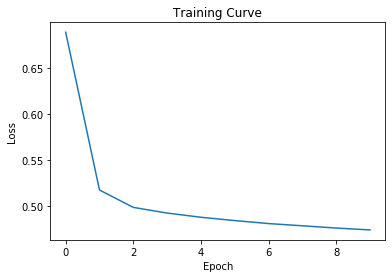

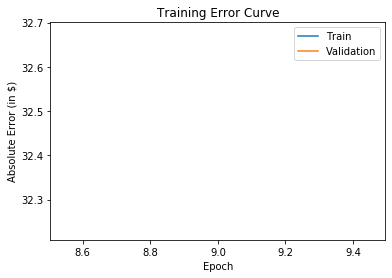

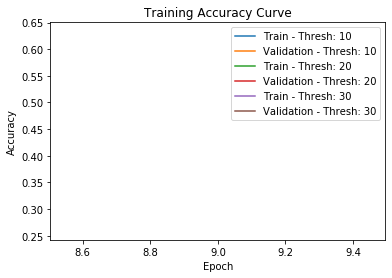

---[ITER 10] loss: 0.467016  time: 0.203
---[ITER 20] loss: 0.479782  time: 0.135
---[ITER 30] loss: 0.463685  time: 0.313
---[ITER 40] loss: 0.464866  time: 0.137
---[ITER 50] loss: 0.474548  time: 0.154
---[ITER 60] loss: 0.472699  time: 0.150
---[ITER 70] loss: 0.467996  time: 0.141
---[ITER 80] loss: 0.466513  time: 0.166
---[ITER 90] loss: 0.481000  time: 0.156
---[ITER 100] loss: 0.471362  time: 0.154
---[ITER 110] loss: 0.479984  time: 0.964
---[ITER 120] loss: 0.469176  time: 0.148
---[ITER 130] loss: 0.469013  time: 0.152
---[ITER 140] loss: 0.475168  time: 0.188
---[ITER 150] loss: 0.468863  time: 0.201
---[ITER 160] loss: 0.473871  time: 0.150
[EPOCH 11] loss: 0.471625  time: 3.661
---[ITER 10] loss: 0.462945  time: 0.232
---[ITER 20] loss: 0.465660  time: 0.241
---[ITER 30] loss: 0.470336  time: 0.336
---[ITER 40] loss: 0.468158  time: 0.158
---[ITER 50] loss: 0.473613  time: 0.191
---[ITER 60] loss: 0.466709  time: 0.154
---[ITER 70] loss: 0.469218  time: 0.192
---[ITER 80

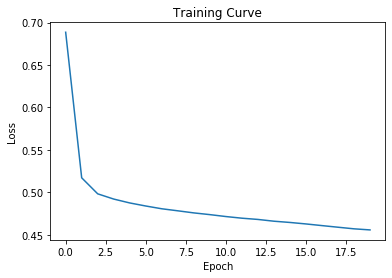

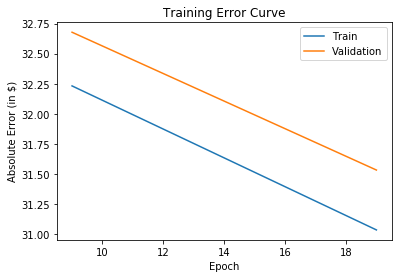

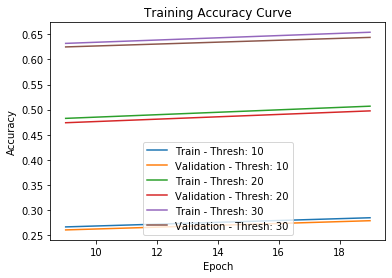

---[ITER 10] loss: 0.453844  time: 0.253
---[ITER 20] loss: 0.458292  time: 0.258
---[ITER 30] loss: 0.455330  time: 0.174
---[ITER 40] loss: 0.461443  time: 0.199
---[ITER 50] loss: 0.454375  time: 0.131
---[ITER 60] loss: 0.443089  time: 0.140
---[ITER 70] loss: 0.458447  time: 0.554
---[ITER 80] loss: 0.449182  time: 0.152
---[ITER 90] loss: 0.453489  time: 0.154
---[ITER 100] loss: 0.453286  time: 0.128
---[ITER 110] loss: 0.453334  time: 0.150
---[ITER 120] loss: 0.460430  time: 0.136
---[ITER 130] loss: 0.458905  time: 0.159
---[ITER 140] loss: 0.454232  time: 0.127
---[ITER 150] loss: 0.456942  time: 0.167
---[ITER 160] loss: 0.452744  time: 0.148
[EPOCH 21] loss: 0.454397  time: 3.153
---[ITER 10] loss: 0.445809  time: 0.193
---[ITER 20] loss: 0.451990  time: 0.255
---[ITER 30] loss: 0.455254  time: 0.155
---[ITER 40] loss: 0.449021  time: 0.247
---[ITER 50] loss: 0.450482  time: 0.404
---[ITER 60] loss: 0.450186  time: 0.129
---[ITER 70] loss: 0.452735  time: 0.128
---[ITER 80

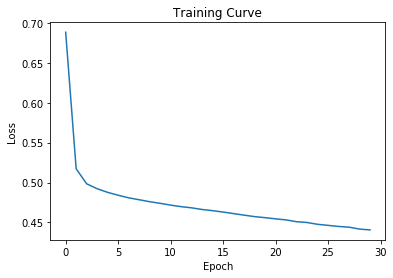

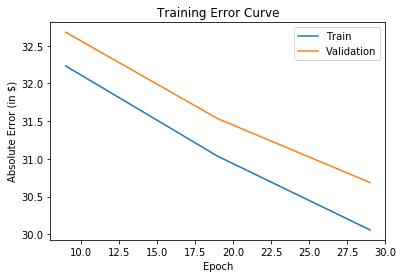

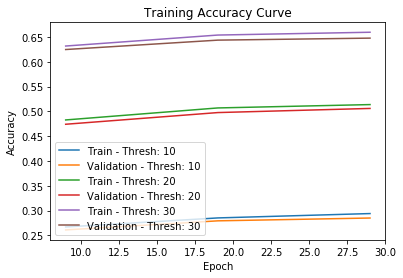

---[ITER 10] loss: 0.442132  time: 0.308
---[ITER 20] loss: 0.437344  time: 0.150
---[ITER 30] loss: 0.438929  time: 0.140
---[ITER 40] loss: 0.439688  time: 0.157
---[ITER 50] loss: 0.443267  time: 0.130
---[ITER 60] loss: 0.437961  time: 0.130
---[ITER 70] loss: 0.439148  time: 0.171
---[ITER 80] loss: 0.447577  time: 0.132
---[ITER 90] loss: 0.433235  time: 0.138
---[ITER 100] loss: 0.440145  time: 0.127
---[ITER 110] loss: 0.430535  time: 0.150
---[ITER 120] loss: 0.443418  time: 0.141
---[ITER 130] loss: 0.439577  time: 0.218
---[ITER 140] loss: 0.438388  time: 0.417
---[ITER 150] loss: 0.442084  time: 0.388
---[ITER 160] loss: 0.436473  time: 0.462
[EPOCH 31] loss: 0.439445  time: 3.569
---[ITER 10] loss: 0.429676  time: 0.287
---[ITER 20] loss: 0.439841  time: 0.224
---[ITER 30] loss: 0.446536  time: 0.133
---[ITER 40] loss: 0.438733  time: 0.155
---[ITER 50] loss: 0.434303  time: 0.147
---[ITER 60] loss: 0.433389  time: 0.142
---[ITER 70] loss: 0.438147  time: 0.164
---[ITER 80

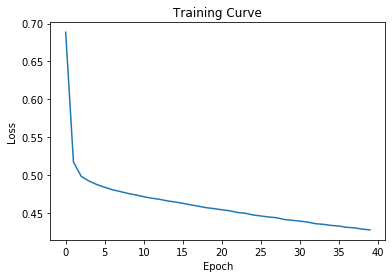

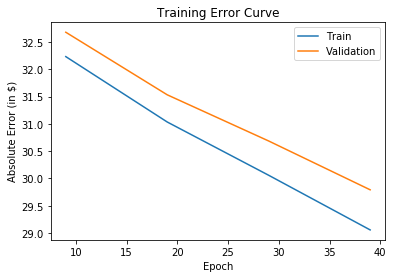

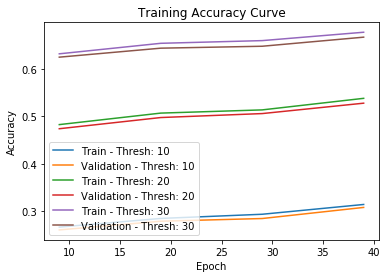

---[ITER 10] loss: 0.427171  time: 0.231
---[ITER 20] loss: 0.435639  time: 0.151
---[ITER 30] loss: 0.424887  time: 0.228
---[ITER 40] loss: 0.427177  time: 0.263
---[ITER 50] loss: 0.428852  time: 0.153
---[ITER 60] loss: 0.422595  time: 0.165
---[ITER 70] loss: 0.434057  time: 0.154
---[ITER 80] loss: 0.424374  time: 0.164
---[ITER 90] loss: 0.427225  time: 0.153
---[ITER 100] loss: 0.420699  time: 0.168
---[ITER 110] loss: 0.423383  time: 0.163
---[ITER 120] loss: 0.427962  time: 0.166
---[ITER 130] loss: 0.418755  time: 0.157
---[ITER 140] loss: 0.425681  time: 0.186
---[ITER 150] loss: 0.432324  time: 0.192
---[ITER 160] loss: 0.428153  time: 0.174
[EPOCH 41] loss: 0.426781  time: 3.005
---[ITER 10] loss: 0.429257  time: 0.239
---[ITER 20] loss: 0.421131  time: 0.143
---[ITER 30] loss: 0.423143  time: 0.220
---[ITER 40] loss: 0.429703  time: 0.571
---[ITER 50] loss: 0.425273  time: 0.548
---[ITER 60] loss: 0.427452  time: 0.501
---[ITER 70] loss: 0.426985  time: 0.324
---[ITER 80

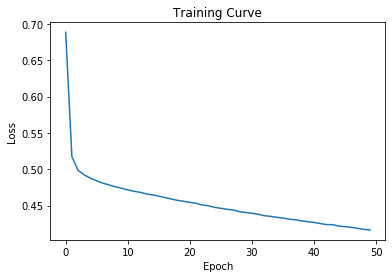

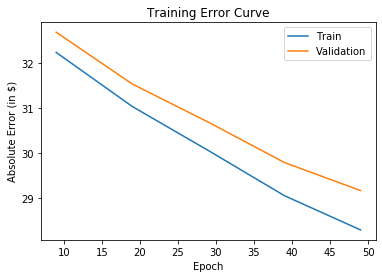

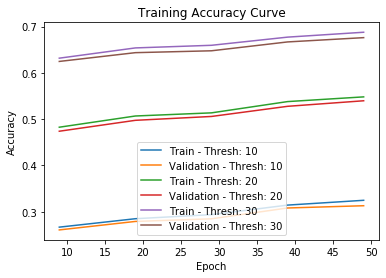

---[ITER 10] loss: 0.416932  time: 0.211
---[ITER 20] loss: 0.415077  time: 0.154
---[ITER 30] loss: 0.414354  time: 0.274
---[ITER 40] loss: 0.425743  time: 0.161
---[ITER 50] loss: 0.421752  time: 0.159
---[ITER 60] loss: 0.411866  time: 0.151
---[ITER 70] loss: 0.410985  time: 0.147
---[ITER 80] loss: 0.418326  time: 0.172
---[ITER 90] loss: 0.410032  time: 0.142
---[ITER 100] loss: 0.409988  time: 0.189
---[ITER 110] loss: 0.414620  time: 0.142
---[ITER 120] loss: 0.406239  time: 0.183
---[ITER 130] loss: 0.414545  time: 0.134
---[ITER 140] loss: 0.417724  time: 0.197
---[ITER 150] loss: 0.419326  time: 0.180
---[ITER 160] loss: 0.413629  time: 0.206
[EPOCH 51] loss: 0.414848  time: 2.946
---[ITER 10] loss: 0.407338  time: 0.255
---[ITER 20] loss: 0.408739  time: 0.162
---[ITER 30] loss: 0.420423  time: 0.257
---[ITER 40] loss: 0.418767  time: 0.169
---[ITER 50] loss: 0.419165  time: 0.169
---[ITER 60] loss: 0.418503  time: 0.165
---[ITER 70] loss: 0.408138  time: 0.154
---[ITER 80

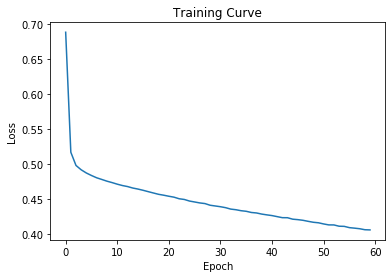

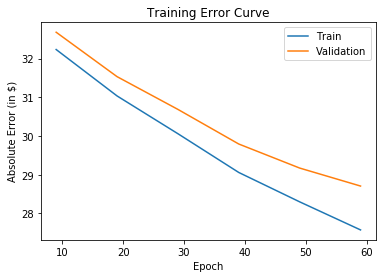

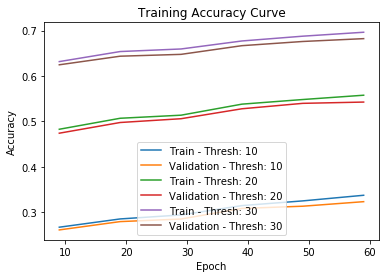

---[ITER 10] loss: 0.404786  time: 0.241
---[ITER 20] loss: 0.400384  time: 0.245
---[ITER 30] loss: 0.399382  time: 0.158
---[ITER 40] loss: 0.408174  time: 0.155
---[ITER 50] loss: 0.403171  time: 0.146
---[ITER 60] loss: 0.401080  time: 0.166
---[ITER 70] loss: 0.398045  time: 0.167
---[ITER 80] loss: 0.404389  time: 0.148
---[ITER 90] loss: 0.415014  time: 0.145
---[ITER 100] loss: 0.411318  time: 0.155
---[ITER 110] loss: 0.409371  time: 0.152
---[ITER 120] loss: 0.402625  time: 0.207
---[ITER 130] loss: 0.408626  time: 0.219
---[ITER 140] loss: 0.402850  time: 0.153
---[ITER 150] loss: 0.407223  time: 0.168
---[ITER 160] loss: 0.406688  time: 0.180
[EPOCH 61] loss: 0.404835  time: 2.933
---[ITER 10] loss: 0.402155  time: 0.243
---[ITER 20] loss: 0.401060  time: 0.264
---[ITER 30] loss: 0.409706  time: 0.154
---[ITER 40] loss: 0.401771  time: 0.153
---[ITER 50] loss: 0.402072  time: 0.153
---[ITER 60] loss: 0.405527  time: 0.173
---[ITER 70] loss: 0.399740  time: 0.167
---[ITER 80

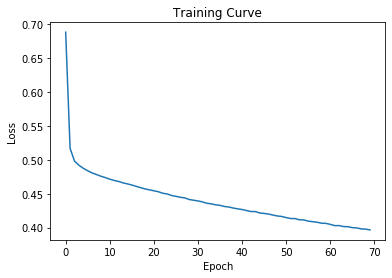

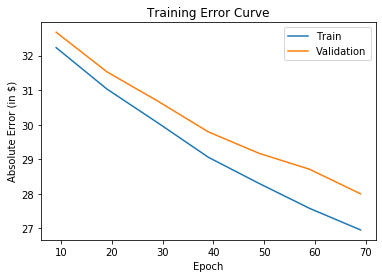

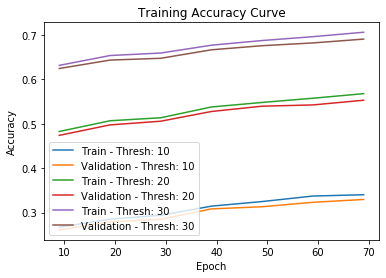

---[ITER 10] loss: 0.396579  time: 0.333
---[ITER 20] loss: 0.398730  time: 0.145
---[ITER 30] loss: 0.400749  time: 0.155
---[ITER 40] loss: 0.395609  time: 0.160
---[ITER 50] loss: 0.392044  time: 0.157
---[ITER 60] loss: 0.392471  time: 0.156
---[ITER 70] loss: 0.394995  time: 0.153
---[ITER 80] loss: 0.399945  time: 0.150
---[ITER 90] loss: 0.393165  time: 0.160
---[ITER 100] loss: 0.399527  time: 0.170
---[ITER 110] loss: 0.390277  time: 0.162
---[ITER 120] loss: 0.390385  time: 0.189
---[ITER 130] loss: 0.393061  time: 0.172
---[ITER 140] loss: 0.395036  time: 0.171
---[ITER 150] loss: 0.390615  time: 0.186
---[ITER 160] loss: 0.397226  time: 0.211
[EPOCH 71] loss: 0.395172  time: 2.958
---[ITER 10] loss: 0.396218  time: 0.425
---[ITER 20] loss: 0.395462  time: 0.175
---[ITER 30] loss: 0.391182  time: 0.172
---[ITER 40] loss: 0.399848  time: 0.151
---[ITER 50] loss: 0.392989  time: 0.161
---[ITER 60] loss: 0.397350  time: 0.152
---[ITER 70] loss: 0.399725  time: 0.158
---[ITER 80

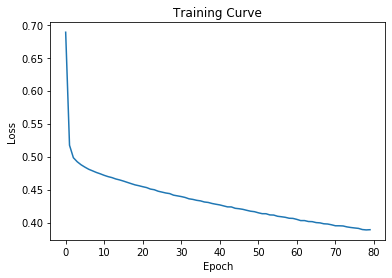

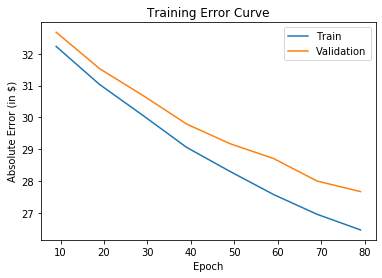

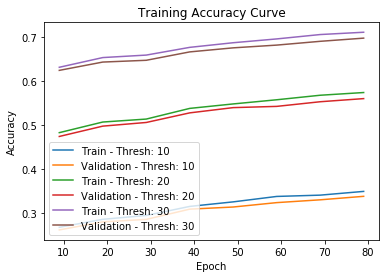

---[ITER 10] loss: 0.386385  time: 0.240
---[ITER 20] loss: 0.382964  time: 0.155
---[ITER 30] loss: 0.388455  time: 0.249
---[ITER 40] loss: 0.382825  time: 0.195
---[ITER 50] loss: 0.396269  time: 0.143
---[ITER 60] loss: 0.389725  time: 0.152
---[ITER 70] loss: 0.385790  time: 0.150
---[ITER 80] loss: 0.387430  time: 0.180
---[ITER 90] loss: 0.390595  time: 0.137
---[ITER 100] loss: 0.379292  time: 0.152
---[ITER 110] loss: 0.398167  time: 0.150
---[ITER 120] loss: 0.387913  time: 0.155
---[ITER 130] loss: 0.388906  time: 0.149
---[ITER 140] loss: 0.384984  time: 0.171
---[ITER 150] loss: 0.389570  time: 0.200
---[ITER 160] loss: 0.391065  time: 0.140
[EPOCH 81] loss: 0.388085  time: 2.856
---[ITER 10] loss: 0.389197  time: 0.231
---[ITER 20] loss: 0.388178  time: 0.147
---[ITER 30] loss: 0.385192  time: 0.254
---[ITER 40] loss: 0.384620  time: 0.152
---[ITER 50] loss: 0.387370  time: 0.157
---[ITER 60] loss: 0.389274  time: 0.142
---[ITER 70] loss: 0.389684  time: 0.163
---[ITER 80

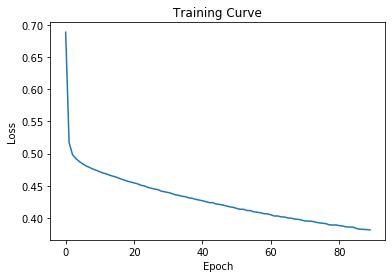

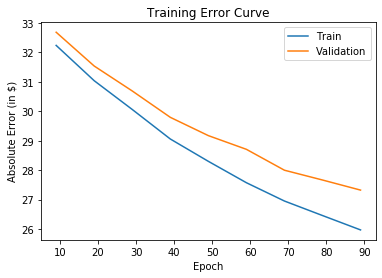

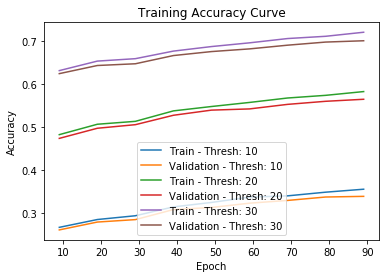

---[ITER 10] loss: 0.381626  time: 0.239
---[ITER 20] loss: 0.385120  time: 0.259
---[ITER 30] loss: 0.380602  time: 0.164
---[ITER 40] loss: 0.374177  time: 0.161
---[ITER 50] loss: 0.380287  time: 0.154
---[ITER 60] loss: 0.381692  time: 0.154
---[ITER 70] loss: 0.375629  time: 0.151
---[ITER 80] loss: 0.380121  time: 0.179
---[ITER 90] loss: 0.386474  time: 0.150
---[ITER 100] loss: 0.378605  time: 0.134
---[ITER 110] loss: 0.375628  time: 0.147
---[ITER 120] loss: 0.375473  time: 0.162
---[ITER 130] loss: 0.379520  time: 0.162
---[ITER 140] loss: 0.387033  time: 0.195
---[ITER 150] loss: 0.385036  time: 0.202
---[ITER 160] loss: 0.377852  time: 0.150
[EPOCH 91] loss: 0.380446  time: 2.899
---[ITER 10] loss: 0.378194  time: 0.220
---[ITER 20] loss: 0.378653  time: 0.260
---[ITER 30] loss: 0.379667  time: 0.136
---[ITER 40] loss: 0.377418  time: 0.154
---[ITER 50] loss: 0.379342  time: 0.164
---[ITER 60] loss: 0.382335  time: 0.152
---[ITER 70] loss: 0.382465  time: 0.132
---[ITER 80

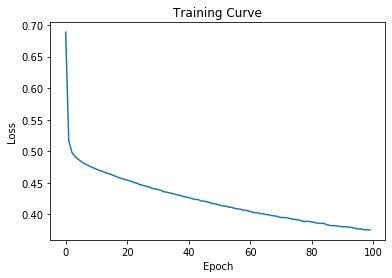

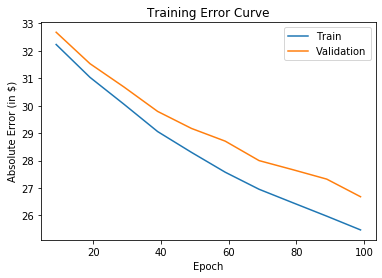

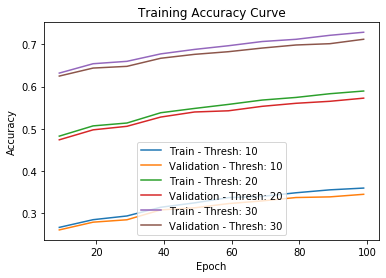

---[ITER 10] loss: 0.366762  time: 0.335
---[ITER 20] loss: 0.370652  time: 0.163
---[ITER 30] loss: 0.370663  time: 0.154
---[ITER 40] loss: 0.370532  time: 0.146
---[ITER 50] loss: 0.374705  time: 0.162
---[ITER 60] loss: 0.376152  time: 0.137
---[ITER 70] loss: 0.377608  time: 0.271
---[ITER 80] loss: 0.380844  time: 0.139
---[ITER 90] loss: 0.370078  time: 0.161
---[ITER 100] loss: 0.383958  time: 0.160
---[ITER 110] loss: 0.375995  time: 0.149
---[ITER 120] loss: 0.381276  time: 0.138
---[ITER 130] loss: 0.377947  time: 0.216
---[ITER 140] loss: 0.372949  time: 0.153
---[ITER 150] loss: 0.371003  time: 0.155
---[ITER 160] loss: 0.372650  time: 0.171
[EPOCH 101] loss: 0.374534  time: 2.940
---[ITER 10] loss: 0.373716  time: 0.340
---[ITER 20] loss: 0.376657  time: 0.169
---[ITER 30] loss: 0.368949  time: 0.151
---[ITER 40] loss: 0.371229  time: 0.154
---[ITER 50] loss: 0.368194  time: 0.159
---[ITER 60] loss: 0.369689  time: 0.157
---[ITER 70] loss: 0.377938  time: 0.159
---[ITER 8

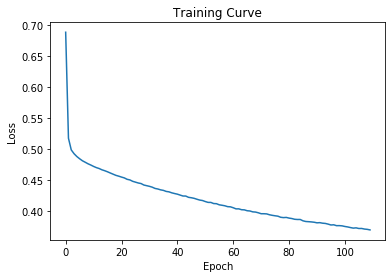

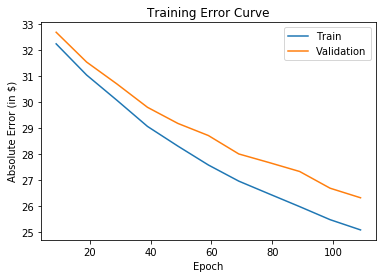

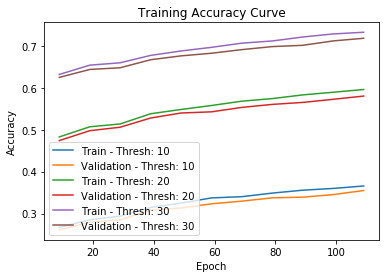

---[ITER 10] loss: 0.373506  time: 0.419
---[ITER 20] loss: 0.366755  time: 0.237
---[ITER 30] loss: 0.369372  time: 0.180
---[ITER 40] loss: 0.374158  time: 0.223
---[ITER 50] loss: 0.367349  time: 0.253
---[ITER 60] loss: 0.367657  time: 0.263
---[ITER 70] loss: 0.374028  time: 0.325
---[ITER 80] loss: 0.367971  time: 0.374
---[ITER 90] loss: 0.366440  time: 0.213
---[ITER 100] loss: 0.370892  time: 0.174
---[ITER 110] loss: 0.364765  time: 0.241
---[ITER 120] loss: 0.358669  time: 0.338
---[ITER 130] loss: 0.370460  time: 0.165
---[ITER 140] loss: 0.366048  time: 0.334
---[ITER 150] loss: 0.364819  time: 0.188
---[ITER 160] loss: 0.365392  time: 0.286
[EPOCH 111] loss: 0.368331  time: 4.359
---[ITER 10] loss: 0.361640  time: 0.484
---[ITER 20] loss: 0.364182  time: 0.262
---[ITER 30] loss: 0.365032  time: 0.214
---[ITER 40] loss: 0.367000  time: 0.234
---[ITER 50] loss: 0.369731  time: 0.211
---[ITER 60] loss: 0.363400  time: 0.162
---[ITER 70] loss: 0.371878  time: 0.237
---[ITER 8

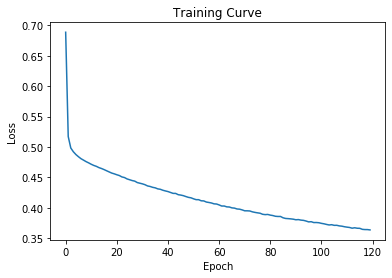

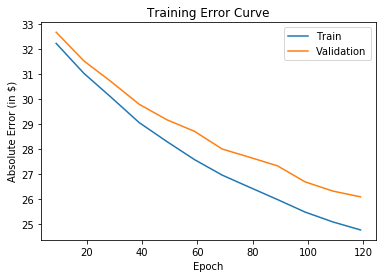

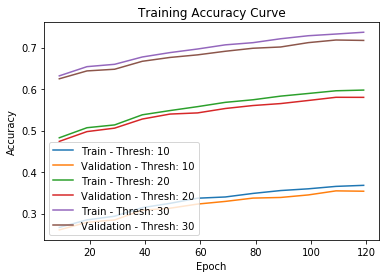

---[ITER 10] loss: 0.354534  time: 0.245
---[ITER 20] loss: 0.363046  time: 0.152
---[ITER 30] loss: 0.361558  time: 0.266
---[ITER 40] loss: 0.367618  time: 0.164
---[ITER 50] loss: 0.359028  time: 0.155
---[ITER 60] loss: 0.358359  time: 0.174
---[ITER 70] loss: 0.363888  time: 0.174
---[ITER 80] loss: 0.361868  time: 0.141
---[ITER 90] loss: 0.363167  time: 0.166
---[ITER 100] loss: 0.358379  time: 0.167
---[ITER 110] loss: 0.365189  time: 0.217
---[ITER 120] loss: 0.358143  time: 0.160
---[ITER 130] loss: 0.362907  time: 0.166
---[ITER 140] loss: 0.362145  time: 0.196
---[ITER 150] loss: 0.365012  time: 0.163
---[ITER 160] loss: 0.370071  time: 0.164
[EPOCH 121] loss: 0.362674  time: 3.024
---[ITER 10] loss: 0.361010  time: 0.231
---[ITER 20] loss: 0.364182  time: 0.207
---[ITER 30] loss: 0.369349  time: 0.274
---[ITER 40] loss: 0.362768  time: 0.192
---[ITER 50] loss: 0.363911  time: 0.434
---[ITER 60] loss: 0.365418  time: 0.194
---[ITER 70] loss: 0.362047  time: 0.166
---[ITER 8

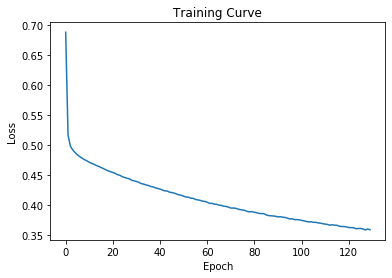

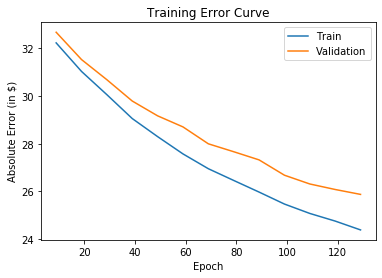

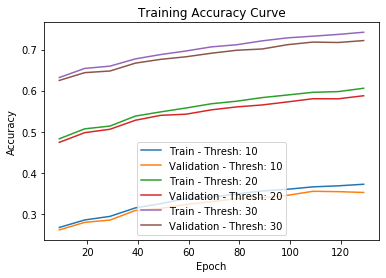

---[ITER 10] loss: 0.360085  time: 0.428
---[ITER 20] loss: 0.350454  time: 0.300
---[ITER 30] loss: 0.360410  time: 0.192
---[ITER 40] loss: 0.354870  time: 0.178
---[ITER 50] loss: 0.357982  time: 0.327
---[ITER 60] loss: 0.356948  time: 1.372
---[ITER 70] loss: 0.363055  time: 0.398
---[ITER 80] loss: 0.355167  time: 0.168
---[ITER 90] loss: 0.357609  time: 0.205
---[ITER 100] loss: 0.360608  time: 0.159
---[ITER 110] loss: 0.362009  time: 0.170
---[ITER 120] loss: 0.357507  time: 0.228
---[ITER 130] loss: 0.358472  time: 0.185
---[ITER 140] loss: 0.366435  time: 0.167
---[ITER 150] loss: 0.358350  time: 0.169
---[ITER 160] loss: 0.356466  time: 0.189
[EPOCH 131] loss: 0.358498  time: 4.999
---[ITER 10] loss: 0.358077  time: 0.244
---[ITER 20] loss: 0.361217  time: 0.289
---[ITER 30] loss: 0.362786  time: 0.219
---[ITER 40] loss: 0.355368  time: 0.176
---[ITER 50] loss: 0.359782  time: 0.164
---[ITER 60] loss: 0.362286  time: 0.172
---[ITER 70] loss: 0.356757  time: 0.175
---[ITER 8

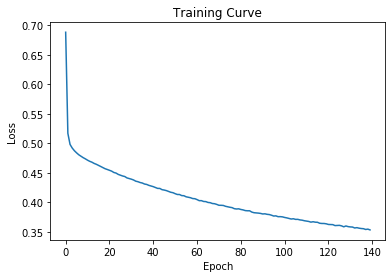

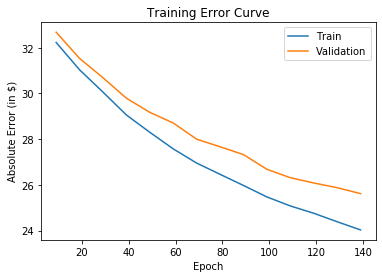

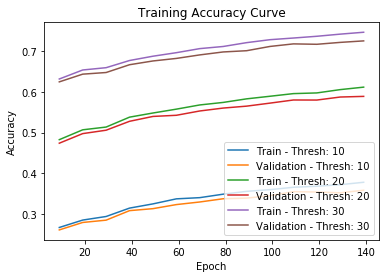

---[ITER 10] loss: 0.355598  time: 0.487
---[ITER 20] loss: 0.351770  time: 0.212
---[ITER 30] loss: 0.350978  time: 0.165
---[ITER 40] loss: 0.357824  time: 0.155
---[ITER 50] loss: 0.353282  time: 0.308
---[ITER 60] loss: 0.351724  time: 0.247
---[ITER 70] loss: 0.353935  time: 0.283
---[ITER 80] loss: 0.350369  time: 0.164
---[ITER 90] loss: 0.353473  time: 0.170
---[ITER 100] loss: 0.352285  time: 0.198
---[ITER 110] loss: 0.352234  time: 0.226
---[ITER 120] loss: 0.352535  time: 0.168
---[ITER 130] loss: 0.355979  time: 0.223
---[ITER 140] loss: 0.358458  time: 0.173
---[ITER 150] loss: 0.355374  time: 0.185
---[ITER 160] loss: 0.350382  time: 0.370
[EPOCH 141] loss: 0.353264  time: 4.000
---[ITER 10] loss: 0.355220  time: 0.600
---[ITER 20] loss: 0.347759  time: 0.304
---[ITER 30] loss: 0.345652  time: 0.237
---[ITER 40] loss: 0.352190  time: 0.377
---[ITER 50] loss: 0.358729  time: 0.420
---[ITER 60] loss: 0.351596  time: 0.444
---[ITER 70] loss: 0.357286  time: 0.224
---[ITER 8

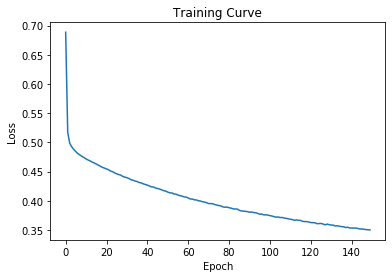

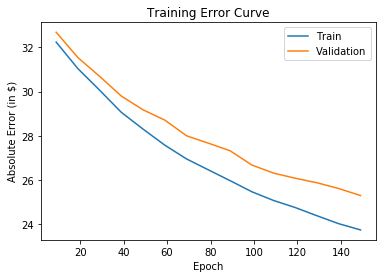

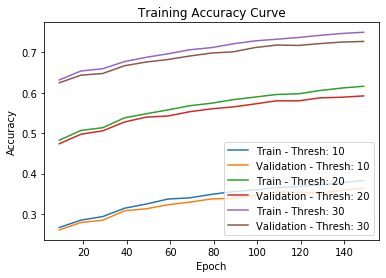

---[ITER 10] loss: 0.353592  time: 0.310
---[ITER 20] loss: 0.347864  time: 0.165
---[ITER 30] loss: 0.348468  time: 0.194
---[ITER 40] loss: 0.351630  time: 0.262
---[ITER 50] loss: 0.340946  time: 0.197
---[ITER 60] loss: 0.344596  time: 0.252
---[ITER 70] loss: 0.349045  time: 0.173
---[ITER 80] loss: 0.352137  time: 0.150
---[ITER 90] loss: 0.350923  time: 0.158
---[ITER 100] loss: 0.350109  time: 0.152
---[ITER 110] loss: 0.351325  time: 0.165
---[ITER 120] loss: 0.350059  time: 0.178
---[ITER 130] loss: 0.349101  time: 0.174
---[ITER 140] loss: 0.349693  time: 0.188
---[ITER 150] loss: 0.352955  time: 0.199
---[ITER 160] loss: 0.350160  time: 0.173
[EPOCH 151] loss: 0.349383  time: 3.256
---[ITER 10] loss: 0.347818  time: 0.265
---[ITER 20] loss: 0.349662  time: 0.143
---[ITER 30] loss: 0.349768  time: 0.164
---[ITER 40] loss: 0.347099  time: 0.278
---[ITER 50] loss: 0.341249  time: 0.150
---[ITER 60] loss: 0.351080  time: 0.163
---[ITER 70] loss: 0.350442  time: 0.185
---[ITER 8

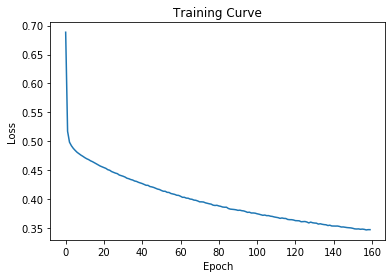

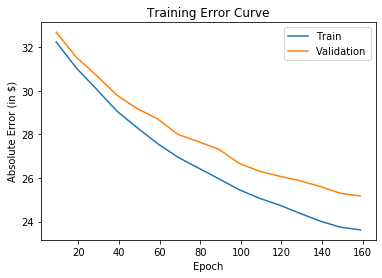

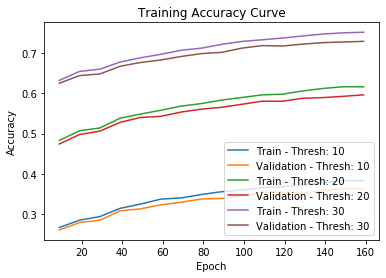

---[ITER 10] loss: 0.342145  time: 0.240
---[ITER 20] loss: 0.345803  time: 0.183
---[ITER 30] loss: 0.354742  time: 0.271
---[ITER 40] loss: 0.349462  time: 0.168
---[ITER 50] loss: 0.344913  time: 0.180
---[ITER 60] loss: 0.354124  time: 0.142
---[ITER 70] loss: 0.348811  time: 0.157
---[ITER 80] loss: 0.350181  time: 0.143
---[ITER 90] loss: 0.341774  time: 0.166
---[ITER 100] loss: 0.340847  time: 0.155
---[ITER 110] loss: 0.343201  time: 0.148
---[ITER 120] loss: 0.347608  time: 0.154
---[ITER 130] loss: 0.343815  time: 0.150
---[ITER 140] loss: 0.342625  time: 0.193
---[ITER 150] loss: 0.349742  time: 0.157
---[ITER 160] loss: 0.341309  time: 0.164
[EPOCH 161] loss: 0.346235  time: 2.908
---[ITER 10] loss: 0.346552  time: 0.232
---[ITER 20] loss: 0.349768  time: 0.150
---[ITER 30] loss: 0.348807  time: 0.260
---[ITER 40] loss: 0.343385  time: 0.163
---[ITER 50] loss: 0.347152  time: 0.163
---[ITER 60] loss: 0.345092  time: 0.157
---[ITER 70] loss: 0.349635  time: 0.157
---[ITER 8

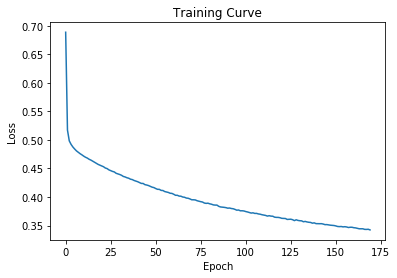

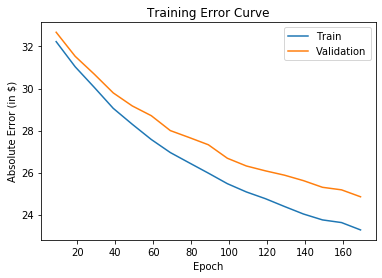

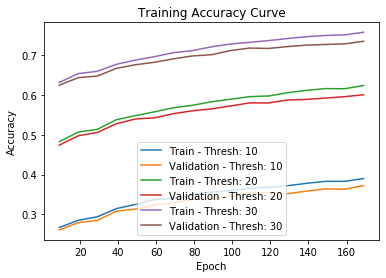

---[ITER 10] loss: 0.345008  time: 0.212
---[ITER 20] loss: 0.334544  time: 0.251
---[ITER 30] loss: 0.349275  time: 0.165
---[ITER 40] loss: 0.343064  time: 0.147
---[ITER 50] loss: 0.346234  time: 0.145
---[ITER 60] loss: 0.341196  time: 0.146
---[ITER 70] loss: 0.341301  time: 0.178
---[ITER 80] loss: 0.338714  time: 0.183
---[ITER 90] loss: 0.344575  time: 0.184
---[ITER 100] loss: 0.341392  time: 0.173
---[ITER 110] loss: 0.336772  time: 0.154
---[ITER 120] loss: 0.342075  time: 0.159
---[ITER 130] loss: 0.344594  time: 0.225
---[ITER 140] loss: 0.342385  time: 0.167
---[ITER 150] loss: 0.343944  time: 0.177
---[ITER 160] loss: 0.343040  time: 0.160
[EPOCH 171] loss: 0.342121  time: 2.977
---[ITER 10] loss: 0.332533  time: 0.221
---[ITER 20] loss: 0.341569  time: 0.272
---[ITER 30] loss: 0.349684  time: 0.201
---[ITER 40] loss: 0.344255  time: 0.151
---[ITER 50] loss: 0.338227  time: 0.179
---[ITER 60] loss: 0.340732  time: 0.182
---[ITER 70] loss: 0.346946  time: 0.177
---[ITER 8

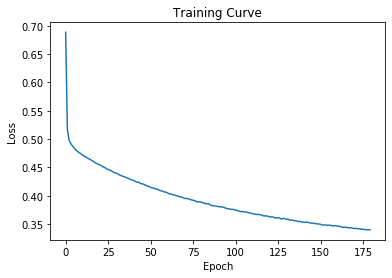

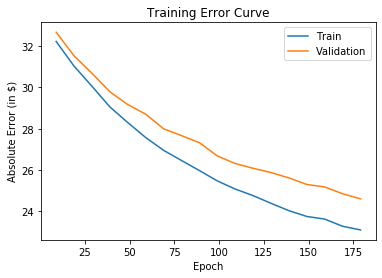

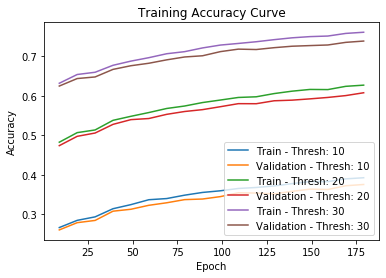

---[ITER 10] loss: 0.340512  time: 0.425
---[ITER 20] loss: 0.340393  time: 0.251
---[ITER 30] loss: 0.337481  time: 0.147
---[ITER 40] loss: 0.339788  time: 0.171
---[ITER 50] loss: 0.340235  time: 0.155
---[ITER 60] loss: 0.334546  time: 0.154
---[ITER 70] loss: 0.338779  time: 0.141
---[ITER 80] loss: 0.339181  time: 0.145
---[ITER 90] loss: 0.340370  time: 0.147
---[ITER 100] loss: 0.341361  time: 0.140
---[ITER 110] loss: 0.344236  time: 0.139
---[ITER 120] loss: 0.347313  time: 0.180
---[ITER 130] loss: 0.340696  time: 0.140
---[ITER 140] loss: 0.336431  time: 0.180
---[ITER 150] loss: 0.333675  time: 0.166
---[ITER 160] loss: 0.340818  time: 0.163
[EPOCH 181] loss: 0.339692  time: 2.975
---[ITER 10] loss: 0.332934  time: 0.341
---[ITER 20] loss: 0.337067  time: 0.198
---[ITER 30] loss: 0.337751  time: 0.315
---[ITER 40] loss: 0.342126  time: 0.185
---[ITER 50] loss: 0.344979  time: 0.179
---[ITER 60] loss: 0.339564  time: 0.170
---[ITER 70] loss: 0.338092  time: 0.199
---[ITER 8

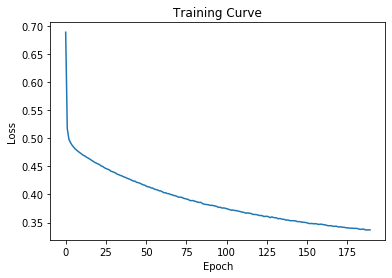

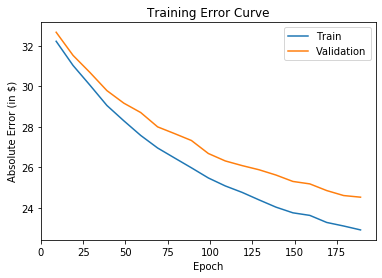

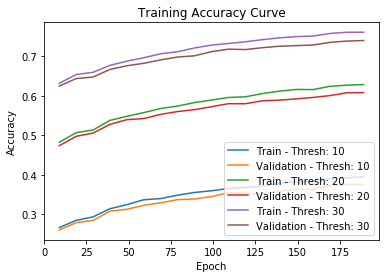

---[ITER 10] loss: 0.333108  time: 0.594
---[ITER 20] loss: 0.335935  time: 0.244
---[ITER 30] loss: 0.341798  time: 0.482
---[ITER 40] loss: 0.340169  time: 0.967
---[ITER 50] loss: 0.340288  time: 0.351
---[ITER 60] loss: 0.333857  time: 0.330
---[ITER 70] loss: 0.337899  time: 0.246
---[ITER 80] loss: 0.338379  time: 0.248
---[ITER 90] loss: 0.327452  time: 0.241
---[ITER 100] loss: 0.331962  time: 0.280
---[ITER 110] loss: 0.337802  time: 0.145
---[ITER 120] loss: 0.336957  time: 0.249
---[ITER 130] loss: 0.337474  time: 0.218
---[ITER 140] loss: 0.342821  time: 0.184
---[ITER 150] loss: 0.335335  time: 0.334
---[ITER 160] loss: 0.337902  time: 0.197
[EPOCH 191] loss: 0.336852  time: 5.609
---[ITER 10] loss: 0.338117  time: 0.311
---[ITER 20] loss: 0.342367  time: 0.176
---[ITER 30] loss: 0.330961  time: 0.310
---[ITER 40] loss: 0.330786  time: 0.188
---[ITER 50] loss: 0.339023  time: 0.234
---[ITER 60] loss: 0.330372  time: 0.227
---[ITER 70] loss: 0.335753  time: 0.195
---[ITER 8

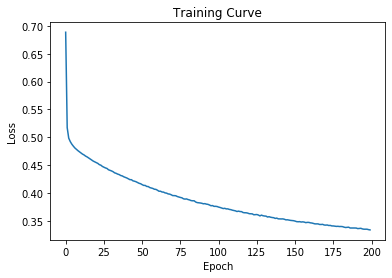

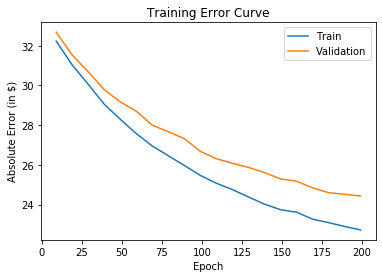

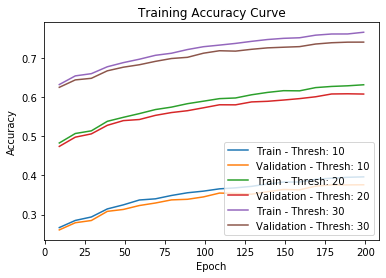

---[ITER 10] loss: 0.334836  time: 0.217
---[ITER 20] loss: 0.337442  time: 0.281
---[ITER 30] loss: 0.332956  time: 0.142
---[ITER 40] loss: 0.335711  time: 0.167
---[ITER 50] loss: 0.336938  time: 0.144
---[ITER 60] loss: 0.332238  time: 0.163
---[ITER 70] loss: 0.330491  time: 0.149
---[ITER 80] loss: 0.329468  time: 0.144
---[ITER 90] loss: 0.336447  time: 0.149
---[ITER 100] loss: 0.333104  time: 0.144
---[ITER 110] loss: 0.338512  time: 0.199
---[ITER 120] loss: 0.333818  time: 0.145
---[ITER 130] loss: 0.323662  time: 0.183
---[ITER 140] loss: 0.340543  time: 0.155
---[ITER 150] loss: 0.340515  time: 0.153
---[ITER 160] loss: 0.340073  time: 0.161
[EPOCH 201] loss: 0.334713  time: 2.883
---[ITER 10] loss: 0.339168  time: 0.257
---[ITER 20] loss: 0.331398  time: 0.239
---[ITER 30] loss: 0.333471  time: 0.159
---[ITER 40] loss: 0.325384  time: 0.156
---[ITER 50] loss: 0.329587  time: 0.176
---[ITER 60] loss: 0.340430  time: 0.159
---[ITER 70] loss: 0.331220  time: 0.152
---[ITER 8

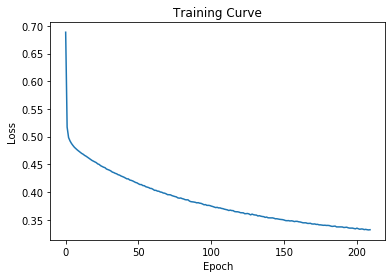

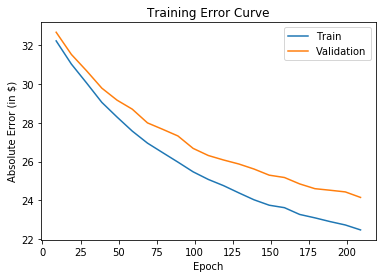

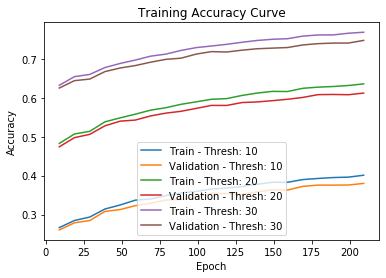

---[ITER 10] loss: 0.327280  time: 0.378
---[ITER 20] loss: 0.331533  time: 0.151
---[ITER 30] loss: 0.331390  time: 0.250
---[ITER 40] loss: 0.332220  time: 0.146
---[ITER 50] loss: 0.327787  time: 0.211
---[ITER 60] loss: 0.328476  time: 0.156
---[ITER 70] loss: 0.331934  time: 0.245
---[ITER 80] loss: 0.327378  time: 0.197
---[ITER 90] loss: 0.331824  time: 0.273
---[ITER 100] loss: 0.334952  time: 0.241
---[ITER 110] loss: 0.335313  time: 0.237
---[ITER 120] loss: 0.325267  time: 0.196
---[ITER 130] loss: 0.328840  time: 0.205
---[ITER 140] loss: 0.333224  time: 0.208
---[ITER 150] loss: 0.333857  time: 0.192
---[ITER 160] loss: 0.339743  time: 0.166
[EPOCH 211] loss: 0.331556  time: 3.604
---[ITER 10] loss: 0.330161  time: 0.413
---[ITER 20] loss: 0.331860  time: 0.159
---[ITER 30] loss: 0.326639  time: 0.152
---[ITER 40] loss: 0.331803  time: 0.177
---[ITER 50] loss: 0.331987  time: 0.154
---[ITER 60] loss: 0.333557  time: 0.232
---[ITER 70] loss: 0.330071  time: 0.184
---[ITER 8

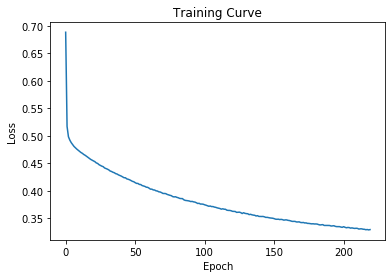

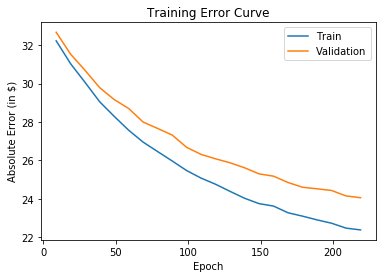

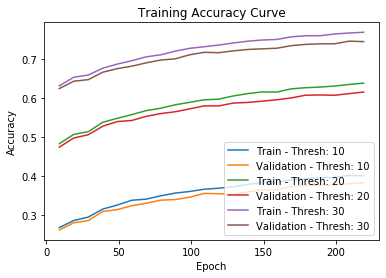

---[ITER 10] loss: 0.330534  time: 0.479
---[ITER 20] loss: 0.327147  time: 0.232
---[ITER 30] loss: 0.326891  time: 0.196
---[ITER 40] loss: 0.325162  time: 0.183
---[ITER 50] loss: 0.330755  time: 0.177
---[ITER 60] loss: 0.330410  time: 0.175
---[ITER 70] loss: 0.326580  time: 0.155
---[ITER 80] loss: 0.327732  time: 0.429
---[ITER 90] loss: 0.330876  time: 0.524
---[ITER 100] loss: 0.333622  time: 0.184
---[ITER 110] loss: 0.329706  time: 0.454
---[ITER 120] loss: 0.331342  time: 0.216
---[ITER 130] loss: 0.331709  time: 0.150
---[ITER 140] loss: 0.335129  time: 0.192
---[ITER 150] loss: 0.327935  time: 0.511
---[ITER 160] loss: 0.325774  time: 0.772
[EPOCH 221] loss: 0.328938  time: 5.517
---[ITER 10] loss: 0.326809  time: 0.386
---[ITER 20] loss: 0.326967  time: 0.219
---[ITER 30] loss: 0.329322  time: 0.436
---[ITER 40] loss: 0.327710  time: 0.415
---[ITER 50] loss: 0.325331  time: 0.210
---[ITER 60] loss: 0.324984  time: 0.156
---[ITER 70] loss: 0.331556  time: 0.171
---[ITER 8

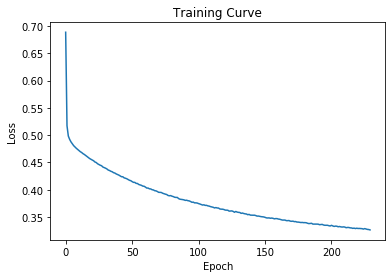

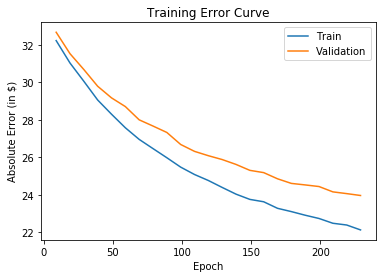

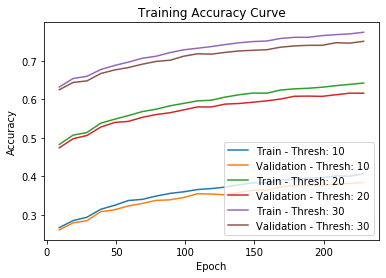

---[ITER 10] loss: 0.324416  time: 0.332
---[ITER 20] loss: 0.325099  time: 0.169
---[ITER 30] loss: 0.327756  time: 0.313
---[ITER 40] loss: 0.321690  time: 0.205
---[ITER 50] loss: 0.325531  time: 0.174
---[ITER 60] loss: 0.328863  time: 0.204
---[ITER 70] loss: 0.333763  time: 0.189
---[ITER 80] loss: 0.330955  time: 0.188
---[ITER 90] loss: 0.323366  time: 0.203
---[ITER 100] loss: 0.331158  time: 0.198
---[ITER 110] loss: 0.325314  time: 0.209
---[ITER 120] loss: 0.322546  time: 0.169
---[ITER 130] loss: 0.332324  time: 0.186
---[ITER 140] loss: 0.324034  time: 0.234
---[ITER 150] loss: 0.327909  time: 0.207
---[ITER 160] loss: 0.324962  time: 0.288
[EPOCH 231] loss: 0.327170  time: 3.646
---[ITER 10] loss: 0.327161  time: 0.301
---[ITER 20] loss: 0.322058  time: 0.181
---[ITER 30] loss: 0.330064  time: 0.428
---[ITER 40] loss: 0.324409  time: 0.164
---[ITER 50] loss: 0.329961  time: 0.528
---[ITER 60] loss: 0.327705  time: 0.186
---[ITER 70] loss: 0.324519  time: 0.166
---[ITER 8

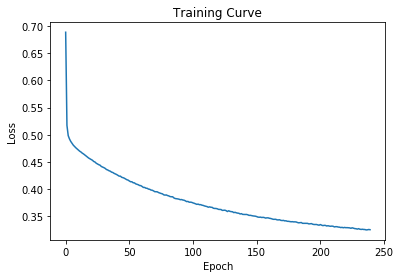

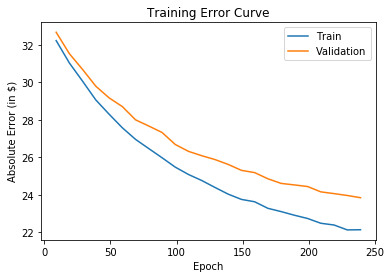

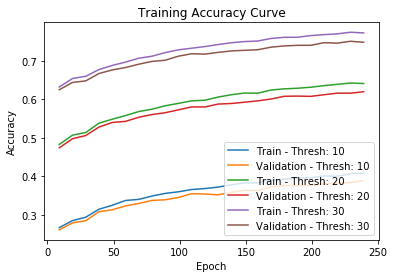

---[ITER 10] loss: 0.317593  time: 0.322
---[ITER 20] loss: 0.329247  time: 0.351
---[ITER 30] loss: 0.322820  time: 0.248
---[ITER 40] loss: 0.323426  time: 0.251
---[ITER 50] loss: 0.323205  time: 0.182
---[ITER 60] loss: 0.323213  time: 0.322
---[ITER 70] loss: 0.323389  time: 0.214
---[ITER 80] loss: 0.324809  time: 0.264
---[ITER 90] loss: 0.324652  time: 0.439
---[ITER 100] loss: 0.324415  time: 0.330
---[ITER 110] loss: 0.323008  time: 0.311
---[ITER 120] loss: 0.325679  time: 0.293
---[ITER 130] loss: 0.323815  time: 0.228
---[ITER 140] loss: 0.324443  time: 0.341
---[ITER 150] loss: 0.325941  time: 0.257
---[ITER 160] loss: 0.317408  time: 0.380
[EPOCH 241] loss: 0.323338  time: 4.899
---[ITER 10] loss: 0.330775  time: 0.464
---[ITER 20] loss: 0.323084  time: 0.523
---[ITER 30] loss: 0.323478  time: 0.212
---[ITER 40] loss: 0.320416  time: 0.421
---[ITER 50] loss: 0.322050  time: 0.278
---[ITER 60] loss: 0.323888  time: 0.198
---[ITER 70] loss: 0.333636  time: 0.267
---[ITER 8

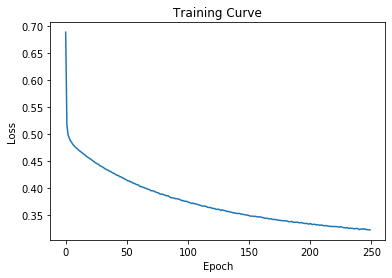

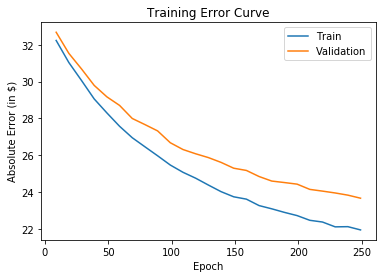

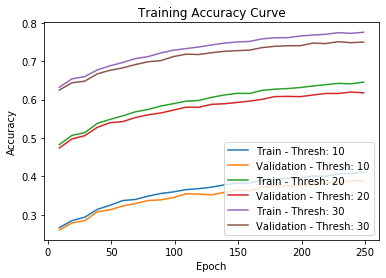

---[ITER 10] loss: 0.324668  time: 0.534
---[ITER 20] loss: 0.325641  time: 0.211
---[ITER 30] loss: 0.316771  time: 0.227
---[ITER 40] loss: 0.320025  time: 0.383
---[ITER 50] loss: 0.324390  time: 0.191
---[ITER 60] loss: 0.318417  time: 0.262
---[ITER 70] loss: 0.326774  time: 0.241
---[ITER 80] loss: 0.322828  time: 0.276
---[ITER 90] loss: 0.328183  time: 0.202
---[ITER 100] loss: 0.324239  time: 0.273
---[ITER 110] loss: 0.318445  time: 0.217
---[ITER 120] loss: 0.319554  time: 0.220
---[ITER 130] loss: 0.323937  time: 0.354
---[ITER 140] loss: 0.322300  time: 0.239
---[ITER 150] loss: 0.323669  time: 0.266
---[ITER 160] loss: 0.316284  time: 0.197
[EPOCH 251] loss: 0.322104  time: 4.434
---[ITER 10] loss: 0.322575  time: 0.398
---[ITER 20] loss: 0.330213  time: 0.255
---[ITER 30] loss: 0.319838  time: 0.209
---[ITER 40] loss: 0.315290  time: 0.234
---[ITER 50] loss: 0.317681  time: 0.190
---[ITER 60] loss: 0.319552  time: 0.163
---[ITER 70] loss: 0.330027  time: 0.178
---[ITER 8

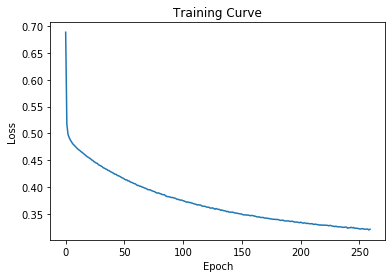

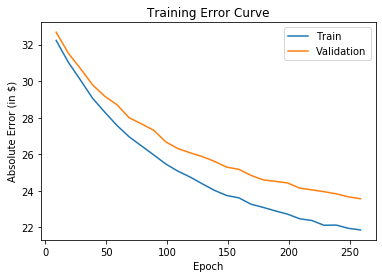

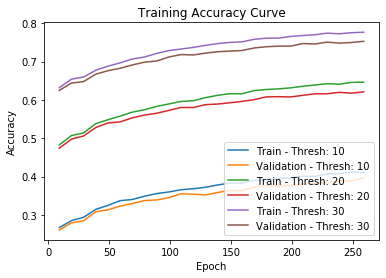

---[ITER 10] loss: 0.316409  time: 0.273
---[ITER 20] loss: 0.318124  time: 0.175
---[ITER 30] loss: 0.318855  time: 0.153
---[ITER 40] loss: 0.319349  time: 0.266
---[ITER 50] loss: 0.317830  time: 0.153
---[ITER 60] loss: 0.323569  time: 0.165
---[ITER 70] loss: 0.326346  time: 0.167
---[ITER 80] loss: 0.322363  time: 0.190
---[ITER 90] loss: 0.316682  time: 0.160
---[ITER 100] loss: 0.320137  time: 0.161
---[ITER 110] loss: 0.319621  time: 0.169
---[ITER 120] loss: 0.326241  time: 0.160
---[ITER 130] loss: 0.327074  time: 0.167
---[ITER 140] loss: 0.316868  time: 0.197
---[ITER 150] loss: 0.321513  time: 0.206
---[ITER 160] loss: 0.319333  time: 0.163
[EPOCH 261] loss: 0.320599  time: 3.070
---[ITER 10] loss: 0.319408  time: 0.227
---[ITER 20] loss: 0.318273  time: 0.200
---[ITER 30] loss: 0.316449  time: 0.138
---[ITER 40] loss: 0.313589  time: 0.283
---[ITER 50] loss: 0.321193  time: 0.148
---[ITER 60] loss: 0.321504  time: 0.171
---[ITER 70] loss: 0.314812  time: 0.178
---[ITER 8

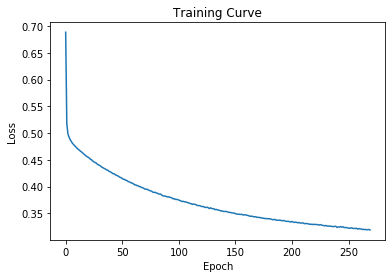

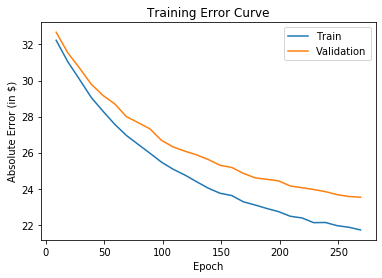

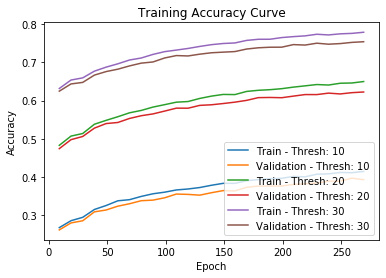

---[ITER 10] loss: 0.321123  time: 0.244
---[ITER 20] loss: 0.317666  time: 0.145
---[ITER 30] loss: 0.317521  time: 0.274
---[ITER 40] loss: 0.316051  time: 0.187
---[ITER 50] loss: 0.313187  time: 0.149
---[ITER 60] loss: 0.314767  time: 0.155
---[ITER 70] loss: 0.321213  time: 0.180
---[ITER 80] loss: 0.319086  time: 0.160
---[ITER 90] loss: 0.322586  time: 0.173
---[ITER 100] loss: 0.318958  time: 0.168
---[ITER 110] loss: 0.317272  time: 0.153
---[ITER 120] loss: 0.314569  time: 0.158
---[ITER 130] loss: 0.315752  time: 0.164
---[ITER 140] loss: 0.323012  time: 0.195
---[ITER 150] loss: 0.320918  time: 0.166
---[ITER 160] loss: 0.320195  time: 0.188
[EPOCH 271] loss: 0.318641  time: 2.981
---[ITER 10] loss: 0.315095  time: 0.247
---[ITER 20] loss: 0.317360  time: 0.154
---[ITER 30] loss: 0.318152  time: 0.273
---[ITER 40] loss: 0.316910  time: 0.201
---[ITER 50] loss: 0.310701  time: 0.142
---[ITER 60] loss: 0.320105  time: 0.162
---[ITER 70] loss: 0.318086  time: 0.160
---[ITER 8

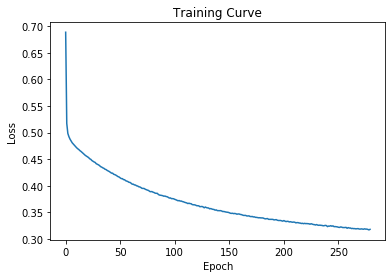

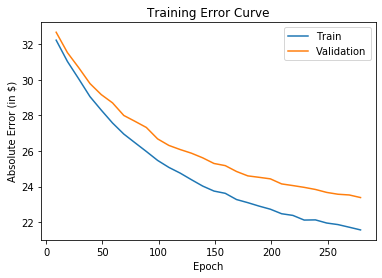

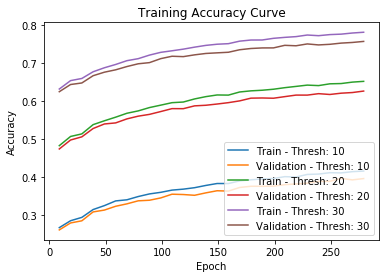

---[ITER 10] loss: 0.313164  time: 0.252
---[ITER 20] loss: 0.322735  time: 0.277
---[ITER 30] loss: 0.312071  time: 0.174
---[ITER 40] loss: 0.319496  time: 0.178
---[ITER 50] loss: 0.316785  time: 0.160
---[ITER 60] loss: 0.322675  time: 0.183
---[ITER 70] loss: 0.315479  time: 0.153
---[ITER 80] loss: 0.319186  time: 0.157
---[ITER 90] loss: 0.318362  time: 0.196
---[ITER 100] loss: 0.314032  time: 0.173
---[ITER 110] loss: 0.311591  time: 0.154
---[ITER 120] loss: 0.317309  time: 0.155
---[ITER 130] loss: 0.322714  time: 0.222
---[ITER 140] loss: 0.320249  time: 0.194
---[ITER 150] loss: 0.317119  time: 0.173
---[ITER 160] loss: 0.318857  time: 0.159
[EPOCH 281] loss: 0.317762  time: 3.099
---[ITER 10] loss: 0.319253  time: 0.246
---[ITER 20] loss: 0.317793  time: 0.275
---[ITER 30] loss: 0.318648  time: 0.164
---[ITER 40] loss: 0.321319  time: 0.164
---[ITER 50] loss: 0.312559  time: 0.161
---[ITER 60] loss: 0.309339  time: 0.169
---[ITER 70] loss: 0.318262  time: 0.180
---[ITER 8

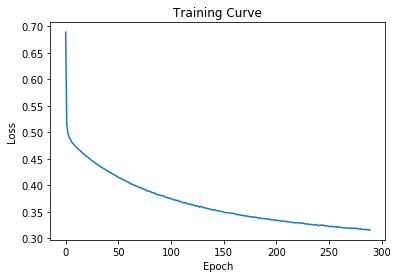

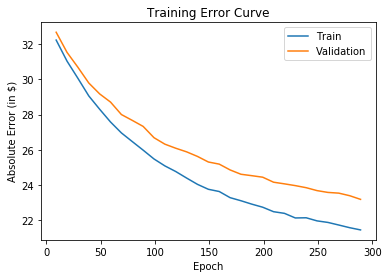

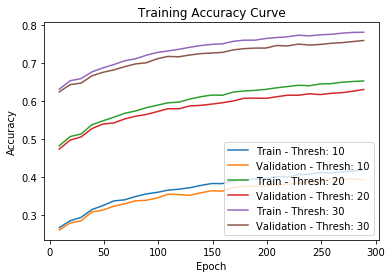

---[ITER 10] loss: 0.318976  time: 0.361
---[ITER 20] loss: 0.321049  time: 0.172
---[ITER 30] loss: 0.312422  time: 0.151
---[ITER 40] loss: 0.313500  time: 0.171
---[ITER 50] loss: 0.311170  time: 0.163
---[ITER 60] loss: 0.308394  time: 0.158
---[ITER 70] loss: 0.315592  time: 0.167
---[ITER 80] loss: 0.316749  time: 0.165
---[ITER 90] loss: 0.312623  time: 0.157
---[ITER 100] loss: 0.320097  time: 0.183
---[ITER 110] loss: 0.316929  time: 0.183
---[ITER 120] loss: 0.312621  time: 0.186
---[ITER 130] loss: 0.319731  time: 0.168
---[ITER 140] loss: 0.321625  time: 0.164
---[ITER 150] loss: 0.318257  time: 0.171
---[ITER 160] loss: 0.315800  time: 0.163
[EPOCH 291] loss: 0.316051  time: 3.040
---[ITER 10] loss: 0.313926  time: 0.366
---[ITER 20] loss: 0.310589  time: 0.185
---[ITER 30] loss: 0.318461  time: 0.156
---[ITER 40] loss: 0.312819  time: 0.178
---[ITER 50] loss: 0.314172  time: 0.157
---[ITER 60] loss: 0.315180  time: 0.159
---[ITER 70] loss: 0.319228  time: 0.177
---[ITER 8

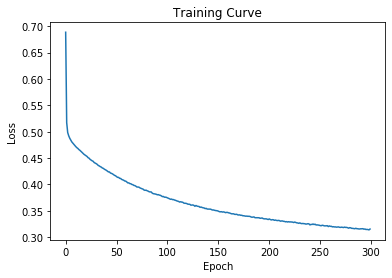

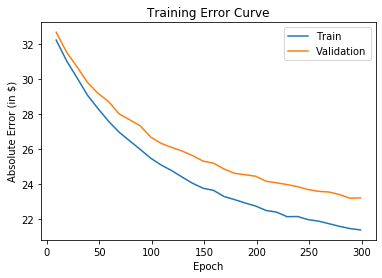

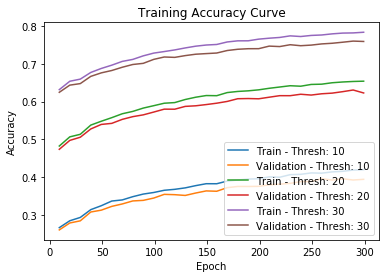

---[ITER 10] loss: 0.318798  time: 0.329
---[ITER 20] loss: 0.314499  time: 0.164
---[ITER 30] loss: 0.311282  time: 0.290
---[ITER 40] loss: 0.309589  time: 0.169
---[ITER 50] loss: 0.316969  time: 0.159
---[ITER 60] loss: 0.313506  time: 0.179
---[ITER 70] loss: 0.309375  time: 0.166
---[ITER 80] loss: 0.318459  time: 0.225
---[ITER 90] loss: 0.320535  time: 0.148
---[ITER 100] loss: 0.315479  time: 0.171
---[ITER 110] loss: 0.321099  time: 0.159
---[ITER 120] loss: 0.306462  time: 0.163
---[ITER 130] loss: 0.314522  time: 0.165
---[ITER 140] loss: 0.313037  time: 0.185
---[ITER 150] loss: 0.315541  time: 0.449
---[ITER 160] loss: 0.309101  time: 0.431
[EPOCH 301] loss: 0.313948  time: 3.897
---[ITER 10] loss: 0.321196  time: 0.391
---[ITER 20] loss: 0.315749  time: 0.276
---[ITER 30] loss: 0.314536  time: 0.270
---[ITER 40] loss: 0.314759  time: 0.172
---[ITER 50] loss: 0.309558  time: 0.166
---[ITER 60] loss: 0.316209  time: 0.176
---[ITER 70] loss: 0.316187  time: 0.182
---[ITER 8

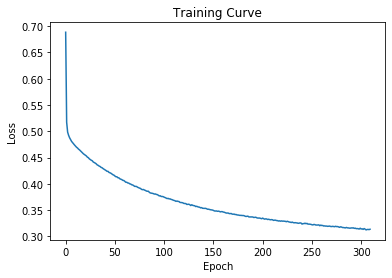

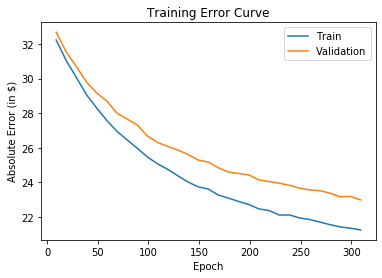

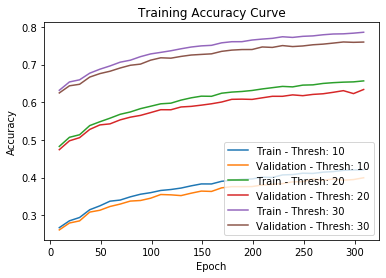

---[ITER 10] loss: 0.310302  time: 0.326
---[ITER 20] loss: 0.313233  time: 0.286
---[ITER 30] loss: 0.304972  time: 0.180
---[ITER 40] loss: 0.312784  time: 0.210
---[ITER 50] loss: 0.313808  time: 0.176
---[ITER 60] loss: 0.310723  time: 0.210
---[ITER 70] loss: 0.313604  time: 0.187
---[ITER 80] loss: 0.309690  time: 0.175
---[ITER 90] loss: 0.311070  time: 0.162
---[ITER 100] loss: 0.317110  time: 0.198
---[ITER 110] loss: 0.311003  time: 0.178
---[ITER 120] loss: 0.318521  time: 0.210
---[ITER 130] loss: 0.318806  time: 0.238
---[ITER 140] loss: 0.315875  time: 0.242
---[ITER 150] loss: 0.310415  time: 0.203
---[ITER 160] loss: 0.316127  time: 0.198
[EPOCH 311] loss: 0.312988  time: 3.520
---[ITER 10] loss: 0.310185  time: 0.255
---[ITER 20] loss: 0.315615  time: 0.304
---[ITER 30] loss: 0.312800  time: 0.223
---[ITER 40] loss: 0.313675  time: 0.155
---[ITER 50] loss: 0.309115  time: 0.194
---[ITER 60] loss: 0.315831  time: 0.198
---[ITER 70] loss: 0.316920  time: 0.213
---[ITER 8

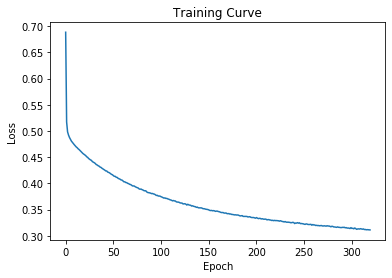

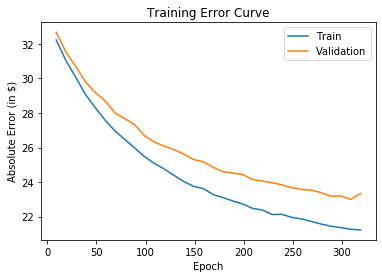

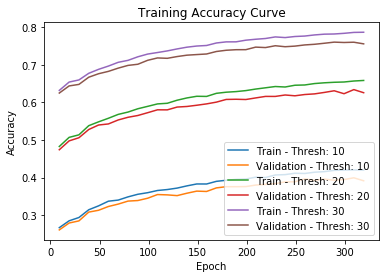

---[ITER 10] loss: 0.320648  time: 0.358
---[ITER 20] loss: 0.309711  time: 0.161
---[ITER 30] loss: 0.308523  time: 0.162
---[ITER 40] loss: 0.312243  time: 0.162
---[ITER 50] loss: 0.315789  time: 0.163
---[ITER 60] loss: 0.316229  time: 0.170
---[ITER 70] loss: 0.313093  time: 0.155
---[ITER 80] loss: 0.309102  time: 0.160
---[ITER 90] loss: 0.314108  time: 0.162
---[ITER 100] loss: 0.309365  time: 0.168
---[ITER 110] loss: 0.306143  time: 0.156
---[ITER 120] loss: 0.315190  time: 0.182
---[ITER 130] loss: 0.304633  time: 0.239
---[ITER 140] loss: 0.316754  time: 0.147
---[ITER 150] loss: 0.308072  time: 0.176
---[ITER 160] loss: 0.307784  time: 0.157
[EPOCH 321] loss: 0.311628  time: 3.022
---[ITER 10] loss: 0.308399  time: 0.365
---[ITER 20] loss: 0.309736  time: 0.175
---[ITER 30] loss: 0.313044  time: 0.156
---[ITER 40] loss: 0.311516  time: 0.171
---[ITER 50] loss: 0.315729  time: 0.159
---[ITER 60] loss: 0.312643  time: 0.173
---[ITER 70] loss: 0.309704  time: 0.177
---[ITER 8

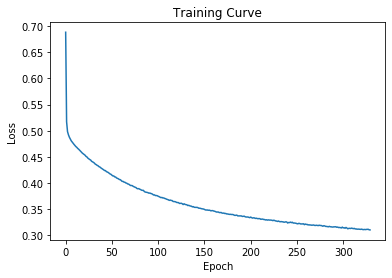

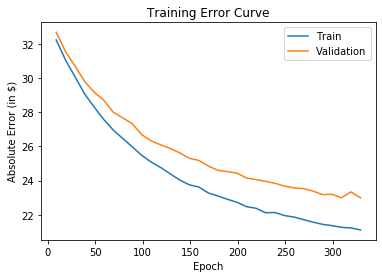

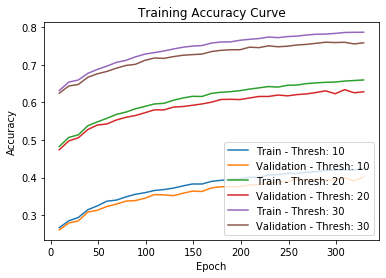

---[ITER 10] loss: 0.310222  time: 0.364
---[ITER 20] loss: 0.310666  time: 0.196
---[ITER 30] loss: 0.310817  time: 0.157
---[ITER 40] loss: 0.305369  time: 0.185
---[ITER 50] loss: 0.308156  time: 0.195
---[ITER 60] loss: 0.313392  time: 0.139
---[ITER 70] loss: 0.314444  time: 0.168
---[ITER 80] loss: 0.310857  time: 0.159
---[ITER 90] loss: 0.316368  time: 0.170
---[ITER 100] loss: 0.312281  time: 0.177
---[ITER 110] loss: 0.311314  time: 0.183
---[ITER 120] loss: 0.309574  time: 0.190
---[ITER 130] loss: 0.310347  time: 0.173
---[ITER 140] loss: 0.303504  time: 0.195
---[ITER 150] loss: 0.309252  time: 0.229
---[ITER 160] loss: 0.310977  time: 0.229
[EPOCH 331] loss: 0.310590  time: 3.265
---[ITER 10] loss: 0.313049  time: 0.387
---[ITER 20] loss: 0.305113  time: 0.176
---[ITER 30] loss: 0.307428  time: 0.205
---[ITER 40] loss: 0.312425  time: 0.170
---[ITER 50] loss: 0.312061  time: 0.154
---[ITER 60] loss: 0.303512  time: 0.188
---[ITER 70] loss: 0.313741  time: 0.173
---[ITER 8

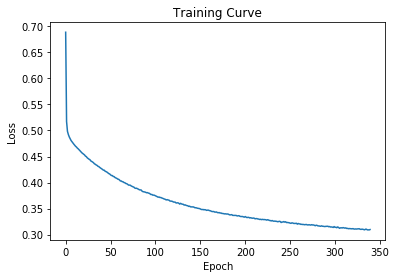

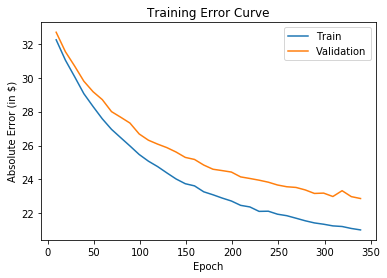

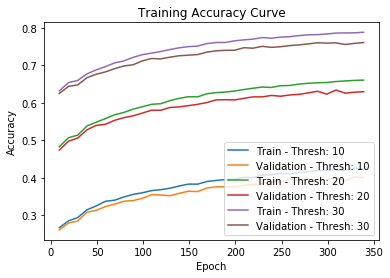

---[ITER 10] loss: 0.309390  time: 0.245
---[ITER 20] loss: 0.309129  time: 0.142
---[ITER 30] loss: 0.309982  time: 0.279
---[ITER 40] loss: 0.310098  time: 0.168
---[ITER 50] loss: 0.305720  time: 0.185
---[ITER 60] loss: 0.308113  time: 0.145
---[ITER 70] loss: 0.310170  time: 0.162
---[ITER 80] loss: 0.301566  time: 0.160
---[ITER 90] loss: 0.303425  time: 0.168
---[ITER 100] loss: 0.308717  time: 0.186
---[ITER 110] loss: 0.309534  time: 0.178
---[ITER 120] loss: 0.306421  time: 0.145
---[ITER 130] loss: 0.305954  time: 0.165
---[ITER 140] loss: 0.309587  time: 0.218
---[ITER 150] loss: 0.313601  time: 0.195
---[ITER 160] loss: 0.313685  time: 0.164
[EPOCH 341] loss: 0.308449  time: 3.061
---[ITER 10] loss: 0.303555  time: 0.293
---[ITER 20] loss: 0.309601  time: 0.138
---[ITER 30] loss: 0.315322  time: 0.284
---[ITER 40] loss: 0.304725  time: 0.196
---[ITER 50] loss: 0.312321  time: 0.182
---[ITER 60] loss: 0.308368  time: 0.157
---[ITER 70] loss: 0.311088  time: 0.166
---[ITER 8

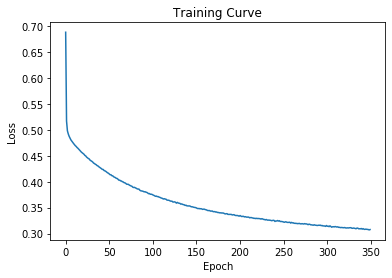

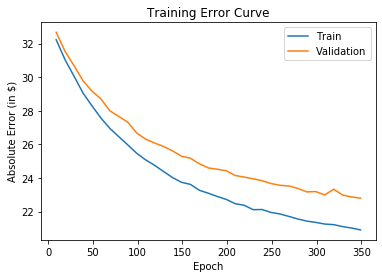

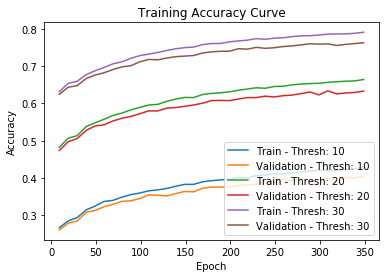

---[ITER 10] loss: 0.306244  time: 0.259
---[ITER 20] loss: 0.303753  time: 0.295
---[ITER 30] loss: 0.309383  time: 0.312
---[ITER 40] loss: 0.306487  time: 0.309
---[ITER 50] loss: 0.301356  time: 0.317
---[ITER 60] loss: 0.307889  time: 0.356
---[ITER 70] loss: 0.308981  time: 0.358
---[ITER 80] loss: 0.311279  time: 0.153
---[ITER 90] loss: 0.308036  time: 0.197
---[ITER 100] loss: 0.304125  time: 0.148
---[ITER 110] loss: 0.311443  time: 0.168
---[ITER 120] loss: 0.309501  time: 0.166
---[ITER 130] loss: 0.306300  time: 0.206
---[ITER 140] loss: 0.308546  time: 0.199
---[ITER 150] loss: 0.311694  time: 0.154
---[ITER 160] loss: 0.307931  time: 0.185
[EPOCH 351] loss: 0.307879  time: 3.912
---[ITER 10] loss: 0.310208  time: 0.244
---[ITER 20] loss: 0.310499  time: 0.309
---[ITER 30] loss: 0.310690  time: 0.164
---[ITER 40] loss: 0.314418  time: 0.198
---[ITER 50] loss: 0.306423  time: 0.151
---[ITER 60] loss: 0.308032  time: 0.163
---[ITER 70] loss: 0.312785  time: 0.173
---[ITER 8

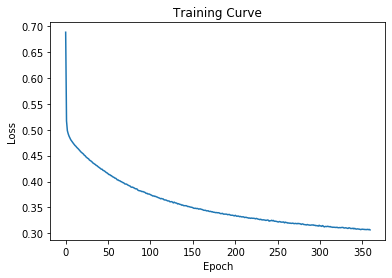

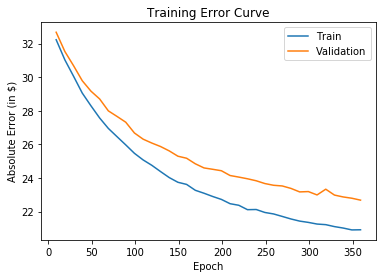

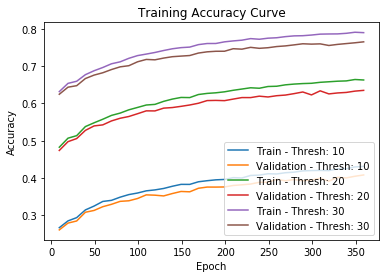

---[ITER 10] loss: 0.307081  time: 0.361
---[ITER 20] loss: 0.310888  time: 0.166
---[ITER 30] loss: 0.303799  time: 0.169
---[ITER 40] loss: 0.299034  time: 0.170
---[ITER 50] loss: 0.309229  time: 0.171
---[ITER 60] loss: 0.308651  time: 0.189
---[ITER 70] loss: 0.308682  time: 0.143
---[ITER 80] loss: 0.304662  time: 0.177
---[ITER 90] loss: 0.302773  time: 0.159
---[ITER 100] loss: 0.306985  time: 0.191
---[ITER 110] loss: 0.300133  time: 0.166
---[ITER 120] loss: 0.307769  time: 0.171
---[ITER 130] loss: 0.306881  time: 0.242
---[ITER 140] loss: 0.308209  time: 0.194
---[ITER 150] loss: 0.309452  time: 0.170
---[ITER 160] loss: 0.313905  time: 0.205
[EPOCH 361] loss: 0.306515  time: 3.224
---[ITER 10] loss: 0.309872  time: 0.361
---[ITER 20] loss: 0.301646  time: 0.182
---[ITER 30] loss: 0.304167  time: 0.176
---[ITER 40] loss: 0.310880  time: 0.171
---[ITER 50] loss: 0.305150  time: 0.166
---[ITER 60] loss: 0.314299  time: 0.155
---[ITER 70] loss: 0.313697  time: 0.194
---[ITER 8

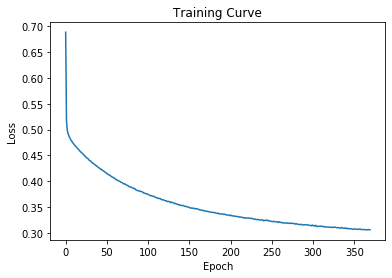

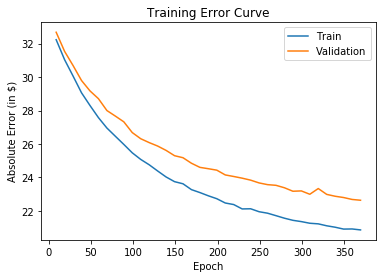

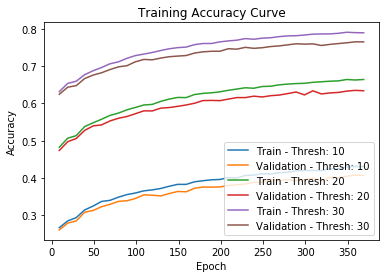

---[ITER 10] loss: 0.300865  time: 0.234
---[ITER 20] loss: 0.301870  time: 0.165
---[ITER 30] loss: 0.303853  time: 0.159
---[ITER 40] loss: 0.308582  time: 0.279
---[ITER 50] loss: 0.303248  time: 0.161
---[ITER 60] loss: 0.308939  time: 0.152
---[ITER 70] loss: 0.297587  time: 0.162
---[ITER 80] loss: 0.307493  time: 0.167
---[ITER 90] loss: 0.310937  time: 0.154
---[ITER 100] loss: 0.308875  time: 0.165
---[ITER 110] loss: 0.307306  time: 0.187
---[ITER 120] loss: 0.311131  time: 0.150
---[ITER 130] loss: 0.304903  time: 0.224
---[ITER 140] loss: 0.304354  time: 0.154
---[ITER 150] loss: 0.307347  time: 0.159
---[ITER 160] loss: 0.301653  time: 0.185
[EPOCH 371] loss: 0.305388  time: 3.054
---[ITER 10] loss: 0.302456  time: 0.250
---[ITER 20] loss: 0.303233  time: 0.156
---[ITER 30] loss: 0.313560  time: 0.177
---[ITER 40] loss: 0.312484  time: 0.305
---[ITER 50] loss: 0.304655  time: 0.170
---[ITER 60] loss: 0.305174  time: 0.161
---[ITER 70] loss: 0.303928  time: 0.177
---[ITER 8

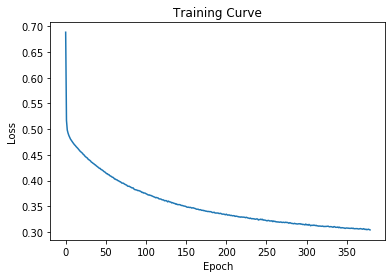

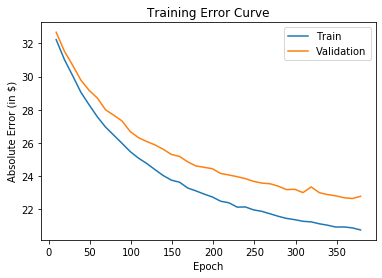

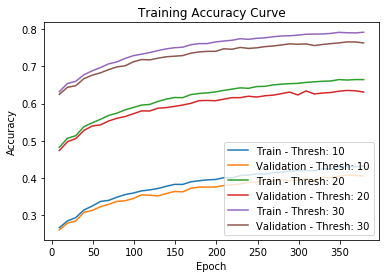

---[ITER 10] loss: 0.305650  time: 0.422
---[ITER 20] loss: 0.305068  time: 0.166
---[ITER 30] loss: 0.307677  time: 0.249
---[ITER 40] loss: 0.300436  time: 0.184
---[ITER 50] loss: 0.305225  time: 0.149
---[ITER 60] loss: 0.305706  time: 0.163
---[ITER 70] loss: 0.302105  time: 0.180
---[ITER 80] loss: 0.304352  time: 0.190
---[ITER 90] loss: 0.305349  time: 0.152
---[ITER 100] loss: 0.305798  time: 0.176
---[ITER 110] loss: 0.307823  time: 0.179
---[ITER 120] loss: 0.299755  time: 0.193
---[ITER 130] loss: 0.303488  time: 0.198
---[ITER 140] loss: 0.300049  time: 0.247
---[ITER 150] loss: 0.314831  time: 0.174
---[ITER 160] loss: 0.303263  time: 0.159
[EPOCH 381] loss: 0.304531  time: 3.329
---[ITER 10] loss: 0.305937  time: 0.254
---[ITER 20] loss: 0.303466  time: 0.172
---[ITER 30] loss: 0.299208  time: 0.296
---[ITER 40] loss: 0.303194  time: 0.162
---[ITER 50] loss: 0.305293  time: 0.194
---[ITER 60] loss: 0.310890  time: 0.159
---[ITER 70] loss: 0.300287  time: 0.186
---[ITER 8

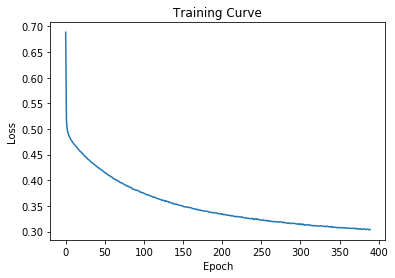

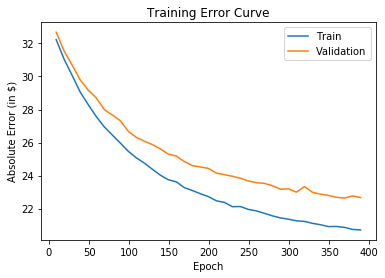

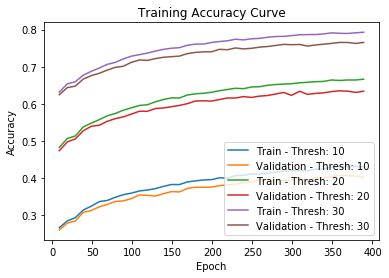

---[ITER 10] loss: 0.301806  time: 0.235
---[ITER 20] loss: 0.303780  time: 0.293
---[ITER 30] loss: 0.311129  time: 0.163
---[ITER 40] loss: 0.307852  time: 0.160
---[ITER 50] loss: 0.303282  time: 0.167
---[ITER 60] loss: 0.304790  time: 0.162
---[ITER 70] loss: 0.302278  time: 0.181
---[ITER 80] loss: 0.308302  time: 0.168
---[ITER 90] loss: 0.305149  time: 0.160
---[ITER 100] loss: 0.307191  time: 0.179
---[ITER 110] loss: 0.294727  time: 0.163
---[ITER 120] loss: 0.312847  time: 0.170
---[ITER 130] loss: 0.304777  time: 0.213
---[ITER 140] loss: 0.299424  time: 0.227
---[ITER 150] loss: 0.303002  time: 0.157
---[ITER 160] loss: 0.301340  time: 0.165
[EPOCH 391] loss: 0.304148  time: 3.107
---[ITER 10] loss: 0.298948  time: 0.250
---[ITER 20] loss: 0.302055  time: 0.301
---[ITER 30] loss: 0.307026  time: 0.161
---[ITER 40] loss: 0.300645  time: 0.176
---[ITER 50] loss: 0.301105  time: 0.159
---[ITER 60] loss: 0.302991  time: 0.188
---[ITER 70] loss: 0.305340  time: 0.182
---[ITER 8

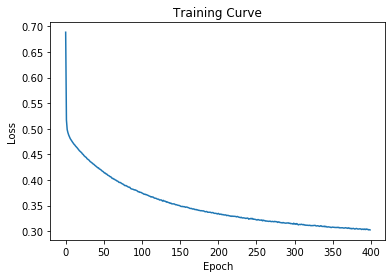

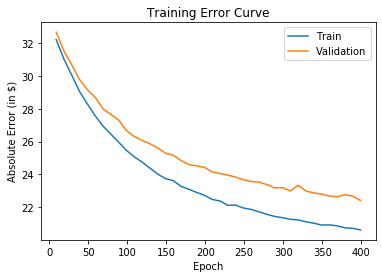

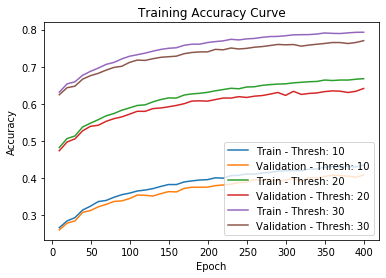

---[ITER 10] loss: 0.305951  time: 0.370
---[ITER 20] loss: 0.300713  time: 0.177
---[ITER 30] loss: 0.300232  time: 0.198
---[ITER 40] loss: 0.299989  time: 0.157
---[ITER 50] loss: 0.301125  time: 0.158
---[ITER 60] loss: 0.304329  time: 0.168
---[ITER 70] loss: 0.303451  time: 0.156
---[ITER 80] loss: 0.305780  time: 0.167
---[ITER 90] loss: 0.298125  time: 0.216
---[ITER 100] loss: 0.305752  time: 0.166
---[ITER 110] loss: 0.308229  time: 0.154
---[ITER 120] loss: 0.303207  time: 0.234
---[ITER 130] loss: 0.308713  time: 0.153
---[ITER 140] loss: 0.300827  time: 0.179
---[ITER 150] loss: 0.304854  time: 0.168
---[ITER 160] loss: 0.301641  time: 0.177
[EPOCH 401] loss: 0.303058  time: 3.136
---[ITER 10] loss: 0.295956  time: 0.391
---[ITER 20] loss: 0.306689  time: 0.183
---[ITER 30] loss: 0.301147  time: 0.184
---[ITER 40] loss: 0.305181  time: 0.155
---[ITER 50] loss: 0.302402  time: 0.175
---[ITER 60] loss: 0.300974  time: 0.164
---[ITER 70] loss: 0.303208  time: 0.170
---[ITER 8

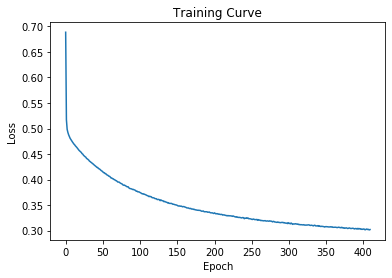

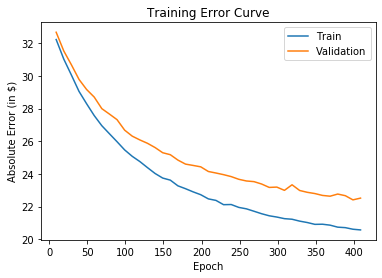

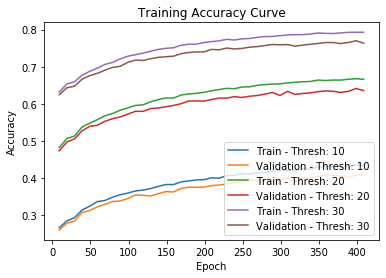

---[ITER 10] loss: 0.302083  time: 0.265
---[ITER 20] loss: 0.305768  time: 0.151
---[ITER 30] loss: 0.301318  time: 0.274
---[ITER 40] loss: 0.298499  time: 0.158
---[ITER 50] loss: 0.302739  time: 0.175
---[ITER 60] loss: 0.311095  time: 0.156
---[ITER 70] loss: 0.300378  time: 0.205
---[ITER 80] loss: 0.300018  time: 0.176
---[ITER 90] loss: 0.298474  time: 0.156
---[ITER 100] loss: 0.301149  time: 0.172
---[ITER 110] loss: 0.305610  time: 0.192
---[ITER 120] loss: 0.302241  time: 0.176
---[ITER 130] loss: 0.307280  time: 0.155
---[ITER 140] loss: 0.297919  time: 0.166
---[ITER 150] loss: 0.303893  time: 0.213
---[ITER 160] loss: 0.303467  time: 0.159
[EPOCH 411] loss: 0.302530  time: 3.097
---[ITER 10] loss: 0.302557  time: 0.283
---[ITER 20] loss: 0.301746  time: 0.141
---[ITER 30] loss: 0.303651  time: 0.284
---[ITER 40] loss: 0.301655  time: 0.172
---[ITER 50] loss: 0.306509  time: 0.190
---[ITER 60] loss: 0.303489  time: 0.153
---[ITER 70] loss: 0.294794  time: 0.163
---[ITER 8

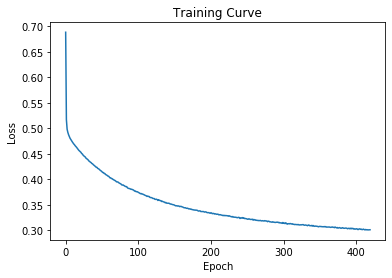

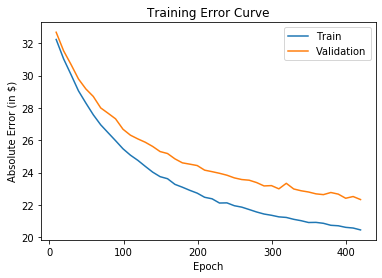

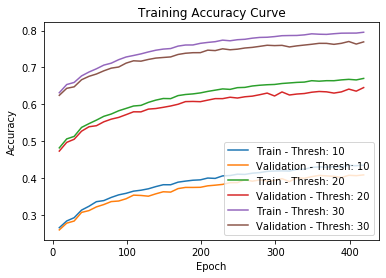

---[ITER 10] loss: 0.303555  time: 0.251
---[ITER 20] loss: 0.295628  time: 0.254
---[ITER 30] loss: 0.306385  time: 0.178
---[ITER 40] loss: 0.302648  time: 0.150
---[ITER 50] loss: 0.295307  time: 0.165
---[ITER 60] loss: 0.305216  time: 0.187
---[ITER 70] loss: 0.307699  time: 0.154
---[ITER 80] loss: 0.303434  time: 0.157
---[ITER 90] loss: 0.302286  time: 0.176
---[ITER 100] loss: 0.307068  time: 0.177
---[ITER 110] loss: 0.299029  time: 0.148
---[ITER 120] loss: 0.293995  time: 0.190
---[ITER 130] loss: 0.298633  time: 0.153
---[ITER 140] loss: 0.302790  time: 0.217
---[ITER 150] loss: 0.298591  time: 0.170
---[ITER 160] loss: 0.305112  time: 0.163
[EPOCH 421] loss: 0.301596  time: 3.041
---[ITER 10] loss: 0.301132  time: 0.238
---[ITER 20] loss: 0.300584  time: 0.276
---[ITER 30] loss: 0.298251  time: 0.190
---[ITER 40] loss: 0.300141  time: 0.140
---[ITER 50] loss: 0.304842  time: 0.177
---[ITER 60] loss: 0.291424  time: 0.207
---[ITER 70] loss: 0.297069  time: 0.159
---[ITER 8

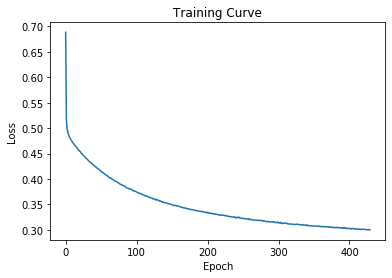

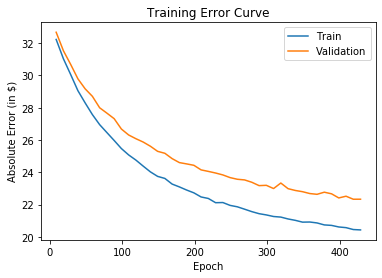

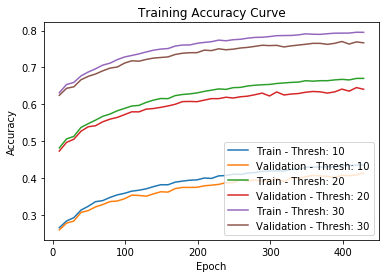

---[ITER 10] loss: 0.301852  time: 0.437
---[ITER 20] loss: 0.295999  time: 0.189
---[ITER 30] loss: 0.295994  time: 0.154
---[ITER 40] loss: 0.297919  time: 0.175
---[ITER 50] loss: 0.303890  time: 0.442
---[ITER 60] loss: 0.305093  time: 0.225
---[ITER 70] loss: 0.299683  time: 0.153
---[ITER 80] loss: 0.297168  time: 0.180
---[ITER 90] loss: 0.301307  time: 0.171
---[ITER 100] loss: 0.303175  time: 0.186
---[ITER 110] loss: 0.293685  time: 0.185
---[ITER 120] loss: 0.305966  time: 0.179
---[ITER 130] loss: 0.303845  time: 0.235
---[ITER 140] loss: 0.297550  time: 0.147
---[ITER 150] loss: 0.294532  time: 0.190
---[ITER 160] loss: 0.298739  time: 0.186
[EPOCH 431] loss: 0.299992  time: 3.575
---[ITER 10] loss: 0.300662  time: 0.378
---[ITER 20] loss: 0.295379  time: 0.159
---[ITER 30] loss: 0.304078  time: 0.166
---[ITER 40] loss: 0.303988  time: 0.177
---[ITER 50] loss: 0.298742  time: 0.160
---[ITER 60] loss: 0.297075  time: 0.173
---[ITER 70] loss: 0.299815  time: 0.166
---[ITER 8

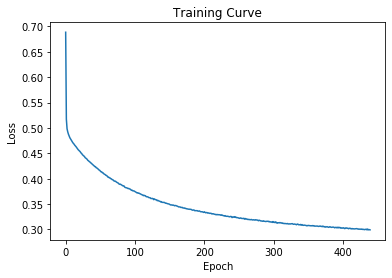

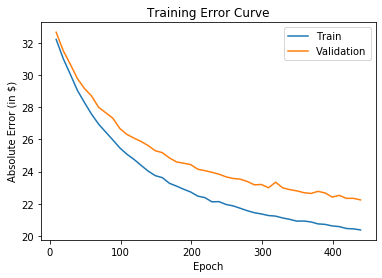

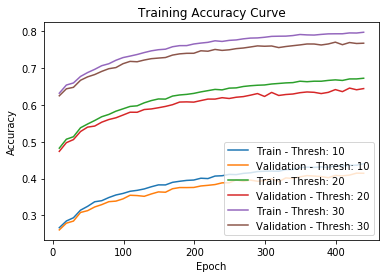

---[ITER 10] loss: 0.303770  time: 1.148
---[ITER 20] loss: 0.296603  time: 0.750
---[ITER 30] loss: 0.294903  time: 0.668
---[ITER 40] loss: 0.294872  time: 0.699
---[ITER 50] loss: 0.304155  time: 0.600
---[ITER 60] loss: 0.306621  time: 0.570
---[ITER 70] loss: 0.298723  time: 0.206
---[ITER 80] loss: 0.303042  time: 0.173
---[ITER 90] loss: 0.298915  time: 0.241
---[ITER 100] loss: 0.299888  time: 0.214
---[ITER 110] loss: 0.294925  time: 0.259
---[ITER 120] loss: 0.305445  time: 0.262
---[ITER 130] loss: 0.304211  time: 0.295
---[ITER 140] loss: 0.304678  time: 0.407
---[ITER 150] loss: 0.302997  time: 0.917
---[ITER 160] loss: 0.295646  time: 0.920
[EPOCH 441] loss: 0.300307  time: 9.222
---[ITER 10] loss: 0.300137  time: 1.310
---[ITER 20] loss: 0.301126  time: 1.411
---[ITER 30] loss: 0.298134  time: 0.935
---[ITER 40] loss: 0.298194  time: 1.118
---[ITER 50] loss: 0.292228  time: 0.978
---[ITER 60] loss: 0.299190  time: 0.666
---[ITER 70] loss: 0.297696  time: 0.842
---[ITER 8

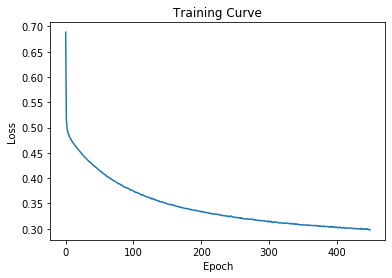

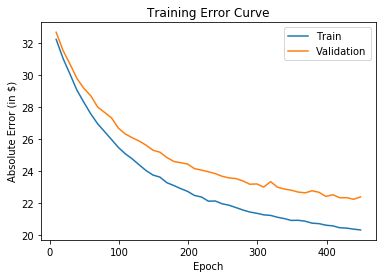

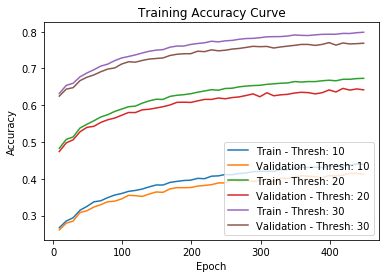

---[ITER 10] loss: 0.293477  time: 0.298
---[ITER 20] loss: 0.291528  time: 0.136
---[ITER 30] loss: 0.303143  time: 0.323
---[ITER 40] loss: 0.296855  time: 0.176
---[ITER 50] loss: 0.297820  time: 0.159
---[ITER 60] loss: 0.306590  time: 0.215
---[ITER 70] loss: 0.299452  time: 0.177
---[ITER 80] loss: 0.301554  time: 0.166
---[ITER 90] loss: 0.299447  time: 0.208
---[ITER 100] loss: 0.302507  time: 0.224
---[ITER 110] loss: 0.299534  time: 0.147
---[ITER 120] loss: 0.302463  time: 0.149
---[ITER 130] loss: 0.301706  time: 0.159
---[ITER 140] loss: 0.295536  time: 0.183
---[ITER 150] loss: 0.296007  time: 0.155
---[ITER 160] loss: 0.298848  time: 0.211
[EPOCH 451] loss: 0.299289  time: 3.229
---[ITER 10] loss: 0.292850  time: 0.252
---[ITER 20] loss: 0.307478  time: 0.153
---[ITER 30] loss: 0.298485  time: 0.368
---[ITER 40] loss: 0.293036  time: 0.173
---[ITER 50] loss: 0.300599  time: 0.167
---[ITER 60] loss: 0.299788  time: 0.182
---[ITER 70] loss: 0.298483  time: 0.164
---[ITER 8

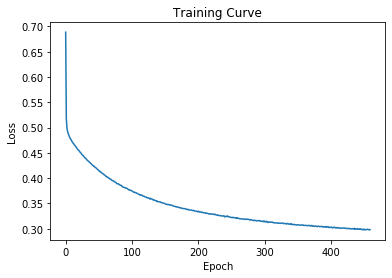

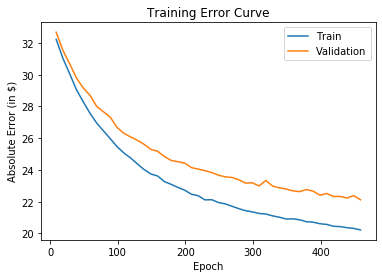

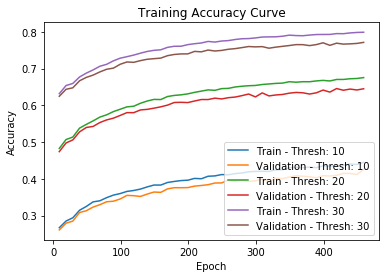

---[ITER 10] loss: 0.302114  time: 0.231
---[ITER 20] loss: 0.295934  time: 0.283
---[ITER 30] loss: 0.292612  time: 0.181
---[ITER 40] loss: 0.294279  time: 0.155
---[ITER 50] loss: 0.300450  time: 0.159
---[ITER 60] loss: 0.299049  time: 0.155
---[ITER 70] loss: 0.297266  time: 0.237
---[ITER 80] loss: 0.302719  time: 0.195
---[ITER 90] loss: 0.302834  time: 0.166
---[ITER 100] loss: 0.294747  time: 0.211
---[ITER 110] loss: 0.289496  time: 0.174
---[ITER 120] loss: 0.305528  time: 0.193
---[ITER 130] loss: 0.298685  time: 0.250
---[ITER 140] loss: 0.293719  time: 0.199
---[ITER 150] loss: 0.294367  time: 0.225
---[ITER 160] loss: 0.293324  time: 0.177
[EPOCH 461] loss: 0.297225  time: 3.371
---[ITER 10] loss: 0.296948  time: 0.304
---[ITER 20] loss: 0.297755  time: 0.341
---[ITER 30] loss: 0.299618  time: 0.220
---[ITER 40] loss: 0.300563  time: 0.160
---[ITER 50] loss: 0.298467  time: 0.189
---[ITER 60] loss: 0.290554  time: 0.142
---[ITER 70] loss: 0.295419  time: 0.205
---[ITER 8

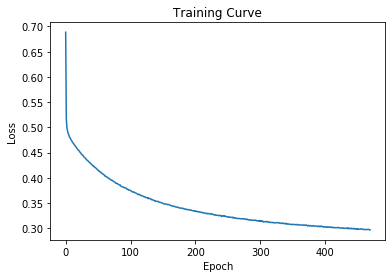

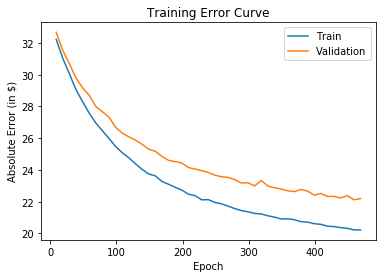

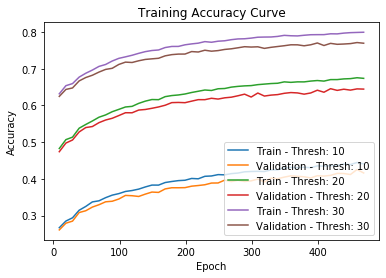

---[ITER 10] loss: 0.297831  time: 0.389
---[ITER 20] loss: 0.295050  time: 0.149
---[ITER 30] loss: 0.293894  time: 0.181
---[ITER 40] loss: 0.294869  time: 0.171
---[ITER 50] loss: 0.297096  time: 0.250
---[ITER 60] loss: 0.292633  time: 0.341
---[ITER 70] loss: 0.291343  time: 0.344
---[ITER 80] loss: 0.301359  time: 0.542
---[ITER 90] loss: 0.301513  time: 0.287
---[ITER 100] loss: 0.297046  time: 0.156
---[ITER 110] loss: 0.303177  time: 0.175
---[ITER 120] loss: 0.300853  time: 0.190
---[ITER 130] loss: 0.295686  time: 0.228
---[ITER 140] loss: 0.299413  time: 0.162
---[ITER 150] loss: 0.297280  time: 0.155
---[ITER 160] loss: 0.292737  time: 0.172
[EPOCH 471] loss: 0.296550  time: 4.051
---[ITER 10] loss: 0.299128  time: 0.441
---[ITER 20] loss: 0.302553  time: 0.186
---[ITER 30] loss: 0.297115  time: 0.159
---[ITER 40] loss: 0.296767  time: 0.163
---[ITER 50] loss: 0.297758  time: 0.195
---[ITER 60] loss: 0.292721  time: 0.154
---[ITER 70] loss: 0.298092  time: 0.171
---[ITER 8

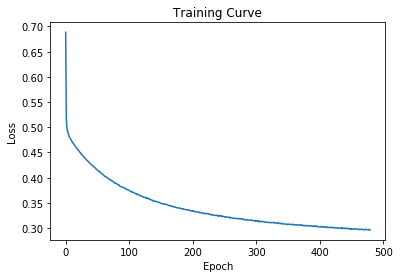

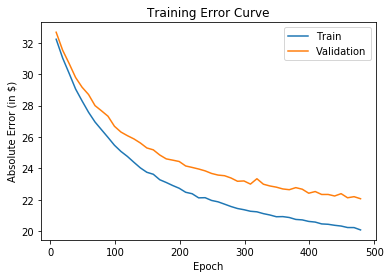

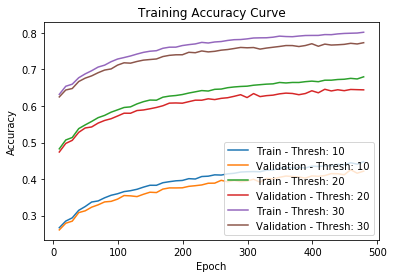

---[ITER 10] loss: 0.297351  time: 0.394
---[ITER 20] loss: 0.296104  time: 0.301
---[ITER 30] loss: 0.298615  time: 0.290
---[ITER 40] loss: 0.297137  time: 0.487
---[ITER 50] loss: 0.299727  time: 0.286
---[ITER 60] loss: 0.298681  time: 0.252
---[ITER 70] loss: 0.290916  time: 0.294
---[ITER 80] loss: 0.291897  time: 0.382
---[ITER 90] loss: 0.295508  time: 0.550
---[ITER 100] loss: 0.295625  time: 0.384
---[ITER 110] loss: 0.294181  time: 0.344
---[ITER 120] loss: 0.291905  time: 0.667
---[ITER 130] loss: 0.298131  time: 0.349
---[ITER 140] loss: 0.296521  time: 0.277
---[ITER 150] loss: 0.297700  time: 0.263
---[ITER 160] loss: 0.293983  time: 0.340
[EPOCH 481] loss: 0.295963  time: 6.155
---[ITER 10] loss: 0.293681  time: 0.374
---[ITER 20] loss: 0.299511  time: 0.539
---[ITER 30] loss: 0.302351  time: 0.396
---[ITER 40] loss: 0.288702  time: 0.338
---[ITER 50] loss: 0.296708  time: 0.362
---[ITER 60] loss: 0.293154  time: 0.347
---[ITER 70] loss: 0.299593  time: 0.471
---[ITER 8

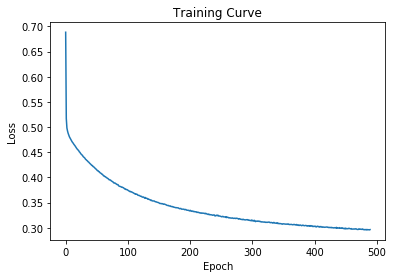

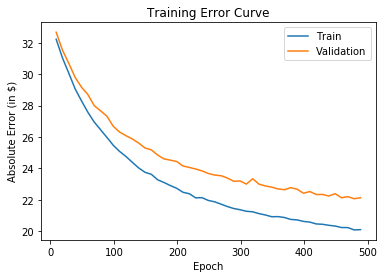

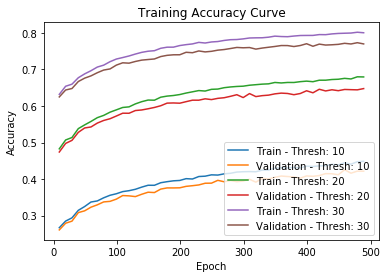

---[ITER 10] loss: 0.294643  time: 0.235
---[ITER 20] loss: 0.299491  time: 0.158
---[ITER 30] loss: 0.298939  time: 0.301
---[ITER 40] loss: 0.294721  time: 0.160
---[ITER 50] loss: 0.296903  time: 0.173
---[ITER 60] loss: 0.294667  time: 0.145
---[ITER 70] loss: 0.293094  time: 0.157
---[ITER 80] loss: 0.289837  time: 0.166
---[ITER 90] loss: 0.296427  time: 0.168
---[ITER 100] loss: 0.295270  time: 0.179
---[ITER 110] loss: 0.297526  time: 0.154
---[ITER 120] loss: 0.295194  time: 0.167
---[ITER 130] loss: 0.296964  time: 0.170
---[ITER 140] loss: 0.295875  time: 0.203
---[ITER 150] loss: 0.301028  time: 0.168
---[ITER 160] loss: 0.293396  time: 0.179
[EPOCH 491] loss: 0.295843  time: 3.027
---[ITER 10] loss: 0.302966  time: 0.239
---[ITER 20] loss: 0.301581  time: 0.161
---[ITER 30] loss: 0.293189  time: 0.267
---[ITER 40] loss: 0.291293  time: 0.184
---[ITER 50] loss: 0.301683  time: 0.157
---[ITER 60] loss: 0.290916  time: 0.162
---[ITER 70] loss: 0.296027  time: 0.164
---[ITER 8

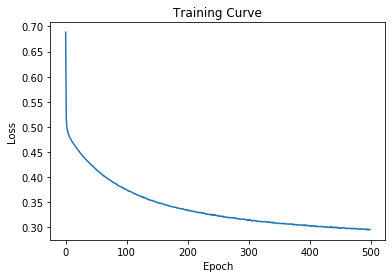

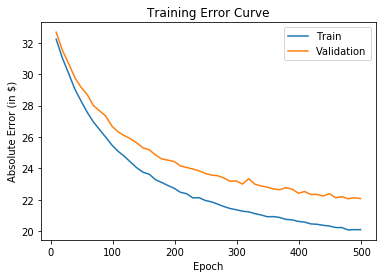

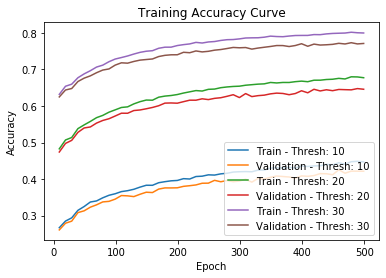

---[ITER 10] loss: 0.295775  time: 0.348
---[ITER 20] loss: 0.292084  time: 0.325
---[ITER 30] loss: 0.287858  time: 0.155
---[ITER 40] loss: 0.298272  time: 0.253
---[ITER 50] loss: 0.290115  time: 0.187
---[ITER 60] loss: 0.298370  time: 0.184
---[ITER 70] loss: 0.291045  time: 0.188
---[ITER 80] loss: 0.297295  time: 0.161
---[ITER 90] loss: 0.291203  time: 0.174
---[ITER 100] loss: 0.293226  time: 0.160
---[ITER 110] loss: 0.292093  time: 0.166
---[ITER 120] loss: 0.297283  time: 0.161
---[ITER 130] loss: 0.298457  time: 0.231
---[ITER 140] loss: 0.306815  time: 0.152
---[ITER 150] loss: 0.294883  time: 0.168
---[ITER 160] loss: 0.304376  time: 0.153
[EPOCH 501] loss: 0.294950  time: 3.306
---[ITER 10] loss: 0.289275  time: 0.286
---[ITER 20] loss: 0.290722  time: 0.345
---[ITER 30] loss: 0.294804  time: 0.304
---[ITER 40] loss: 0.299488  time: 0.193
---[ITER 50] loss: 0.301585  time: 0.168
---[ITER 60] loss: 0.287617  time: 0.470
---[ITER 70] loss: 0.298048  time: 0.173
---[ITER 8

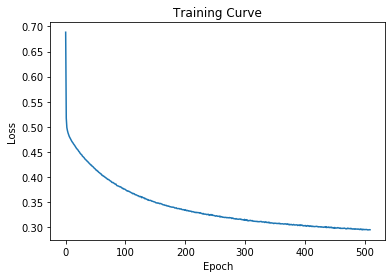

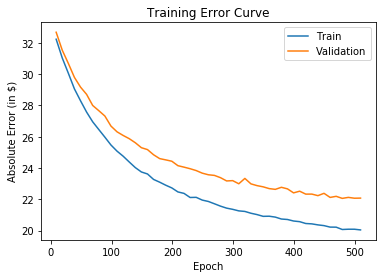

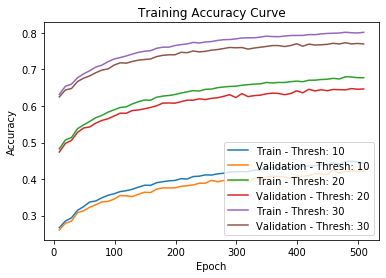

---[ITER 10] loss: 0.287766  time: 0.359
---[ITER 20] loss: 0.294525  time: 0.162
---[ITER 30] loss: 0.297668  time: 0.187
---[ITER 40] loss: 0.298871  time: 0.153
---[ITER 50] loss: 0.289809  time: 0.159
---[ITER 60] loss: 0.291145  time: 0.165
---[ITER 70] loss: 0.293083  time: 0.157
---[ITER 80] loss: 0.298114  time: 0.162
---[ITER 90] loss: 0.292219  time: 0.189
---[ITER 100] loss: 0.298858  time: 0.147
---[ITER 110] loss: 0.290230  time: 0.168
---[ITER 120] loss: 0.292606  time: 0.201
---[ITER 130] loss: 0.288964  time: 0.170
---[ITER 140] loss: 0.292879  time: 0.185
---[ITER 150] loss: 0.301936  time: 0.156
---[ITER 160] loss: 0.297376  time: 0.171
[EPOCH 511] loss: 0.294215  time: 3.041
---[ITER 10] loss: 0.295392  time: 0.355
---[ITER 20] loss: 0.288852  time: 0.167
---[ITER 30] loss: 0.291906  time: 0.168
---[ITER 40] loss: 0.289155  time: 0.159
---[ITER 50] loss: 0.299776  time: 0.165
---[ITER 60] loss: 0.296273  time: 0.164
---[ITER 70] loss: 0.290713  time: 0.169
---[ITER 8

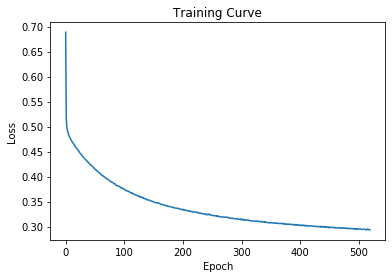

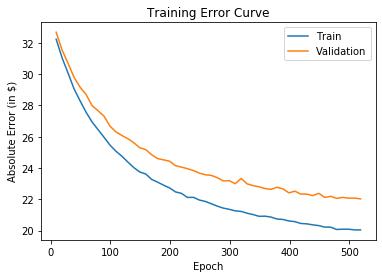

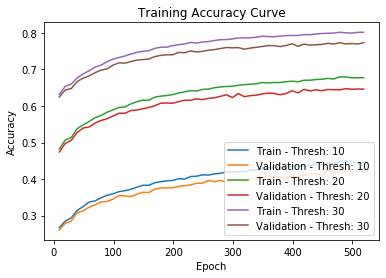

---[ITER 10] loss: 0.297570  time: 0.267
---[ITER 20] loss: 0.292492  time: 0.140
---[ITER 30] loss: 0.292127  time: 0.277
---[ITER 40] loss: 0.295759  time: 0.196
---[ITER 50] loss: 0.294698  time: 0.386
---[ITER 60] loss: 0.287697  time: 0.334
---[ITER 70] loss: 0.287532  time: 0.308
---[ITER 80] loss: 0.295958  time: 0.183
---[ITER 90] loss: 0.296381  time: 0.336
---[ITER 100] loss: 0.296655  time: 0.358
---[ITER 110] loss: 0.294471  time: 0.272
---[ITER 120] loss: 0.293958  time: 0.233
---[ITER 130] loss: 0.296869  time: 0.151
---[ITER 140] loss: 0.293248  time: 0.287
---[ITER 150] loss: 0.297190  time: 0.404
---[ITER 160] loss: 0.286432  time: 0.237
[EPOCH 521] loss: 0.293734  time: 4.511
---[ITER 10] loss: 0.288849  time: 0.292
---[ITER 20] loss: 0.291319  time: 0.248
---[ITER 30] loss: 0.298810  time: 0.342
---[ITER 40] loss: 0.285045  time: 0.496
---[ITER 50] loss: 0.299446  time: 0.326
---[ITER 60] loss: 0.297393  time: 0.216
---[ITER 70] loss: 0.298372  time: 0.414
---[ITER 8

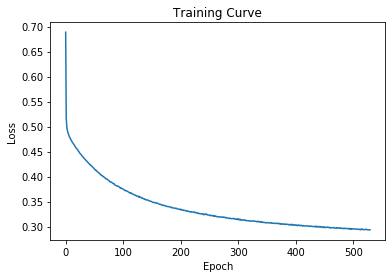

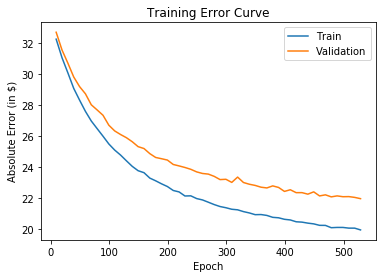

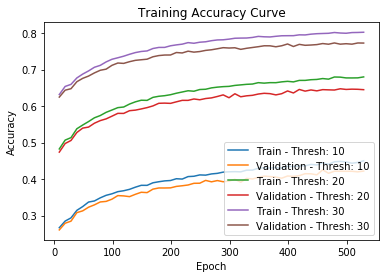

---[ITER 10] loss: 0.294201  time: 0.220
---[ITER 20] loss: 0.289414  time: 0.271
---[ITER 30] loss: 0.298493  time: 0.151
---[ITER 40] loss: 0.289579  time: 0.175
---[ITER 50] loss: 0.288839  time: 0.163
---[ITER 60] loss: 0.298662  time: 0.150
---[ITER 70] loss: 0.285746  time: 0.154
---[ITER 80] loss: 0.286896  time: 0.163
---[ITER 90] loss: 0.294770  time: 0.168
---[ITER 100] loss: 0.293878  time: 0.175
---[ITER 110] loss: 0.298236  time: 0.154
---[ITER 120] loss: 0.294852  time: 0.156
---[ITER 130] loss: 0.287045  time: 0.158
---[ITER 140] loss: 0.298590  time: 0.189
---[ITER 150] loss: 0.292104  time: 0.164
---[ITER 160] loss: 0.290427  time: 0.171
[EPOCH 531] loss: 0.292824  time: 2.923
---[ITER 10] loss: 0.295248  time: 0.230
---[ITER 20] loss: 0.302914  time: 0.262
---[ITER 30] loss: 0.285410  time: 0.159
---[ITER 40] loss: 0.291075  time: 0.170
---[ITER 50] loss: 0.300863  time: 0.175
---[ITER 60] loss: 0.289812  time: 0.144
---[ITER 70] loss: 0.290479  time: 0.154
---[ITER 8

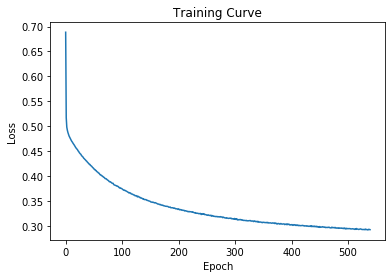

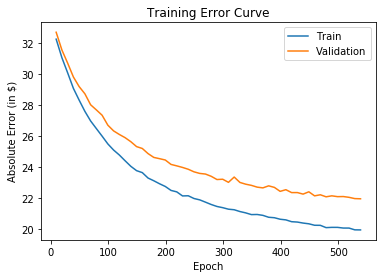

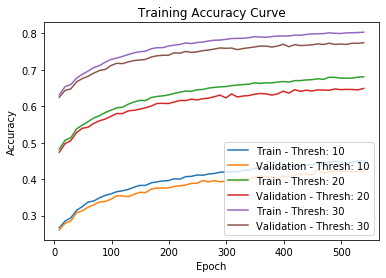

---[ITER 10] loss: 0.296225  time: 0.353
---[ITER 20] loss: 0.289529  time: 0.178
---[ITER 30] loss: 0.291789  time: 0.179
---[ITER 40] loss: 0.286117  time: 0.148
---[ITER 50] loss: 0.295149  time: 0.153
---[ITER 60] loss: 0.291983  time: 0.157
---[ITER 70] loss: 0.288630  time: 0.153
---[ITER 80] loss: 0.296313  time: 0.166
---[ITER 90] loss: 0.290994  time: 0.165
---[ITER 100] loss: 0.295092  time: 0.154
---[ITER 110] loss: 0.286166  time: 0.171
---[ITER 120] loss: 0.292800  time: 0.159
---[ITER 130] loss: 0.292578  time: 0.208
---[ITER 140] loss: 0.287145  time: 0.184
---[ITER 150] loss: 0.297477  time: 0.178
---[ITER 160] loss: 0.294335  time: 0.161
[EPOCH 541] loss: 0.291972  time: 3.010
---[ITER 10] loss: 0.297003  time: 0.360
---[ITER 20] loss: 0.288875  time: 0.169
---[ITER 30] loss: 0.297395  time: 0.169
---[ITER 40] loss: 0.296713  time: 0.160
---[ITER 50] loss: 0.285271  time: 0.181
---[ITER 60] loss: 0.293578  time: 0.158
---[ITER 70] loss: 0.286695  time: 0.169
---[ITER 8

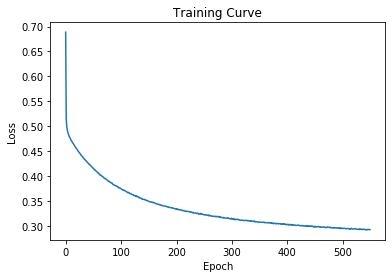

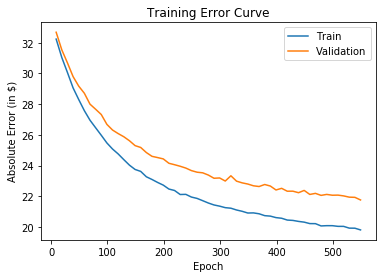

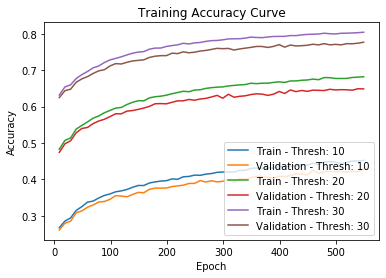

---[ITER 10] loss: 0.290187  time: 0.711
---[ITER 20] loss: 0.296125  time: 0.341
---[ITER 30] loss: 0.288733  time: 0.163
---[ITER 40] loss: 0.287650  time: 0.190
---[ITER 50] loss: 0.292781  time: 0.158
---[ITER 60] loss: 0.287025  time: 0.157
---[ITER 70] loss: 0.289561  time: 0.167
---[ITER 80] loss: 0.290806  time: 0.321
---[ITER 90] loss: 0.296779  time: 0.370
---[ITER 100] loss: 0.293629  time: 0.144
---[ITER 110] loss: 0.295873  time: 0.177
---[ITER 120] loss: 0.293514  time: 0.251
---[ITER 130] loss: 0.297570  time: 0.209
---[ITER 140] loss: 0.293492  time: 0.186
---[ITER 150] loss: 0.289932  time: 0.140
---[ITER 160] loss: 0.287328  time: 0.175
[EPOCH 551] loss: 0.292053  time: 4.005
---[ITER 10] loss: 0.289968  time: 0.363
---[ITER 20] loss: 0.293396  time: 0.206
---[ITER 30] loss: 0.291747  time: 0.142
---[ITER 40] loss: 0.298334  time: 0.163
---[ITER 50] loss: 0.295316  time: 0.168
---[ITER 60] loss: 0.290322  time: 0.174
---[ITER 70] loss: 0.294699  time: 0.153
---[ITER 8

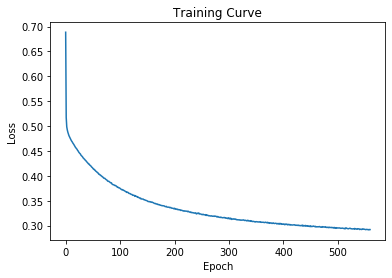

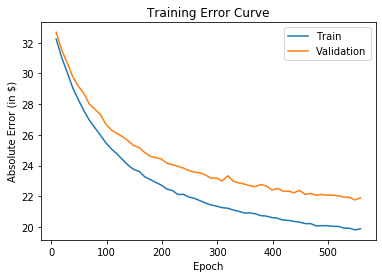

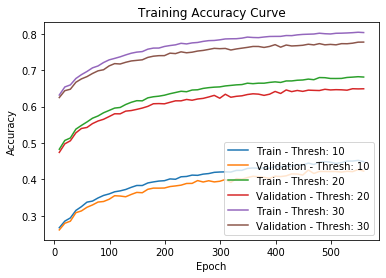

---[ITER 10] loss: 0.288694  time: 0.560
---[ITER 20] loss: 0.294501  time: 0.270
---[ITER 30] loss: 0.288575  time: 0.431
---[ITER 40] loss: 0.293204  time: 0.303
---[ITER 50] loss: 0.295893  time: 0.241
---[ITER 60] loss: 0.285792  time: 0.321
---[ITER 70] loss: 0.286696  time: 0.264
---[ITER 80] loss: 0.291909  time: 0.249
---[ITER 90] loss: 0.288924  time: 0.201
---[ITER 100] loss: 0.289991  time: 0.200
---[ITER 110] loss: 0.296868  time: 0.248
---[ITER 120] loss: 0.293235  time: 0.187
---[ITER 130] loss: 0.292038  time: 0.208
---[ITER 140] loss: 0.294086  time: 0.267
---[ITER 150] loss: 0.291663  time: 0.170
---[ITER 160] loss: 0.293413  time: 0.194
[EPOCH 561] loss: 0.291442  time: 4.476
---[ITER 10] loss: 0.291294  time: 0.331
---[ITER 20] loss: 0.282470  time: 0.267
---[ITER 30] loss: 0.291114  time: 0.379
---[ITER 40] loss: 0.290391  time: 0.218
---[ITER 50] loss: 0.291637  time: 0.193
---[ITER 60] loss: 0.286142  time: 0.431
---[ITER 70] loss: 0.298255  time: 0.256
---[ITER 8

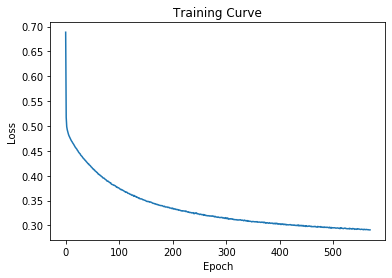

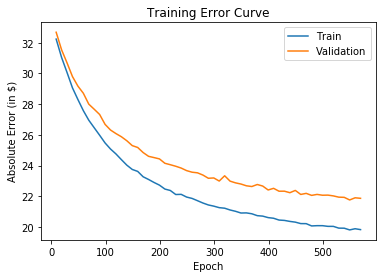

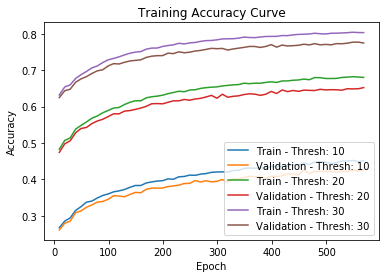

---[ITER 10] loss: 0.288947  time: 0.382
---[ITER 20] loss: 0.295841  time: 0.358
---[ITER 30] loss: 0.285778  time: 0.202
---[ITER 40] loss: 0.287792  time: 0.175
---[ITER 50] loss: 0.294484  time: 0.167
---[ITER 60] loss: 0.288867  time: 0.193
---[ITER 70] loss: 0.294586  time: 0.164
---[ITER 80] loss: 0.290326  time: 0.169
---[ITER 90] loss: 0.286105  time: 0.185
---[ITER 100] loss: 0.294188  time: 0.174
---[ITER 110] loss: 0.293271  time: 0.256
---[ITER 120] loss: 0.286065  time: 0.189
---[ITER 130] loss: 0.292794  time: 0.215
---[ITER 140] loss: 0.288607  time: 0.214
---[ITER 150] loss: 0.298856  time: 0.350
---[ITER 160] loss: 0.296075  time: 0.939
[EPOCH 571] loss: 0.291462  time: 5.083
---[ITER 10] loss: 0.291208  time: 0.440
---[ITER 20] loss: 0.290506  time: 0.300
---[ITER 30] loss: 0.291048  time: 0.265
---[ITER 40] loss: 0.287834  time: 0.714
---[ITER 50] loss: 0.289895  time: 0.214
---[ITER 60] loss: 0.290829  time: 0.372
---[ITER 70] loss: 0.289305  time: 0.839
---[ITER 8

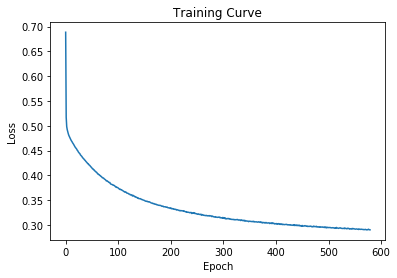

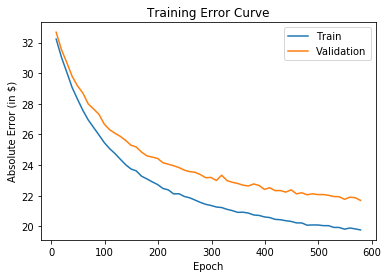

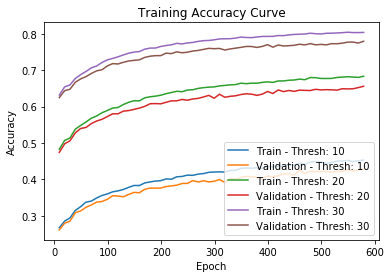

---[ITER 10] loss: 0.283468  time: 1.736
---[ITER 20] loss: 0.296854  time: 1.129
---[ITER 30] loss: 0.292779  time: 1.114
---[ITER 40] loss: 0.283819  time: 1.328
---[ITER 50] loss: 0.288980  time: 1.069
---[ITER 60] loss: 0.291811  time: 1.001
---[ITER 70] loss: 0.292561  time: 1.053
---[ITER 80] loss: 0.291649  time: 0.867
---[ITER 90] loss: 0.285923  time: 1.366
---[ITER 100] loss: 0.291323  time: 1.412
---[ITER 110] loss: 0.287990  time: 0.891
---[ITER 120] loss: 0.289760  time: 1.191
---[ITER 130] loss: 0.292155  time: 1.263
---[ITER 140] loss: 0.297043  time: 1.388
---[ITER 150] loss: 0.294783  time: 0.752
---[ITER 160] loss: 0.288209  time: 0.745
[EPOCH 581] loss: 0.290715  time: 18.884
---[ITER 10] loss: 0.289290  time: 1.586
---[ITER 20] loss: 0.286290  time: 1.290
---[ITER 30] loss: 0.288702  time: 1.521
---[ITER 40] loss: 0.291810  time: 1.512
---[ITER 50] loss: 0.293453  time: 1.455
---[ITER 60] loss: 0.295497  time: 0.782
---[ITER 70] loss: 0.298924  time: 0.695
---[ITER 

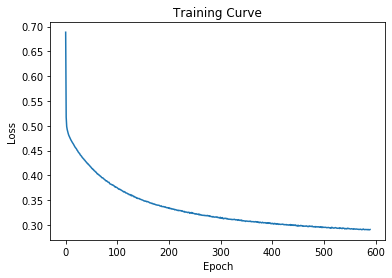

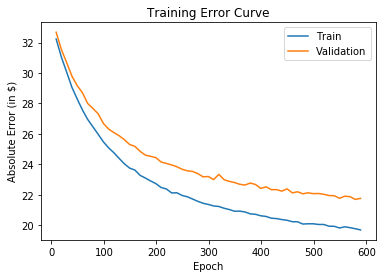

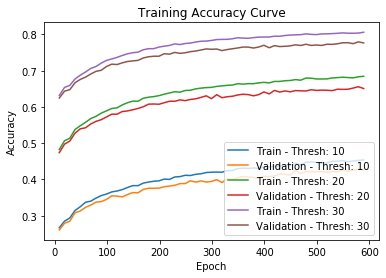

---[ITER 10] loss: 0.292682  time: 1.381
---[ITER 20] loss: 0.285432  time: 1.203
---[ITER 30] loss: 0.288077  time: 1.298
---[ITER 40] loss: 0.292999  time: 1.302
---[ITER 50] loss: 0.291271  time: 1.045
---[ITER 60] loss: 0.287626  time: 1.063
---[ITER 70] loss: 0.289427  time: 1.203
---[ITER 80] loss: 0.290709  time: 1.342
---[ITER 90] loss: 0.285980  time: 1.170
---[ITER 100] loss: 0.290087  time: 1.123
---[ITER 110] loss: 0.296867  time: 1.448
---[ITER 120] loss: 0.293943  time: 0.849
---[ITER 130] loss: 0.292179  time: 0.668
---[ITER 140] loss: 0.288284  time: 0.700
---[ITER 150] loss: 0.290975  time: 0.828
---[ITER 160] loss: 0.291968  time: 0.854
[EPOCH 591] loss: 0.290466  time: 18.028
---[ITER 10] loss: 0.286860  time: 0.990
---[ITER 20] loss: 0.288998  time: 0.731
---[ITER 30] loss: 0.292359  time: 0.985
---[ITER 40] loss: 0.287118  time: 0.768
---[ITER 50] loss: 0.293549  time: 0.608
---[ITER 60] loss: 0.289677  time: 0.666
---[ITER 70] loss: 0.290099  time: 0.622
---[ITER 

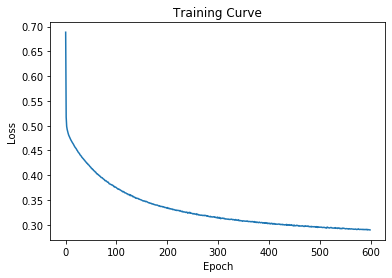

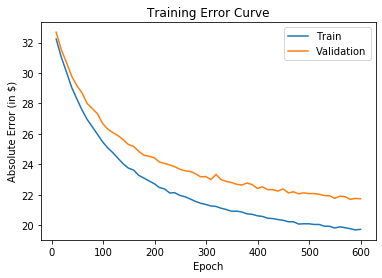

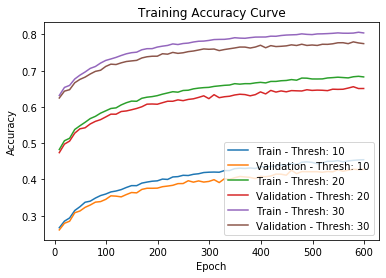

---[ITER 10] loss: 0.293953  time: 0.830
---[ITER 20] loss: 0.294888  time: 0.588
---[ITER 30] loss: 0.290683  time: 0.895
---[ITER 40] loss: 0.285642  time: 0.667
---[ITER 50] loss: 0.287908  time: 0.705
---[ITER 60] loss: 0.295120  time: 0.612
---[ITER 70] loss: 0.296371  time: 0.462
---[ITER 80] loss: 0.287333  time: 0.669
---[ITER 90] loss: 0.282517  time: 0.647
---[ITER 100] loss: 0.285733  time: 0.618
---[ITER 110] loss: 0.285895  time: 0.617
---[ITER 120] loss: 0.296311  time: 0.585
---[ITER 130] loss: 0.291070  time: 0.591
---[ITER 140] loss: 0.291419  time: 0.749
---[ITER 150] loss: 0.292224  time: 0.636
---[ITER 160] loss: 0.283997  time: 0.579
[EPOCH 601] loss: 0.289869  time: 10.981
---[ITER 10] loss: 0.290225  time: 0.815
---[ITER 20] loss: 0.295760  time: 0.631
---[ITER 30] loss: 0.291367  time: 0.715
---[ITER 40] loss: 0.288675  time: 0.608
---[ITER 50] loss: 0.290767  time: 0.597
---[ITER 60] loss: 0.295485  time: 0.613
---[ITER 70] loss: 0.285476  time: 0.537
---[ITER 

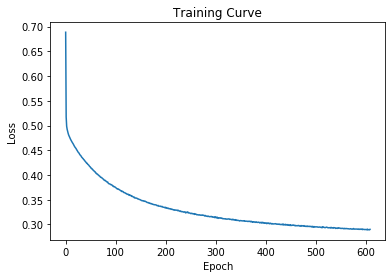

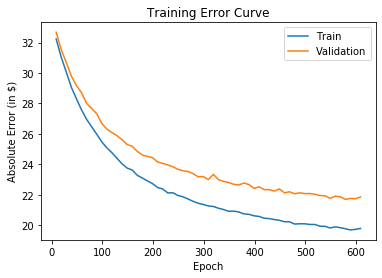

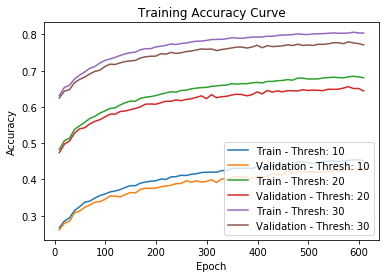

---[ITER 10] loss: 0.285151  time: 0.786
---[ITER 20] loss: 0.287406  time: 0.863
---[ITER 30] loss: 0.286932  time: 0.666
---[ITER 40] loss: 0.287001  time: 0.648
---[ITER 50] loss: 0.294606  time: 0.588
---[ITER 60] loss: 0.287257  time: 0.693
---[ITER 70] loss: 0.293166  time: 0.551
---[ITER 80] loss: 0.285243  time: 0.557
---[ITER 90] loss: 0.289014  time: 0.464
---[ITER 100] loss: 0.291034  time: 0.515
---[ITER 110] loss: 0.291279  time: 0.466
---[ITER 120] loss: 0.292285  time: 0.502
---[ITER 130] loss: 0.291541  time: 0.635
---[ITER 140] loss: 0.284217  time: 0.494
---[ITER 150] loss: 0.287289  time: 0.471
---[ITER 160] loss: 0.291942  time: 0.465
[EPOCH 611] loss: 0.288899  time: 9.677
---[ITER 10] loss: 0.290015  time: 0.678
---[ITER 20] loss: 0.291433  time: 0.745
---[ITER 30] loss: 0.283125  time: 0.434
---[ITER 40] loss: 0.292883  time: 0.508
---[ITER 50] loss: 0.289243  time: 0.458
---[ITER 60] loss: 0.289787  time: 0.509
---[ITER 70] loss: 0.290395  time: 0.501
---[ITER 8

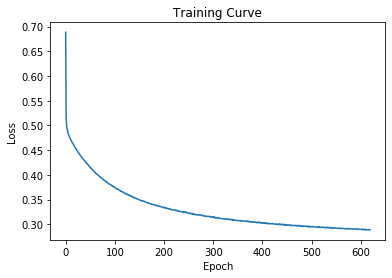

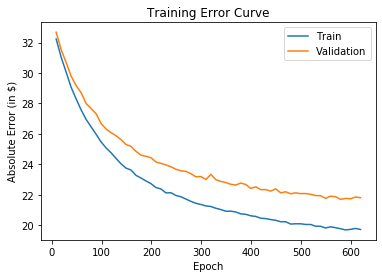

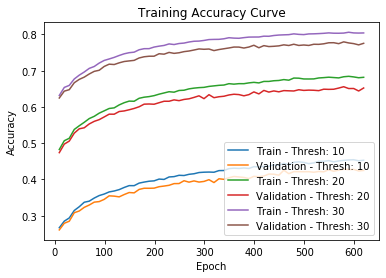

---[ITER 10] loss: 0.292926  time: 1.305
---[ITER 20] loss: 0.285230  time: 0.677
---[ITER 30] loss: 0.290552  time: 0.640
---[ITER 40] loss: 0.286328  time: 1.211
---[ITER 50] loss: 0.281775  time: 0.865
---[ITER 60] loss: 0.288409  time: 0.635
---[ITER 70] loss: 0.285330  time: 0.930
---[ITER 80] loss: 0.286712  time: 0.721
---[ITER 90] loss: 0.283526  time: 1.315
---[ITER 100] loss: 0.290863  time: 1.020
---[ITER 110] loss: 0.292619  time: 1.098
---[ITER 120] loss: 0.295163  time: 1.217
---[ITER 130] loss: 0.292766  time: 1.096
---[ITER 140] loss: 0.286042  time: 1.433
---[ITER 150] loss: 0.284937  time: 1.331
---[ITER 160] loss: 0.294205  time: 1.884
[EPOCH 621] loss: 0.288581  time: 18.587
---[ITER 10] loss: 0.285266  time: 1.549
---[ITER 20] loss: 0.287334  time: 1.153
---[ITER 30] loss: 0.280380  time: 1.148
---[ITER 40] loss: 0.290824  time: 0.710
---[ITER 50] loss: 0.287921  time: 0.614
---[ITER 60] loss: 0.285186  time: 0.751
---[ITER 70] loss: 0.287348  time: 0.696
---[ITER 

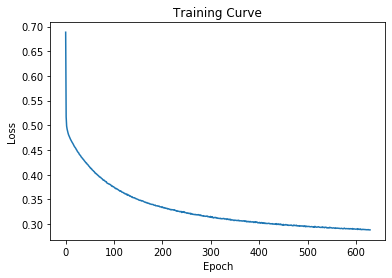

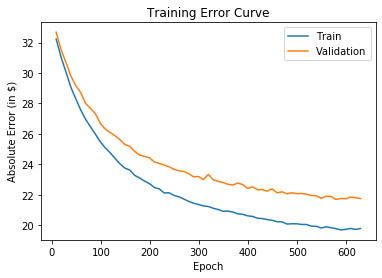

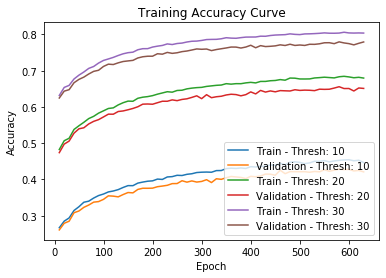

---[ITER 10] loss: 0.283633  time: 1.262
---[ITER 20] loss: 0.292451  time: 0.663
---[ITER 30] loss: 0.294098  time: 0.856
---[ITER 40] loss: 0.289502  time: 0.544
---[ITER 50] loss: 0.291192  time: 0.652
---[ITER 60] loss: 0.289064  time: 0.912
---[ITER 70] loss: 0.290596  time: 0.377
---[ITER 80] loss: 0.285260  time: 0.225
---[ITER 90] loss: 0.288865  time: 0.160
---[ITER 100] loss: 0.283191  time: 0.226
---[ITER 110] loss: 0.284342  time: 0.166
---[ITER 120] loss: 0.292528  time: 0.190
---[ITER 130] loss: 0.292749  time: 0.176
---[ITER 140] loss: 0.290633  time: 0.177
---[ITER 150] loss: 0.284050  time: 0.212
---[ITER 160] loss: 0.293410  time: 0.169
[EPOCH 631] loss: 0.289148  time: 7.119
---[ITER 10] loss: 0.284279  time: 0.253
---[ITER 20] loss: 0.291689  time: 0.197
---[ITER 30] loss: 0.287161  time: 0.296
---[ITER 40] loss: 0.286370  time: 0.151
---[ITER 50] loss: 0.291307  time: 0.164
---[ITER 60] loss: 0.286840  time: 0.183
---[ITER 70] loss: 0.287067  time: 0.158
---[ITER 8

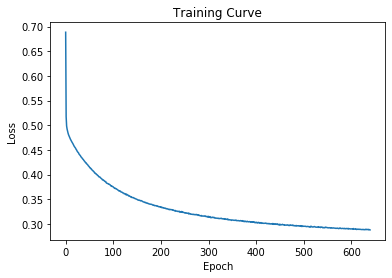

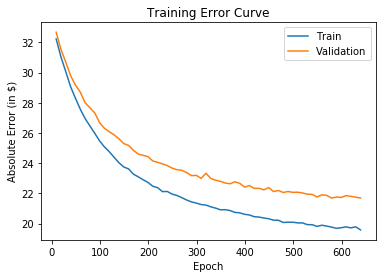

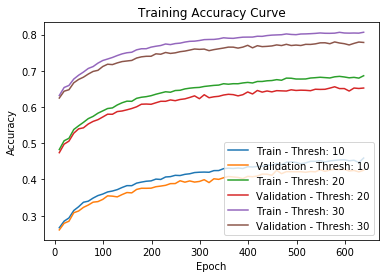

---[ITER 10] loss: 0.289400  time: 0.246
---[ITER 20] loss: 0.290425  time: 0.297
---[ITER 30] loss: 0.287654  time: 0.150
---[ITER 40] loss: 0.289903  time: 0.159
---[ITER 50] loss: 0.287271  time: 0.175
---[ITER 60] loss: 0.287705  time: 0.146
---[ITER 70] loss: 0.286167  time: 0.149
---[ITER 80] loss: 0.289667  time: 0.167
---[ITER 90] loss: 0.287328  time: 0.148
---[ITER 100] loss: 0.282442  time: 0.163
---[ITER 110] loss: 0.289552  time: 0.149
---[ITER 120] loss: 0.281668  time: 0.151
---[ITER 130] loss: 0.286461  time: 0.176
---[ITER 140] loss: 0.288625  time: 0.174
---[ITER 150] loss: 0.292880  time: 0.159
---[ITER 160] loss: 0.286103  time: 0.154
[EPOCH 641] loss: 0.287628  time: 2.895
---[ITER 10] loss: 0.288976  time: 0.240
---[ITER 20] loss: 0.283995  time: 0.259
---[ITER 30] loss: 0.285801  time: 0.147
---[ITER 40] loss: 0.289033  time: 0.152
---[ITER 50] loss: 0.288380  time: 0.164
---[ITER 60] loss: 0.289267  time: 0.177
---[ITER 70] loss: 0.286611  time: 0.188
---[ITER 8

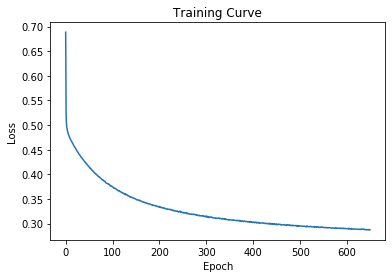

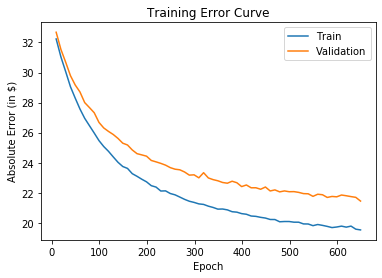

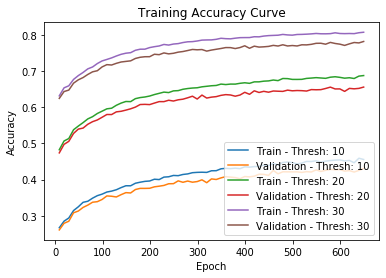

---[ITER 10] loss: 0.284287  time: 0.339
---[ITER 20] loss: 0.287398  time: 0.157
---[ITER 30] loss: 0.285321  time: 0.167
---[ITER 40] loss: 0.284329  time: 0.186
---[ITER 50] loss: 0.286935  time: 0.159
---[ITER 60] loss: 0.294680  time: 0.221
---[ITER 70] loss: 0.286887  time: 0.189
---[ITER 80] loss: 0.289694  time: 0.163
---[ITER 90] loss: 0.287250  time: 0.155
---[ITER 100] loss: 0.291130  time: 0.172
---[ITER 110] loss: 0.287124  time: 0.151
---[ITER 120] loss: 0.288767  time: 0.183
---[ITER 130] loss: 0.284073  time: 0.186
---[ITER 140] loss: 0.283830  time: 0.154
---[ITER 150] loss: 0.285017  time: 0.161
---[ITER 160] loss: 0.288155  time: 0.164
[EPOCH 651] loss: 0.287257  time: 3.041
---[ITER 10] loss: 0.289042  time: 0.363
---[ITER 20] loss: 0.290317  time: 0.158
---[ITER 30] loss: 0.288566  time: 0.139
---[ITER 40] loss: 0.283986  time: 0.153
---[ITER 50] loss: 0.289581  time: 0.171
---[ITER 60] loss: 0.284562  time: 0.172
---[ITER 70] loss: 0.288492  time: 0.154
---[ITER 8

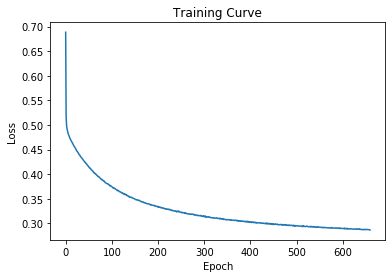

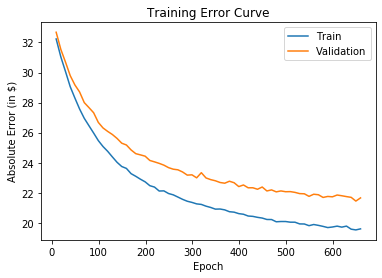

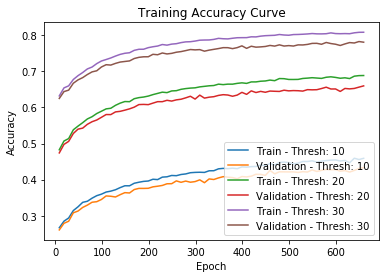

---[ITER 10] loss: 0.285336  time: 0.337
---[ITER 20] loss: 0.282738  time: 0.184
---[ITER 30] loss: 0.289655  time: 0.137
---[ITER 40] loss: 0.287441  time: 0.146
---[ITER 50] loss: 0.286496  time: 0.153
---[ITER 60] loss: 0.289418  time: 0.155
---[ITER 70] loss: 0.291306  time: 0.157
---[ITER 80] loss: 0.291422  time: 0.157
---[ITER 90] loss: 0.288122  time: 0.160
---[ITER 100] loss: 0.276501  time: 0.174
---[ITER 110] loss: 0.293728  time: 0.144
---[ITER 120] loss: 0.283446  time: 0.190
---[ITER 130] loss: 0.285663  time: 0.155
---[ITER 140] loss: 0.290458  time: 0.156
---[ITER 150] loss: 0.286602  time: 0.169
---[ITER 160] loss: 0.283193  time: 0.139
[EPOCH 661] loss: 0.287147  time: 2.856
---[ITER 10] loss: 0.289610  time: 0.339
---[ITER 20] loss: 0.288323  time: 0.156
---[ITER 30] loss: 0.284753  time: 0.191
---[ITER 40] loss: 0.290508  time: 0.129
---[ITER 50] loss: 0.294988  time: 0.162
---[ITER 60] loss: 0.282164  time: 0.155
---[ITER 70] loss: 0.279039  time: 0.150
---[ITER 8

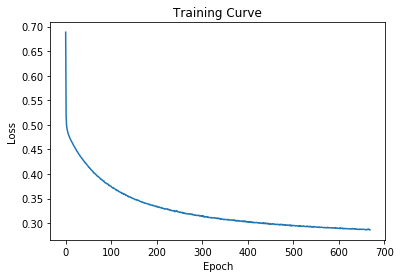

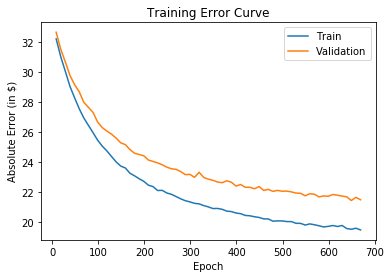

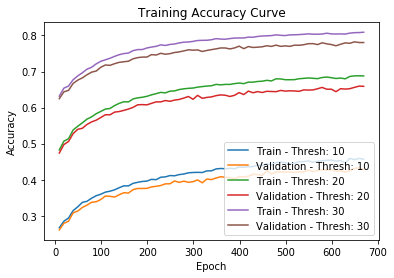

---[ITER 10] loss: 0.287734  time: 0.231
---[ITER 20] loss: 0.288260  time: 0.165
---[ITER 30] loss: 0.284936  time: 0.245
---[ITER 40] loss: 0.286921  time: 0.148
---[ITER 50] loss: 0.286438  time: 0.155
---[ITER 60] loss: 0.287598  time: 0.150
---[ITER 70] loss: 0.282755  time: 0.154
---[ITER 80] loss: 0.289782  time: 0.182
---[ITER 90] loss: 0.287045  time: 0.150
---[ITER 100] loss: 0.291389  time: 0.162
---[ITER 110] loss: 0.284714  time: 0.177
---[ITER 120] loss: 0.286868  time: 0.138
---[ITER 130] loss: 0.284345  time: 0.154
---[ITER 140] loss: 0.285491  time: 0.202
---[ITER 150] loss: 0.286260  time: 0.157
---[ITER 160] loss: 0.288484  time: 0.161
[EPOCH 671] loss: 0.287077  time: 2.860
---[ITER 10] loss: 0.289201  time: 0.223
---[ITER 20] loss: 0.286325  time: 0.140
---[ITER 30] loss: 0.282283  time: 0.290
---[ITER 40] loss: 0.291553  time: 0.140
---[ITER 50] loss: 0.287035  time: 0.153
---[ITER 60] loss: 0.280111  time: 0.155
---[ITER 70] loss: 0.289425  time: 0.153
---[ITER 8

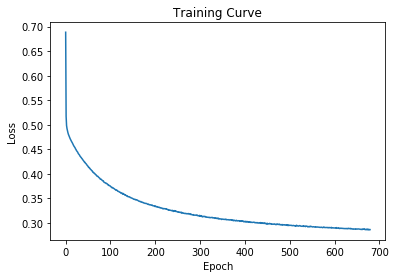

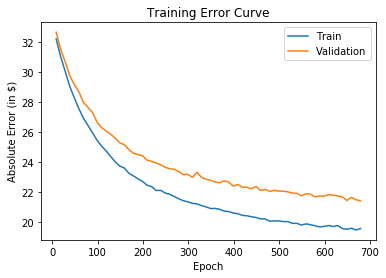

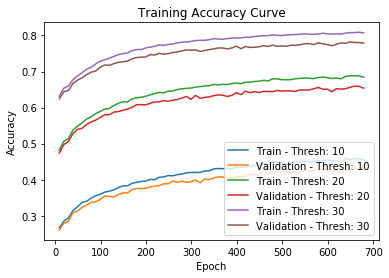

---[ITER 10] loss: 0.282491  time: 0.215
---[ITER 20] loss: 0.288715  time: 0.257
---[ITER 30] loss: 0.285044  time: 0.175
---[ITER 40] loss: 0.288573  time: 0.160
---[ITER 50] loss: 0.291385  time: 0.147
---[ITER 60] loss: 0.285149  time: 0.146
---[ITER 70] loss: 0.284575  time: 0.157
---[ITER 80] loss: 0.280270  time: 0.148
---[ITER 90] loss: 0.286707  time: 0.152
---[ITER 100] loss: 0.289863  time: 0.165
---[ITER 110] loss: 0.284540  time: 0.176
---[ITER 120] loss: 0.289036  time: 0.143
---[ITER 130] loss: 0.287172  time: 0.190
---[ITER 140] loss: 0.289540  time: 0.154
---[ITER 150] loss: 0.283842  time: 0.180
---[ITER 160] loss: 0.285436  time: 0.167
[EPOCH 681] loss: 0.286404  time: 2.873
---[ITER 10] loss: 0.283564  time: 0.224
---[ITER 20] loss: 0.286207  time: 0.265
---[ITER 30] loss: 0.281819  time: 0.159
---[ITER 40] loss: 0.283620  time: 0.164
---[ITER 50] loss: 0.284848  time: 0.192
---[ITER 60] loss: 0.287401  time: 0.138
---[ITER 70] loss: 0.278571  time: 0.162
---[ITER 8

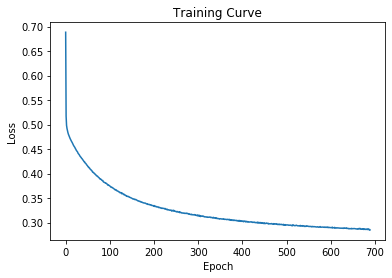

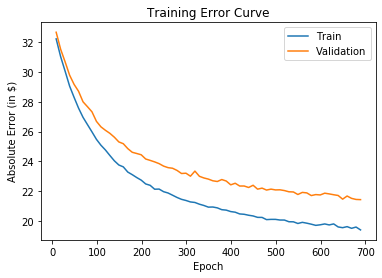

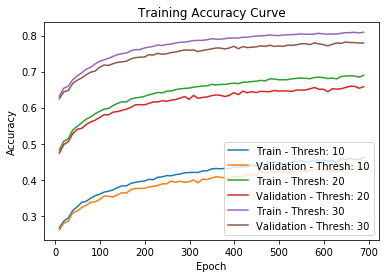

---[ITER 10] loss: 0.284832  time: 0.369
---[ITER 20] loss: 0.284333  time: 0.132
---[ITER 30] loss: 0.282401  time: 0.196
---[ITER 40] loss: 0.280770  time: 0.177
---[ITER 50] loss: 0.285950  time: 0.145
---[ITER 60] loss: 0.284814  time: 0.158
---[ITER 70] loss: 0.291908  time: 0.155
---[ITER 80] loss: 0.282508  time: 0.153
---[ITER 90] loss: 0.285535  time: 0.159
---[ITER 100] loss: 0.281524  time: 0.171
---[ITER 110] loss: 0.284939  time: 0.144
---[ITER 120] loss: 0.286082  time: 0.158
---[ITER 130] loss: 0.284397  time: 0.191
---[ITER 140] loss: 0.282661  time: 0.153
---[ITER 150] loss: 0.283147  time: 0.172
---[ITER 160] loss: 0.287977  time: 0.175
[EPOCH 691] loss: 0.284529  time: 2.941
---[ITER 10] loss: 0.288893  time: 0.348
---[ITER 20] loss: 0.284637  time: 0.154
---[ITER 30] loss: 0.287280  time: 0.165
---[ITER 40] loss: 0.289652  time: 0.161
---[ITER 50] loss: 0.289861  time: 0.159
---[ITER 60] loss: 0.284113  time: 0.153
---[ITER 70] loss: 0.285229  time: 0.167
---[ITER 8

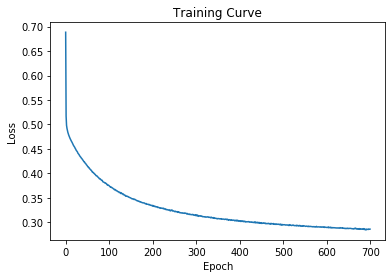

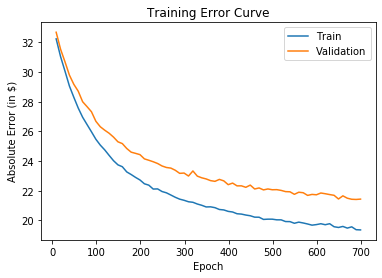

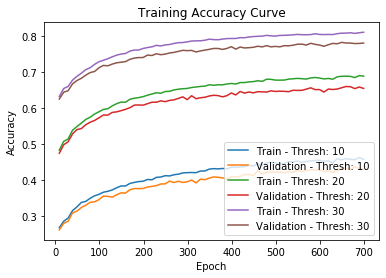

---[ITER 10] loss: 0.279915  time: 0.281
---[ITER 20] loss: 0.280574  time: 0.180
---[ITER 30] loss: 0.285579  time: 0.142
---[ITER 40] loss: 0.286063  time: 0.253
---[ITER 50] loss: 0.285788  time: 0.173
---[ITER 60] loss: 0.279813  time: 0.148
---[ITER 70] loss: 0.287696  time: 0.156
---[ITER 80] loss: 0.288959  time: 0.160
---[ITER 90] loss: 0.281931  time: 0.157
---[ITER 100] loss: 0.291777  time: 0.171
---[ITER 110] loss: 0.286528  time: 0.237
---[ITER 120] loss: 0.287482  time: 0.137
---[ITER 130] loss: 0.285428  time: 0.153
---[ITER 140] loss: 0.281534  time: 0.169
---[ITER 150] loss: 0.288404  time: 0.210
---[ITER 160] loss: 0.287350  time: 0.329
[EPOCH 701] loss: 0.285069  time: 3.307
---[ITER 10] loss: 0.283013  time: 0.602
---[ITER 20] loss: 0.287157  time: 0.283
---[ITER 30] loss: 0.286066  time: 0.358
---[ITER 40] loss: 0.285357  time: 0.482
---[ITER 50] loss: 0.293348  time: 0.247
---[ITER 60] loss: 0.282493  time: 0.246
---[ITER 70] loss: 0.280403  time: 0.458
---[ITER 8

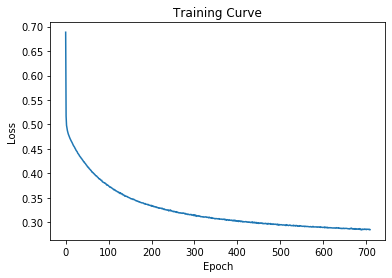

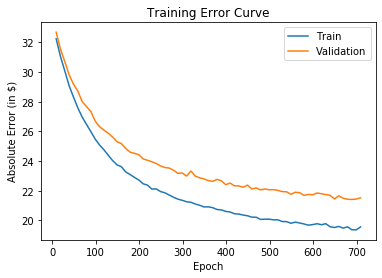

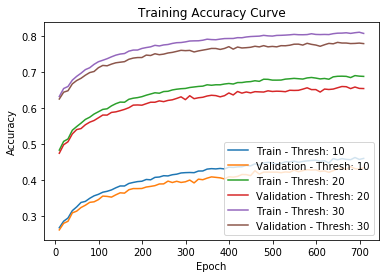

---[ITER 10] loss: 0.287385  time: 0.551
---[ITER 20] loss: 0.283085  time: 0.261
---[ITER 30] loss: 0.289572  time: 0.400
---[ITER 40] loss: 0.283819  time: 0.263
---[ITER 50] loss: 0.283876  time: 0.222
---[ITER 60] loss: 0.286821  time: 0.210
---[ITER 70] loss: 0.286784  time: 0.212
---[ITER 80] loss: 0.286110  time: 0.180
---[ITER 90] loss: 0.285888  time: 0.184
---[ITER 100] loss: 0.288323  time: 0.267
---[ITER 110] loss: 0.290187  time: 0.293
---[ITER 120] loss: 0.286550  time: 0.142
---[ITER 130] loss: 0.287271  time: 0.183
---[ITER 140] loss: 0.290129  time: 0.256
---[ITER 150] loss: 0.279597  time: 0.187
---[ITER 160] loss: 0.279773  time: 0.163
[EPOCH 711] loss: 0.286124  time: 4.177
---[ITER 10] loss: 0.290733  time: 0.282
---[ITER 20] loss: 0.282223  time: 0.176
---[ITER 30] loss: 0.289632  time: 0.330
---[ITER 40] loss: 0.286307  time: 0.152
---[ITER 50] loss: 0.280795  time: 0.171
---[ITER 60] loss: 0.280509  time: 0.189
---[ITER 70] loss: 0.284521  time: 0.198
---[ITER 8

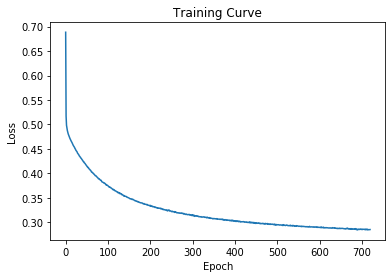

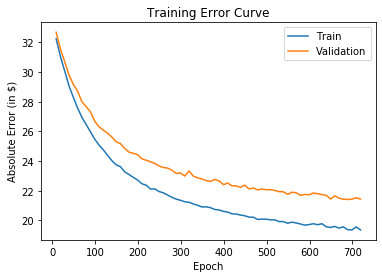

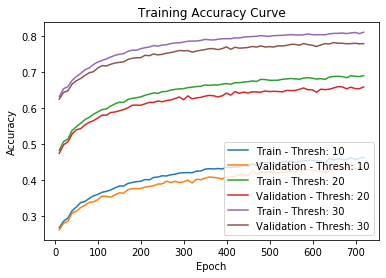

---[ITER 10] loss: 0.284260  time: 0.290
---[ITER 20] loss: 0.290876  time: 0.306
---[ITER 30] loss: 0.284526  time: 0.145
---[ITER 40] loss: 0.286077  time: 0.150
---[ITER 50] loss: 0.288205  time: 0.162
---[ITER 60] loss: 0.278053  time: 0.139
---[ITER 70] loss: 0.288363  time: 0.158
---[ITER 80] loss: 0.286463  time: 0.145
---[ITER 90] loss: 0.284025  time: 0.147
---[ITER 100] loss: 0.280381  time: 0.140
---[ITER 110] loss: 0.286367  time: 0.167
---[ITER 120] loss: 0.288691  time: 0.148
---[ITER 130] loss: 0.281174  time: 0.202
---[ITER 140] loss: 0.286175  time: 0.211
---[ITER 150] loss: 0.287904  time: 0.145
---[ITER 160] loss: 0.289853  time: 0.174
[EPOCH 721] loss: 0.285613  time: 2.962
---[ITER 10] loss: 0.279127  time: 0.225
---[ITER 20] loss: 0.282730  time: 0.294
---[ITER 30] loss: 0.279908  time: 0.146
---[ITER 40] loss: 0.279984  time: 0.180
---[ITER 50] loss: 0.281757  time: 0.201
---[ITER 60] loss: 0.282695  time: 0.267
---[ITER 70] loss: 0.282838  time: 0.169
---[ITER 8

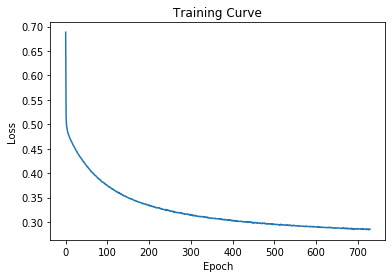

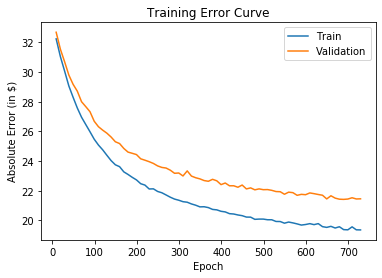

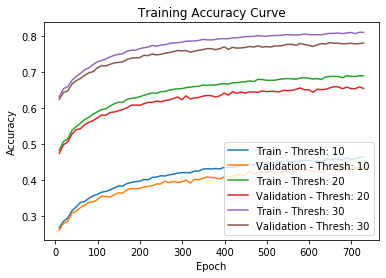

---[ITER 10] loss: 0.284514  time: 0.341
---[ITER 20] loss: 0.281891  time: 0.152
---[ITER 30] loss: 0.281080  time: 0.153
---[ITER 40] loss: 0.281094  time: 0.153
---[ITER 50] loss: 0.283150  time: 0.164
---[ITER 60] loss: 0.288014  time: 0.173
---[ITER 70] loss: 0.287772  time: 0.163
---[ITER 80] loss: 0.282445  time: 0.148
---[ITER 90] loss: 0.291704  time: 0.151
---[ITER 100] loss: 0.287450  time: 0.150
---[ITER 110] loss: 0.286824  time: 0.170
---[ITER 120] loss: 0.287789  time: 0.224
---[ITER 130] loss: 0.284932  time: 0.146
---[ITER 140] loss: 0.286421  time: 0.169
---[ITER 150] loss: 0.281718  time: 0.163
---[ITER 160] loss: 0.285662  time: 0.152
[EPOCH 731] loss: 0.284995  time: 2.908
---[ITER 10] loss: 0.282973  time: 0.370
---[ITER 20] loss: 0.288145  time: 0.150
---[ITER 30] loss: 0.288309  time: 0.161
---[ITER 40] loss: 0.277610  time: 0.157
---[ITER 50] loss: 0.283689  time: 0.181
---[ITER 60] loss: 0.285618  time: 0.198
---[ITER 70] loss: 0.285953  time: 0.150
---[ITER 8

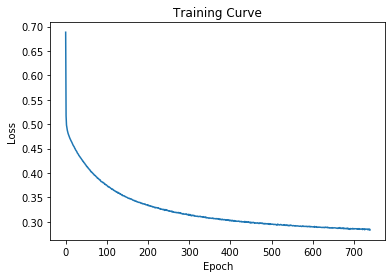

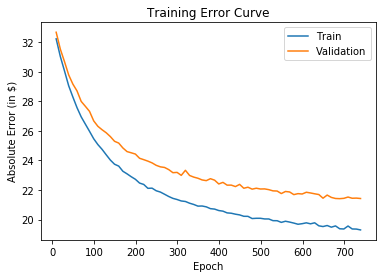

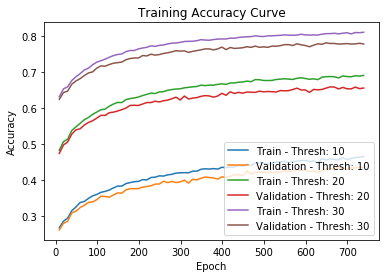

---[ITER 10] loss: 0.284291  time: 0.226
---[ITER 20] loss: 0.287370  time: 0.161
---[ITER 30] loss: 0.292561  time: 0.266
---[ITER 40] loss: 0.289248  time: 0.143
---[ITER 50] loss: 0.284910  time: 0.164
---[ITER 60] loss: 0.275881  time: 0.145
---[ITER 70] loss: 0.281020  time: 0.161
---[ITER 80] loss: 0.284416  time: 0.161
---[ITER 90] loss: 0.279806  time: 0.178
---[ITER 100] loss: 0.291085  time: 0.168
---[ITER 110] loss: 0.282561  time: 0.166
---[ITER 120] loss: 0.277041  time: 0.211
---[ITER 130] loss: 0.286241  time: 0.187
---[ITER 140] loss: 0.284182  time: 0.175
---[ITER 150] loss: 0.290860  time: 0.235
---[ITER 160] loss: 0.283964  time: 0.156
[EPOCH 741] loss: 0.284758  time: 3.030
---[ITER 10] loss: 0.282818  time: 0.254
---[ITER 20] loss: 0.288148  time: 0.178
---[ITER 30] loss: 0.287795  time: 0.289
---[ITER 40] loss: 0.283067  time: 0.142
---[ITER 50] loss: 0.276850  time: 0.165
---[ITER 60] loss: 0.280466  time: 0.151
---[ITER 70] loss: 0.283348  time: 0.183
---[ITER 8

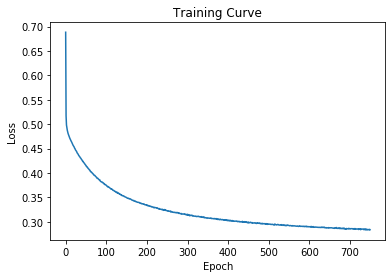

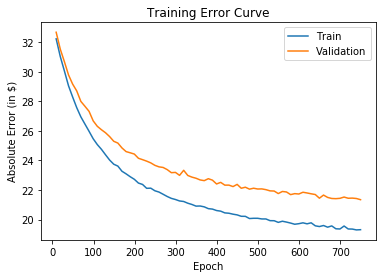

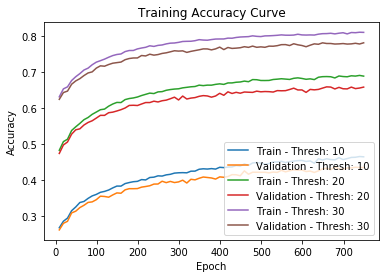

---[ITER 10] loss: 0.284386  time: 1.462
---[ITER 20] loss: 0.284911  time: 0.424
---[ITER 30] loss: 0.280873  time: 0.515
---[ITER 40] loss: 0.278788  time: 0.586
---[ITER 50] loss: 0.281864  time: 0.648
---[ITER 60] loss: 0.281784  time: 0.376
---[ITER 70] loss: 0.287153  time: 0.209
---[ITER 80] loss: 0.287541  time: 0.353
---[ITER 90] loss: 0.289056  time: 0.173
---[ITER 100] loss: 0.283973  time: 0.217
---[ITER 110] loss: 0.284903  time: 0.220
---[ITER 120] loss: 0.286491  time: 0.393
---[ITER 130] loss: 0.281716  time: 0.207
---[ITER 140] loss: 0.278015  time: 0.229
---[ITER 150] loss: 0.285704  time: 0.197
---[ITER 160] loss: 0.286473  time: 0.159
[EPOCH 751] loss: 0.283947  time: 6.501
---[ITER 10] loss: 0.282066  time: 0.261
---[ITER 20] loss: 0.284421  time: 0.292
---[ITER 30] loss: 0.282094  time: 0.329
---[ITER 40] loss: 0.283458  time: 0.172
---[ITER 50] loss: 0.284500  time: 0.524
---[ITER 60] loss: 0.282726  time: 0.378
---[ITER 70] loss: 0.289114  time: 0.209
---[ITER 8

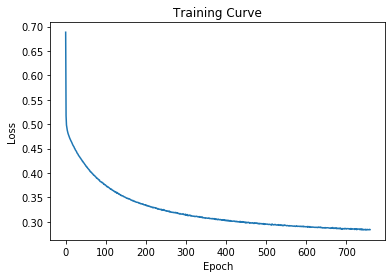

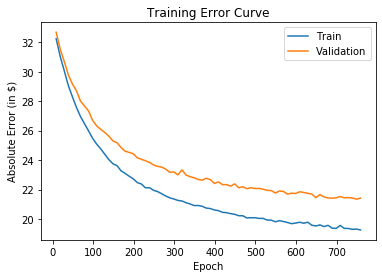

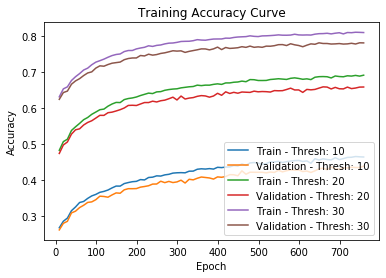

---[ITER 10] loss: 0.284603  time: 0.417
---[ITER 20] loss: 0.283529  time: 0.188
---[ITER 30] loss: 0.278031  time: 0.210
---[ITER 40] loss: 0.287229  time: 0.156
---[ITER 50] loss: 0.285253  time: 0.166
---[ITER 60] loss: 0.287035  time: 0.157
---[ITER 70] loss: 0.284641  time: 0.250
---[ITER 80] loss: 0.279166  time: 0.215
---[ITER 90] loss: 0.281373  time: 0.175
---[ITER 100] loss: 0.286889  time: 0.150
---[ITER 110] loss: 0.280154  time: 0.186
---[ITER 120] loss: 0.280072  time: 0.225
---[ITER 130] loss: 0.284785  time: 0.212
---[ITER 140] loss: 0.285137  time: 0.177
---[ITER 150] loss: 0.286053  time: 0.167
---[ITER 160] loss: 0.281641  time: 0.228
[EPOCH 761] loss: 0.283623  time: 3.453
---[ITER 10] loss: 0.283006  time: 0.421
---[ITER 20] loss: 0.287628  time: 0.174
---[ITER 30] loss: 0.290326  time: 0.207
---[ITER 40] loss: 0.285675  time: 0.184
---[ITER 50] loss: 0.279338  time: 0.200
---[ITER 60] loss: 0.281132  time: 0.141
---[ITER 70] loss: 0.283930  time: 0.311
---[ITER 8

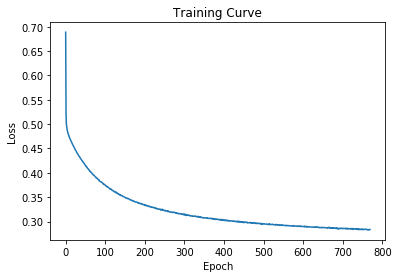

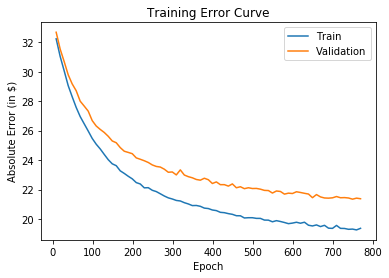

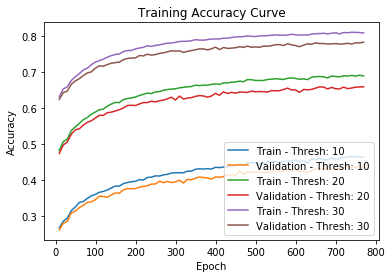

---[ITER 10] loss: 0.278823  time: 0.405
---[ITER 20] loss: 0.282383  time: 0.222
---[ITER 30] loss: 0.284114  time: 0.162
---[ITER 40] loss: 0.280701  time: 0.196
---[ITER 50] loss: 0.288755  time: 0.153
---[ITER 60] loss: 0.284271  time: 0.196
---[ITER 70] loss: 0.285008  time: 0.159
---[ITER 80] loss: 0.282349  time: 0.165
---[ITER 90] loss: 0.282088  time: 0.317
---[ITER 100] loss: 0.286340  time: 0.177
---[ITER 110] loss: 0.284371  time: 0.337
---[ITER 120] loss: 0.283848  time: 0.397
---[ITER 130] loss: 0.278726  time: 0.238
---[ITER 140] loss: 0.281220  time: 0.246
---[ITER 150] loss: 0.283350  time: 0.410
---[ITER 160] loss: 0.284660  time: 0.213
[EPOCH 771] loss: 0.283049  time: 4.140
---[ITER 10] loss: 0.279193  time: 0.560
---[ITER 20] loss: 0.284498  time: 0.343
---[ITER 30] loss: 0.282581  time: 0.173
---[ITER 40] loss: 0.277810  time: 0.245
---[ITER 50] loss: 0.285031  time: 0.188
---[ITER 60] loss: 0.286323  time: 0.179
---[ITER 70] loss: 0.281910  time: 0.185
---[ITER 8

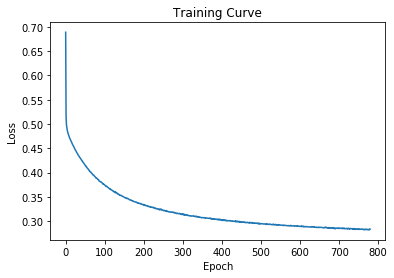

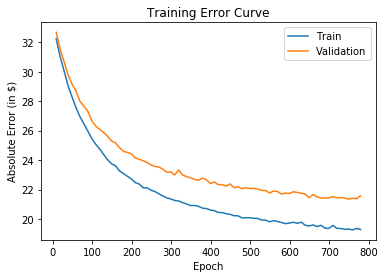

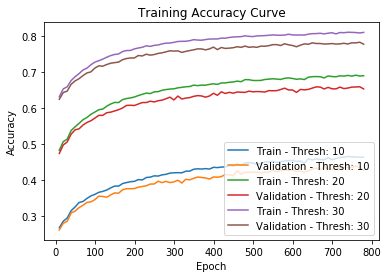

---[ITER 10] loss: 0.285533  time: 0.360
---[ITER 20] loss: 0.282615  time: 0.253
---[ITER 30] loss: 0.280332  time: 0.370
---[ITER 40] loss: 0.281296  time: 0.169
---[ITER 50] loss: 0.286747  time: 0.145
---[ITER 60] loss: 0.283730  time: 0.232
---[ITER 70] loss: 0.283318  time: 0.208
---[ITER 80] loss: 0.276399  time: 0.233
---[ITER 90] loss: 0.281515  time: 0.226
---[ITER 100] loss: 0.284928  time: 0.134
---[ITER 110] loss: 0.285562  time: 0.192
---[ITER 120] loss: 0.280899  time: 0.183
---[ITER 130] loss: 0.280319  time: 0.223
---[ITER 140] loss: 0.283488  time: 0.239
---[ITER 150] loss: 0.280673  time: 0.172
---[ITER 160] loss: 0.287668  time: 0.172
[EPOCH 781] loss: 0.282743  time: 3.696
---[ITER 10] loss: 0.282331  time: 0.232
---[ITER 20] loss: 0.284765  time: 0.169
---[ITER 30] loss: 0.286731  time: 0.283
---[ITER 40] loss: 0.276918  time: 0.146
---[ITER 50] loss: 0.281180  time: 0.161
---[ITER 60] loss: 0.279530  time: 0.153
---[ITER 70] loss: 0.285451  time: 0.191
---[ITER 8

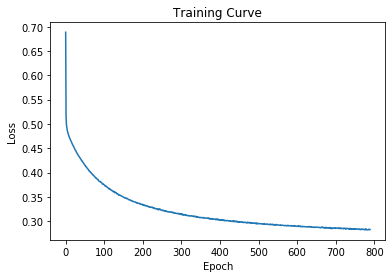

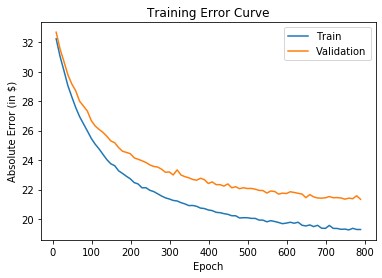

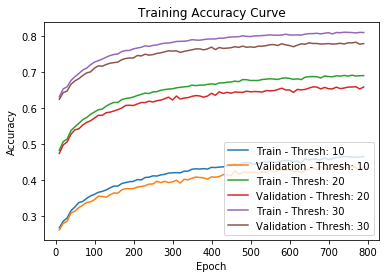

---[ITER 10] loss: 0.289224  time: 0.372
---[ITER 20] loss: 0.283370  time: 0.399
---[ITER 30] loss: 0.278871  time: 0.181
---[ITER 40] loss: 0.275418  time: 0.157
---[ITER 50] loss: 0.285572  time: 0.148
---[ITER 60] loss: 0.278470  time: 0.217
---[ITER 70] loss: 0.282224  time: 0.168
---[ITER 80] loss: 0.285415  time: 0.191
---[ITER 90] loss: 0.283691  time: 0.194
---[ITER 100] loss: 0.280684  time: 0.186
---[ITER 110] loss: 0.282626  time: 0.191
---[ITER 120] loss: 0.283410  time: 0.247
---[ITER 130] loss: 0.290450  time: 0.188
---[ITER 140] loss: 0.281014  time: 0.178
---[ITER 150] loss: 0.282378  time: 0.169
---[ITER 160] loss: 0.278640  time: 0.163
[EPOCH 791] loss: 0.282749  time: 3.487
---[ITER 10] loss: 0.278557  time: 0.266
---[ITER 20] loss: 0.281257  time: 0.253
---[ITER 30] loss: 0.282213  time: 0.153
---[ITER 40] loss: 0.280581  time: 0.174
---[ITER 50] loss: 0.289528  time: 0.166
---[ITER 60] loss: 0.280376  time: 0.171
---[ITER 70] loss: 0.280974  time: 0.161
---[ITER 8

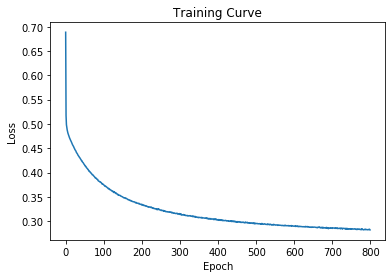

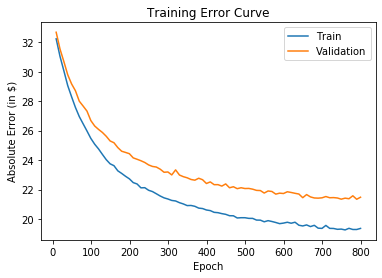

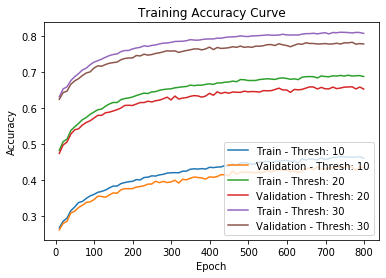

---[ITER 10] loss: 0.281606  time: 0.357
---[ITER 20] loss: 0.286044  time: 0.165
---[ITER 30] loss: 0.285388  time: 0.164
---[ITER 40] loss: 0.289180  time: 0.161
---[ITER 50] loss: 0.293582  time: 0.142
---[ITER 60] loss: 0.284982  time: 0.218
---[ITER 70] loss: 0.278389  time: 0.141
---[ITER 80] loss: 0.280558  time: 0.159
---[ITER 90] loss: 0.282142  time: 0.170
---[ITER 100] loss: 0.275009  time: 0.173
---[ITER 110] loss: 0.279291  time: 0.182
---[ITER 120] loss: 0.285783  time: 0.150
---[ITER 130] loss: 0.276675  time: 0.185
---[ITER 140] loss: 0.282945  time: 0.179
---[ITER 150] loss: 0.283031  time: 0.151
---[ITER 160] loss: 0.277762  time: 0.164
[EPOCH 801] loss: 0.282632  time: 3.074
---[ITER 10] loss: 0.282376  time: 0.427
---[ITER 20] loss: 0.283499  time: 0.194
---[ITER 30] loss: 0.283969  time: 0.155
---[ITER 40] loss: 0.285618  time: 0.195
---[ITER 50] loss: 0.280147  time: 0.160
---[ITER 60] loss: 0.276220  time: 0.159
---[ITER 70] loss: 0.278314  time: 0.163
---[ITER 8

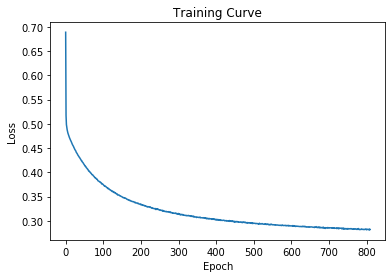

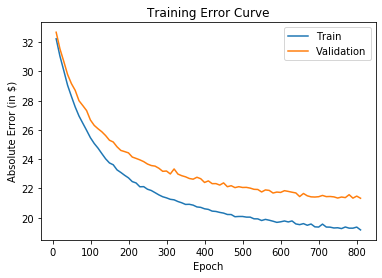

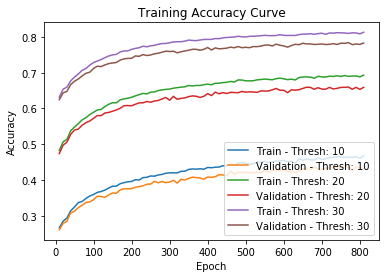

---[ITER 10] loss: 0.284254  time: 0.321
---[ITER 20] loss: 0.283746  time: 0.173
---[ITER 30] loss: 0.280608  time: 0.473
---[ITER 40] loss: 0.281565  time: 0.385
---[ITER 50] loss: 0.288286  time: 0.450
---[ITER 60] loss: 0.281861  time: 0.437
---[ITER 70] loss: 0.285354  time: 0.292
---[ITER 80] loss: 0.282264  time: 0.185
---[ITER 90] loss: 0.279508  time: 0.199
---[ITER 100] loss: 0.282442  time: 0.206
---[ITER 110] loss: 0.282570  time: 0.230
---[ITER 120] loss: 0.284201  time: 0.231
---[ITER 130] loss: 0.280308  time: 0.338
---[ITER 140] loss: 0.285527  time: 0.322
---[ITER 150] loss: 0.281265  time: 0.217
---[ITER 160] loss: 0.281618  time: 0.253
[EPOCH 811] loss: 0.282379  time: 4.876
---[ITER 10] loss: 0.278451  time: 0.279
---[ITER 20] loss: 0.280270  time: 0.166
---[ITER 30] loss: 0.281788  time: 0.394
---[ITER 40] loss: 0.277790  time: 0.345
---[ITER 50] loss: 0.281555  time: 0.185
---[ITER 60] loss: 0.285949  time: 0.166
---[ITER 70] loss: 0.284357  time: 0.200
---[ITER 8

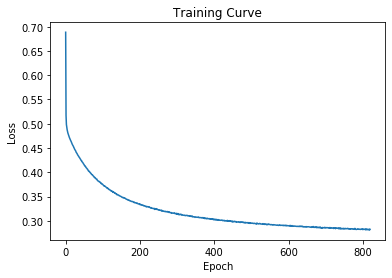

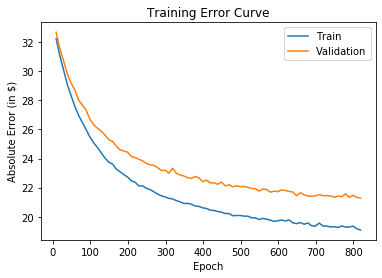

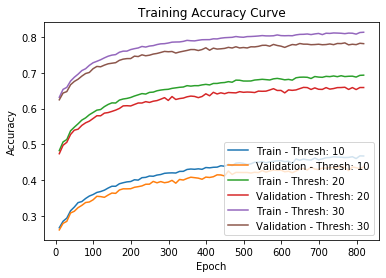

---[ITER 10] loss: 0.282582  time: 0.234
---[ITER 20] loss: 0.277039  time: 0.267
---[ITER 30] loss: 0.283599  time: 0.438
---[ITER 40] loss: 0.284305  time: 0.253
---[ITER 50] loss: 0.281022  time: 0.233
---[ITER 60] loss: 0.278158  time: 0.288
---[ITER 70] loss: 0.282100  time: 0.191
---[ITER 80] loss: 0.282322  time: 0.180
---[ITER 90] loss: 0.281943  time: 0.149
---[ITER 100] loss: 0.281585  time: 0.158
---[ITER 110] loss: 0.280869  time: 0.163
---[ITER 120] loss: 0.287908  time: 0.271
---[ITER 130] loss: 0.286786  time: 0.201
---[ITER 140] loss: 0.278076  time: 0.172
---[ITER 150] loss: 0.284474  time: 0.190
---[ITER 160] loss: 0.277091  time: 0.134
[EPOCH 821] loss: 0.281807  time: 3.659
---[ITER 10] loss: 0.278940  time: 0.215
---[ITER 20] loss: 0.273985  time: 0.174
---[ITER 30] loss: 0.283543  time: 0.259
---[ITER 40] loss: 0.282336  time: 0.192
---[ITER 50] loss: 0.277656  time: 0.147
---[ITER 60] loss: 0.279558  time: 0.162
---[ITER 70] loss: 0.283609  time: 0.153
---[ITER 8

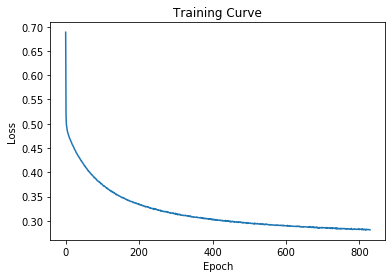

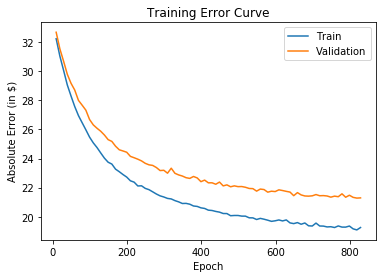

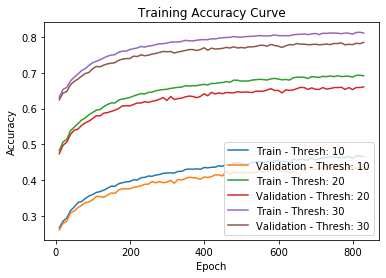

---[ITER 10] loss: 0.279593  time: 0.246
---[ITER 20] loss: 0.276917  time: 0.285
---[ITER 30] loss: 0.282578  time: 0.157
---[ITER 40] loss: 0.274548  time: 0.155
---[ITER 50] loss: 0.282044  time: 0.198
---[ITER 60] loss: 0.283626  time: 0.312
---[ITER 70] loss: 0.276261  time: 0.256
---[ITER 80] loss: 0.281171  time: 0.231
---[ITER 90] loss: 0.275414  time: 0.194
---[ITER 100] loss: 0.292668  time: 0.198
---[ITER 110] loss: 0.286449  time: 0.221
---[ITER 120] loss: 0.282562  time: 0.132
---[ITER 130] loss: 0.283675  time: 0.195
---[ITER 140] loss: 0.287183  time: 0.200
---[ITER 150] loss: 0.280722  time: 0.137
---[ITER 160] loss: 0.281954  time: 0.152
[EPOCH 831] loss: 0.281785  time: 3.425
---[ITER 10] loss: 0.284217  time: 0.208
---[ITER 20] loss: 0.284367  time: 0.291
---[ITER 30] loss: 0.286455  time: 0.201
---[ITER 40] loss: 0.277241  time: 0.173
---[ITER 50] loss: 0.278161  time: 0.130
---[ITER 60] loss: 0.277614  time: 0.190
---[ITER 70] loss: 0.287937  time: 0.207
---[ITER 8

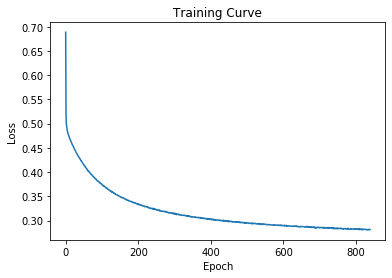

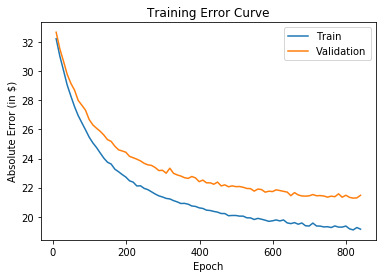

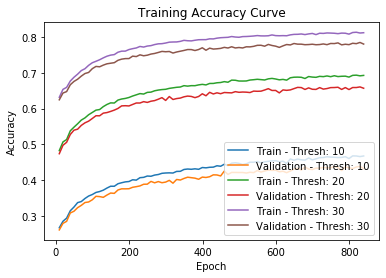

---[ITER 10] loss: 0.288809  time: 0.322
---[ITER 20] loss: 0.280607  time: 0.145
---[ITER 30] loss: 0.279084  time: 0.152
---[ITER 40] loss: 0.274205  time: 0.147
---[ITER 50] loss: 0.280279  time: 0.145
---[ITER 60] loss: 0.286124  time: 0.148
---[ITER 70] loss: 0.286353  time: 0.168
---[ITER 80] loss: 0.281907  time: 0.195
---[ITER 90] loss: 0.282256  time: 0.292
---[ITER 100] loss: 0.283222  time: 0.218
---[ITER 110] loss: 0.284126  time: 0.198
---[ITER 120] loss: 0.280313  time: 0.232
---[ITER 130] loss: 0.286367  time: 0.155
---[ITER 140] loss: 0.286408  time: 0.189
---[ITER 150] loss: 0.276638  time: 0.152
---[ITER 160] loss: 0.281116  time: 0.184
[EPOCH 841] loss: 0.281987  time: 3.192
---[ITER 10] loss: 0.275345  time: 0.455
---[ITER 20] loss: 0.282069  time: 0.242
---[ITER 30] loss: 0.282208  time: 0.265
---[ITER 40] loss: 0.284873  time: 0.256
---[ITER 50] loss: 0.280266  time: 0.462
---[ITER 60] loss: 0.281448  time: 0.600
---[ITER 70] loss: 0.287901  time: 0.621
---[ITER 8

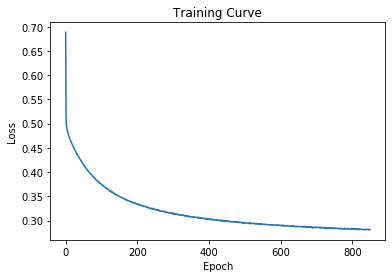

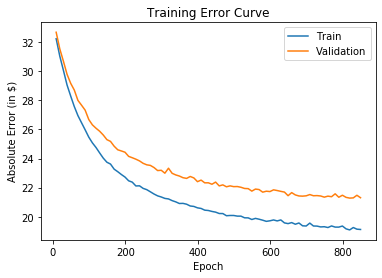

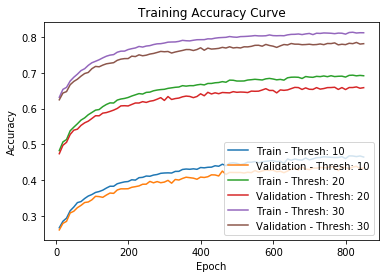

---[ITER 10] loss: 0.276831  time: 0.421
---[ITER 20] loss: 0.278963  time: 0.179
---[ITER 30] loss: 0.281826  time: 0.286
---[ITER 40] loss: 0.283128  time: 0.156
---[ITER 50] loss: 0.277763  time: 0.164
---[ITER 60] loss: 0.281583  time: 0.151
---[ITER 70] loss: 0.280820  time: 0.209
---[ITER 80] loss: 0.287189  time: 0.148
---[ITER 90] loss: 0.285001  time: 0.155
---[ITER 100] loss: 0.282087  time: 0.151
---[ITER 110] loss: 0.284322  time: 0.175
---[ITER 120] loss: 0.278839  time: 0.148
---[ITER 130] loss: 0.284528  time: 0.149
---[ITER 140] loss: 0.278888  time: 0.174
---[ITER 150] loss: 0.280047  time: 0.365
---[ITER 160] loss: 0.282651  time: 0.174
[EPOCH 851] loss: 0.281594  time: 3.438
---[ITER 10] loss: 0.279349  time: 0.342
---[ITER 20] loss: 0.286281  time: 0.220
---[ITER 30] loss: 0.276482  time: 0.309
---[ITER 40] loss: 0.280305  time: 0.156
---[ITER 50] loss: 0.279999  time: 0.339
---[ITER 60] loss: 0.286249  time: 0.263
---[ITER 70] loss: 0.281508  time: 0.180
---[ITER 8

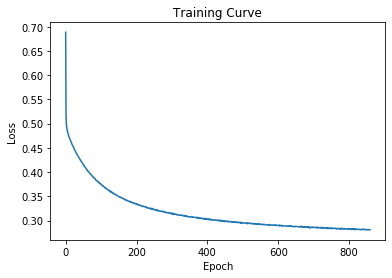

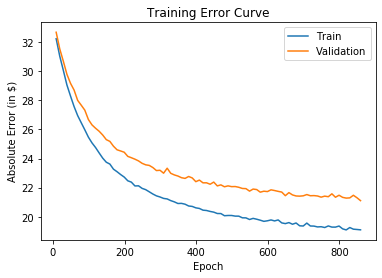

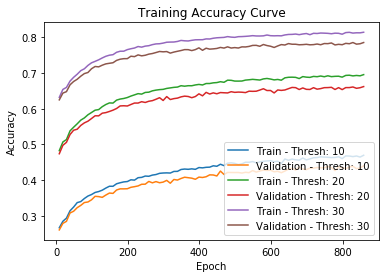

---[ITER 10] loss: 0.280939  time: 0.297
---[ITER 20] loss: 0.275063  time: 0.260
---[ITER 30] loss: 0.275025  time: 0.160
---[ITER 40] loss: 0.276321  time: 0.201
---[ITER 50] loss: 0.280149  time: 0.194
---[ITER 60] loss: 0.280345  time: 0.154
---[ITER 70] loss: 0.282343  time: 0.168
---[ITER 80] loss: 0.282111  time: 0.170
---[ITER 90] loss: 0.285678  time: 0.138
---[ITER 100] loss: 0.281710  time: 0.148
---[ITER 110] loss: 0.276391  time: 0.234
---[ITER 120] loss: 0.283555  time: 0.154
---[ITER 130] loss: 0.282931  time: 0.150
---[ITER 140] loss: 0.277535  time: 0.189
---[ITER 150] loss: 0.281506  time: 0.168
---[ITER 160] loss: 0.284359  time: 0.173
[EPOCH 861] loss: 0.280666  time: 3.120
---[ITER 10] loss: 0.284806  time: 0.223
---[ITER 20] loss: 0.283495  time: 0.254
---[ITER 30] loss: 0.275654  time: 0.182
---[ITER 40] loss: 0.281817  time: 0.148
---[ITER 50] loss: 0.279967  time: 0.166
---[ITER 60] loss: 0.277597  time: 0.138
---[ITER 70] loss: 0.282844  time: 0.153
---[ITER 8

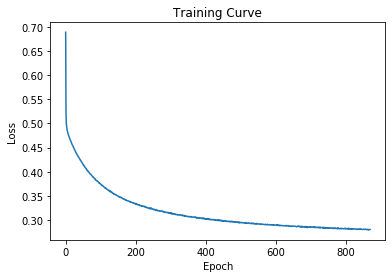

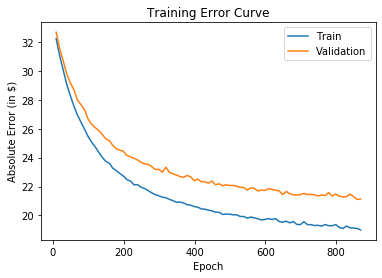

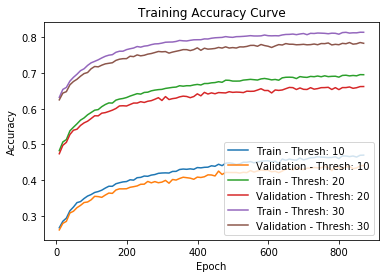

---[ITER 10] loss: 0.273621  time: 0.424
---[ITER 20] loss: 0.285754  time: 0.201
---[ITER 30] loss: 0.281756  time: 0.168
---[ITER 40] loss: 0.277064  time: 0.205
---[ITER 50] loss: 0.277337  time: 0.198
---[ITER 60] loss: 0.281933  time: 0.239
---[ITER 70] loss: 0.286064  time: 0.240
---[ITER 80] loss: 0.281319  time: 0.220
---[ITER 90] loss: 0.276032  time: 0.194
---[ITER 100] loss: 0.284350  time: 0.208
---[ITER 110] loss: 0.279440  time: 0.240
---[ITER 120] loss: 0.271412  time: 0.216
---[ITER 130] loss: 0.286479  time: 0.214
---[ITER 140] loss: 0.276933  time: 0.190
---[ITER 150] loss: 0.282201  time: 0.250
---[ITER 160] loss: 0.282375  time: 0.195
[EPOCH 871] loss: 0.280344  time: 3.754
---[ITER 10] loss: 0.280956  time: 0.402
---[ITER 20] loss: 0.278573  time: 0.198
---[ITER 30] loss: 0.278363  time: 0.205
---[ITER 40] loss: 0.277782  time: 0.206
---[ITER 50] loss: 0.277529  time: 0.213
---[ITER 60] loss: 0.277162  time: 0.192
---[ITER 70] loss: 0.278353  time: 0.217
---[ITER 8

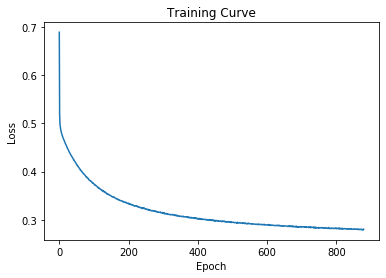

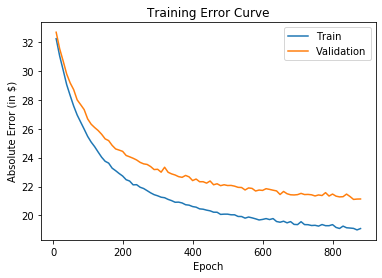

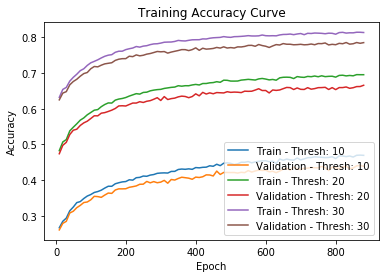

---[ITER 10] loss: 0.272169  time: 0.442
---[ITER 20] loss: 0.279540  time: 0.513
---[ITER 30] loss: 0.286592  time: 0.395
---[ITER 40] loss: 0.277481  time: 0.469
---[ITER 50] loss: 0.278132  time: 0.263
---[ITER 60] loss: 0.281302  time: 0.240
---[ITER 70] loss: 0.280255  time: 0.394
---[ITER 80] loss: 0.282373  time: 0.184
---[ITER 90] loss: 0.287114  time: 0.172
---[ITER 100] loss: 0.283822  time: 0.200
---[ITER 110] loss: 0.283311  time: 0.201
---[ITER 120] loss: 0.276173  time: 0.189
---[ITER 130] loss: 0.282123  time: 0.180
---[ITER 140] loss: 0.281661  time: 0.163
---[ITER 150] loss: 0.281030  time: 0.190
---[ITER 160] loss: 0.285389  time: 0.178
[EPOCH 881] loss: 0.280865  time: 4.544
---[ITER 10] loss: 0.278421  time: 0.366
---[ITER 20] loss: 0.282235  time: 0.162
---[ITER 30] loss: 0.278992  time: 0.285
---[ITER 40] loss: 0.280461  time: 0.191
---[ITER 50] loss: 0.287340  time: 0.190
---[ITER 60] loss: 0.286089  time: 0.148
---[ITER 70] loss: 0.279300  time: 0.208
---[ITER 8

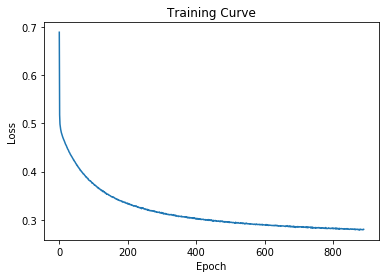

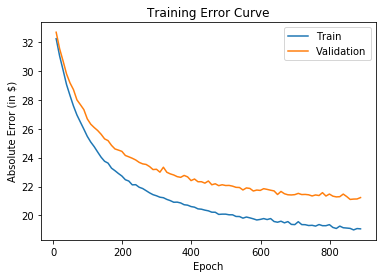

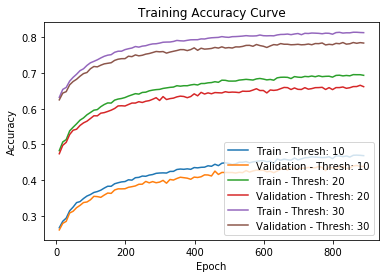

---[ITER 10] loss: 0.281857  time: 0.289
---[ITER 20] loss: 0.274253  time: 0.221
---[ITER 30] loss: 0.281769  time: 0.319
---[ITER 40] loss: 0.275685  time: 0.157
---[ITER 50] loss: 0.277210  time: 0.204
---[ITER 60] loss: 0.281820  time: 0.205
---[ITER 70] loss: 0.277346  time: 0.158
---[ITER 80] loss: 0.277252  time: 0.183
---[ITER 90] loss: 0.287311  time: 0.185
---[ITER 100] loss: 0.283104  time: 0.252
---[ITER 110] loss: 0.276069  time: 0.197
---[ITER 120] loss: 0.274658  time: 0.184
---[ITER 130] loss: 0.279998  time: 0.638
---[ITER 140] loss: 0.283196  time: 0.521
---[ITER 150] loss: 0.285923  time: 0.726
---[ITER 160] loss: 0.281559  time: 0.527
[EPOCH 891] loss: 0.279895  time: 5.502
---[ITER 10] loss: 0.279370  time: 0.626
---[ITER 20] loss: 0.282182  time: 0.458
---[ITER 30] loss: 0.278892  time: 0.402
---[ITER 40] loss: 0.276859  time: 0.243
---[ITER 50] loss: 0.285630  time: 0.228
---[ITER 60] loss: 0.280111  time: 0.182
---[ITER 70] loss: 0.282435  time: 0.184
---[ITER 8

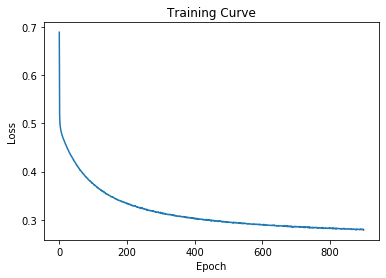

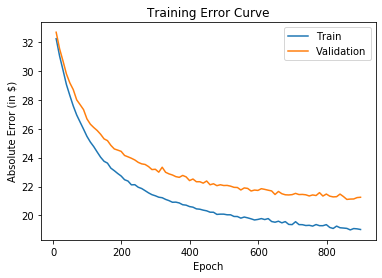

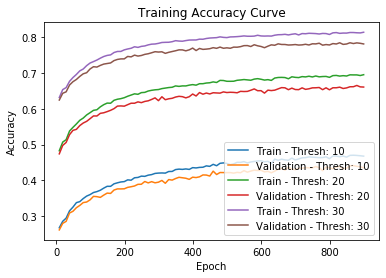

---[ITER 10] loss: 0.272795  time: 0.261
---[ITER 20] loss: 0.281539  time: 0.417
---[ITER 30] loss: 0.270468  time: 0.340
---[ITER 40] loss: 0.279213  time: 0.428
---[ITER 50] loss: 0.277959  time: 0.401
---[ITER 60] loss: 0.276036  time: 0.250
---[ITER 70] loss: 0.283620  time: 0.164
---[ITER 80] loss: 0.284564  time: 0.166
---[ITER 90] loss: 0.279802  time: 0.143
---[ITER 100] loss: 0.275829  time: 0.158
---[ITER 110] loss: 0.283550  time: 0.198
---[ITER 120] loss: 0.285153  time: 0.156
---[ITER 130] loss: 0.288142  time: 0.208
---[ITER 140] loss: 0.284156  time: 0.237
---[ITER 150] loss: 0.282351  time: 0.159
---[ITER 160] loss: 0.279682  time: 0.190
[EPOCH 901] loss: 0.280062  time: 4.014
---[ITER 10] loss: 0.277476  time: 0.240
---[ITER 20] loss: 0.278187  time: 0.358
---[ITER 30] loss: 0.283658  time: 0.201
---[ITER 40] loss: 0.278966  time: 0.317
---[ITER 50] loss: 0.277222  time: 0.339
---[ITER 60] loss: 0.282546  time: 0.230
---[ITER 70] loss: 0.281770  time: 0.245
---[ITER 8

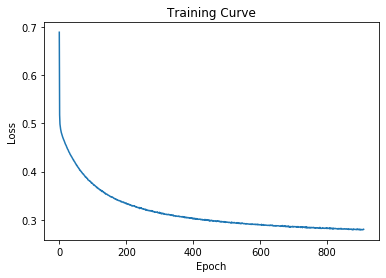

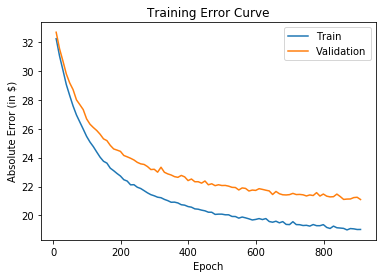

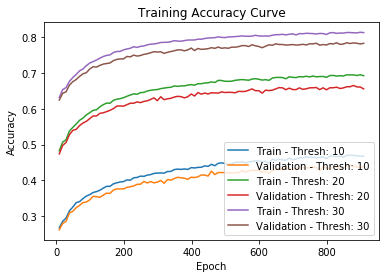

---[ITER 10] loss: 0.278759  time: 0.439
---[ITER 20] loss: 0.276149  time: 0.189
---[ITER 30] loss: 0.276549  time: 0.224
---[ITER 40] loss: 0.277467  time: 0.336
---[ITER 50] loss: 0.273930  time: 0.231
---[ITER 60] loss: 0.279635  time: 0.267
---[ITER 70] loss: 0.285204  time: 0.145
---[ITER 80] loss: 0.283280  time: 0.301
---[ITER 90] loss: 0.283034  time: 0.353
---[ITER 100] loss: 0.281320  time: 0.337
---[ITER 110] loss: 0.276012  time: 0.220
---[ITER 120] loss: 0.275329  time: 0.232
---[ITER 130] loss: 0.277602  time: 0.202
---[ITER 140] loss: 0.282721  time: 0.174
---[ITER 150] loss: 0.284791  time: 0.238
---[ITER 160] loss: 0.282943  time: 0.197
[EPOCH 911] loss: 0.279530  time: 4.277
---[ITER 10] loss: 0.275520  time: 0.377
---[ITER 20] loss: 0.283639  time: 0.216
---[ITER 30] loss: 0.277876  time: 0.188
---[ITER 40] loss: 0.279274  time: 0.261
---[ITER 50] loss: 0.282978  time: 0.578
---[ITER 60] loss: 0.284044  time: 0.531
---[ITER 70] loss: 0.284391  time: 0.314
---[ITER 8

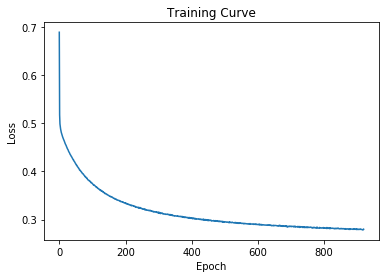

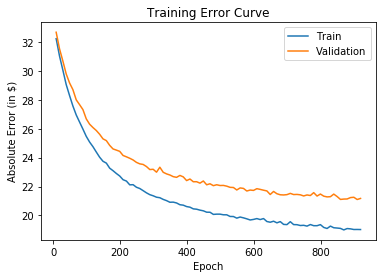

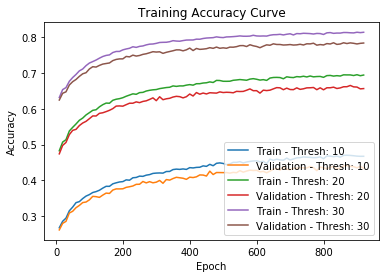

---[ITER 10] loss: 0.274600  time: 0.214
---[ITER 20] loss: 0.284373  time: 0.161
---[ITER 30] loss: 0.275105  time: 0.148
---[ITER 40] loss: 0.280156  time: 0.251
---[ITER 50] loss: 0.285185  time: 0.147
---[ITER 60] loss: 0.280006  time: 0.146
---[ITER 70] loss: 0.279259  time: 0.149
---[ITER 80] loss: 0.275496  time: 0.146
---[ITER 90] loss: 0.283665  time: 0.154
---[ITER 100] loss: 0.277397  time: 0.157
---[ITER 110] loss: 0.276710  time: 0.151
---[ITER 120] loss: 0.286413  time: 0.149
---[ITER 130] loss: 0.277478  time: 0.144
---[ITER 140] loss: 0.283367  time: 0.148
---[ITER 150] loss: 0.279522  time: 0.194
---[ITER 160] loss: 0.275467  time: 0.155
[EPOCH 921] loss: 0.279833  time: 2.759
---[ITER 10] loss: 0.275793  time: 0.221
---[ITER 20] loss: 0.278924  time: 0.142
---[ITER 30] loss: 0.280515  time: 0.239
---[ITER 40] loss: 0.284800  time: 0.146
---[ITER 50] loss: 0.282997  time: 0.153
---[ITER 60] loss: 0.280651  time: 0.139
---[ITER 70] loss: 0.276543  time: 0.152
---[ITER 8

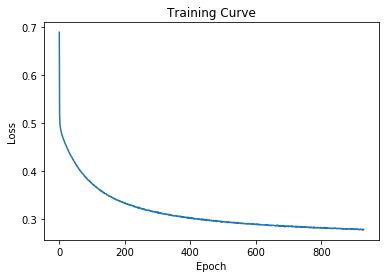

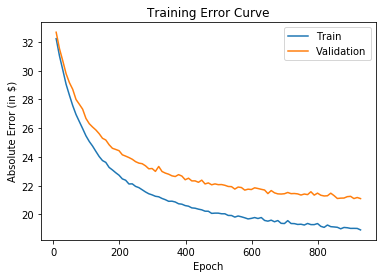

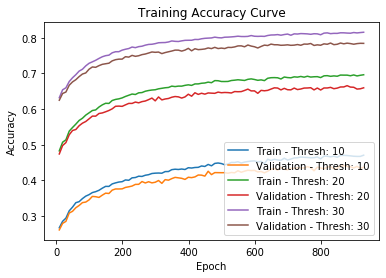

---[ITER 10] loss: 0.278090  time: 0.245
---[ITER 20] loss: 0.278368  time: 0.142
---[ITER 30] loss: 0.279089  time: 0.320
---[ITER 40] loss: 0.279058  time: 0.193
---[ITER 50] loss: 0.280059  time: 0.221
---[ITER 60] loss: 0.278478  time: 0.142
---[ITER 70] loss: 0.278246  time: 0.228
---[ITER 80] loss: 0.281803  time: 0.187
---[ITER 90] loss: 0.276954  time: 0.234
---[ITER 100] loss: 0.278734  time: 0.190
---[ITER 110] loss: 0.283932  time: 0.230
---[ITER 120] loss: 0.276689  time: 0.150
---[ITER 130] loss: 0.281678  time: 0.166
---[ITER 140] loss: 0.280995  time: 0.306
---[ITER 150] loss: 0.277542  time: 0.231
---[ITER 160] loss: 0.282116  time: 0.353
[EPOCH 931] loss: 0.279615  time: 3.875
---[ITER 10] loss: 0.274121  time: 0.379
---[ITER 20] loss: 0.285358  time: 0.165
---[ITER 30] loss: 0.281849  time: 0.273
---[ITER 40] loss: 0.271957  time: 0.265
---[ITER 50] loss: 0.275491  time: 0.166
---[ITER 60] loss: 0.274805  time: 0.208
---[ITER 70] loss: 0.277469  time: 0.161
---[ITER 8

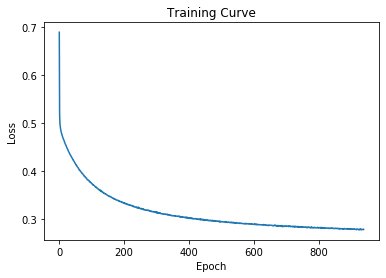

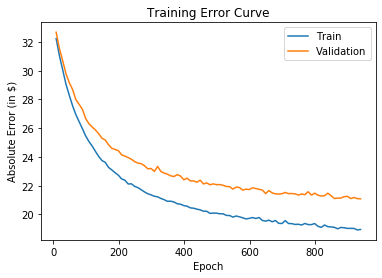

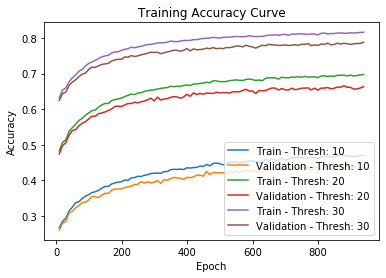

---[ITER 10] loss: 0.280760  time: 0.226
---[ITER 20] loss: 0.278634  time: 0.579
---[ITER 30] loss: 0.278619  time: 0.491
---[ITER 40] loss: 0.278644  time: 0.329
---[ITER 50] loss: 0.274427  time: 0.150
---[ITER 60] loss: 0.277965  time: 0.167
---[ITER 70] loss: 0.280519  time: 0.170
---[ITER 80] loss: 0.278135  time: 0.147
---[ITER 90] loss: 0.274930  time: 0.200
---[ITER 100] loss: 0.279323  time: 0.209
---[ITER 110] loss: 0.279182  time: 0.263
---[ITER 120] loss: 0.279377  time: 0.391
---[ITER 130] loss: 0.270718  time: 0.318
---[ITER 140] loss: 0.277069  time: 0.263
---[ITER 150] loss: 0.281922  time: 0.266
---[ITER 160] loss: 0.281861  time: 0.296
[EPOCH 941] loss: 0.278359  time: 4.653
---[ITER 10] loss: 0.280844  time: 0.384
---[ITER 20] loss: 0.289447  time: 0.558
---[ITER 30] loss: 0.274615  time: 0.212
---[ITER 40] loss: 0.278715  time: 0.242
---[ITER 50] loss: 0.278087  time: 0.173
---[ITER 60] loss: 0.278189  time: 0.187
---[ITER 70] loss: 0.275318  time: 0.371
---[ITER 8

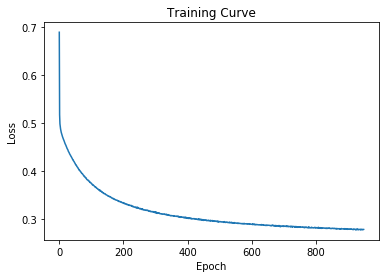

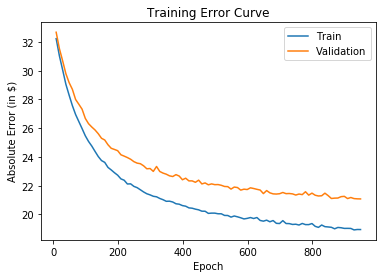

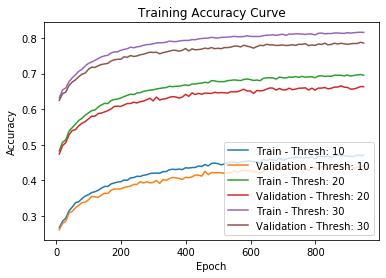

---[ITER 10] loss: 0.274857  time: 0.518
---[ITER 20] loss: 0.277630  time: 0.312
---[ITER 30] loss: 0.280487  time: 0.236
---[ITER 40] loss: 0.275130  time: 0.175
---[ITER 50] loss: 0.281164  time: 0.214
---[ITER 60] loss: 0.273373  time: 0.277
---[ITER 70] loss: 0.280831  time: 0.270
---[ITER 80] loss: 0.276908  time: 0.197
---[ITER 90] loss: 0.273653  time: 0.294
---[ITER 100] loss: 0.279467  time: 0.215
---[ITER 110] loss: 0.280716  time: 0.163
---[ITER 120] loss: 0.277083  time: 0.363
---[ITER 130] loss: 0.279186  time: 0.233
---[ITER 140] loss: 0.277400  time: 0.218
---[ITER 150] loss: 0.280023  time: 0.340
---[ITER 160] loss: 0.280283  time: 0.271
[EPOCH 951] loss: 0.278117  time: 4.483
---[ITER 10] loss: 0.277250  time: 0.569
---[ITER 20] loss: 0.274351  time: 0.191
---[ITER 30] loss: 0.276883  time: 0.223
---[ITER 40] loss: 0.284248  time: 0.197
---[ITER 50] loss: 0.280438  time: 0.262
---[ITER 60] loss: 0.279929  time: 0.345
---[ITER 70] loss: 0.275791  time: 0.310
---[ITER 8

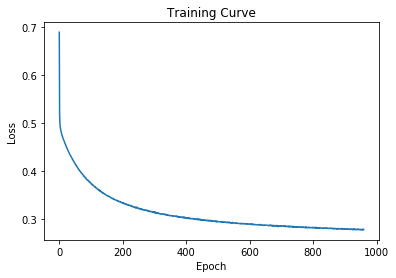

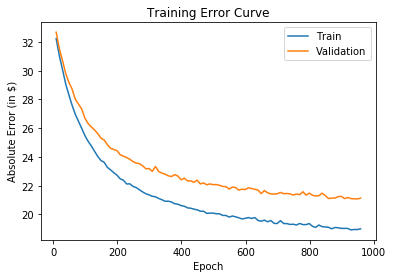

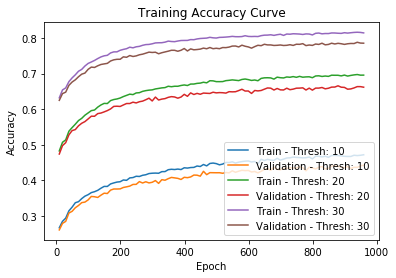

---[ITER 10] loss: 0.276391  time: 0.295
---[ITER 20] loss: 0.283678  time: 0.190
---[ITER 30] loss: 0.281816  time: 0.362
---[ITER 40] loss: 0.284717  time: 0.223
---[ITER 50] loss: 0.279209  time: 0.313
---[ITER 60] loss: 0.276607  time: 0.253
---[ITER 70] loss: 0.279149  time: 0.237
---[ITER 80] loss: 0.279450  time: 0.184
---[ITER 90] loss: 0.288553  time: 0.215
---[ITER 100] loss: 0.276938  time: 0.176
---[ITER 110] loss: 0.275608  time: 0.202
---[ITER 120] loss: 0.277673  time: 0.256
---[ITER 130] loss: 0.283465  time: 0.142
---[ITER 140] loss: 0.272895  time: 0.230
---[ITER 150] loss: 0.278996  time: 0.239
---[ITER 160] loss: 0.279660  time: 0.302
[EPOCH 961] loss: 0.279558  time: 3.965
---[ITER 10] loss: 0.278878  time: 0.274
---[ITER 20] loss: 0.279744  time: 0.157
---[ITER 30] loss: 0.281285  time: 0.282
---[ITER 40] loss: 0.279717  time: 0.166
---[ITER 50] loss: 0.279668  time: 0.190
---[ITER 60] loss: 0.275666  time: 0.152
---[ITER 70] loss: 0.283570  time: 0.161
---[ITER 8

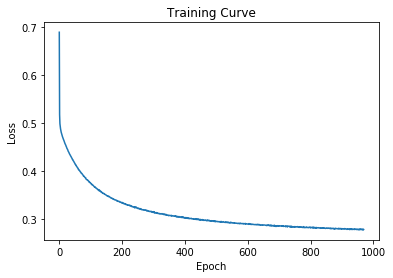

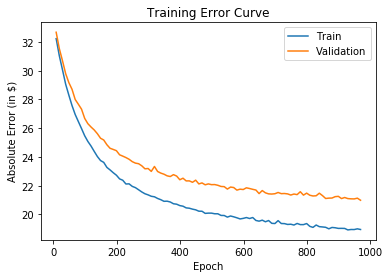

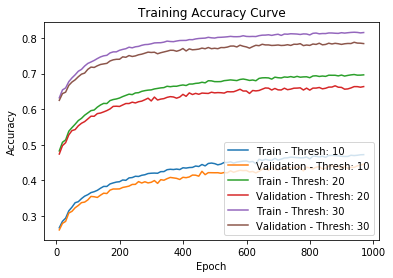

---[ITER 10] loss: 0.281078  time: 0.290
---[ITER 20] loss: 0.279662  time: 0.287
---[ITER 30] loss: 0.273224  time: 0.199
---[ITER 40] loss: 0.276528  time: 0.165
---[ITER 50] loss: 0.280670  time: 0.199
---[ITER 60] loss: 0.274373  time: 0.169
---[ITER 70] loss: 0.277324  time: 0.219
---[ITER 80] loss: 0.279394  time: 0.191
---[ITER 90] loss: 0.276291  time: 0.211
---[ITER 100] loss: 0.286301  time: 0.197
---[ITER 110] loss: 0.277927  time: 0.179
---[ITER 120] loss: 0.282334  time: 0.168
---[ITER 130] loss: 0.283057  time: 0.250
---[ITER 140] loss: 0.273606  time: 0.162
---[ITER 150] loss: 0.274488  time: 0.216
---[ITER 160] loss: 0.275713  time: 0.143
[EPOCH 971] loss: 0.277950  time: 3.435
---[ITER 10] loss: 0.273227  time: 0.235
---[ITER 20] loss: 0.277051  time: 0.281
---[ITER 30] loss: 0.287363  time: 0.181
---[ITER 40] loss: 0.277226  time: 0.150
---[ITER 50] loss: 0.274345  time: 0.165
---[ITER 60] loss: 0.278930  time: 0.157
---[ITER 70] loss: 0.278617  time: 0.157
---[ITER 8

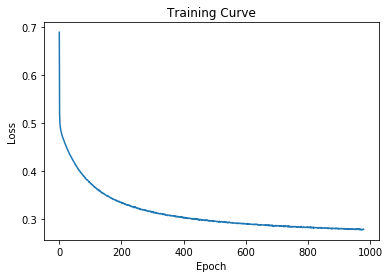

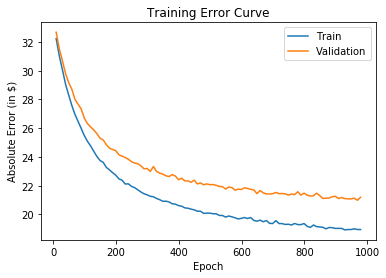

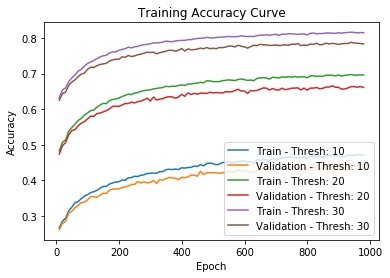

---[ITER 10] loss: 0.283697  time: 0.352
---[ITER 20] loss: 0.276388  time: 0.164
---[ITER 30] loss: 0.279976  time: 0.162
---[ITER 40] loss: 0.276373  time: 0.153
---[ITER 50] loss: 0.278531  time: 0.165
---[ITER 60] loss: 0.282089  time: 0.149
---[ITER 70] loss: 0.281514  time: 0.184
---[ITER 80] loss: 0.279733  time: 0.189
---[ITER 90] loss: 0.274492  time: 0.148
---[ITER 100] loss: 0.274946  time: 0.152
---[ITER 110] loss: 0.276640  time: 0.171
---[ITER 120] loss: 0.281981  time: 0.144
---[ITER 130] loss: 0.271447  time: 0.197
---[ITER 140] loss: 0.283141  time: 0.178
---[ITER 150] loss: 0.276581  time: 0.160
---[ITER 160] loss: 0.277964  time: 0.158
[EPOCH 981] loss: 0.278578  time: 2.966
---[ITER 10] loss: 0.279793  time: 0.355
---[ITER 20] loss: 0.272212  time: 0.170
---[ITER 30] loss: 0.275488  time: 0.158
---[ITER 40] loss: 0.285245  time: 0.157
---[ITER 50] loss: 0.270282  time: 0.157
---[ITER 60] loss: 0.276451  time: 0.159
---[ITER 70] loss: 0.282123  time: 0.145
---[ITER 8

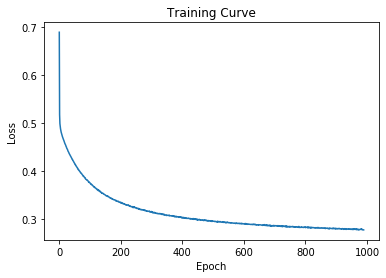

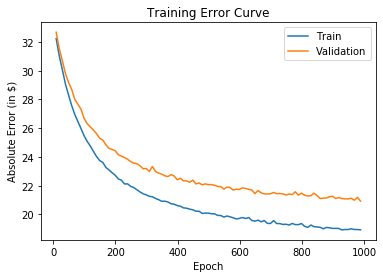

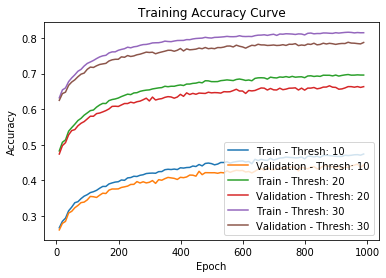

---[ITER 10] loss: 0.279929  time: 0.340
---[ITER 20] loss: 0.276999  time: 0.183
---[ITER 30] loss: 0.281718  time: 0.184
---[ITER 40] loss: 0.281163  time: 0.148
---[ITER 50] loss: 0.276956  time: 0.150
---[ITER 60] loss: 0.269553  time: 0.152
---[ITER 70] loss: 0.275194  time: 0.141
---[ITER 80] loss: 0.279775  time: 0.163
---[ITER 90] loss: 0.276973  time: 0.160
---[ITER 100] loss: 0.277927  time: 0.172
---[ITER 110] loss: 0.277381  time: 0.152
---[ITER 120] loss: 0.281513  time: 0.194
---[ITER 130] loss: 0.282065  time: 0.163
---[ITER 140] loss: 0.275008  time: 0.155
---[ITER 150] loss: 0.277331  time: 0.182
---[ITER 160] loss: 0.275736  time: 0.192
[EPOCH 991] loss: 0.278016  time: 2.961
---[ITER 10] loss: 0.275164  time: 0.351
---[ITER 20] loss: 0.279549  time: 0.156
---[ITER 30] loss: 0.271614  time: 0.165
---[ITER 40] loss: 0.277960  time: 0.177
---[ITER 50] loss: 0.271605  time: 0.149
---[ITER 60] loss: 0.284223  time: 0.146
---[ITER 70] loss: 0.274777  time: 0.160
---[ITER 8

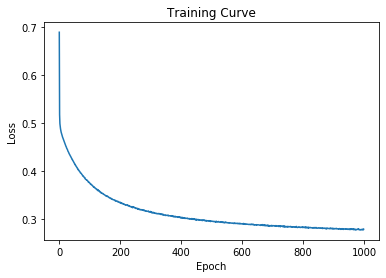

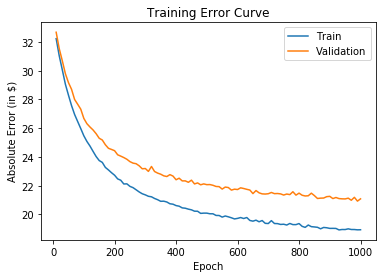

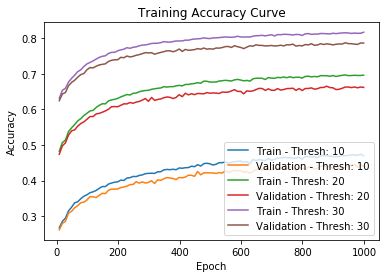

---[ITER 10] loss: 0.273133  time: 0.245
---[ITER 20] loss: 0.266998  time: 0.154
---[ITER 30] loss: 0.275315  time: 0.274
---[ITER 40] loss: 0.277259  time: 0.151
---[ITER 50] loss: 0.276091  time: 0.154
---[ITER 60] loss: 0.277109  time: 0.175
---[ITER 70] loss: 0.278003  time: 0.191
---[ITER 80] loss: 0.285411  time: 0.144
---[ITER 90] loss: 0.279623  time: 0.176
---[ITER 100] loss: 0.277321  time: 0.152
---[ITER 110] loss: 0.272746  time: 0.149
---[ITER 120] loss: 0.271725  time: 0.162
---[ITER 130] loss: 0.276994  time: 0.180
---[ITER 140] loss: 0.281743  time: 0.181
---[ITER 150] loss: 0.277801  time: 0.161
---[ITER 160] loss: 0.279377  time: 0.248
[EPOCH 1001] loss: 0.276923  time: 3.077
---[ITER 10] loss: 0.276597  time: 0.241
---[ITER 20] loss: 0.273219  time: 0.158
---[ITER 30] loss: 0.277913  time: 0.253
---[ITER 40] loss: 0.280824  time: 0.159
---[ITER 50] loss: 0.282584  time: 0.187
---[ITER 60] loss: 0.276593  time: 0.159
---[ITER 70] loss: 0.279083  time: 0.168
---[ITER 

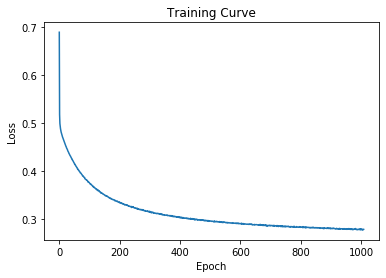

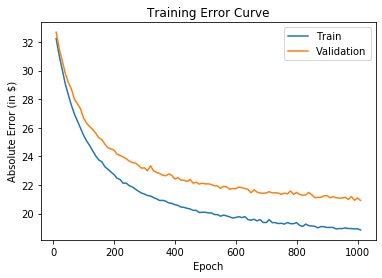

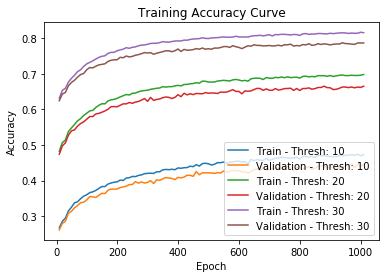

---[ITER 10] loss: 0.283163  time: 0.234
---[ITER 20] loss: 0.271088  time: 0.270
---[ITER 30] loss: 0.274650  time: 0.150
---[ITER 40] loss: 0.273819  time: 0.151
---[ITER 50] loss: 0.278569  time: 0.155
---[ITER 60] loss: 0.274937  time: 0.175
---[ITER 70] loss: 0.278979  time: 0.162
---[ITER 80] loss: 0.279064  time: 0.165
---[ITER 90] loss: 0.280162  time: 0.158
---[ITER 100] loss: 0.274529  time: 0.158
---[ITER 110] loss: 0.279127  time: 0.149
---[ITER 120] loss: 0.274444  time: 0.163
---[ITER 130] loss: 0.273173  time: 0.191
---[ITER 140] loss: 0.277414  time: 0.177
---[ITER 150] loss: 0.276748  time: 0.157
---[ITER 160] loss: 0.273098  time: 0.143
[EPOCH 1011] loss: 0.276680  time: 2.901
---[ITER 10] loss: 0.279782  time: 0.233
---[ITER 20] loss: 0.277465  time: 0.344
---[ITER 30] loss: 0.282608  time: 0.164
---[ITER 40] loss: 0.276212  time: 0.154
---[ITER 50] loss: 0.281072  time: 0.164
---[ITER 60] loss: 0.277230  time: 0.175
---[ITER 70] loss: 0.276397  time: 0.183
---[ITER 

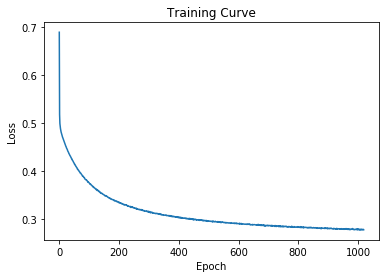

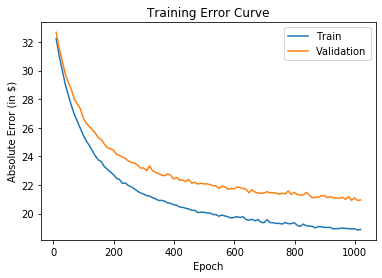

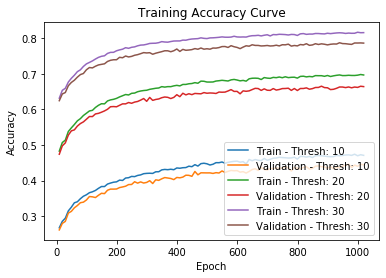

---[ITER 10] loss: 0.277967  time: 0.557
---[ITER 20] loss: 0.280397  time: 0.571
---[ITER 30] loss: 0.277482  time: 0.165
---[ITER 40] loss: 0.277280  time: 0.182
---[ITER 50] loss: 0.279928  time: 0.388
---[ITER 60] loss: 0.274243  time: 0.216
---[ITER 70] loss: 0.278015  time: 0.167
---[ITER 80] loss: 0.271949  time: 0.341
---[ITER 90] loss: 0.279076  time: 0.317
---[ITER 100] loss: 0.278190  time: 0.197
---[ITER 110] loss: 0.277104  time: 0.276
---[ITER 120] loss: 0.273605  time: 0.210
---[ITER 130] loss: 0.274650  time: 0.359
---[ITER 140] loss: 0.280189  time: 0.221
---[ITER 150] loss: 0.282542  time: 0.218
---[ITER 160] loss: 0.279679  time: 0.385
[EPOCH 1021] loss: 0.277856  time: 5.016
---[ITER 10] loss: 0.273807  time: 0.539
---[ITER 20] loss: 0.274019  time: 0.288
---[ITER 30] loss: 0.279029  time: 0.247
---[ITER 40] loss: 0.279306  time: 0.309
---[ITER 50] loss: 0.278818  time: 0.143
---[ITER 60] loss: 0.274692  time: 0.171
---[ITER 70] loss: 0.280601  time: 0.193
---[ITER 

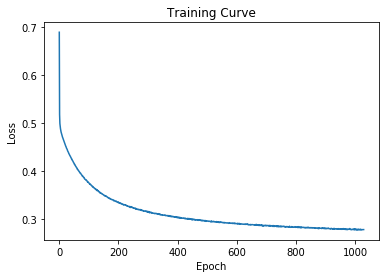

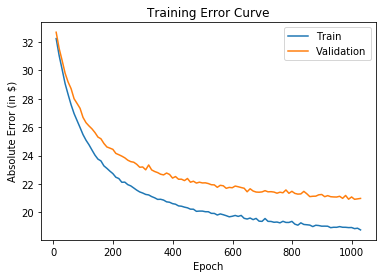

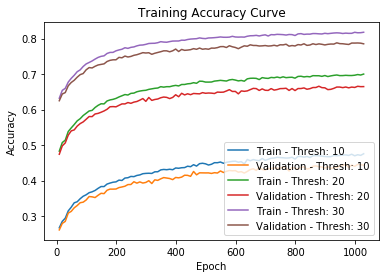

---[ITER 10] loss: 0.277901  time: 0.282
---[ITER 20] loss: 0.274401  time: 0.177
---[ITER 30] loss: 0.276314  time: 0.251
---[ITER 40] loss: 0.274949  time: 0.280
---[ITER 50] loss: 0.278371  time: 0.233
---[ITER 60] loss: 0.273040  time: 0.208
---[ITER 70] loss: 0.276747  time: 0.220
---[ITER 80] loss: 0.276678  time: 0.199
---[ITER 90] loss: 0.281663  time: 0.267
---[ITER 100] loss: 0.272588  time: 0.187
---[ITER 110] loss: 0.281768  time: 0.191
---[ITER 120] loss: 0.278777  time: 0.224
---[ITER 130] loss: 0.274562  time: 0.173
---[ITER 140] loss: 0.274361  time: 0.231
---[ITER 150] loss: 0.272123  time: 0.538
---[ITER 160] loss: 0.276919  time: 0.401
[EPOCH 1031] loss: 0.276245  time: 4.199
---[ITER 10] loss: 0.277668  time: 0.272
---[ITER 20] loss: 0.276235  time: 0.249
---[ITER 30] loss: 0.277961  time: 0.194
---[ITER 40] loss: 0.280525  time: 0.466
---[ITER 50] loss: 0.281456  time: 0.152
---[ITER 60] loss: 0.276281  time: 0.254
---[ITER 70] loss: 0.284024  time: 0.174
---[ITER 

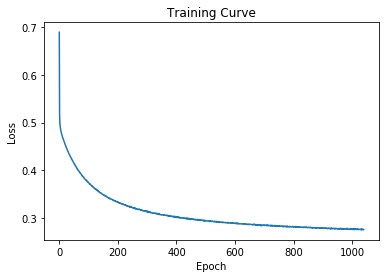

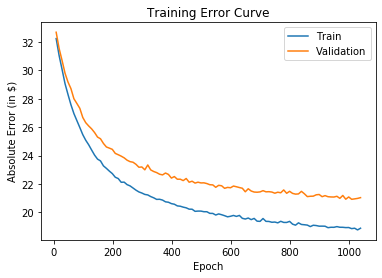

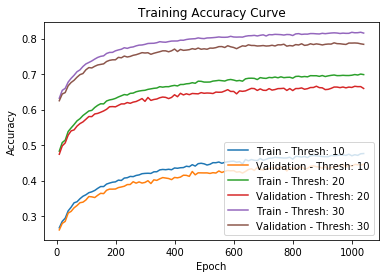

---[ITER 10] loss: 0.276321  time: 0.287
---[ITER 20] loss: 0.276210  time: 0.181
---[ITER 30] loss: 0.272726  time: 0.303
---[ITER 40] loss: 0.272492  time: 0.226
---[ITER 50] loss: 0.271967  time: 0.467
---[ITER 60] loss: 0.278068  time: 0.461
---[ITER 70] loss: 0.277360  time: 0.210
---[ITER 80] loss: 0.273548  time: 0.216
---[ITER 90] loss: 0.277789  time: 0.157
---[ITER 100] loss: 0.280712  time: 0.157
---[ITER 110] loss: 0.277769  time: 0.174
---[ITER 120] loss: 0.268279  time: 0.239
---[ITER 130] loss: 0.284462  time: 0.218
---[ITER 140] loss: 0.277398  time: 0.201
---[ITER 150] loss: 0.284512  time: 0.151
---[ITER 160] loss: 0.281980  time: 0.171
[EPOCH 1041] loss: 0.276969  time: 3.964
---[ITER 10] loss: 0.274616  time: 0.279
---[ITER 20] loss: 0.279260  time: 0.136
---[ITER 30] loss: 0.278854  time: 0.308
---[ITER 40] loss: 0.277399  time: 0.187
---[ITER 50] loss: 0.280187  time: 0.196
---[ITER 60] loss: 0.273832  time: 0.162
---[ITER 70] loss: 0.276909  time: 0.207
---[ITER 

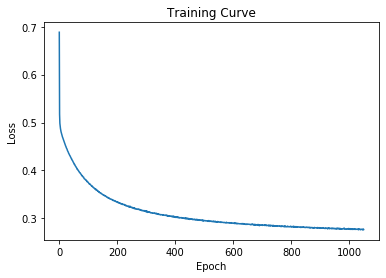

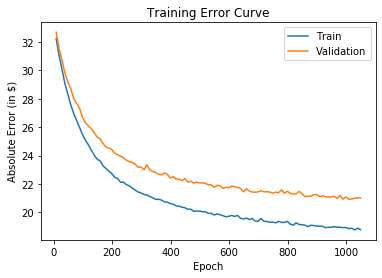

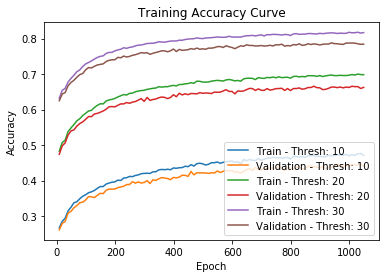

---[ITER 10] loss: 0.278674  time: 0.457
---[ITER 20] loss: 0.276959  time: 0.223
---[ITER 30] loss: 0.279026  time: 0.321
---[ITER 40] loss: 0.274411  time: 0.271
---[ITER 50] loss: 0.281521  time: 0.215
---[ITER 60] loss: 0.275895  time: 0.212
---[ITER 70] loss: 0.275497  time: 0.154
---[ITER 80] loss: 0.273241  time: 0.336
---[ITER 90] loss: 0.270316  time: 0.199
---[ITER 100] loss: 0.274685  time: 0.244
---[ITER 110] loss: 0.277117  time: 0.163
---[ITER 120] loss: 0.272797  time: 0.263
---[ITER 130] loss: 0.275559  time: 0.302
---[ITER 140] loss: 0.282047  time: 0.357
---[ITER 150] loss: 0.275575  time: 0.149
---[ITER 160] loss: 0.282229  time: 0.201
[EPOCH 1051] loss: 0.277166  time: 4.255
---[ITER 10] loss: 0.283759  time: 0.302
---[ITER 20] loss: 0.273100  time: 0.562
---[ITER 30] loss: 0.274854  time: 0.193
---[ITER 40] loss: 0.272133  time: 0.332
---[ITER 50] loss: 0.271639  time: 0.199
---[ITER 60] loss: 0.277825  time: 0.177
---[ITER 70] loss: 0.273650  time: 0.210
---[ITER 

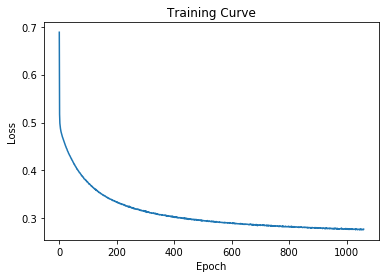

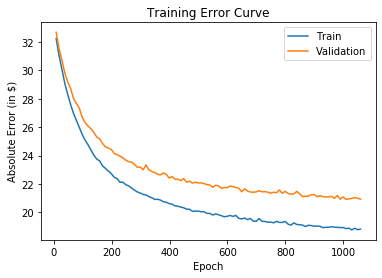

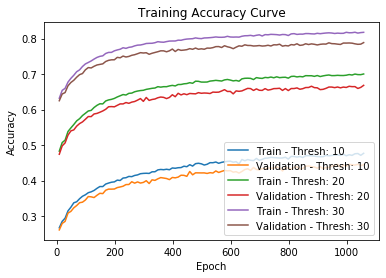

---[ITER 10] loss: 0.273676  time: 0.558
---[ITER 20] loss: 0.276735  time: 0.237
---[ITER 30] loss: 0.275781  time: 0.217
---[ITER 40] loss: 0.277102  time: 0.157
---[ITER 50] loss: 0.273315  time: 0.376
---[ITER 60] loss: 0.279254  time: 0.280
---[ITER 70] loss: 0.273956  time: 0.182
---[ITER 80] loss: 0.277536  time: 0.454
---[ITER 90] loss: 0.277213  time: 0.488
---[ITER 100] loss: 0.279231  time: 0.158
---[ITER 110] loss: 0.277836  time: 0.379
---[ITER 120] loss: 0.279014  time: 0.402
---[ITER 130] loss: 0.277824  time: 0.164
---[ITER 140] loss: 0.272707  time: 0.272
---[ITER 150] loss: 0.278565  time: 0.244
---[ITER 160] loss: 0.274951  time: 0.194
[EPOCH 1061] loss: 0.276360  time: 5.041
---[ITER 10] loss: 0.275716  time: 0.511
---[ITER 20] loss: 0.273662  time: 0.260
---[ITER 30] loss: 0.278972  time: 0.189
---[ITER 40] loss: 0.278866  time: 0.178
---[ITER 50] loss: 0.281311  time: 0.198
---[ITER 60] loss: 0.267879  time: 0.203
---[ITER 70] loss: 0.275808  time: 0.280
---[ITER 

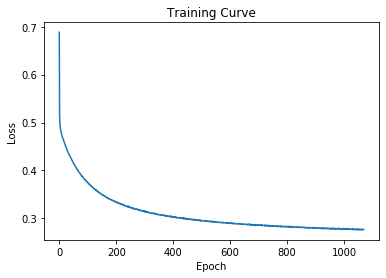

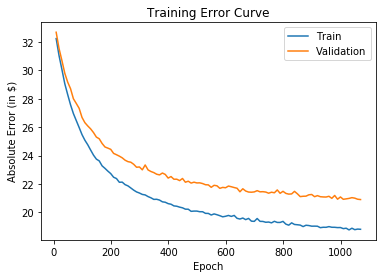

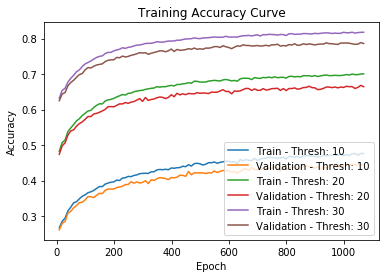

---[ITER 10] loss: 0.273373  time: 0.243
---[ITER 20] loss: 0.276037  time: 0.270
---[ITER 30] loss: 0.278435  time: 0.458
---[ITER 40] loss: 0.275483  time: 0.173
---[ITER 50] loss: 0.276969  time: 0.187
---[ITER 60] loss: 0.277436  time: 0.234
---[ITER 70] loss: 0.279215  time: 0.292
---[ITER 80] loss: 0.272847  time: 0.220
---[ITER 90] loss: 0.278332  time: 0.184
---[ITER 100] loss: 0.274397  time: 0.164
---[ITER 110] loss: 0.271902  time: 0.185
---[ITER 120] loss: 0.279534  time: 0.182
---[ITER 130] loss: 0.281127  time: 0.375
---[ITER 140] loss: 0.281033  time: 0.296
---[ITER 150] loss: 0.272626  time: 0.254
---[ITER 160] loss: 0.280401  time: 0.353
[EPOCH 1071] loss: 0.276730  time: 4.350
---[ITER 10] loss: 0.279174  time: 0.329
---[ITER 20] loss: 0.268198  time: 0.182
---[ITER 30] loss: 0.274028  time: 0.289
---[ITER 40] loss: 0.275306  time: 0.215
---[ITER 50] loss: 0.272081  time: 0.181
---[ITER 60] loss: 0.273563  time: 0.163
---[ITER 70] loss: 0.275906  time: 0.182
---[ITER 

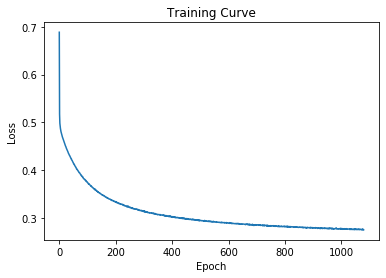

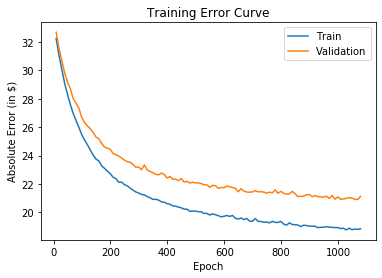

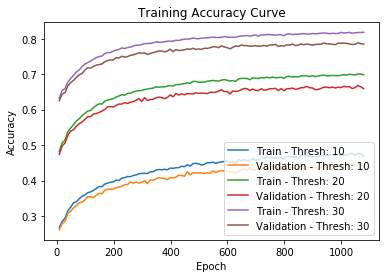

---[ITER 10] loss: 0.270277  time: 0.409
---[ITER 20] loss: 0.274929  time: 0.348
---[ITER 30] loss: 0.279431  time: 0.255
---[ITER 40] loss: 0.275420  time: 0.228
---[ITER 50] loss: 0.275513  time: 0.212
---[ITER 60] loss: 0.272023  time: 0.187
---[ITER 70] loss: 0.276566  time: 0.186
---[ITER 80] loss: 0.271532  time: 0.149
---[ITER 90] loss: 0.273464  time: 0.191
---[ITER 100] loss: 0.274132  time: 0.241
---[ITER 110] loss: 0.282042  time: 0.308
---[ITER 120] loss: 0.281091  time: 0.198
---[ITER 130] loss: 0.277907  time: 0.220
---[ITER 140] loss: 0.277930  time: 0.212
---[ITER 150] loss: 0.279612  time: 0.212
---[ITER 160] loss: 0.280806  time: 0.210
[EPOCH 1081] loss: 0.276580  time: 3.947
---[ITER 10] loss: 0.276129  time: 0.296
---[ITER 20] loss: 0.273409  time: 0.385
---[ITER 30] loss: 0.272567  time: 0.385
---[ITER 40] loss: 0.276631  time: 0.187
---[ITER 50] loss: 0.272780  time: 0.247
---[ITER 60] loss: 0.277040  time: 0.197
---[ITER 70] loss: 0.275495  time: 0.206
---[ITER 

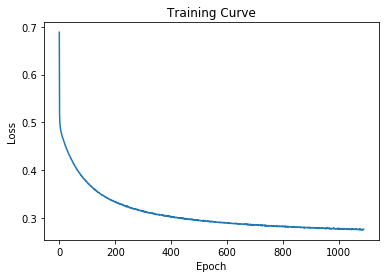

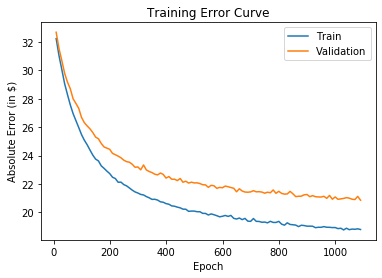

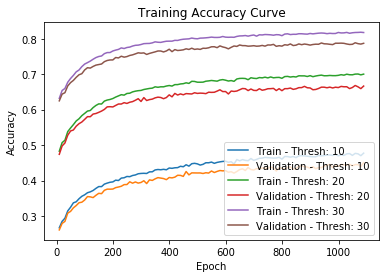

---[ITER 10] loss: 0.277824  time: 0.430
---[ITER 20] loss: 0.275709  time: 0.220
---[ITER 30] loss: 0.276730  time: 0.228
---[ITER 40] loss: 0.270034  time: 0.289
---[ITER 50] loss: 0.272154  time: 0.190
---[ITER 60] loss: 0.274092  time: 0.232
---[ITER 70] loss: 0.271275  time: 0.196
---[ITER 80] loss: 0.276618  time: 0.164
---[ITER 90] loss: 0.276015  time: 0.211
---[ITER 100] loss: 0.280980  time: 0.150
---[ITER 110] loss: 0.276136  time: 0.235
---[ITER 120] loss: 0.276418  time: 0.183
---[ITER 130] loss: 0.279171  time: 0.208
---[ITER 140] loss: 0.276255  time: 0.212
---[ITER 150] loss: 0.275728  time: 0.209
---[ITER 160] loss: 0.274179  time: 0.258
[EPOCH 1091] loss: 0.275849  time: 3.916
---[ITER 10] loss: 0.270216  time: 0.564
---[ITER 20] loss: 0.279416  time: 0.365
---[ITER 30] loss: 0.276219  time: 0.330
---[ITER 40] loss: 0.277251  time: 0.296
---[ITER 50] loss: 0.273220  time: 0.368
---[ITER 60] loss: 0.270252  time: 0.310
---[ITER 70] loss: 0.277406  time: 0.472
---[ITER 

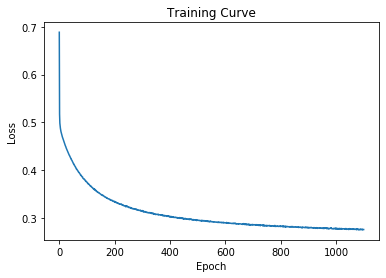

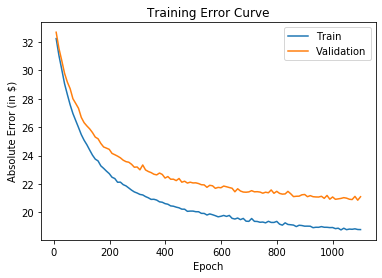

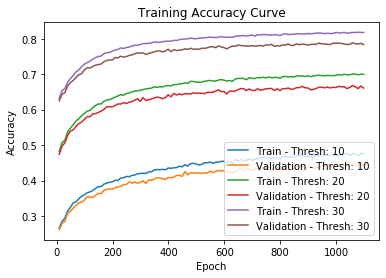

---[ITER 10] loss: 0.276144  time: 0.410
---[ITER 20] loss: 0.274365  time: 0.153
---[ITER 30] loss: 0.268079  time: 0.174
---[ITER 40] loss: 0.271726  time: 0.182
---[ITER 50] loss: 0.274432  time: 0.176
---[ITER 60] loss: 0.281759  time: 0.159
---[ITER 70] loss: 0.277123  time: 0.167
---[ITER 80] loss: 0.276620  time: 0.240
---[ITER 90] loss: 0.275691  time: 0.181
---[ITER 100] loss: 0.273258  time: 0.214
---[ITER 110] loss: 0.280686  time: 0.178
---[ITER 120] loss: 0.265414  time: 0.234
---[ITER 130] loss: 0.279768  time: 0.170
---[ITER 140] loss: 0.275667  time: 0.203
---[ITER 150] loss: 0.274187  time: 0.196
---[ITER 160] loss: 0.276904  time: 0.231
[EPOCH 1101] loss: 0.275464  time: 3.445
---[ITER 10] loss: 0.273165  time: 0.441
---[ITER 20] loss: 0.280146  time: 0.233
---[ITER 30] loss: 0.278332  time: 0.226
---[ITER 40] loss: 0.274679  time: 0.218
---[ITER 50] loss: 0.273831  time: 0.320
---[ITER 60] loss: 0.272622  time: 0.234
---[ITER 70] loss: 0.275256  time: 0.243
---[ITER 

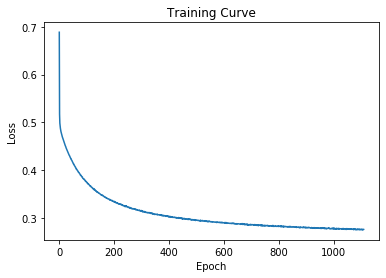

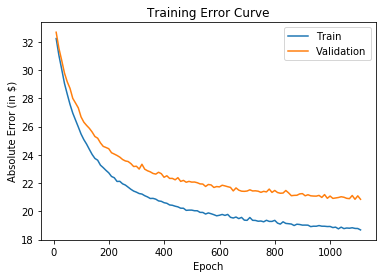

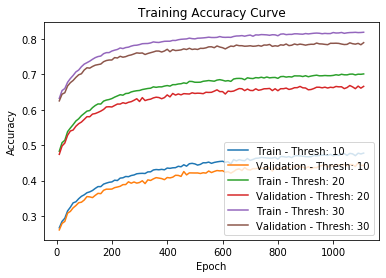

---[ITER 10] loss: 0.277703  time: 0.854
---[ITER 20] loss: 0.277463  time: 0.392
---[ITER 30] loss: 0.271806  time: 0.500
---[ITER 40] loss: 0.271059  time: 0.436
---[ITER 50] loss: 0.271179  time: 0.401
---[ITER 60] loss: 0.277430  time: 0.411
---[ITER 70] loss: 0.274655  time: 0.993
---[ITER 80] loss: 0.279631  time: 0.441
---[ITER 90] loss: 0.272862  time: 0.626
---[ITER 100] loss: 0.273893  time: 0.749
---[ITER 110] loss: 0.274977  time: 0.843
---[ITER 120] loss: 0.276860  time: 0.303
---[ITER 130] loss: 0.274731  time: 0.194
---[ITER 140] loss: 0.277564  time: 0.223
---[ITER 150] loss: 0.269446  time: 0.231
---[ITER 160] loss: 0.277280  time: 0.177
[EPOCH 1111] loss: 0.274817  time: 7.938
---[ITER 10] loss: 0.278010  time: 0.323
---[ITER 20] loss: 0.274628  time: 0.226
---[ITER 30] loss: 0.275847  time: 0.352
---[ITER 40] loss: 0.268016  time: 0.235
---[ITER 50] loss: 0.276114  time: 0.143
---[ITER 60] loss: 0.276087  time: 0.254
---[ITER 70] loss: 0.269955  time: 0.222
---[ITER 

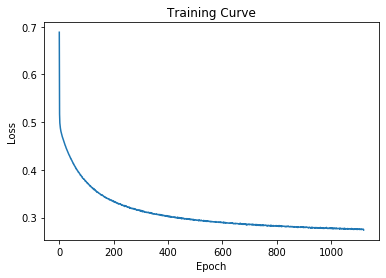

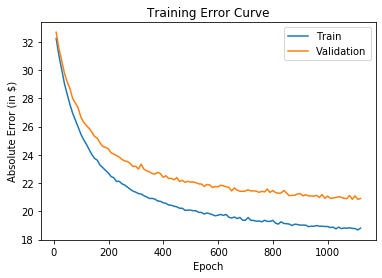

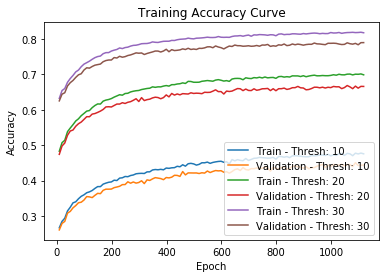

---[ITER 10] loss: 0.281344  time: 0.364
---[ITER 20] loss: 0.274816  time: 0.444
---[ITER 30] loss: 0.279578  time: 0.213
---[ITER 40] loss: 0.276203  time: 0.230
---[ITER 50] loss: 0.274784  time: 0.351
---[ITER 60] loss: 0.280869  time: 0.353
---[ITER 70] loss: 0.271640  time: 0.402
---[ITER 80] loss: 0.278310  time: 0.212
---[ITER 90] loss: 0.275057  time: 0.395
---[ITER 100] loss: 0.272228  time: 0.419
---[ITER 110] loss: 0.273405  time: 0.195
---[ITER 120] loss: 0.273851  time: 0.193
---[ITER 130] loss: 0.269759  time: 0.277
---[ITER 140] loss: 0.275449  time: 0.255
---[ITER 150] loss: 0.280774  time: 0.203
---[ITER 160] loss: 0.273475  time: 0.280
[EPOCH 1121] loss: 0.275872  time: 4.920
---[ITER 10] loss: 0.275170  time: 0.350
---[ITER 20] loss: 0.273764  time: 0.409
---[ITER 30] loss: 0.272700  time: 0.279
---[ITER 40] loss: 0.271237  time: 0.222
---[ITER 50] loss: 0.274623  time: 0.287
---[ITER 60] loss: 0.276335  time: 0.249
---[ITER 70] loss: 0.277184  time: 0.225
---[ITER 

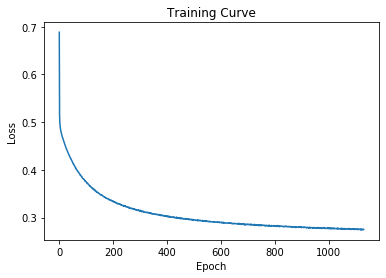

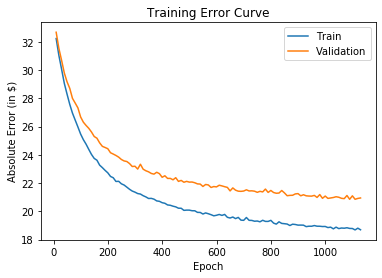

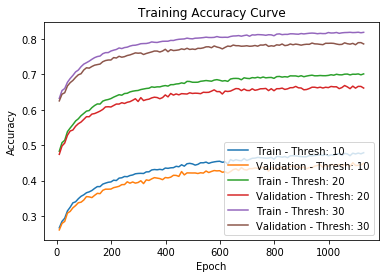

---[ITER 10] loss: 0.274524  time: 0.823
---[ITER 20] loss: 0.264705  time: 1.026
---[ITER 30] loss: 0.267479  time: 0.340
---[ITER 40] loss: 0.281293  time: 0.234
---[ITER 50] loss: 0.272629  time: 0.216
---[ITER 60] loss: 0.278961  time: 0.182
---[ITER 70] loss: 0.275378  time: 0.177
---[ITER 80] loss: 0.275012  time: 0.172
---[ITER 90] loss: 0.273321  time: 0.227
---[ITER 100] loss: 0.275582  time: 0.223
---[ITER 110] loss: 0.276916  time: 0.155
---[ITER 120] loss: 0.274773  time: 0.176
---[ITER 130] loss: 0.272766  time: 0.248
---[ITER 140] loss: 0.273622  time: 0.177
---[ITER 150] loss: 0.276004  time: 0.509
---[ITER 160] loss: 0.277392  time: 0.513
[EPOCH 1131] loss: 0.274639  time: 5.709
---[ITER 10] loss: 0.275275  time: 0.471
---[ITER 20] loss: 0.267043  time: 0.163
---[ITER 30] loss: 0.282673  time: 0.188
---[ITER 40] loss: 0.275927  time: 0.217
---[ITER 50] loss: 0.273388  time: 0.208
---[ITER 60] loss: 0.277898  time: 0.169
---[ITER 70] loss: 0.279941  time: 0.176
---[ITER 

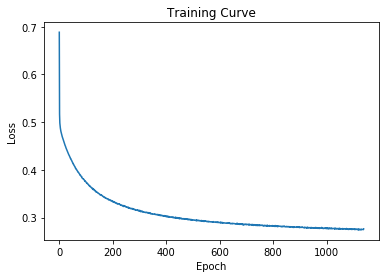

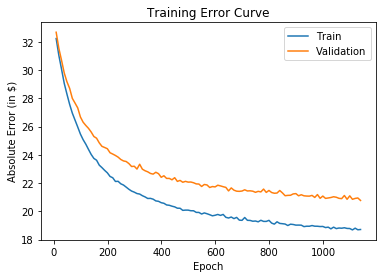

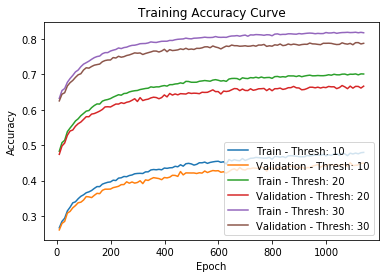

---[ITER 10] loss: 0.277072  time: 0.277
---[ITER 20] loss: 0.274042  time: 0.267
---[ITER 30] loss: 0.267469  time: 0.334
---[ITER 40] loss: 0.276552  time: 0.414
---[ITER 50] loss: 0.276869  time: 0.377
---[ITER 60] loss: 0.275425  time: 0.232
---[ITER 70] loss: 0.278549  time: 0.264
---[ITER 80] loss: 0.274350  time: 0.233
---[ITER 90] loss: 0.275847  time: 0.417
---[ITER 100] loss: 0.275191  time: 0.210
---[ITER 110] loss: 0.277917  time: 0.202
---[ITER 120] loss: 0.272484  time: 0.397
---[ITER 130] loss: 0.272422  time: 0.202
---[ITER 140] loss: 0.279630  time: 0.298
---[ITER 150] loss: 0.266341  time: 0.448
---[ITER 160] loss: 0.277156  time: 0.185
[EPOCH 1141] loss: 0.274719  time: 4.900
---[ITER 10] loss: 0.281482  time: 0.238
---[ITER 20] loss: 0.275515  time: 0.162
---[ITER 30] loss: 0.280226  time: 0.179
---[ITER 40] loss: 0.269601  time: 0.271
---[ITER 50] loss: 0.279922  time: 0.155
---[ITER 60] loss: 0.271714  time: 0.182
---[ITER 70] loss: 0.274348  time: 0.184
---[ITER 

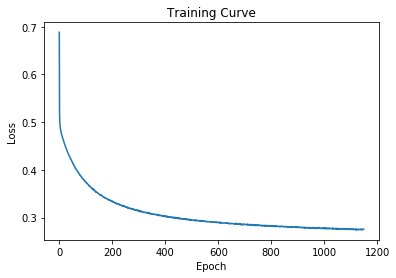

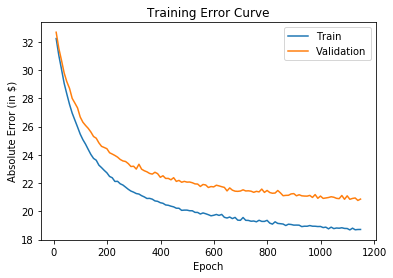

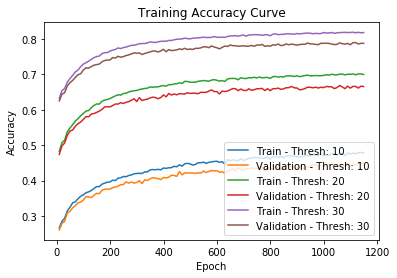

---[ITER 10] loss: 0.281911  time: 0.288
---[ITER 20] loss: 0.273947  time: 0.158
---[ITER 30] loss: 0.272606  time: 0.334
---[ITER 40] loss: 0.272559  time: 0.177
---[ITER 50] loss: 0.279879  time: 0.202
---[ITER 60] loss: 0.271091  time: 0.203
---[ITER 70] loss: 0.270659  time: 0.219
---[ITER 80] loss: 0.270965  time: 0.234
---[ITER 90] loss: 0.279684  time: 0.191
---[ITER 100] loss: 0.276380  time: 0.190
---[ITER 110] loss: 0.272732  time: 0.199
---[ITER 120] loss: 0.275536  time: 0.209
---[ITER 130] loss: 0.279779  time: 0.212
---[ITER 140] loss: 0.274914  time: 0.194
---[ITER 150] loss: 0.273860  time: 0.156
---[ITER 160] loss: 0.275001  time: 0.179
[EPOCH 1151] loss: 0.275013  time: 3.472
---[ITER 10] loss: 0.278848  time: 0.283
---[ITER 20] loss: 0.279044  time: 0.191
---[ITER 30] loss: 0.272590  time: 0.282
---[ITER 40] loss: 0.272101  time: 0.189
---[ITER 50] loss: 0.274071  time: 0.239
---[ITER 60] loss: 0.274676  time: 0.191
---[ITER 70] loss: 0.273852  time: 0.190
---[ITER 

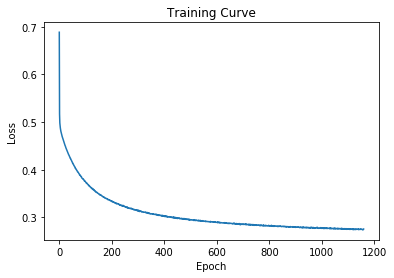

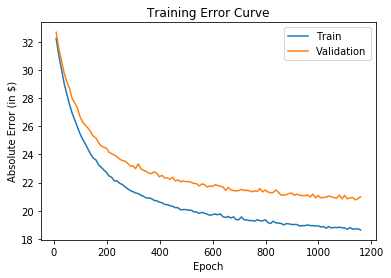

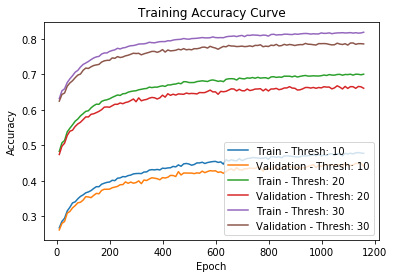

---[ITER 10] loss: 0.276573  time: 0.314
---[ITER 20] loss: 0.280951  time: 0.326
---[ITER 30] loss: 0.275165  time: 0.188
---[ITER 40] loss: 0.274567  time: 0.169
---[ITER 50] loss: 0.275150  time: 0.212
---[ITER 60] loss: 0.278771  time: 0.190
---[ITER 70] loss: 0.273118  time: 0.185
---[ITER 80] loss: 0.283564  time: 0.191
---[ITER 90] loss: 0.271308  time: 0.194
---[ITER 100] loss: 0.277000  time: 0.220
---[ITER 110] loss: 0.271700  time: 0.350
---[ITER 120] loss: 0.273038  time: 0.411
---[ITER 130] loss: 0.270962  time: 0.339
---[ITER 140] loss: 0.277875  time: 0.169
---[ITER 150] loss: 0.270265  time: 1.148
---[ITER 160] loss: 0.274837  time: 0.575
[EPOCH 1161] loss: 0.275262  time: 5.525
---[ITER 10] loss: 0.275346  time: 0.734
---[ITER 20] loss: 0.270162  time: 0.526
---[ITER 30] loss: 0.276423  time: 0.240
---[ITER 40] loss: 0.279936  time: 0.233
---[ITER 50] loss: 0.271633  time: 0.271
---[ITER 60] loss: 0.273566  time: 0.623
---[ITER 70] loss: 0.274032  time: 0.165
---[ITER 

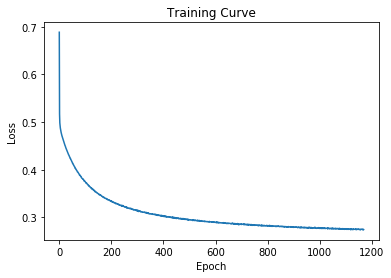

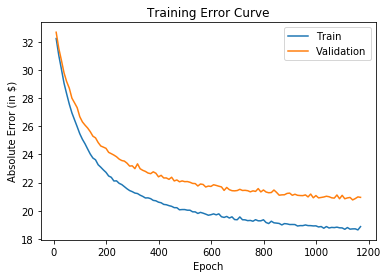

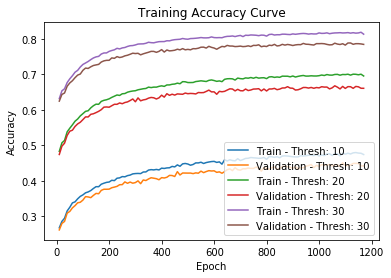

---[ITER 10] loss: 0.273156  time: 0.449
---[ITER 20] loss: 0.280147  time: 0.185
---[ITER 30] loss: 0.271155  time: 0.391
---[ITER 40] loss: 0.276536  time: 0.158
---[ITER 50] loss: 0.272375  time: 0.304
---[ITER 60] loss: 0.278606  time: 0.233
---[ITER 70] loss: 0.271449  time: 0.218
---[ITER 80] loss: 0.270044  time: 0.762
---[ITER 90] loss: 0.270189  time: 0.642
---[ITER 100] loss: 0.279288  time: 0.300
---[ITER 110] loss: 0.276698  time: 0.293
---[ITER 120] loss: 0.274153  time: 0.249
---[ITER 130] loss: 0.273324  time: 0.285
---[ITER 140] loss: 0.275628  time: 0.220
---[ITER 150] loss: 0.277936  time: 0.167
---[ITER 160] loss: 0.276654  time: 0.218
[EPOCH 1171] loss: 0.274718  time: 5.276
---[ITER 10] loss: 0.282337  time: 0.927
---[ITER 20] loss: 0.278749  time: 0.232
---[ITER 30] loss: 0.274140  time: 0.194
---[ITER 40] loss: 0.273059  time: 0.414
---[ITER 50] loss: 0.273336  time: 0.735
---[ITER 60] loss: 0.275789  time: 0.491
---[ITER 70] loss: 0.276538  time: 0.641
---[ITER 

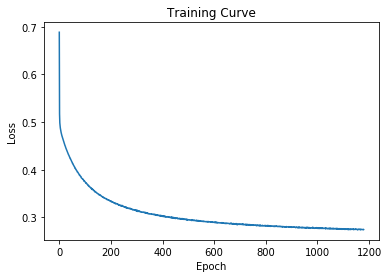

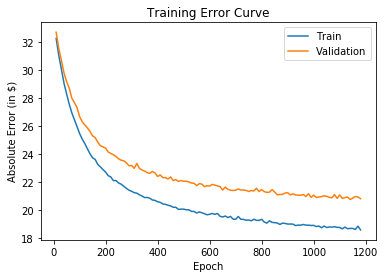

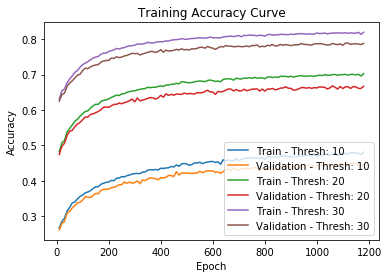

---[ITER 10] loss: 0.269861  time: 0.305
---[ITER 20] loss: 0.274374  time: 0.166
---[ITER 30] loss: 0.270956  time: 0.402
---[ITER 40] loss: 0.272834  time: 0.235
---[ITER 50] loss: 0.276397  time: 0.200
---[ITER 60] loss: 0.275643  time: 0.178
---[ITER 70] loss: 0.271742  time: 0.178
---[ITER 80] loss: 0.279672  time: 0.319
---[ITER 90] loss: 0.273083  time: 0.148
---[ITER 100] loss: 0.278414  time: 0.175
---[ITER 110] loss: 0.274127  time: 0.155
---[ITER 120] loss: 0.273123  time: 0.150
---[ITER 130] loss: 0.274545  time: 0.246
---[ITER 140] loss: 0.276324  time: 0.199
---[ITER 150] loss: 0.277105  time: 0.310
---[ITER 160] loss: 0.276233  time: 0.201
[EPOCH 1181] loss: 0.274709  time: 3.974
---[ITER 10] loss: 0.277537  time: 0.662
---[ITER 20] loss: 0.274174  time: 0.529
---[ITER 30] loss: 0.277802  time: 0.397
---[ITER 40] loss: 0.271660  time: 0.224
---[ITER 50] loss: 0.270733  time: 0.179
---[ITER 60] loss: 0.272214  time: 0.154
---[ITER 70] loss: 0.278050  time: 0.163
---[ITER 

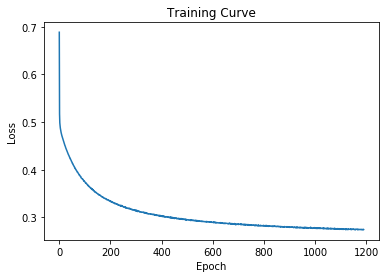

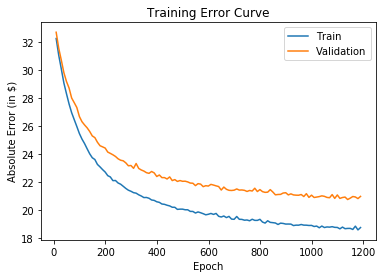

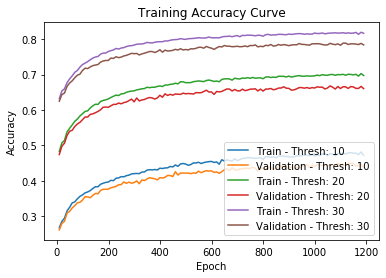

---[ITER 10] loss: 0.283275  time: 0.229
---[ITER 20] loss: 0.271225  time: 0.208
---[ITER 30] loss: 0.275662  time: 0.247
---[ITER 40] loss: 0.275919  time: 0.175
---[ITER 50] loss: 0.275097  time: 0.199
---[ITER 60] loss: 0.270556  time: 0.361
---[ITER 70] loss: 0.274414  time: 0.217
---[ITER 80] loss: 0.269414  time: 0.186
---[ITER 90] loss: 0.278434  time: 0.155
---[ITER 100] loss: 0.272657  time: 0.185
---[ITER 110] loss: 0.278463  time: 0.202
---[ITER 120] loss: 0.274365  time: 0.248
---[ITER 130] loss: 0.275098  time: 0.236
---[ITER 140] loss: 0.274144  time: 0.219
---[ITER 150] loss: 0.270120  time: 0.274
---[ITER 160] loss: 0.277573  time: 0.240
[EPOCH 1191] loss: 0.274996  time: 3.797
---[ITER 10] loss: 0.271986  time: 0.361
---[ITER 20] loss: 0.277001  time: 0.260
---[ITER 30] loss: 0.267436  time: 0.178
---[ITER 40] loss: 0.270973  time: 0.209
---[ITER 50] loss: 0.274307  time: 0.192
---[ITER 60] loss: 0.273106  time: 0.150
---[ITER 70] loss: 0.283153  time: 0.184
---[ITER 

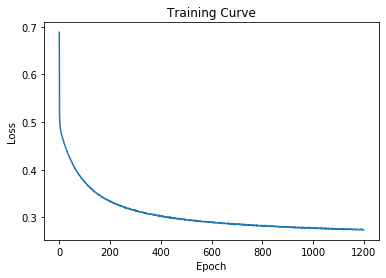

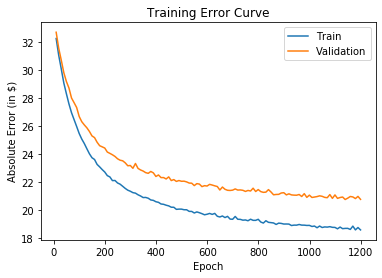

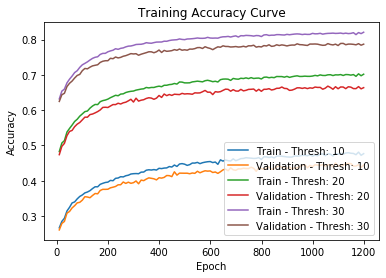

---[ITER 10] loss: 0.269137  time: 0.391
---[ITER 20] loss: 0.283595  time: 0.240
---[ITER 30] loss: 0.274429  time: 0.216
---[ITER 40] loss: 0.275450  time: 0.197
---[ITER 50] loss: 0.269702  time: 0.199
---[ITER 60] loss: 0.272617  time: 0.236
---[ITER 70] loss: 0.279722  time: 0.241
---[ITER 80] loss: 0.272870  time: 0.224
---[ITER 90] loss: 0.273532  time: 0.196
---[ITER 100] loss: 0.270068  time: 0.247
---[ITER 110] loss: 0.271611  time: 0.325
---[ITER 120] loss: 0.274418  time: 0.272
---[ITER 130] loss: 0.276718  time: 0.257
---[ITER 140] loss: 0.272050  time: 0.191
---[ITER 150] loss: 0.273882  time: 0.163
---[ITER 160] loss: 0.271565  time: 0.187
[EPOCH 1201] loss: 0.273984  time: 3.914
---[ITER 10] loss: 0.276499  time: 0.398
---[ITER 20] loss: 0.273121  time: 0.231
---[ITER 30] loss: 0.281534  time: 0.181
---[ITER 40] loss: 0.276158  time: 0.208
---[ITER 50] loss: 0.272269  time: 0.209
---[ITER 60] loss: 0.276359  time: 0.206
---[ITER 70] loss: 0.275466  time: 0.221
---[ITER 

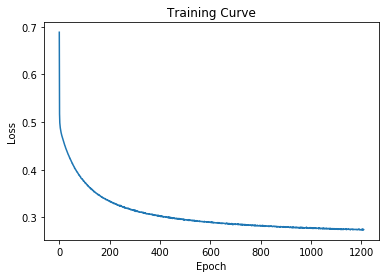

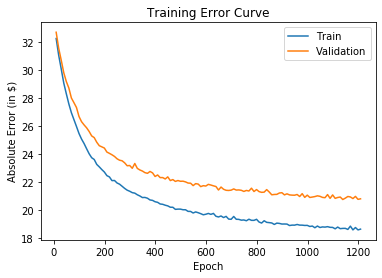

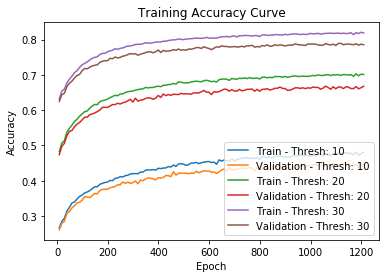

---[ITER 10] loss: 0.273677  time: 0.559
---[ITER 20] loss: 0.272704  time: 0.176
---[ITER 30] loss: 0.273534  time: 0.255
---[ITER 40] loss: 0.274338  time: 0.207
---[ITER 50] loss: 0.269829  time: 0.257
---[ITER 60] loss: 0.270560  time: 0.243
---[ITER 70] loss: 0.274767  time: 0.255
---[ITER 80] loss: 0.270775  time: 0.272
---[ITER 90] loss: 0.280644  time: 0.402
---[ITER 100] loss: 0.272687  time: 0.272
---[ITER 110] loss: 0.279186  time: 0.225
---[ITER 120] loss: 0.274814  time: 0.287
---[ITER 130] loss: 0.273883  time: 0.278
---[ITER 140] loss: 0.274443  time: 0.207
---[ITER 150] loss: 0.278772  time: 0.154
---[ITER 160] loss: 0.272217  time: 0.210
[EPOCH 1211] loss: 0.274313  time: 4.436
---[ITER 10] loss: 0.272983  time: 0.440
---[ITER 20] loss: 0.274562  time: 0.259
---[ITER 30] loss: 0.271858  time: 0.195
---[ITER 40] loss: 0.274106  time: 0.290
---[ITER 50] loss: 0.274539  time: 0.177
---[ITER 60] loss: 0.279745  time: 0.205
---[ITER 70] loss: 0.271495  time: 0.309
---[ITER 

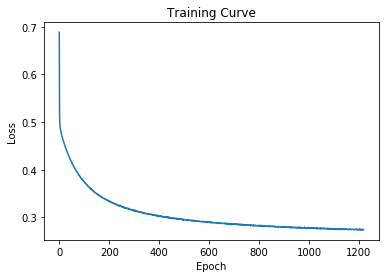

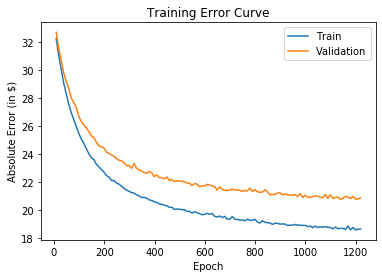

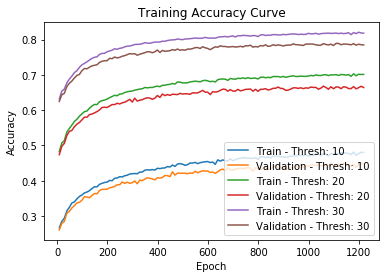

---[ITER 10] loss: 0.271804  time: 0.302
---[ITER 20] loss: 0.271332  time: 0.171
---[ITER 30] loss: 0.273294  time: 0.256
---[ITER 40] loss: 0.266741  time: 0.154
---[ITER 50] loss: 0.272977  time: 0.183
---[ITER 60] loss: 0.282600  time: 0.157
---[ITER 70] loss: 0.271733  time: 0.175
---[ITER 80] loss: 0.273680  time: 0.167
---[ITER 90] loss: 0.275319  time: 0.303
---[ITER 100] loss: 0.274286  time: 0.225
---[ITER 110] loss: 0.272683  time: 0.339
---[ITER 120] loss: 0.272681  time: 0.238
---[ITER 130] loss: 0.274748  time: 0.221
---[ITER 140] loss: 0.277224  time: 0.382
---[ITER 150] loss: 0.274498  time: 0.295
---[ITER 160] loss: 0.272538  time: 0.301
[EPOCH 1221] loss: 0.273788  time: 4.067
---[ITER 10] loss: 0.275391  time: 0.372
---[ITER 20] loss: 0.276613  time: 0.274
---[ITER 30] loss: 0.271153  time: 0.395
---[ITER 40] loss: 0.274570  time: 0.287
---[ITER 50] loss: 0.268670  time: 0.253
---[ITER 60] loss: 0.266616  time: 0.306
---[ITER 70] loss: 0.277659  time: 0.247
---[ITER 

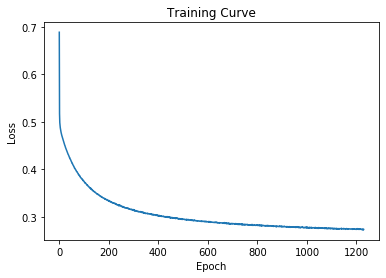

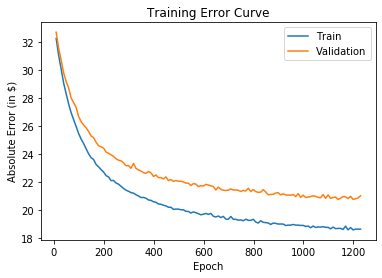

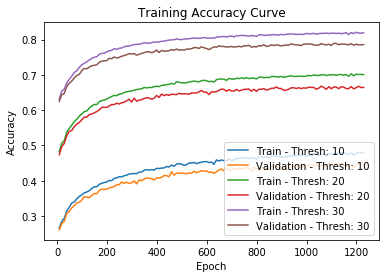

---[ITER 10] loss: 0.269323  time: 0.426
---[ITER 20] loss: 0.277829  time: 0.358
---[ITER 30] loss: 0.274457  time: 0.232
---[ITER 40] loss: 0.272758  time: 0.307
---[ITER 50] loss: 0.279518  time: 0.167
---[ITER 60] loss: 0.279017  time: 0.332
---[ITER 70] loss: 0.269629  time: 0.238
---[ITER 80] loss: 0.273248  time: 0.232
---[ITER 90] loss: 0.276761  time: 0.259
---[ITER 100] loss: 0.267795  time: 0.249
---[ITER 110] loss: 0.273337  time: 0.213
---[ITER 120] loss: 0.276365  time: 0.149
---[ITER 130] loss: 0.275291  time: 0.661
---[ITER 140] loss: 0.270401  time: 0.382
---[ITER 150] loss: 0.269751  time: 0.308
---[ITER 160] loss: 0.276427  time: 0.253
[EPOCH 1231] loss: 0.273692  time: 4.904
---[ITER 10] loss: 0.273460  time: 0.238
---[ITER 20] loss: 0.269115  time: 0.272
---[ITER 30] loss: 0.270641  time: 0.160
---[ITER 40] loss: 0.273410  time: 0.210
---[ITER 50] loss: 0.276777  time: 0.185
---[ITER 60] loss: 0.271303  time: 0.164
---[ITER 70] loss: 0.271475  time: 0.189
---[ITER 

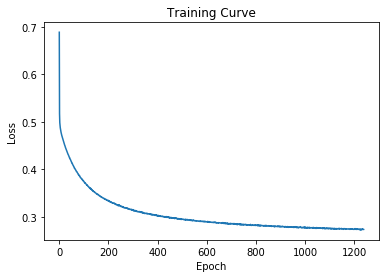

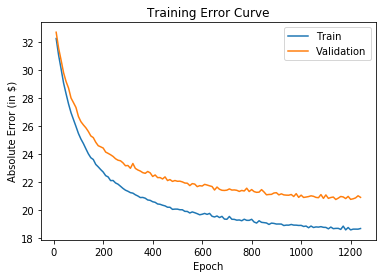

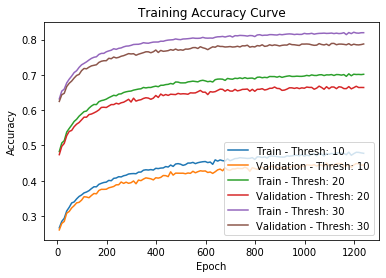

---[ITER 10] loss: 0.270361  time: 0.371
---[ITER 20] loss: 0.275044  time: 0.154
---[ITER 30] loss: 0.274811  time: 0.157
---[ITER 40] loss: 0.268844  time: 0.152
---[ITER 50] loss: 0.266745  time: 0.158
---[ITER 60] loss: 0.281111  time: 0.162
---[ITER 70] loss: 0.272168  time: 0.190
---[ITER 80] loss: 0.277575  time: 0.143
---[ITER 90] loss: 0.280370  time: 0.158
---[ITER 100] loss: 0.266912  time: 0.165
---[ITER 110] loss: 0.272004  time: 0.162
---[ITER 120] loss: 0.273260  time: 0.167
---[ITER 130] loss: 0.271294  time: 0.228
---[ITER 140] loss: 0.274409  time: 0.145
---[ITER 150] loss: 0.265134  time: 0.150
---[ITER 160] loss: 0.274848  time: 0.153
[EPOCH 1241] loss: 0.273194  time: 2.963
---[ITER 10] loss: 0.273818  time: 0.357
---[ITER 20] loss: 0.271644  time: 0.157
---[ITER 30] loss: 0.272030  time: 0.164
---[ITER 40] loss: 0.276460  time: 0.153
---[ITER 50] loss: 0.275900  time: 0.171
---[ITER 60] loss: 0.275863  time: 0.164
---[ITER 70] loss: 0.269616  time: 0.193
---[ITER 

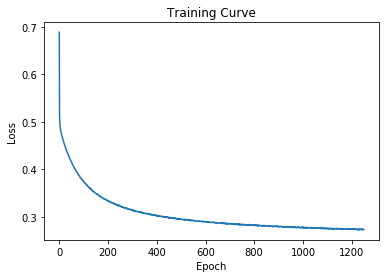

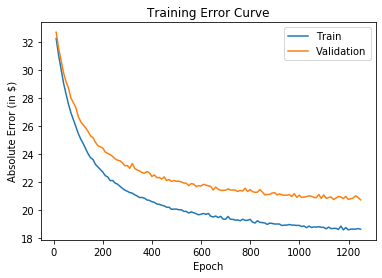

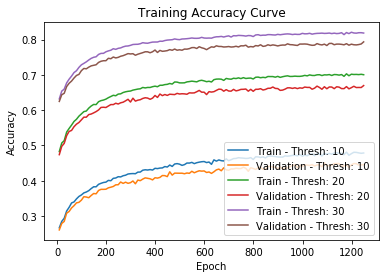

---[ITER 10] loss: 0.271784  time: 0.224
---[ITER 20] loss: 0.277950  time: 0.158
---[ITER 30] loss: 0.273688  time: 0.210
---[ITER 40] loss: 0.278331  time: 0.242
---[ITER 50] loss: 0.269790  time: 0.174
---[ITER 60] loss: 0.264061  time: 0.145
---[ITER 70] loss: 0.275804  time: 0.157
---[ITER 80] loss: 0.277136  time: 0.170
---[ITER 90] loss: 0.274025  time: 0.185
---[ITER 100] loss: 0.274578  time: 0.148
---[ITER 110] loss: 0.274216  time: 0.159
---[ITER 120] loss: 0.275486  time: 0.168
---[ITER 130] loss: 0.276391  time: 0.158
---[ITER 140] loss: 0.278483  time: 0.171
---[ITER 150] loss: 0.275124  time: 0.230
---[ITER 160] loss: 0.274599  time: 0.143
[EPOCH 1251] loss: 0.274443  time: 2.986
---[ITER 10] loss: 0.271231  time: 0.247
---[ITER 20] loss: 0.278691  time: 0.172
---[ITER 30] loss: 0.271532  time: 0.181
---[ITER 40] loss: 0.272259  time: 0.237
---[ITER 50] loss: 0.275826  time: 0.164
---[ITER 60] loss: 0.265979  time: 0.166
---[ITER 70] loss: 0.277144  time: 0.155
---[ITER 

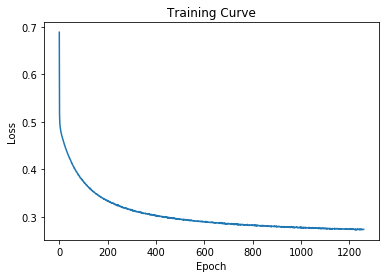

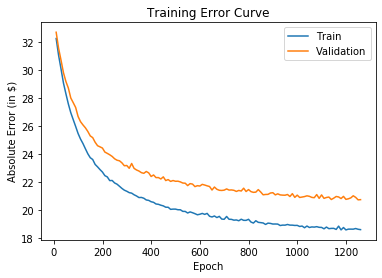

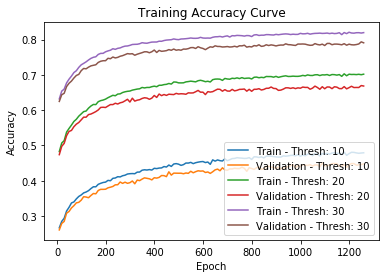

---[ITER 10] loss: 0.277325  time: 0.233
---[ITER 20] loss: 0.271202  time: 0.149
---[ITER 30] loss: 0.266143  time: 0.260
---[ITER 40] loss: 0.274926  time: 0.152
---[ITER 50] loss: 0.279720  time: 0.160
---[ITER 60] loss: 0.269212  time: 0.182
---[ITER 70] loss: 0.275995  time: 0.152
---[ITER 80] loss: 0.266700  time: 0.155
---[ITER 90] loss: 0.272954  time: 0.161
---[ITER 100] loss: 0.279667  time: 0.154
---[ITER 110] loss: 0.272494  time: 0.180
---[ITER 120] loss: 0.269922  time: 0.178
---[ITER 130] loss: 0.275296  time: 0.153
---[ITER 140] loss: 0.273900  time: 0.189
---[ITER 150] loss: 0.273252  time: 0.159
---[ITER 160] loss: 0.279614  time: 0.162
[EPOCH 1261] loss: 0.273923  time: 2.915
---[ITER 10] loss: 0.268138  time: 0.237
---[ITER 20] loss: 0.271136  time: 0.154
---[ITER 30] loss: 0.267642  time: 0.274
---[ITER 40] loss: 0.275036  time: 0.156
---[ITER 50] loss: 0.269680  time: 0.170
---[ITER 60] loss: 0.284880  time: 0.186
---[ITER 70] loss: 0.274028  time: 0.157
---[ITER 

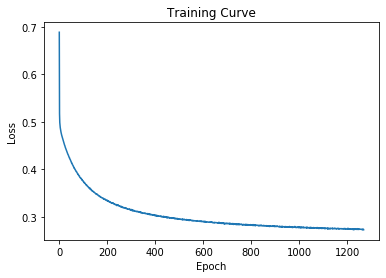

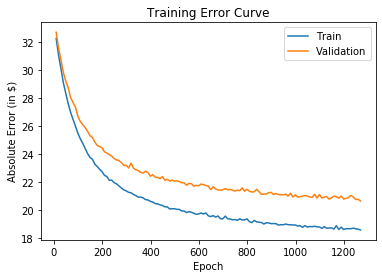

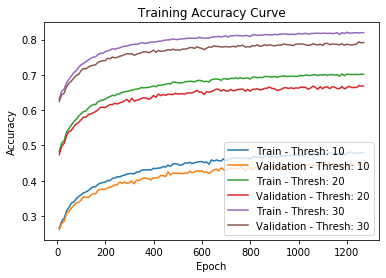

---[ITER 10] loss: 0.271010  time: 0.240
---[ITER 20] loss: 0.275825  time: 0.391
---[ITER 30] loss: 0.273984  time: 0.685
---[ITER 40] loss: 0.268247  time: 0.367
---[ITER 50] loss: 0.270344  time: 0.587
---[ITER 60] loss: 0.272676  time: 0.347
---[ITER 70] loss: 0.269942  time: 0.345
---[ITER 80] loss: 0.271792  time: 0.214
---[ITER 90] loss: 0.275752  time: 0.287
---[ITER 100] loss: 0.273296  time: 0.222
---[ITER 110] loss: 0.277823  time: 0.338
---[ITER 120] loss: 0.275448  time: 0.242
---[ITER 130] loss: 0.270429  time: 0.265
---[ITER 140] loss: 0.274873  time: 0.209
---[ITER 150] loss: 0.270465  time: 0.355
---[ITER 160] loss: 0.274493  time: 0.267
[EPOCH 1271] loss: 0.273144  time: 5.607
---[ITER 10] loss: 0.267355  time: 0.362
---[ITER 20] loss: 0.270398  time: 0.374
---[ITER 30] loss: 0.278518  time: 0.165
---[ITER 40] loss: 0.272012  time: 0.207
---[ITER 50] loss: 0.273363  time: 0.211
---[ITER 60] loss: 0.268503  time: 0.174
---[ITER 70] loss: 0.280701  time: 0.163
---[ITER 

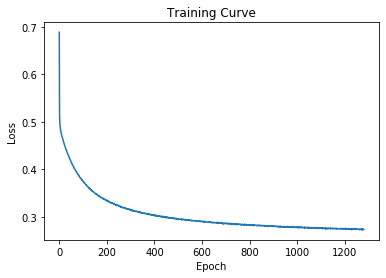

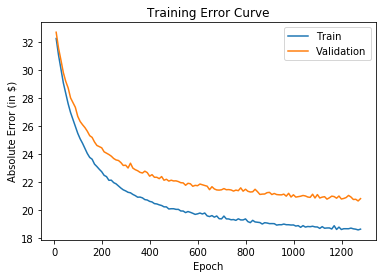

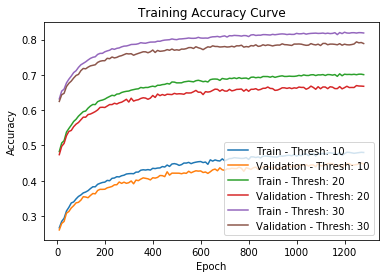

---[ITER 10] loss: 0.279354  time: 0.353
---[ITER 20] loss: 0.273434  time: 0.225
---[ITER 30] loss: 0.266393  time: 0.164
---[ITER 40] loss: 0.272088  time: 0.151
---[ITER 50] loss: 0.269027  time: 0.157
---[ITER 60] loss: 0.271845  time: 0.159
---[ITER 70] loss: 0.276829  time: 0.163
---[ITER 80] loss: 0.274084  time: 0.141
---[ITER 90] loss: 0.275686  time: 0.161
---[ITER 100] loss: 0.270576  time: 0.160
---[ITER 110] loss: 0.278765  time: 0.153
---[ITER 120] loss: 0.275495  time: 0.212
---[ITER 130] loss: 0.275415  time: 0.181
---[ITER 140] loss: 0.274829  time: 0.154
---[ITER 150] loss: 0.266618  time: 0.149
---[ITER 160] loss: 0.277947  time: 0.172
[EPOCH 1281] loss: 0.273682  time: 2.987
---[ITER 10] loss: 0.274231  time: 0.391
---[ITER 20] loss: 0.275126  time: 0.159
---[ITER 30] loss: 0.273261  time: 0.143
---[ITER 40] loss: 0.272358  time: 0.149
---[ITER 50] loss: 0.275587  time: 0.151
---[ITER 60] loss: 0.283420  time: 0.169
---[ITER 70] loss: 0.276690  time: 0.155
---[ITER 

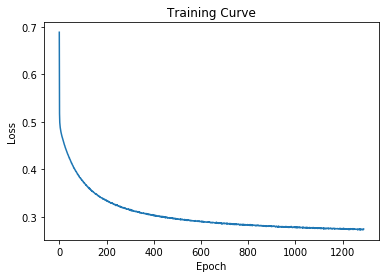

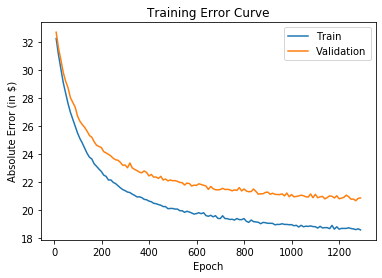

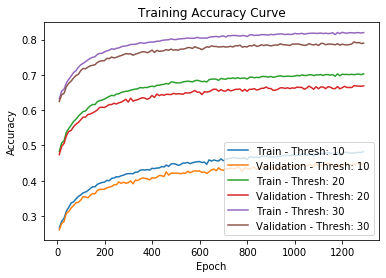

---[ITER 10] loss: 0.269105  time: 0.266
---[ITER 20] loss: 0.273460  time: 0.238
---[ITER 30] loss: 0.271318  time: 0.293
---[ITER 40] loss: 0.276877  time: 0.222
---[ITER 50] loss: 0.273958  time: 0.316
---[ITER 60] loss: 0.269126  time: 0.341
---[ITER 70] loss: 0.269143  time: 0.278
---[ITER 80] loss: 0.270162  time: 0.276
---[ITER 90] loss: 0.267238  time: 0.365
---[ITER 100] loss: 0.271639  time: 0.324
---[ITER 110] loss: 0.269928  time: 0.306
---[ITER 120] loss: 0.276309  time: 0.420
---[ITER 130] loss: 0.271186  time: 0.269
---[ITER 140] loss: 0.273367  time: 0.180
---[ITER 150] loss: 0.274917  time: 0.301
---[ITER 160] loss: 0.275719  time: 0.299
[EPOCH 1291] loss: 0.272071  time: 5.024
---[ITER 10] loss: 0.271115  time: 0.358
---[ITER 20] loss: 0.268020  time: 0.208
---[ITER 30] loss: 0.269470  time: 0.305
---[ITER 40] loss: 0.271830  time: 0.179
---[ITER 50] loss: 0.275661  time: 0.179
---[ITER 60] loss: 0.266659  time: 0.272
---[ITER 70] loss: 0.278112  time: 0.230
---[ITER 

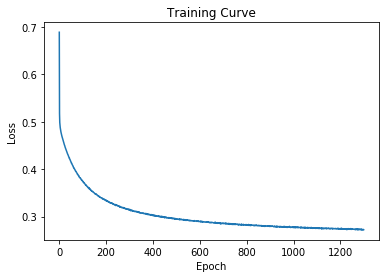

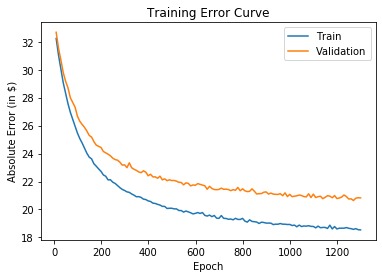

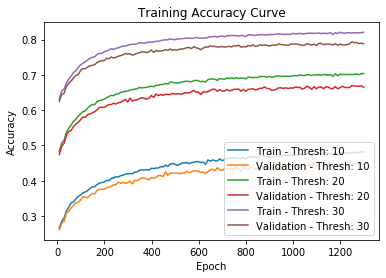

---[ITER 10] loss: 0.275227  time: 0.264
---[ITER 20] loss: 0.275135  time: 0.366
---[ITER 30] loss: 0.271701  time: 0.267
---[ITER 40] loss: 0.272045  time: 0.311
---[ITER 50] loss: 0.264821  time: 0.770
---[ITER 60] loss: 0.267944  time: 0.291
---[ITER 70] loss: 0.279439  time: 0.516
---[ITER 80] loss: 0.267663  time: 0.257
---[ITER 90] loss: 0.273698  time: 0.199
---[ITER 100] loss: 0.272598  time: 0.273
---[ITER 110] loss: 0.271602  time: 0.215
---[ITER 120] loss: 0.279246  time: 0.286
---[ITER 130] loss: 0.272329  time: 0.421
---[ITER 140] loss: 0.275042  time: 0.475
---[ITER 150] loss: 0.273541  time: 0.142
---[ITER 160] loss: 0.276283  time: 0.295
[EPOCH 1301] loss: 0.272918  time: 5.623
---[ITER 10] loss: 0.269818  time: 0.360
---[ITER 20] loss: 0.270074  time: 0.381
---[ITER 30] loss: 0.270464  time: 1.174
---[ITER 40] loss: 0.270131  time: 0.342
---[ITER 50] loss: 0.269750  time: 0.498
---[ITER 60] loss: 0.271862  time: 1.071
---[ITER 70] loss: 0.270804  time: 0.539
---[ITER 

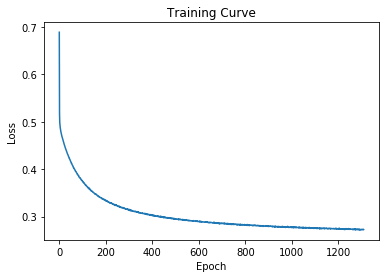

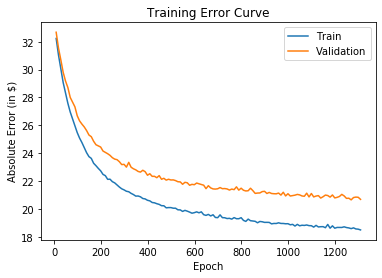

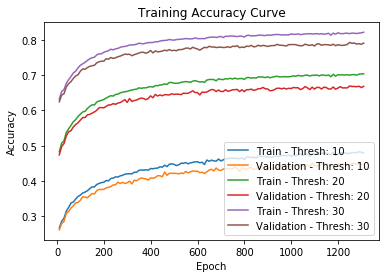

---[ITER 10] loss: 0.271190  time: 0.518
---[ITER 20] loss: 0.273934  time: 0.264
---[ITER 30] loss: 0.269938  time: 0.279
---[ITER 40] loss: 0.273701  time: 0.248
---[ITER 50] loss: 0.271473  time: 0.457
---[ITER 60] loss: 0.275437  time: 0.517
---[ITER 70] loss: 0.274389  time: 0.453
---[ITER 80] loss: 0.278848  time: 0.331
---[ITER 90] loss: 0.280276  time: 0.763
---[ITER 100] loss: 0.271193  time: 0.181
---[ITER 110] loss: 0.269499  time: 0.372
---[ITER 120] loss: 0.273117  time: 0.325
---[ITER 130] loss: 0.273304  time: 0.397
---[ITER 140] loss: 0.271485  time: 0.491
---[ITER 150] loss: 0.278683  time: 0.433
---[ITER 160] loss: 0.270357  time: 0.538
[EPOCH 1311] loss: 0.273147  time: 6.807
---[ITER 10] loss: 0.273066  time: 0.637
---[ITER 20] loss: 0.267991  time: 0.294
---[ITER 30] loss: 0.278840  time: 0.268
---[ITER 40] loss: 0.276270  time: 0.320
---[ITER 50] loss: 0.273071  time: 0.241
---[ITER 60] loss: 0.269906  time: 0.253
---[ITER 70] loss: 0.269433  time: 0.237
---[ITER 

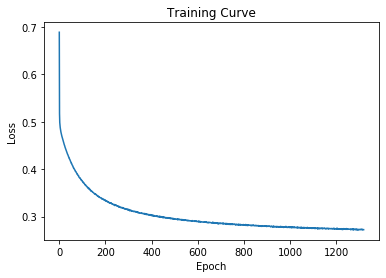

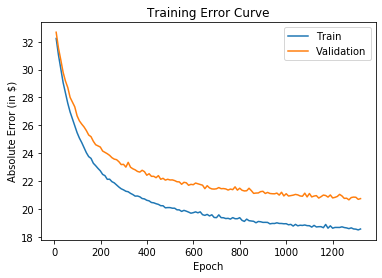

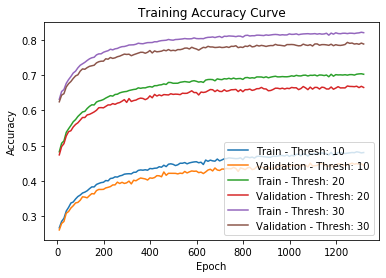

---[ITER 10] loss: 0.274990  time: 0.732
---[ITER 20] loss: 0.273093  time: 0.542
---[ITER 30] loss: 0.275571  time: 0.366
---[ITER 40] loss: 0.263554  time: 0.469
---[ITER 50] loss: 0.277645  time: 0.316
---[ITER 60] loss: 0.272364  time: 0.364
---[ITER 70] loss: 0.272913  time: 0.401
---[ITER 80] loss: 0.270540  time: 0.236
---[ITER 90] loss: 0.266241  time: 1.033
---[ITER 100] loss: 0.268400  time: 0.805
---[ITER 110] loss: 0.273439  time: 0.597
---[ITER 120] loss: 0.273189  time: 0.393
---[ITER 130] loss: 0.269446  time: 0.386
---[ITER 140] loss: 0.271052  time: 0.252
---[ITER 150] loss: 0.273385  time: 0.319
---[ITER 160] loss: 0.274955  time: 0.314
[EPOCH 1321] loss: 0.271907  time: 7.716
---[ITER 10] loss: 0.271400  time: 0.760
---[ITER 20] loss: 0.271556  time: 0.226
---[ITER 30] loss: 0.276265  time: 0.165
---[ITER 40] loss: 0.271945  time: 0.210
---[ITER 50] loss: 0.272791  time: 1.032
---[ITER 60] loss: 0.272807  time: 0.263
---[ITER 70] loss: 0.271446  time: 0.473
---[ITER 

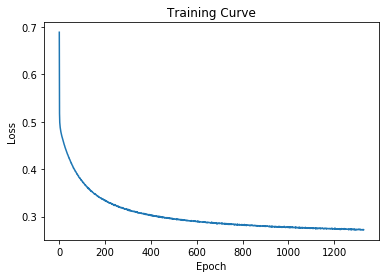

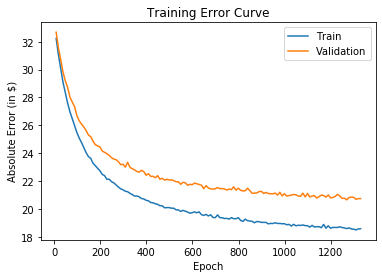

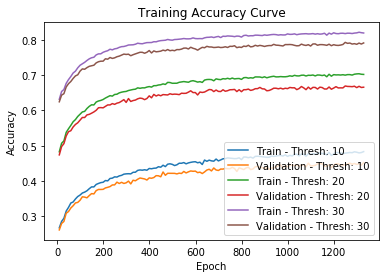

---[ITER 10] loss: 0.271400  time: 0.251
---[ITER 20] loss: 0.277453  time: 0.150
---[ITER 30] loss: 0.268656  time: 0.360
---[ITER 40] loss: 0.270396  time: 0.213
---[ITER 50] loss: 0.273478  time: 0.227
---[ITER 60] loss: 0.273532  time: 0.189
---[ITER 70] loss: 0.264787  time: 0.225
---[ITER 80] loss: 0.276807  time: 0.209
---[ITER 90] loss: 0.263102  time: 0.207
---[ITER 100] loss: 0.269687  time: 0.162
---[ITER 110] loss: 0.270367  time: 0.174
---[ITER 120] loss: 0.270249  time: 0.186
---[ITER 130] loss: 0.272809  time: 0.206
---[ITER 140] loss: 0.274648  time: 0.229
---[ITER 150] loss: 0.271999  time: 0.208
---[ITER 160] loss: 0.276523  time: 0.187
[EPOCH 1331] loss: 0.271718  time: 3.533
---[ITER 10] loss: 0.268405  time: 0.253
---[ITER 20] loss: 0.274804  time: 0.201
---[ITER 30] loss: 0.273161  time: 0.323
---[ITER 40] loss: 0.272745  time: 0.194
---[ITER 50] loss: 0.277479  time: 0.369
---[ITER 60] loss: 0.272153  time: 0.230
---[ITER 70] loss: 0.273275  time: 0.165
---[ITER 

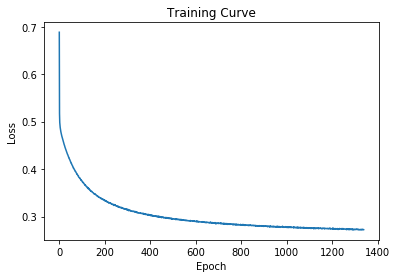

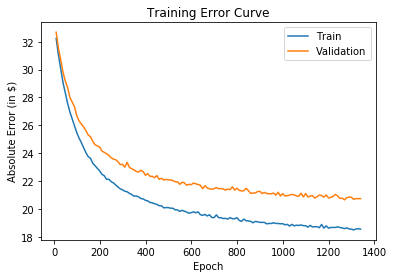

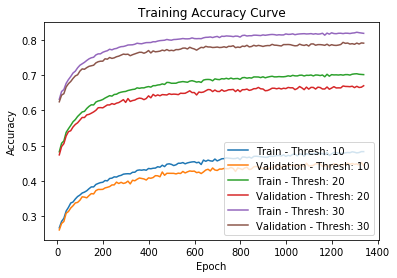

---[ITER 10] loss: 0.263063  time: 0.362
---[ITER 20] loss: 0.273842  time: 0.393
---[ITER 30] loss: 0.273377  time: 0.439
---[ITER 40] loss: 0.267308  time: 0.297
---[ITER 50] loss: 0.273564  time: 0.237
---[ITER 60] loss: 0.271432  time: 0.162
---[ITER 70] loss: 0.268694  time: 0.181
---[ITER 80] loss: 0.269882  time: 0.212
---[ITER 90] loss: 0.275500  time: 0.157
---[ITER 100] loss: 0.270269  time: 0.172
---[ITER 110] loss: 0.276173  time: 0.180
---[ITER 120] loss: 0.275495  time: 0.197
---[ITER 130] loss: 0.267874  time: 0.216
---[ITER 140] loss: 0.272926  time: 0.177
---[ITER 150] loss: 0.276812  time: 0.265
---[ITER 160] loss: 0.274216  time: 0.239
[EPOCH 1341] loss: 0.272145  time: 4.146
---[ITER 10] loss: 0.277999  time: 0.385
---[ITER 20] loss: 0.271899  time: 0.355
---[ITER 30] loss: 0.275757  time: 0.202
---[ITER 40] loss: 0.278436  time: 0.155
---[ITER 50] loss: 0.273641  time: 0.192
---[ITER 60] loss: 0.276067  time: 0.175
---[ITER 70] loss: 0.271623  time: 0.181
---[ITER 

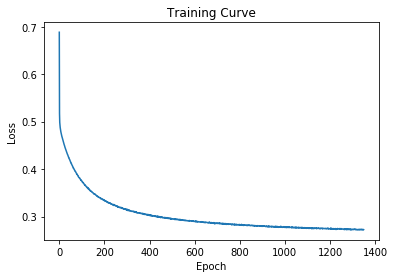

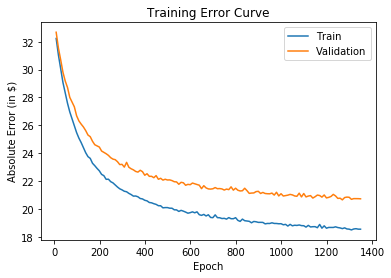

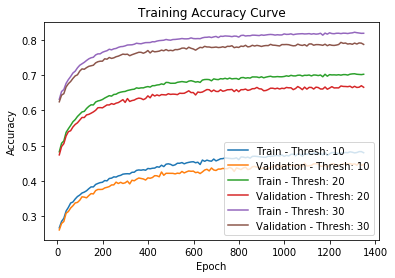

---[ITER 10] loss: 0.269347  time: 0.417
---[ITER 20] loss: 0.270110  time: 0.170
---[ITER 30] loss: 0.267584  time: 0.162
---[ITER 40] loss: 0.278321  time: 0.182
---[ITER 50] loss: 0.264025  time: 0.150
---[ITER 60] loss: 0.271048  time: 0.206
---[ITER 70] loss: 0.274399  time: 0.158
---[ITER 80] loss: 0.271098  time: 0.170
---[ITER 90] loss: 0.269706  time: 0.213
---[ITER 100] loss: 0.272697  time: 0.349
---[ITER 110] loss: 0.274657  time: 0.206
---[ITER 120] loss: 0.271563  time: 0.160
---[ITER 130] loss: 0.277939  time: 0.281
---[ITER 140] loss: 0.275331  time: 0.228
---[ITER 150] loss: 0.276796  time: 0.173
---[ITER 160] loss: 0.272228  time: 0.235
[EPOCH 1351] loss: 0.272351  time: 3.622
---[ITER 10] loss: 0.271913  time: 0.475
---[ITER 20] loss: 0.271875  time: 0.182
---[ITER 30] loss: 0.273138  time: 0.146
---[ITER 40] loss: 0.276892  time: 0.187
---[ITER 50] loss: 0.265399  time: 0.164
---[ITER 60] loss: 0.269816  time: 0.213
---[ITER 70] loss: 0.277708  time: 0.198
---[ITER 

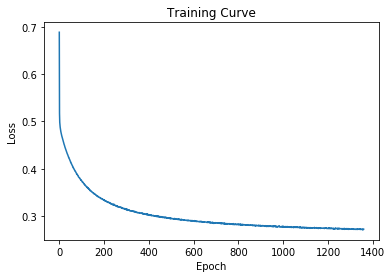

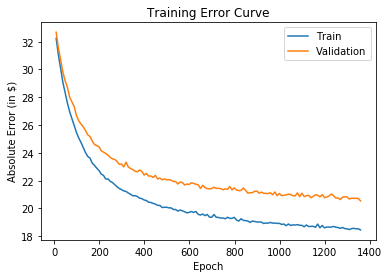

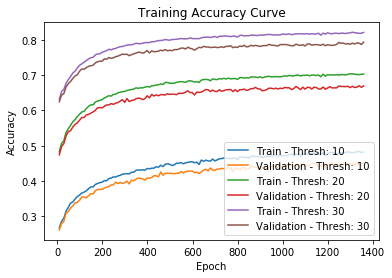

---[ITER 10] loss: 0.273189  time: 0.290
---[ITER 20] loss: 0.270211  time: 0.174
---[ITER 30] loss: 0.270714  time: 0.285
---[ITER 40] loss: 0.273571  time: 0.191
---[ITER 50] loss: 0.274487  time: 0.165
---[ITER 60] loss: 0.275883  time: 0.167
---[ITER 70] loss: 0.271903  time: 0.176
---[ITER 80] loss: 0.271771  time: 0.166
---[ITER 90] loss: 0.264931  time: 0.234
---[ITER 100] loss: 0.275579  time: 0.211
---[ITER 110] loss: 0.271014  time: 0.170
---[ITER 120] loss: 0.277108  time: 0.219
---[ITER 130] loss: 0.273378  time: 0.215
---[ITER 140] loss: 0.273070  time: 0.236
---[ITER 150] loss: 0.276190  time: 0.192
---[ITER 160] loss: 0.271254  time: 0.182
[EPOCH 1361] loss: 0.272542  time: 3.413
---[ITER 10] loss: 0.270660  time: 0.932
---[ITER 20] loss: 0.275309  time: 0.223
---[ITER 30] loss: 0.272647  time: 0.621
---[ITER 40] loss: 0.272863  time: 0.617
---[ITER 50] loss: 0.269854  time: 0.192
---[ITER 60] loss: 0.271634  time: 0.153
---[ITER 70] loss: 0.275426  time: 0.235
---[ITER 

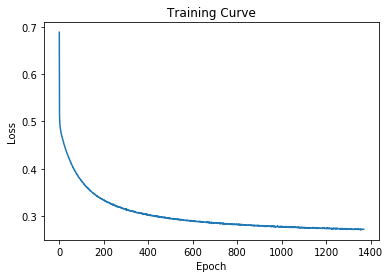

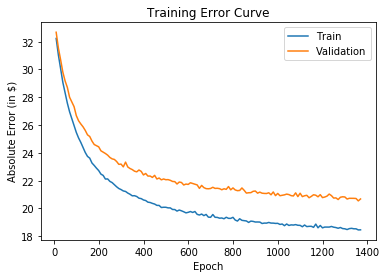

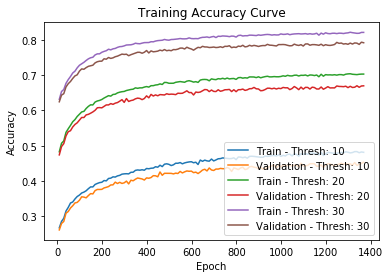

---[ITER 10] loss: 0.270574  time: 0.370
---[ITER 20] loss: 0.279001  time: 0.157
---[ITER 30] loss: 0.272178  time: 0.797
---[ITER 40] loss: 0.269224  time: 0.274
---[ITER 50] loss: 0.269223  time: 0.235
---[ITER 60] loss: 0.269601  time: 0.195
---[ITER 70] loss: 0.265743  time: 0.309
---[ITER 80] loss: 0.269712  time: 0.262
---[ITER 90] loss: 0.269396  time: 0.237
---[ITER 100] loss: 0.272311  time: 0.223
---[ITER 110] loss: 0.269139  time: 0.530
---[ITER 120] loss: 0.273946  time: 0.573
---[ITER 130] loss: 0.272629  time: 0.312
---[ITER 140] loss: 0.272062  time: 0.238
---[ITER 150] loss: 0.272692  time: 0.296
---[ITER 160] loss: 0.275578  time: 0.345
[EPOCH 1371] loss: 0.271377  time: 5.804
---[ITER 10] loss: 0.265398  time: 0.384
---[ITER 20] loss: 0.273909  time: 1.335
---[ITER 30] loss: 0.272888  time: 0.547
---[ITER 40] loss: 0.271713  time: 0.594
---[ITER 50] loss: 0.266135  time: 0.341
---[ITER 60] loss: 0.265813  time: 0.215
---[ITER 70] loss: 0.265462  time: 0.169
---[ITER 

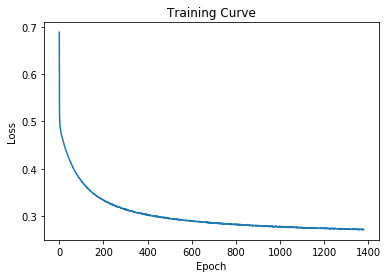

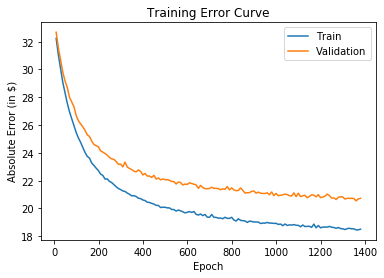

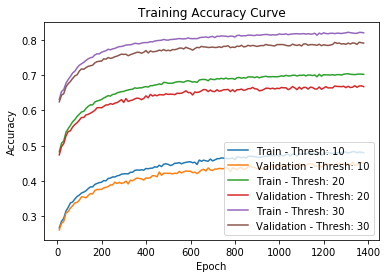

---[ITER 10] loss: 0.270145  time: 0.230
---[ITER 20] loss: 0.269921  time: 0.287
---[ITER 30] loss: 0.277209  time: 0.162
---[ITER 40] loss: 0.268036  time: 0.177
---[ITER 50] loss: 0.271346  time: 0.169
---[ITER 60] loss: 0.269090  time: 0.199
---[ITER 70] loss: 0.270980  time: 0.193
---[ITER 80] loss: 0.268810  time: 0.176
---[ITER 90] loss: 0.268853  time: 0.170
---[ITER 100] loss: 0.268779  time: 0.208
---[ITER 110] loss: 0.275143  time: 0.161
---[ITER 120] loss: 0.269562  time: 0.190
---[ITER 130] loss: 0.277893  time: 0.237
---[ITER 140] loss: 0.271767  time: 0.193
---[ITER 150] loss: 0.272237  time: 0.202
---[ITER 160] loss: 0.278364  time: 0.167
[EPOCH 1381] loss: 0.271575  time: 3.278
---[ITER 10] loss: 0.272291  time: 0.246
---[ITER 20] loss: 0.269450  time: 0.298
---[ITER 30] loss: 0.267348  time: 0.171
---[ITER 40] loss: 0.271768  time: 0.171
---[ITER 50] loss: 0.275881  time: 0.171
---[ITER 60] loss: 0.274468  time: 0.169
---[ITER 70] loss: 0.276596  time: 0.225
---[ITER 

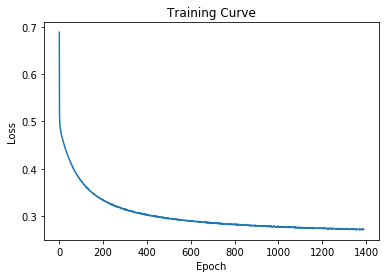

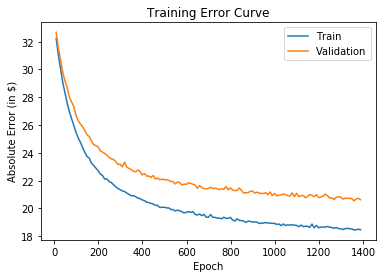

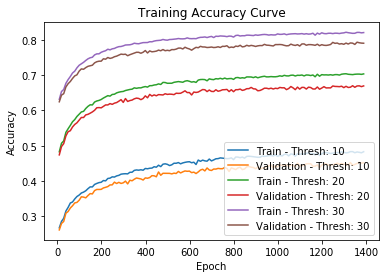

---[ITER 10] loss: 0.274789  time: 0.396
---[ITER 20] loss: 0.272322  time: 0.227
---[ITER 30] loss: 0.275906  time: 0.225
---[ITER 40] loss: 0.270179  time: 0.147
---[ITER 50] loss: 0.268712  time: 0.186
---[ITER 60] loss: 0.275308  time: 0.184
---[ITER 70] loss: 0.269228  time: 0.183
---[ITER 80] loss: 0.270947  time: 0.208
---[ITER 90] loss: 0.265312  time: 0.161
---[ITER 100] loss: 0.265709  time: 0.163
---[ITER 110] loss: 0.274626  time: 0.169
---[ITER 120] loss: 0.271166  time: 0.228
---[ITER 130] loss: 0.274118  time: 0.178
---[ITER 140] loss: 0.272015  time: 0.168
---[ITER 150] loss: 0.273836  time: 0.171
---[ITER 160] loss: 0.270513  time: 0.163
[EPOCH 1391] loss: 0.271367  time: 3.324
---[ITER 10] loss: 0.267774  time: 0.407
---[ITER 20] loss: 0.270989  time: 0.165
---[ITER 30] loss: 0.274497  time: 0.151
---[ITER 40] loss: 0.273418  time: 0.166
---[ITER 50] loss: 0.267969  time: 0.172
---[ITER 60] loss: 0.268199  time: 0.208
---[ITER 70] loss: 0.270983  time: 0.145
---[ITER 

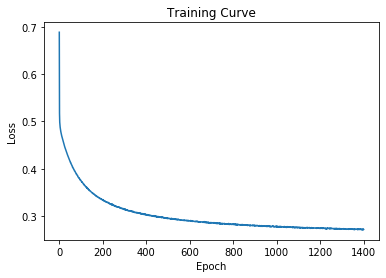

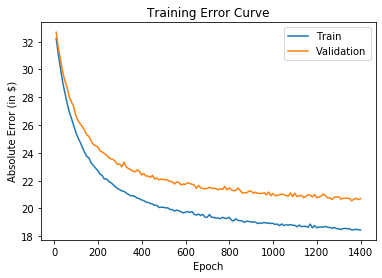

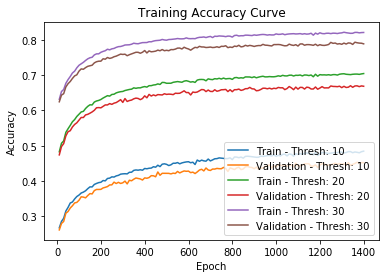

---[ITER 10] loss: 0.268453  time: 0.385
---[ITER 20] loss: 0.266668  time: 0.332
---[ITER 30] loss: 0.270660  time: 0.315
---[ITER 40] loss: 0.278883  time: 0.253
---[ITER 50] loss: 0.263579  time: 0.194
---[ITER 60] loss: 0.269807  time: 0.150
---[ITER 70] loss: 0.272844  time: 0.189
---[ITER 80] loss: 0.271968  time: 0.176
---[ITER 90] loss: 0.266847  time: 0.152
---[ITER 100] loss: 0.271969  time: 0.200
---[ITER 110] loss: 0.276749  time: 0.209
---[ITER 120] loss: 0.271989  time: 0.253
---[ITER 130] loss: 0.277244  time: 0.225
---[ITER 140] loss: 0.269987  time: 0.217
---[ITER 150] loss: 0.273287  time: 0.204
---[ITER 160] loss: 0.277280  time: 0.229
[EPOCH 1401] loss: 0.271715  time: 3.843
---[ITER 10] loss: 0.271742  time: 0.297
---[ITER 20] loss: 0.274695  time: 0.227
---[ITER 30] loss: 0.260917  time: 0.466
---[ITER 40] loss: 0.270427  time: 0.430
---[ITER 50] loss: 0.276810  time: 0.417
---[ITER 60] loss: 0.270001  time: 0.333
---[ITER 70] loss: 0.270973  time: 0.681
---[ITER 

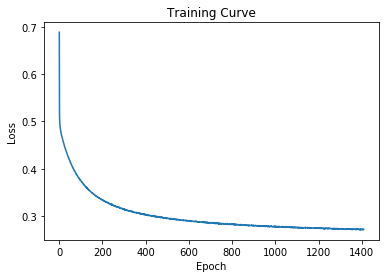

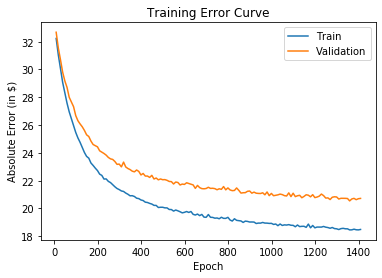

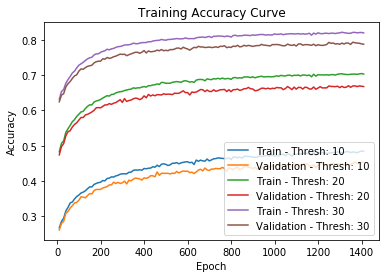

---[ITER 10] loss: 0.274737  time: 0.239
---[ITER 20] loss: 0.265581  time: 0.283
---[ITER 30] loss: 0.267309  time: 0.160
---[ITER 40] loss: 0.270707  time: 0.164
---[ITER 50] loss: 0.268243  time: 0.268
---[ITER 60] loss: 0.273070  time: 0.371
---[ITER 70] loss: 0.271790  time: 0.194
---[ITER 80] loss: 0.271680  time: 0.303
---[ITER 90] loss: 0.270056  time: 0.267
---[ITER 100] loss: 0.273958  time: 0.275
---[ITER 110] loss: 0.265964  time: 0.245
---[ITER 120] loss: 0.273629  time: 0.231
---[ITER 130] loss: 0.274111  time: 0.203
---[ITER 140] loss: 0.268692  time: 0.192
---[ITER 150] loss: 0.277608  time: 0.304
---[ITER 160] loss: 0.274557  time: 0.200
[EPOCH 1411] loss: 0.271386  time: 4.029
---[ITER 10] loss: 0.274082  time: 0.253
---[ITER 20] loss: 0.271688  time: 0.281
---[ITER 30] loss: 0.267749  time: 0.262
---[ITER 40] loss: 0.267981  time: 0.191
---[ITER 50] loss: 0.277870  time: 0.232
---[ITER 60] loss: 0.269725  time: 0.476
---[ITER 70] loss: 0.272867  time: 0.357
---[ITER 

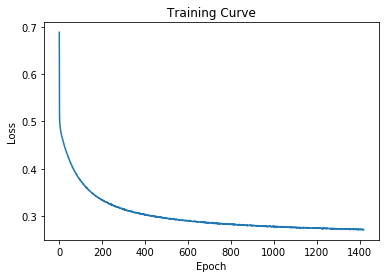

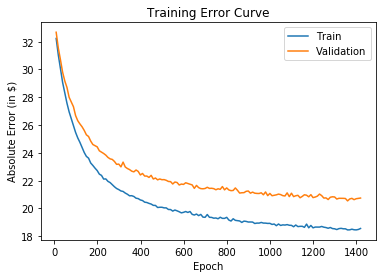

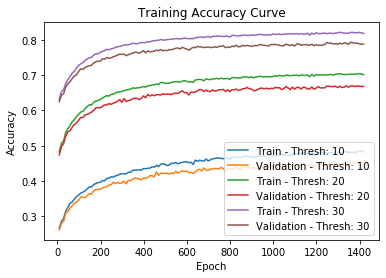

---[ITER 10] loss: 0.271952  time: 0.357
---[ITER 20] loss: 0.268397  time: 0.166
---[ITER 30] loss: 0.271188  time: 0.154
---[ITER 40] loss: 0.264695  time: 0.173
---[ITER 50] loss: 0.273953  time: 0.152
---[ITER 60] loss: 0.272211  time: 0.185
---[ITER 70] loss: 0.273758  time: 0.163
---[ITER 80] loss: 0.268281  time: 0.161
---[ITER 90] loss: 0.283334  time: 0.171
---[ITER 100] loss: 0.271139  time: 0.154
---[ITER 110] loss: 0.276402  time: 0.176
---[ITER 120] loss: 0.275662  time: 0.196
---[ITER 130] loss: 0.265240  time: 0.191
---[ITER 140] loss: 0.267550  time: 0.154
---[ITER 150] loss: 0.274105  time: 0.168
---[ITER 160] loss: 0.271726  time: 0.157
[EPOCH 1421] loss: 0.271767  time: 3.023
---[ITER 10] loss: 0.279004  time: 0.371
---[ITER 20] loss: 0.270350  time: 0.161
---[ITER 30] loss: 0.274237  time: 0.168
---[ITER 40] loss: 0.275012  time: 0.157
---[ITER 50] loss: 0.268504  time: 0.180
---[ITER 60] loss: 0.270632  time: 0.190
---[ITER 70] loss: 0.266296  time: 0.163
---[ITER 

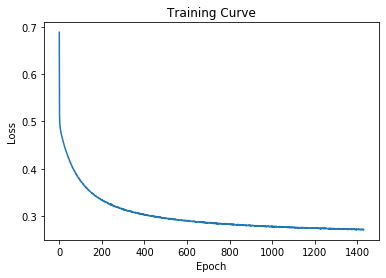

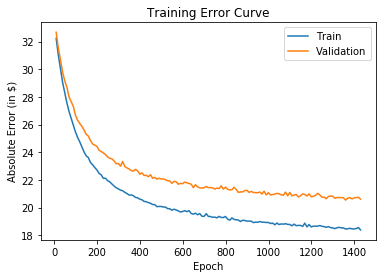

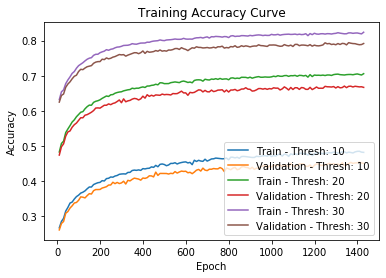

---[ITER 10] loss: 0.272905  time: 0.382
---[ITER 20] loss: 0.267789  time: 0.142
---[ITER 30] loss: 0.268762  time: 0.180
---[ITER 40] loss: 0.270774  time: 0.182
---[ITER 50] loss: 0.274228  time: 0.159
---[ITER 60] loss: 0.274114  time: 0.155
---[ITER 70] loss: 0.276135  time: 0.165
---[ITER 80] loss: 0.272634  time: 0.155
---[ITER 90] loss: 0.268353  time: 0.152
---[ITER 100] loss: 0.271627  time: 0.205
---[ITER 110] loss: 0.273263  time: 0.180
---[ITER 120] loss: 0.270359  time: 0.194
---[ITER 130] loss: 0.271704  time: 0.191
---[ITER 140] loss: 0.264403  time: 0.211
---[ITER 150] loss: 0.270605  time: 0.206
---[ITER 160] loss: 0.269990  time: 0.185
[EPOCH 1431] loss: 0.271264  time: 3.212
---[ITER 10] loss: 0.275817  time: 0.358
---[ITER 20] loss: 0.275447  time: 0.182
---[ITER 30] loss: 0.271462  time: 0.199
---[ITER 40] loss: 0.268796  time: 0.171
---[ITER 50] loss: 0.266955  time: 0.173
---[ITER 60] loss: 0.271560  time: 0.431
---[ITER 70] loss: 0.269864  time: 0.384
---[ITER 

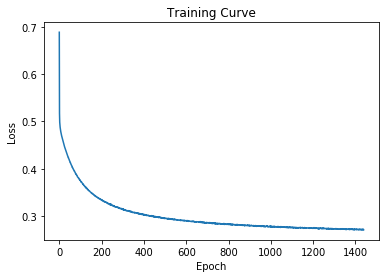

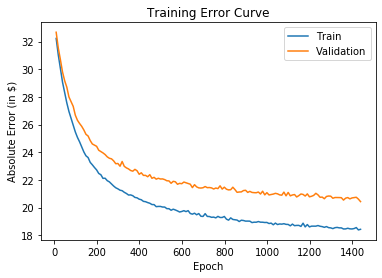

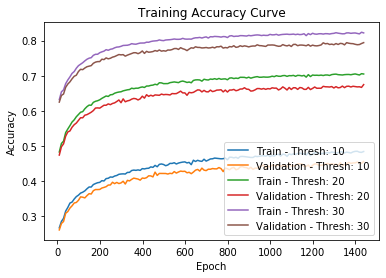

---[ITER 10] loss: 0.275571  time: 0.255
---[ITER 20] loss: 0.271466  time: 0.161
---[ITER 30] loss: 0.277514  time: 0.255
---[ITER 40] loss: 0.272489  time: 0.151
---[ITER 50] loss: 0.268483  time: 0.219
---[ITER 60] loss: 0.272961  time: 0.150
---[ITER 70] loss: 0.266654  time: 0.165
---[ITER 80] loss: 0.269278  time: 0.152
---[ITER 90] loss: 0.273056  time: 0.165
---[ITER 100] loss: 0.268535  time: 0.157
---[ITER 110] loss: 0.268731  time: 0.168
---[ITER 120] loss: 0.272037  time: 0.189
---[ITER 130] loss: 0.265934  time: 0.148
---[ITER 140] loss: 0.276371  time: 0.220
---[ITER 150] loss: 0.274493  time: 0.166
---[ITER 160] loss: 0.271173  time: 0.166
[EPOCH 1441] loss: 0.271421  time: 3.031
---[ITER 10] loss: 0.269544  time: 0.261
---[ITER 20] loss: 0.267142  time: 0.160
---[ITER 30] loss: 0.271276  time: 0.261
---[ITER 40] loss: 0.274552  time: 0.172
---[ITER 50] loss: 0.272403  time: 0.194
---[ITER 60] loss: 0.267697  time: 0.158
---[ITER 70] loss: 0.270657  time: 0.165
---[ITER 

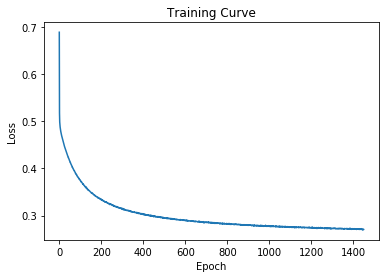

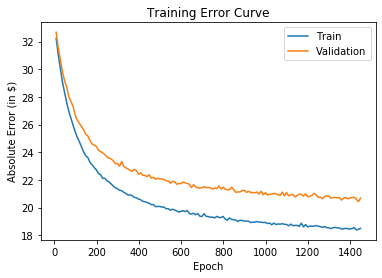

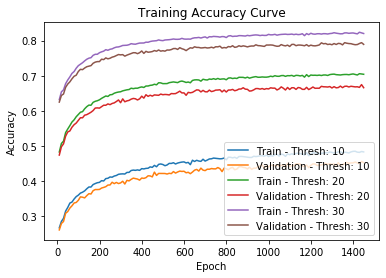

---[ITER 10] loss: 0.271842  time: 0.225
---[ITER 20] loss: 0.272710  time: 0.277
---[ITER 30] loss: 0.269634  time: 0.146
---[ITER 40] loss: 0.267652  time: 0.156
---[ITER 50] loss: 0.269578  time: 0.188
---[ITER 60] loss: 0.264762  time: 0.169
---[ITER 70] loss: 0.271263  time: 0.156
---[ITER 80] loss: 0.272881  time: 0.161
---[ITER 90] loss: 0.267918  time: 0.146
---[ITER 100] loss: 0.275989  time: 0.171
---[ITER 110] loss: 0.269819  time: 0.167
---[ITER 120] loss: 0.268773  time: 0.181
---[ITER 130] loss: 0.271611  time: 0.192
---[ITER 140] loss: 0.276919  time: 0.164
---[ITER 150] loss: 0.270231  time: 0.154
---[ITER 160] loss: 0.275751  time: 0.468
[EPOCH 1451] loss: 0.271121  time: 3.332
---[ITER 10] loss: 0.266698  time: 0.376
---[ITER 20] loss: 0.267418  time: 0.431
---[ITER 30] loss: 0.276514  time: 0.299
---[ITER 40] loss: 0.272021  time: 0.178
---[ITER 50] loss: 0.274480  time: 0.175
---[ITER 60] loss: 0.268117  time: 0.160
---[ITER 70] loss: 0.267974  time: 0.173
---[ITER 

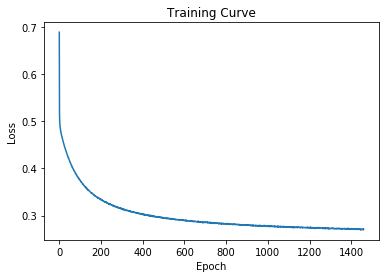

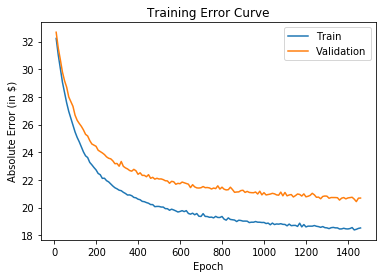

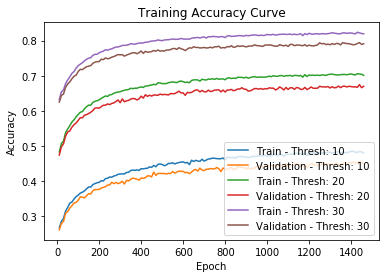

---[ITER 10] loss: 0.272640  time: 0.353
---[ITER 20] loss: 0.265208  time: 0.183
---[ITER 30] loss: 0.273235  time: 0.162
---[ITER 40] loss: 0.271651  time: 0.160
---[ITER 50] loss: 0.276339  time: 0.147
---[ITER 60] loss: 0.280304  time: 0.164
---[ITER 70] loss: 0.266642  time: 0.179
---[ITER 80] loss: 0.268100  time: 0.189
---[ITER 90] loss: 0.270326  time: 0.172
---[ITER 100] loss: 0.272541  time: 0.157
---[ITER 110] loss: 0.268042  time: 0.163
---[ITER 120] loss: 0.264921  time: 0.141
---[ITER 130] loss: 0.274822  time: 0.206
---[ITER 140] loss: 0.258848  time: 0.183
---[ITER 150] loss: 0.270576  time: 0.167
---[ITER 160] loss: 0.276721  time: 0.163
[EPOCH 1461] loss: 0.270850  time: 3.047
---[ITER 10] loss: 0.268087  time: 0.376
---[ITER 20] loss: 0.274839  time: 0.217
---[ITER 30] loss: 0.270064  time: 0.158
---[ITER 40] loss: 0.264132  time: 0.162
---[ITER 50] loss: 0.267992  time: 0.174
---[ITER 60] loss: 0.274760  time: 0.156
---[ITER 70] loss: 0.267266  time: 0.200
---[ITER 

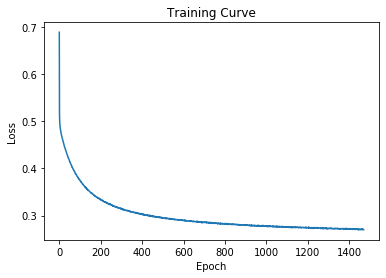

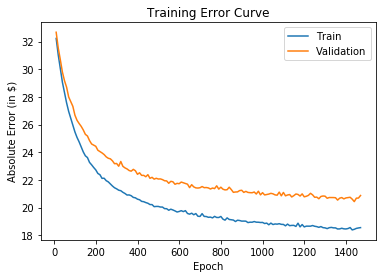

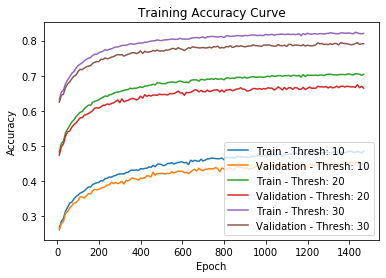

---[ITER 10] loss: 0.270019  time: 0.224
---[ITER 20] loss: 0.267426  time: 0.164
---[ITER 30] loss: 0.268983  time: 0.174
---[ITER 40] loss: 0.271000  time: 0.293
---[ITER 50] loss: 0.274250  time: 0.189
---[ITER 60] loss: 0.266657  time: 0.160
---[ITER 70] loss: 0.274698  time: 0.140
---[ITER 80] loss: 0.269287  time: 0.167
---[ITER 90] loss: 0.271498  time: 0.185
---[ITER 100] loss: 0.274303  time: 0.170
---[ITER 110] loss: 0.273490  time: 0.154
---[ITER 120] loss: 0.270836  time: 0.158
---[ITER 130] loss: 0.268788  time: 0.165
---[ITER 140] loss: 0.272380  time: 0.163
---[ITER 150] loss: 0.269847  time: 0.212
---[ITER 160] loss: 0.277399  time: 0.189
[EPOCH 1471] loss: 0.271420  time: 3.062
---[ITER 10] loss: 0.271879  time: 0.246
---[ITER 20] loss: 0.269142  time: 0.145
---[ITER 30] loss: 0.278855  time: 0.177
---[ITER 40] loss: 0.269867  time: 0.308
---[ITER 50] loss: 0.269978  time: 0.154
---[ITER 60] loss: 0.265222  time: 0.160
---[ITER 70] loss: 0.271032  time: 0.152
---[ITER 

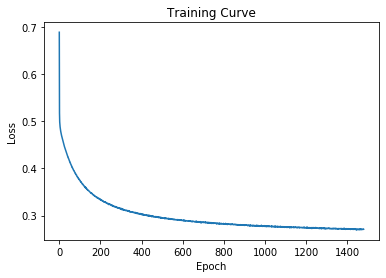

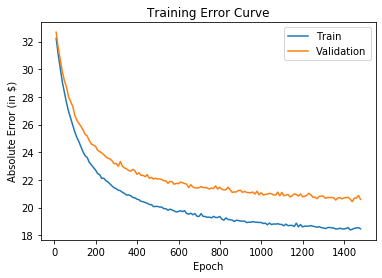

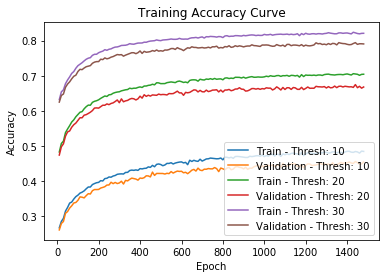

---[ITER 10] loss: 0.270348  time: 0.937
---[ITER 20] loss: 0.275576  time: 0.359
---[ITER 30] loss: 0.268228  time: 0.265
---[ITER 40] loss: 0.267591  time: 0.178
---[ITER 50] loss: 0.265441  time: 0.276
---[ITER 60] loss: 0.268944  time: 0.227
---[ITER 70] loss: 0.270414  time: 0.210
---[ITER 80] loss: 0.269996  time: 0.212
---[ITER 90] loss: 0.275820  time: 0.234
---[ITER 100] loss: 0.271718  time: 0.181
---[ITER 110] loss: 0.279339  time: 0.215
---[ITER 120] loss: 0.265752  time: 0.208
---[ITER 130] loss: 0.268836  time: 0.189
---[ITER 140] loss: 0.277509  time: 0.190
---[ITER 150] loss: 0.266025  time: 0.235
---[ITER 160] loss: 0.268788  time: 0.230
[EPOCH 1481] loss: 0.270747  time: 4.487
---[ITER 10] loss: 0.268210  time: 0.291
---[ITER 20] loss: 0.268863  time: 0.190
---[ITER 30] loss: 0.272201  time: 0.596
---[ITER 40] loss: 0.273336  time: 0.260
---[ITER 50] loss: 0.272483  time: 0.148
---[ITER 60] loss: 0.273479  time: 0.555
---[ITER 70] loss: 0.267641  time: 0.455
---[ITER 

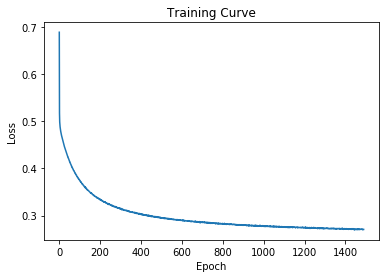

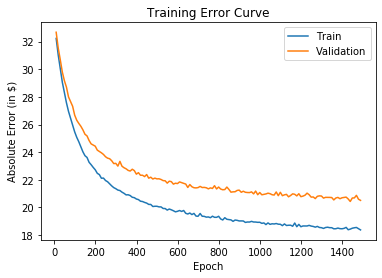

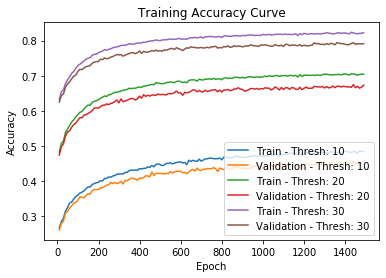

---[ITER 10] loss: 0.269785  time: 0.231
---[ITER 20] loss: 0.271856  time: 0.279
---[ITER 30] loss: 0.262700  time: 0.150
---[ITER 40] loss: 0.269679  time: 0.171
---[ITER 50] loss: 0.272234  time: 0.164
---[ITER 60] loss: 0.274191  time: 0.152
---[ITER 70] loss: 0.271009  time: 0.157
---[ITER 80] loss: 0.268762  time: 0.154
---[ITER 90] loss: 0.271275  time: 0.151
---[ITER 100] loss: 0.265965  time: 0.160
---[ITER 110] loss: 0.269725  time: 0.156
---[ITER 120] loss: 0.266323  time: 0.152
---[ITER 130] loss: 0.276770  time: 0.230
---[ITER 140] loss: 0.267924  time: 0.136
---[ITER 150] loss: 0.269596  time: 0.149
---[ITER 160] loss: 0.269736  time: 0.152
[EPOCH 1491] loss: 0.269580  time: 2.883
---[ITER 10] loss: 0.270094  time: 0.227
---[ITER 20] loss: 0.267055  time: 0.248
---[ITER 30] loss: 0.273804  time: 0.184
---[ITER 40] loss: 0.273817  time: 0.157
---[ITER 50] loss: 0.268802  time: 0.157
---[ITER 60] loss: 0.269562  time: 0.166
---[ITER 70] loss: 0.266246  time: 0.191
---[ITER 

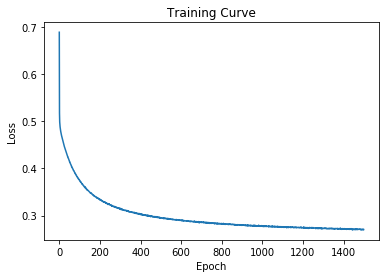

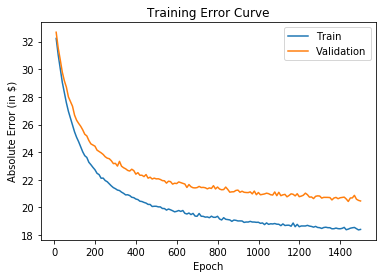

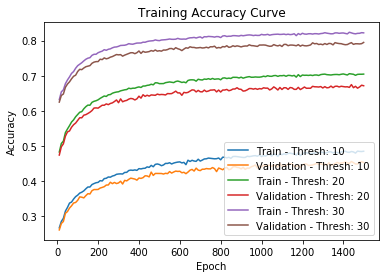

---[ITER 10] loss: 0.274355  time: 0.399
---[ITER 20] loss: 0.263869  time: 0.176
---[ITER 30] loss: 0.268521  time: 0.184
---[ITER 40] loss: 0.276503  time: 0.154
---[ITER 50] loss: 0.269719  time: 0.145
---[ITER 60] loss: 0.271428  time: 0.151
---[ITER 70] loss: 0.266624  time: 0.152
---[ITER 80] loss: 0.270638  time: 0.210
---[ITER 90] loss: 0.272217  time: 0.163
---[ITER 100] loss: 0.272725  time: 0.171
---[ITER 110] loss: 0.267843  time: 0.157
---[ITER 120] loss: 0.270077  time: 0.265
---[ITER 130] loss: 0.274241  time: 0.278
---[ITER 140] loss: 0.268514  time: 0.510
---[ITER 150] loss: 0.268563  time: 0.296
---[ITER 160] loss: 0.269377  time: 0.170
[EPOCH 1501] loss: 0.270242  time: 3.747
---[ITER 10] loss: 0.265231  time: 0.368
---[ITER 20] loss: 0.270157  time: 0.218
---[ITER 30] loss: 0.261233  time: 0.188
---[ITER 40] loss: 0.266303  time: 0.206
---[ITER 50] loss: 0.272430  time: 0.146
---[ITER 60] loss: 0.271932  time: 0.187
---[ITER 70] loss: 0.269311  time: 0.171
---[ITER 

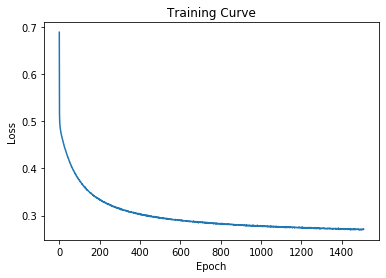

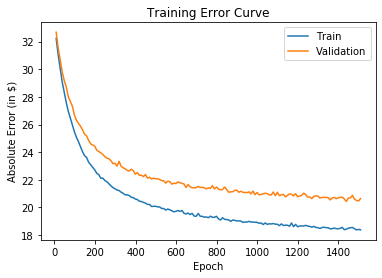

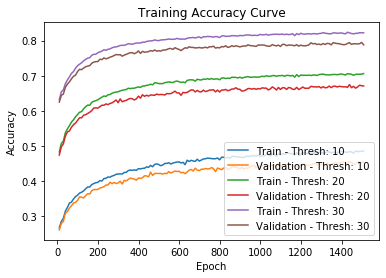

---[ITER 10] loss: 0.271827  time: 0.261
---[ITER 20] loss: 0.266245  time: 0.173
---[ITER 30] loss: 0.266712  time: 0.264
---[ITER 40] loss: 0.269532  time: 0.160
---[ITER 50] loss: 0.270985  time: 0.179
---[ITER 60] loss: 0.277651  time: 0.189
---[ITER 70] loss: 0.267254  time: 0.144
---[ITER 80] loss: 0.274621  time: 0.176
---[ITER 90] loss: 0.275178  time: 0.170
---[ITER 100] loss: 0.271693  time: 0.189
---[ITER 110] loss: 0.273378  time: 0.185
---[ITER 120] loss: 0.272131  time: 0.170
---[ITER 130] loss: 0.271315  time: 0.173
---[ITER 140] loss: 0.264592  time: 0.200
---[ITER 150] loss: 0.271750  time: 0.189
---[ITER 160] loss: 0.269772  time: 0.206
[EPOCH 1511] loss: 0.270807  time: 3.170
---[ITER 10] loss: 0.271206  time: 0.250
---[ITER 20] loss: 0.274042  time: 0.172
---[ITER 30] loss: 0.273616  time: 0.264
---[ITER 40] loss: 0.263496  time: 0.182
---[ITER 50] loss: 0.265588  time: 0.201
---[ITER 60] loss: 0.268614  time: 0.156
---[ITER 70] loss: 0.274615  time: 0.161
---[ITER 

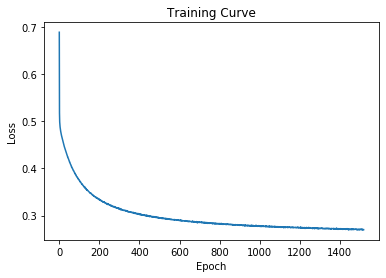

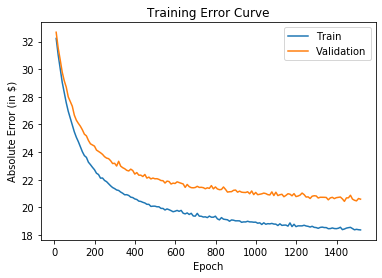

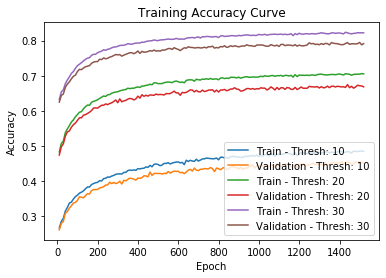

---[ITER 10] loss: 0.266223  time: 0.310
---[ITER 20] loss: 0.272010  time: 0.342
---[ITER 30] loss: 0.268698  time: 0.175
---[ITER 40] loss: 0.275167  time: 0.296
---[ITER 50] loss: 0.269673  time: 0.176
---[ITER 60] loss: 0.269530  time: 0.224
---[ITER 70] loss: 0.276083  time: 0.187
---[ITER 80] loss: 0.269301  time: 0.290
---[ITER 90] loss: 0.270449  time: 0.265
---[ITER 100] loss: 0.274379  time: 0.252
---[ITER 110] loss: 0.268648  time: 0.155
---[ITER 120] loss: 0.263486  time: 0.182
---[ITER 130] loss: 0.266915  time: 0.322
---[ITER 140] loss: 0.273474  time: 0.275
---[ITER 150] loss: 0.271031  time: 0.219
---[ITER 160] loss: 0.271804  time: 0.168
[EPOCH 1521] loss: 0.270328  time: 3.984
---[ITER 10] loss: 0.268474  time: 0.231
---[ITER 20] loss: 0.267548  time: 0.312
---[ITER 30] loss: 0.269604  time: 0.178
---[ITER 40] loss: 0.271433  time: 0.183
---[ITER 50] loss: 0.269195  time: 0.173
---[ITER 60] loss: 0.275861  time: 0.335
---[ITER 70] loss: 0.268106  time: 0.420
---[ITER 

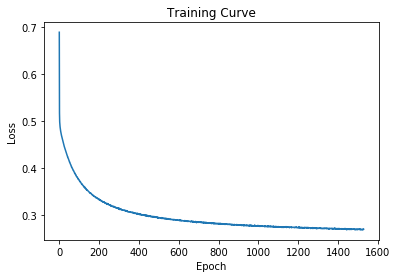

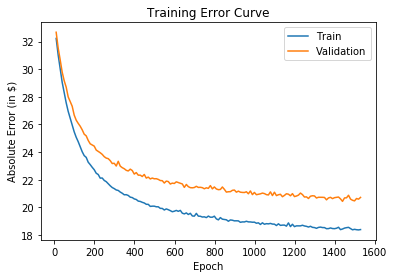

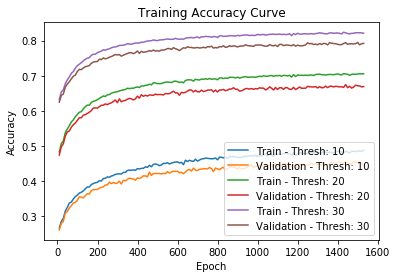

---[ITER 10] loss: 0.274779  time: 0.642
---[ITER 20] loss: 0.271151  time: 0.292
---[ITER 30] loss: 0.271265  time: 0.470
---[ITER 40] loss: 0.274570  time: 0.332
---[ITER 50] loss: 0.270255  time: 0.351
---[ITER 60] loss: 0.269656  time: 0.194
---[ITER 70] loss: 0.267169  time: 0.202
---[ITER 80] loss: 0.272680  time: 0.245
---[ITER 90] loss: 0.269263  time: 0.312
---[ITER 100] loss: 0.274375  time: 0.221
---[ITER 110] loss: 0.270531  time: 0.203
---[ITER 120] loss: 0.265121  time: 0.168
---[ITER 130] loss: 0.268433  time: 0.217
---[ITER 140] loss: 0.273865  time: 0.171
---[ITER 150] loss: 0.266940  time: 0.176
---[ITER 160] loss: 0.269287  time: 0.167
[EPOCH 1531] loss: 0.270506  time: 4.515
---[ITER 10] loss: 0.267587  time: 0.391
---[ITER 20] loss: 0.272001  time: 0.214
---[ITER 30] loss: 0.272434  time: 0.219
---[ITER 40] loss: 0.272509  time: 0.196
---[ITER 50] loss: 0.265818  time: 0.337
---[ITER 60] loss: 0.260407  time: 0.172
---[ITER 70] loss: 0.270458  time: 0.228
---[ITER 

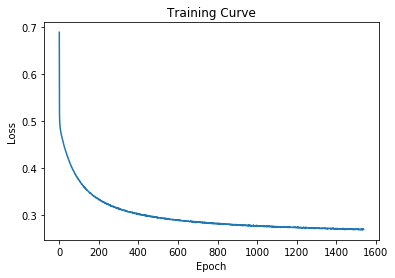

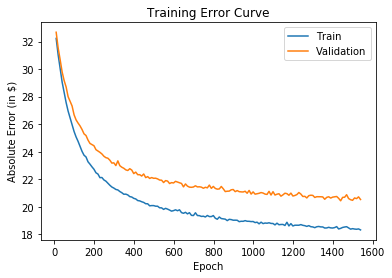

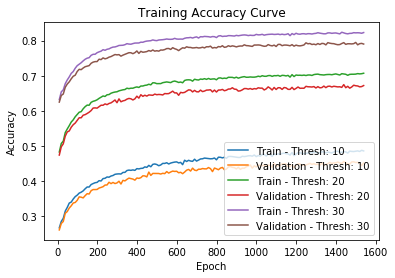

---[ITER 10] loss: 0.273048  time: 0.629
---[ITER 20] loss: 0.270869  time: 0.357
---[ITER 30] loss: 0.277742  time: 0.484
---[ITER 40] loss: 0.270422  time: 0.521
---[ITER 50] loss: 0.267539  time: 0.699
---[ITER 60] loss: 0.266276  time: 0.531
---[ITER 70] loss: 0.269422  time: 0.352
---[ITER 80] loss: 0.266903  time: 0.410
---[ITER 90] loss: 0.268124  time: 0.421
---[ITER 100] loss: 0.270277  time: 0.466
---[ITER 110] loss: 0.273406  time: 0.437
---[ITER 120] loss: 0.268733  time: 0.585
---[ITER 130] loss: 0.269056  time: 0.495
---[ITER 140] loss: 0.273477  time: 0.576
---[ITER 150] loss: 0.270465  time: 0.484
---[ITER 160] loss: 0.265921  time: 0.491
[EPOCH 1541] loss: 0.270092  time: 8.241
---[ITER 10] loss: 0.265799  time: 0.636
---[ITER 20] loss: 0.265465  time: 0.246
---[ITER 30] loss: 0.270062  time: 0.434
---[ITER 40] loss: 0.266638  time: 0.245
---[ITER 50] loss: 0.278863  time: 0.181
---[ITER 60] loss: 0.271036  time: 0.257
---[ITER 70] loss: 0.263186  time: 0.400
---[ITER 

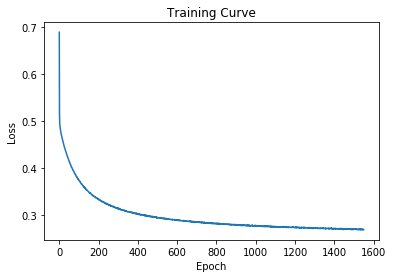

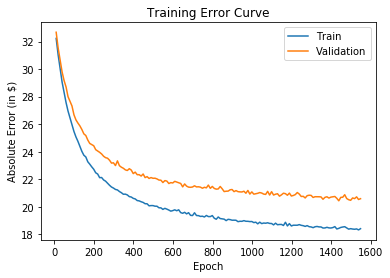

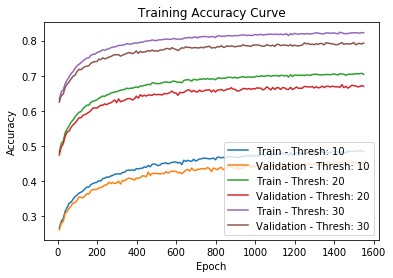

---[ITER 10] loss: 0.269706  time: 0.313
---[ITER 20] loss: 0.263143  time: 0.224
---[ITER 30] loss: 0.272328  time: 0.315
---[ITER 40] loss: 0.270355  time: 0.162
---[ITER 50] loss: 0.269921  time: 0.173
---[ITER 60] loss: 0.268646  time: 0.172
---[ITER 70] loss: 0.267418  time: 0.194
---[ITER 80] loss: 0.274048  time: 0.219
---[ITER 90] loss: 0.270147  time: 0.208
---[ITER 100] loss: 0.272093  time: 0.158
---[ITER 110] loss: 0.266393  time: 0.490
---[ITER 120] loss: 0.272973  time: 0.239
---[ITER 130] loss: 0.270749  time: 0.230
---[ITER 140] loss: 0.264452  time: 0.304
---[ITER 150] loss: 0.269653  time: 0.216
---[ITER 160] loss: 0.265611  time: 0.203
[EPOCH 1551] loss: 0.269406  time: 3.993
---[ITER 10] loss: 0.269891  time: 0.344
---[ITER 20] loss: 0.264214  time: 0.173
---[ITER 30] loss: 0.275175  time: 0.299
---[ITER 40] loss: 0.268690  time: 0.236
---[ITER 50] loss: 0.272518  time: 0.676
---[ITER 60] loss: 0.267554  time: 0.400
---[ITER 70] loss: 0.265369  time: 0.428
---[ITER 

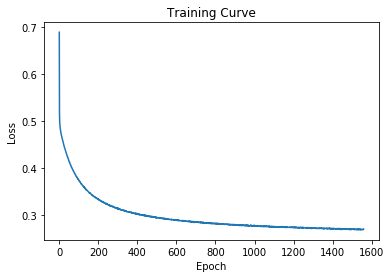

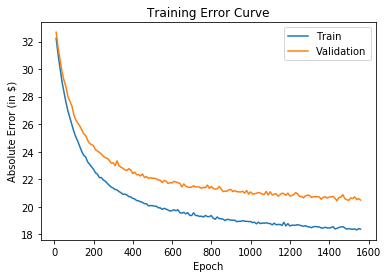

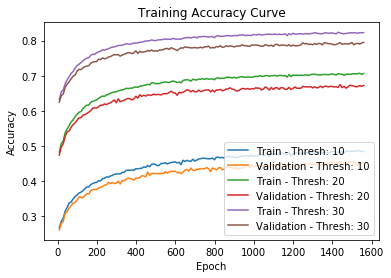

---[ITER 10] loss: 0.265273  time: 0.256
---[ITER 20] loss: 0.271382  time: 0.270
---[ITER 30] loss: 0.270536  time: 0.154
---[ITER 40] loss: 0.269080  time: 0.163
---[ITER 50] loss: 0.264718  time: 0.157
---[ITER 60] loss: 0.271917  time: 0.157
---[ITER 70] loss: 0.265982  time: 0.161
---[ITER 80] loss: 0.265489  time: 0.171
---[ITER 90] loss: 0.274454  time: 0.159
---[ITER 100] loss: 0.272750  time: 0.167
---[ITER 110] loss: 0.266671  time: 0.164
---[ITER 120] loss: 0.269351  time: 0.153
---[ITER 130] loss: 0.271107  time: 0.203
---[ITER 140] loss: 0.264441  time: 0.181
---[ITER 150] loss: 0.268788  time: 0.143
---[ITER 160] loss: 0.270867  time: 0.158
[EPOCH 1561] loss: 0.269318  time: 2.961
---[ITER 10] loss: 0.268195  time: 0.225
---[ITER 20] loss: 0.271840  time: 0.285
---[ITER 30] loss: 0.267489  time: 0.151
---[ITER 40] loss: 0.274641  time: 0.155
---[ITER 50] loss: 0.268140  time: 0.158
---[ITER 60] loss: 0.261361  time: 0.157
---[ITER 70] loss: 0.266703  time: 0.162
---[ITER 

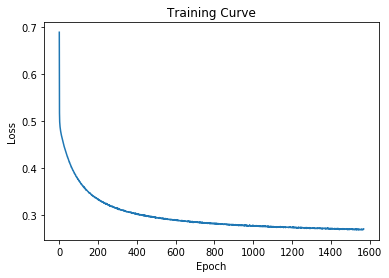

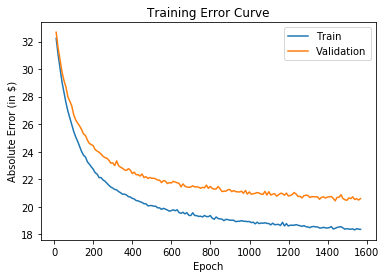

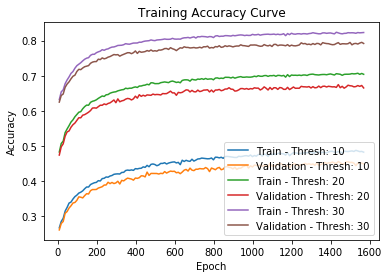

---[ITER 10] loss: 0.269114  time: 0.473
---[ITER 20] loss: 0.273829  time: 0.276
---[ITER 30] loss: 0.267456  time: 0.255
---[ITER 40] loss: 0.272397  time: 0.168
---[ITER 50] loss: 0.267422  time: 0.272
---[ITER 60] loss: 0.272358  time: 0.191
---[ITER 70] loss: 0.272286  time: 0.213
---[ITER 80] loss: 0.268691  time: 0.238
---[ITER 90] loss: 0.277594  time: 0.187
---[ITER 100] loss: 0.267179  time: 0.271
---[ITER 110] loss: 0.258448  time: 0.241
---[ITER 120] loss: 0.275054  time: 0.218
---[ITER 130] loss: 0.263892  time: 0.332
---[ITER 140] loss: 0.269299  time: 0.148
---[ITER 150] loss: 0.270852  time: 0.166
---[ITER 160] loss: 0.275609  time: 0.178
[EPOCH 1571] loss: 0.269940  time: 4.027
---[ITER 10] loss: 0.274119  time: 0.496
---[ITER 20] loss: 0.265107  time: 0.236
---[ITER 30] loss: 0.275842  time: 0.239
---[ITER 40] loss: 0.266920  time: 0.295
---[ITER 50] loss: 0.271537  time: 0.358
---[ITER 60] loss: 0.271538  time: 0.307
---[ITER 70] loss: 0.268907  time: 0.250
---[ITER 

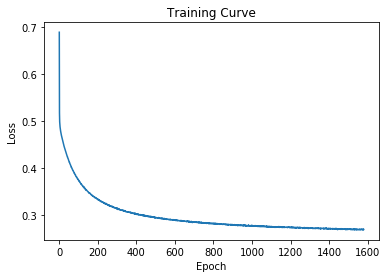

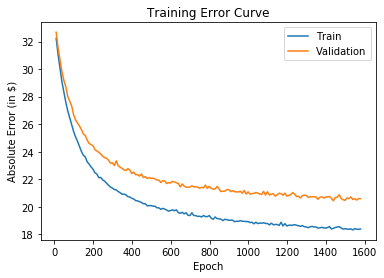

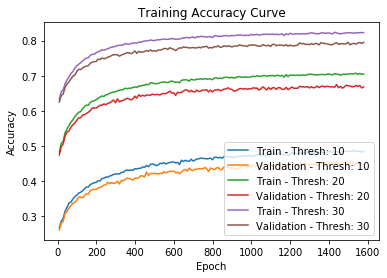

---[ITER 10] loss: 0.266663  time: 0.303
---[ITER 20] loss: 0.272646  time: 0.331
---[ITER 30] loss: 0.271605  time: 0.291
---[ITER 40] loss: 0.269420  time: 0.386
---[ITER 50] loss: 0.269207  time: 0.241
---[ITER 60] loss: 0.266959  time: 0.151
---[ITER 70] loss: 0.277486  time: 0.168
---[ITER 80] loss: 0.271723  time: 0.171
---[ITER 90] loss: 0.273858  time: 0.258
---[ITER 100] loss: 0.265334  time: 0.225
---[ITER 110] loss: 0.270695  time: 0.180
---[ITER 120] loss: 0.266878  time: 0.196
---[ITER 130] loss: 0.266860  time: 0.159
---[ITER 140] loss: 0.269508  time: 0.213
---[ITER 150] loss: 0.265206  time: 0.239
---[ITER 160] loss: 0.269009  time: 0.159
[EPOCH 1581] loss: 0.269534  time: 3.833
---[ITER 10] loss: 0.267752  time: 0.310
---[ITER 20] loss: 0.268984  time: 0.232
---[ITER 30] loss: 0.276484  time: 0.175
---[ITER 40] loss: 0.266412  time: 0.310
---[ITER 50] loss: 0.270388  time: 0.284
---[ITER 60] loss: 0.270857  time: 0.235
---[ITER 70] loss: 0.264957  time: 0.173
---[ITER 

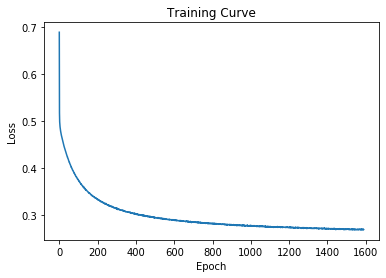

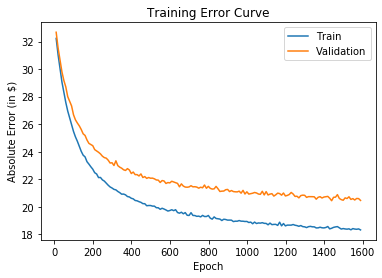

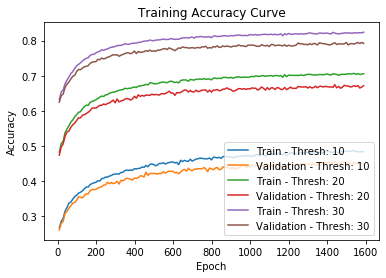

---[ITER 10] loss: 0.275229  time: 0.391
---[ITER 20] loss: 0.269425  time: 0.342
---[ITER 30] loss: 0.262811  time: 0.342
---[ITER 40] loss: 0.266401  time: 0.415
---[ITER 50] loss: 0.268748  time: 0.391
---[ITER 60] loss: 0.264486  time: 0.312
---[ITER 70] loss: 0.267810  time: 0.196
---[ITER 80] loss: 0.271929  time: 0.224
---[ITER 90] loss: 0.270085  time: 0.168
---[ITER 100] loss: 0.267169  time: 0.294
---[ITER 110] loss: 0.271792  time: 0.260
---[ITER 120] loss: 0.274095  time: 0.303
---[ITER 130] loss: 0.272904  time: 0.214
---[ITER 140] loss: 0.266012  time: 0.337
---[ITER 150] loss: 0.266683  time: 0.177
---[ITER 160] loss: 0.270496  time: 0.280
[EPOCH 1591] loss: 0.269109  time: 4.922
---[ITER 10] loss: 0.264360  time: 0.412
---[ITER 20] loss: 0.267051  time: 0.218
---[ITER 30] loss: 0.270133  time: 0.385
---[ITER 40] loss: 0.272272  time: 0.262
---[ITER 50] loss: 0.276448  time: 0.285
---[ITER 60] loss: 0.271689  time: 0.181
---[ITER 70] loss: 0.272279  time: 0.176
---[ITER 

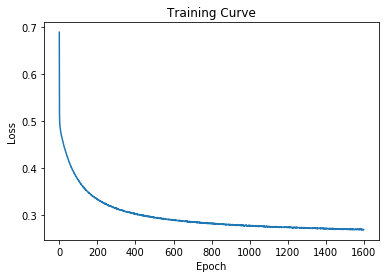

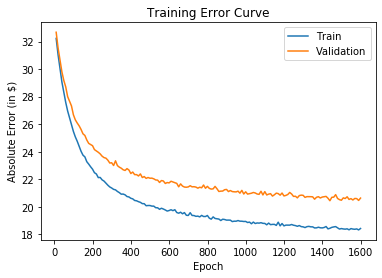

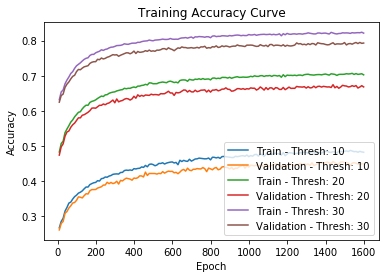

---[ITER 10] loss: 0.270745  time: 0.357
---[ITER 20] loss: 0.270985  time: 0.540
---[ITER 30] loss: 0.265380  time: 0.173
---[ITER 40] loss: 0.272817  time: 0.348
---[ITER 50] loss: 0.271428  time: 0.480
---[ITER 60] loss: 0.269257  time: 0.364
---[ITER 70] loss: 0.264818  time: 0.182
---[ITER 80] loss: 0.267835  time: 0.294
---[ITER 90] loss: 0.268041  time: 0.324
---[ITER 100] loss: 0.269712  time: 0.241
---[ITER 110] loss: 0.270538  time: 0.317
---[ITER 120] loss: 0.268485  time: 0.251
---[ITER 130] loss: 0.271066  time: 0.217
---[ITER 140] loss: 0.275554  time: 0.207
---[ITER 150] loss: 0.277577  time: 0.282
---[ITER 160] loss: 0.275203  time: 0.163
[EPOCH 1601] loss: 0.270301  time: 4.946
---[ITER 10] loss: 0.270254  time: 0.538
---[ITER 20] loss: 0.273413  time: 0.455
---[ITER 30] loss: 0.276235  time: 0.276
---[ITER 40] loss: 0.269405  time: 0.239
---[ITER 50] loss: 0.274395  time: 0.293
---[ITER 60] loss: 0.264843  time: 0.216
---[ITER 70] loss: 0.265498  time: 0.164
---[ITER 

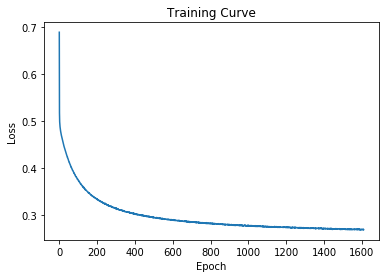

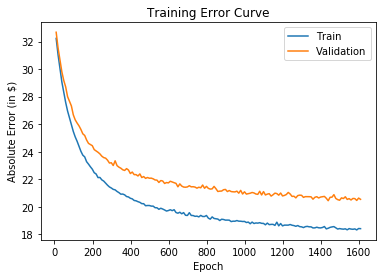

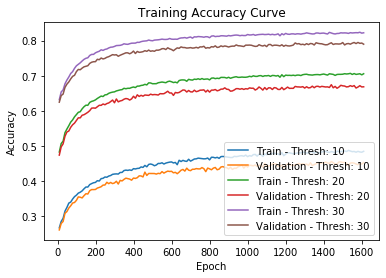

---[ITER 10] loss: 0.263211  time: 0.438
---[ITER 20] loss: 0.275010  time: 0.213
---[ITER 30] loss: 0.269361  time: 0.220
---[ITER 40] loss: 0.268666  time: 0.220
---[ITER 50] loss: 0.266773  time: 0.222
---[ITER 60] loss: 0.272146  time: 0.210
---[ITER 70] loss: 0.265472  time: 0.191
---[ITER 80] loss: 0.274965  time: 0.169
---[ITER 90] loss: 0.272000  time: 0.255
---[ITER 100] loss: 0.267217  time: 0.170
---[ITER 110] loss: 0.268892  time: 0.174
---[ITER 120] loss: 0.275830  time: 0.244
---[ITER 130] loss: 0.265041  time: 0.293
---[ITER 140] loss: 0.271671  time: 0.285
---[ITER 150] loss: 0.264101  time: 0.294
---[ITER 160] loss: 0.272553  time: 0.271
[EPOCH 1611] loss: 0.269717  time: 4.063
---[ITER 10] loss: 0.275818  time: 0.480
---[ITER 20] loss: 0.267345  time: 0.251
---[ITER 30] loss: 0.274625  time: 0.212
---[ITER 40] loss: 0.270749  time: 0.212
---[ITER 50] loss: 0.271049  time: 0.260
---[ITER 60] loss: 0.270665  time: 0.236
---[ITER 70] loss: 0.270372  time: 0.188
---[ITER 

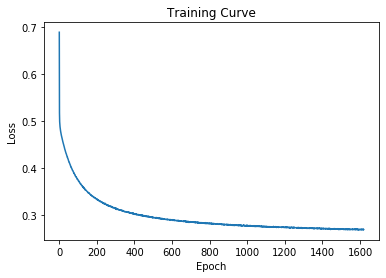

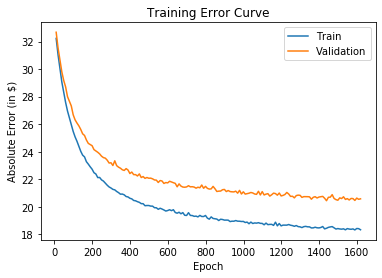

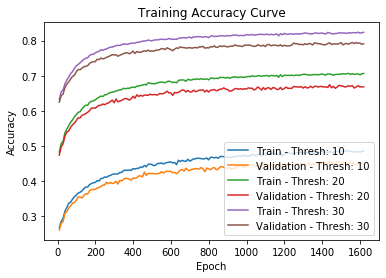

---[ITER 10] loss: 0.269348  time: 0.364
---[ITER 20] loss: 0.272365  time: 0.415
---[ITER 30] loss: 0.269338  time: 0.459
---[ITER 40] loss: 0.270264  time: 0.172
---[ITER 50] loss: 0.269136  time: 0.185
---[ITER 60] loss: 0.266839  time: 0.197
---[ITER 70] loss: 0.267179  time: 0.193
---[ITER 80] loss: 0.274454  time: 0.211
---[ITER 90] loss: 0.265560  time: 0.285
---[ITER 100] loss: 0.269627  time: 0.312
---[ITER 110] loss: 0.266847  time: 0.390
---[ITER 120] loss: 0.269259  time: 0.269
---[ITER 130] loss: 0.273348  time: 0.181
---[ITER 140] loss: 0.269598  time: 0.242
---[ITER 150] loss: 0.270386  time: 0.199
---[ITER 160] loss: 0.273864  time: 0.223
[EPOCH 1621] loss: 0.269862  time: 4.504
---[ITER 10] loss: 0.269083  time: 0.315
---[ITER 20] loss: 0.271589  time: 0.174
---[ITER 30] loss: 0.269013  time: 0.312
---[ITER 40] loss: 0.269633  time: 0.210
---[ITER 50] loss: 0.269903  time: 0.158
---[ITER 60] loss: 0.268361  time: 0.188
---[ITER 70] loss: 0.263654  time: 0.166
---[ITER 

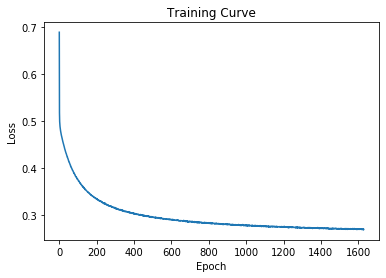

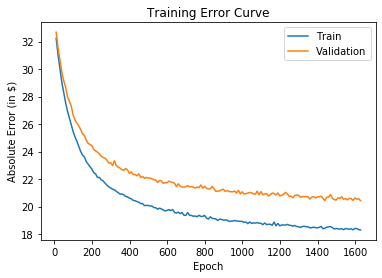

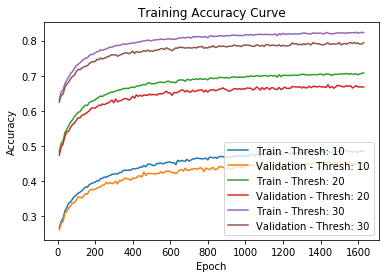

---[ITER 10] loss: 0.267176  time: 0.272
---[ITER 20] loss: 0.272505  time: 0.430
---[ITER 30] loss: 0.268013  time: 0.181
---[ITER 40] loss: 0.270357  time: 0.159
---[ITER 50] loss: 0.275804  time: 0.156
---[ITER 60] loss: 0.267048  time: 0.154
---[ITER 70] loss: 0.268990  time: 0.164
---[ITER 80] loss: 0.266038  time: 0.157
---[ITER 90] loss: 0.272332  time: 0.176
---[ITER 100] loss: 0.270313  time: 0.152
---[ITER 110] loss: 0.267686  time: 0.211
---[ITER 120] loss: 0.266139  time: 0.234
---[ITER 130] loss: 0.268908  time: 0.208
---[ITER 140] loss: 0.273625  time: 0.184
---[ITER 150] loss: 0.268706  time: 0.250
---[ITER 160] loss: 0.269273  time: 0.152
[EPOCH 1631] loss: 0.269540  time: 3.392
---[ITER 10] loss: 0.272431  time: 0.265
---[ITER 20] loss: 0.259261  time: 0.305
---[ITER 30] loss: 0.267721  time: 0.170
---[ITER 40] loss: 0.270320  time: 0.196
---[ITER 50] loss: 0.261142  time: 0.318
---[ITER 60] loss: 0.274622  time: 0.198
---[ITER 70] loss: 0.267780  time: 0.208
---[ITER 

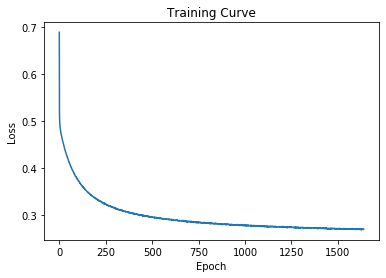

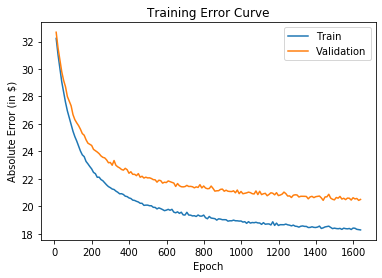

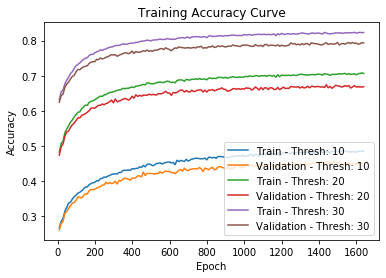

---[ITER 10] loss: 0.270339  time: 0.314
---[ITER 20] loss: 0.268160  time: 0.155
---[ITER 30] loss: 0.274169  time: 0.149
---[ITER 40] loss: 0.270050  time: 0.184
---[ITER 50] loss: 0.269488  time: 0.166
---[ITER 60] loss: 0.265614  time: 0.212
---[ITER 70] loss: 0.270320  time: 0.156
---[ITER 80] loss: 0.268271  time: 0.159
---[ITER 90] loss: 0.272712  time: 0.163
---[ITER 100] loss: 0.271163  time: 0.338
---[ITER 110] loss: 0.267601  time: 0.161
---[ITER 120] loss: 0.269872  time: 0.186
---[ITER 130] loss: 0.270603  time: 0.196
---[ITER 140] loss: 0.268419  time: 0.161
---[ITER 150] loss: 0.269429  time: 0.177
---[ITER 160] loss: 0.269897  time: 0.167
[EPOCH 1641] loss: 0.269945  time: 3.187
---[ITER 10] loss: 0.268055  time: 0.360
---[ITER 20] loss: 0.273685  time: 0.149
---[ITER 30] loss: 0.261387  time: 0.185
---[ITER 40] loss: 0.268187  time: 0.155
---[ITER 50] loss: 0.264018  time: 0.168
---[ITER 60] loss: 0.268021  time: 0.163
---[ITER 70] loss: 0.267880  time: 0.162
---[ITER 

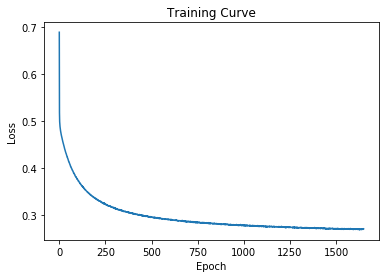

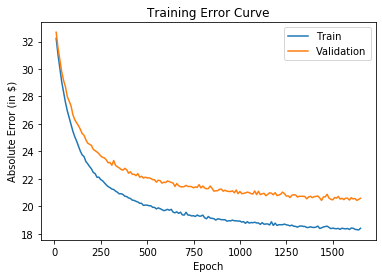

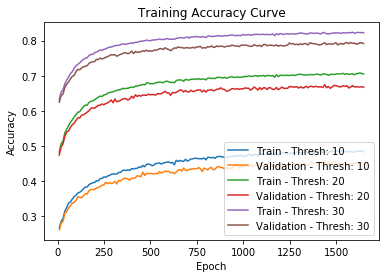

---[ITER 10] loss: 0.266452  time: 0.560
---[ITER 20] loss: 0.266241  time: 0.235
---[ITER 30] loss: 0.269259  time: 0.245
---[ITER 40] loss: 0.272311  time: 0.161
---[ITER 50] loss: 0.266860  time: 0.166
---[ITER 60] loss: 0.263837  time: 0.246
---[ITER 70] loss: 0.271879  time: 0.221
---[ITER 80] loss: 0.267585  time: 0.246
---[ITER 90] loss: 0.271108  time: 0.157
---[ITER 100] loss: 0.267277  time: 0.381
---[ITER 110] loss: 0.268651  time: 0.242
---[ITER 120] loss: 0.269034  time: 0.307
---[ITER 130] loss: 0.283613  time: 0.150
---[ITER 140] loss: 0.274984  time: 0.172
---[ITER 150] loss: 0.267763  time: 0.306
---[ITER 160] loss: 0.269772  time: 0.232
[EPOCH 1651] loss: 0.269881  time: 4.165
---[ITER 10] loss: 0.270858  time: 0.519
---[ITER 20] loss: 0.264445  time: 0.230
---[ITER 30] loss: 0.263102  time: 0.410
---[ITER 40] loss: 0.268554  time: 0.331
---[ITER 50] loss: 0.270819  time: 0.296
---[ITER 60] loss: 0.264950  time: 0.259
---[ITER 70] loss: 0.270745  time: 0.182
---[ITER 

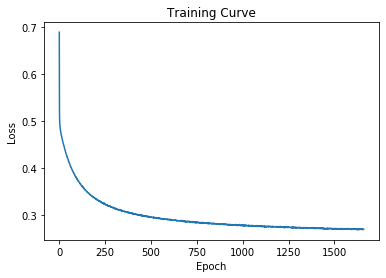

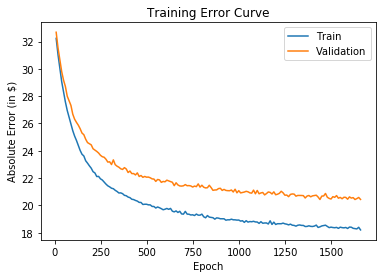

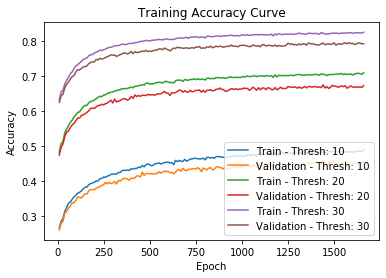

---[ITER 10] loss: 0.268340  time: 0.411
---[ITER 20] loss: 0.269264  time: 0.154
---[ITER 30] loss: 0.269183  time: 0.443
---[ITER 40] loss: 0.271870  time: 0.256
---[ITER 50] loss: 0.270686  time: 0.253
---[ITER 60] loss: 0.268982  time: 0.231
---[ITER 70] loss: 0.264633  time: 0.351
---[ITER 80] loss: 0.265485  time: 0.259
---[ITER 90] loss: 0.272476  time: 0.213
---[ITER 100] loss: 0.264748  time: 0.331
---[ITER 110] loss: 0.267119  time: 0.211
---[ITER 120] loss: 0.271042  time: 0.171
---[ITER 130] loss: 0.269659  time: 0.169
---[ITER 140] loss: 0.267415  time: 0.223
---[ITER 150] loss: 0.269125  time: 0.173
---[ITER 160] loss: 0.260022  time: 0.162
[EPOCH 1661] loss: 0.268097  time: 4.197
---[ITER 10] loss: 0.268191  time: 0.252
---[ITER 20] loss: 0.271134  time: 0.171
---[ITER 30] loss: 0.275132  time: 0.448
---[ITER 40] loss: 0.262996  time: 0.677
---[ITER 50] loss: 0.264922  time: 0.639
---[ITER 60] loss: 0.268085  time: 0.374
---[ITER 70] loss: 0.271785  time: 0.403
---[ITER 

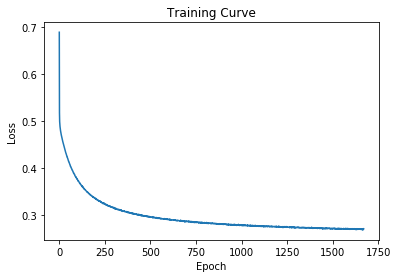

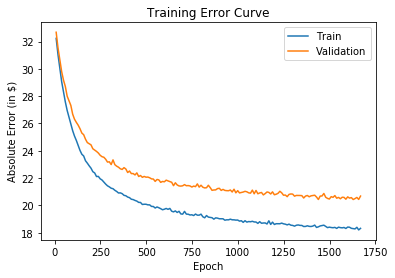

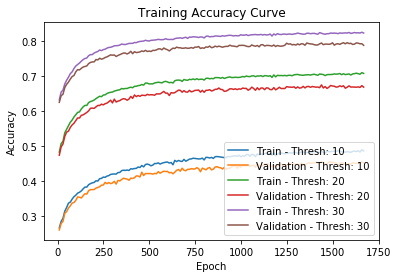

---[ITER 10] loss: 0.269578  time: 0.623
---[ITER 20] loss: 0.267750  time: 0.465
---[ITER 30] loss: 0.270570  time: 0.373
---[ITER 40] loss: 0.276415  time: 0.492
---[ITER 50] loss: 0.265664  time: 0.240
---[ITER 60] loss: 0.271299  time: 0.202
---[ITER 70] loss: 0.266442  time: 0.213
---[ITER 80] loss: 0.270011  time: 0.297
---[ITER 90] loss: 0.269804  time: 0.207
---[ITER 100] loss: 0.269046  time: 0.219
---[ITER 110] loss: 0.270561  time: 0.201
---[ITER 120] loss: 0.265192  time: 0.200
---[ITER 130] loss: 0.267032  time: 0.440
---[ITER 140] loss: 0.266878  time: 0.223
---[ITER 150] loss: 0.265870  time: 0.276
---[ITER 160] loss: 0.278437  time: 0.302
[EPOCH 1671] loss: 0.269282  time: 5.113
---[ITER 10] loss: 0.265421  time: 0.356
---[ITER 20] loss: 0.277682  time: 0.342
---[ITER 30] loss: 0.267606  time: 0.239
---[ITER 40] loss: 0.267400  time: 0.189
---[ITER 50] loss: 0.270715  time: 0.156
---[ITER 60] loss: 0.266506  time: 0.282
---[ITER 70] loss: 0.269625  time: 0.149
---[ITER 

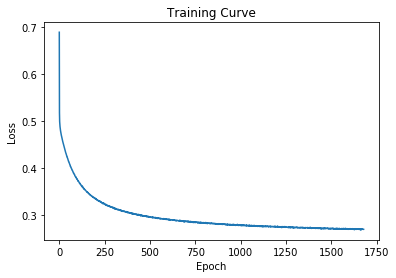

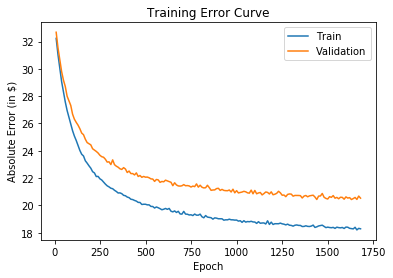

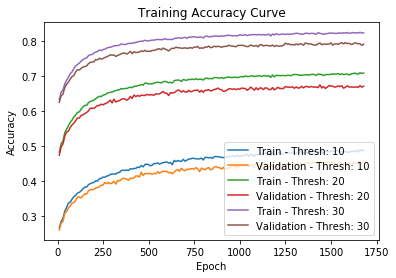

---[ITER 10] loss: 0.263736  time: 0.527
---[ITER 20] loss: 0.267692  time: 0.184
---[ITER 30] loss: 0.263812  time: 0.164
---[ITER 40] loss: 0.265853  time: 0.335
---[ITER 50] loss: 0.268344  time: 0.281
---[ITER 60] loss: 0.270608  time: 0.255
---[ITER 70] loss: 0.271467  time: 0.211
---[ITER 80] loss: 0.270850  time: 0.177
---[ITER 90] loss: 0.273878  time: 0.206
---[ITER 100] loss: 0.264890  time: 0.201
---[ITER 110] loss: 0.264935  time: 0.185
---[ITER 120] loss: 0.271607  time: 0.252
---[ITER 130] loss: 0.269739  time: 0.225
---[ITER 140] loss: 0.266470  time: 0.212
---[ITER 150] loss: 0.269933  time: 0.295
---[ITER 160] loss: 0.268321  time: 0.319
[EPOCH 1681] loss: 0.268412  time: 4.210
---[ITER 10] loss: 0.271305  time: 0.519
---[ITER 20] loss: 0.271702  time: 0.376
---[ITER 30] loss: 0.275365  time: 0.225
---[ITER 40] loss: 0.268005  time: 0.281
---[ITER 50] loss: 0.264576  time: 0.190
---[ITER 60] loss: 0.267648  time: 0.240
---[ITER 70] loss: 0.264927  time: 0.286
---[ITER 

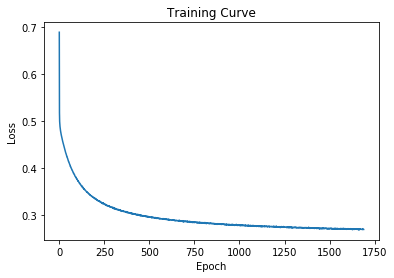

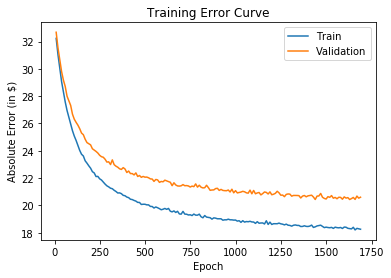

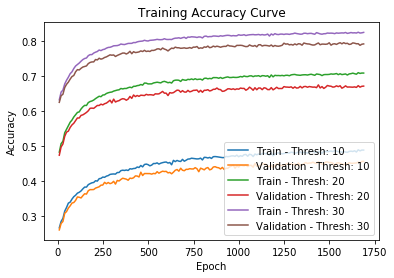

---[ITER 10] loss: 0.268621  time: 0.261
---[ITER 20] loss: 0.271551  time: 0.174
---[ITER 30] loss: 0.269368  time: 0.181
---[ITER 40] loss: 0.260591  time: 0.435
---[ITER 50] loss: 0.273455  time: 0.212
---[ITER 60] loss: 0.268171  time: 0.328
---[ITER 70] loss: 0.267441  time: 0.371
---[ITER 80] loss: 0.267626  time: 0.227
---[ITER 90] loss: 0.266482  time: 0.163
---[ITER 100] loss: 0.273572  time: 0.179
---[ITER 110] loss: 0.271245  time: 0.298
---[ITER 120] loss: 0.266387  time: 0.357
---[ITER 130] loss: 0.274439  time: 0.625
---[ITER 140] loss: 0.264723  time: 0.404
---[ITER 150] loss: 0.270645  time: 0.293
---[ITER 160] loss: 0.270256  time: 0.165
[EPOCH 1691] loss: 0.269122  time: 4.835
---[ITER 10] loss: 0.266215  time: 0.327
---[ITER 20] loss: 0.267857  time: 0.287
---[ITER 30] loss: 0.270201  time: 0.282
---[ITER 40] loss: 0.273020  time: 0.277
---[ITER 50] loss: 0.264480  time: 0.252
---[ITER 60] loss: 0.267236  time: 0.300
---[ITER 70] loss: 0.271526  time: 0.252
---[ITER 

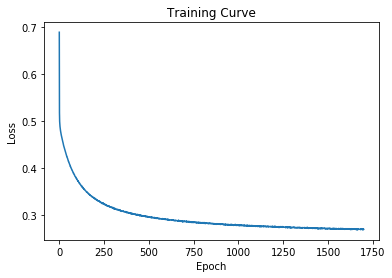

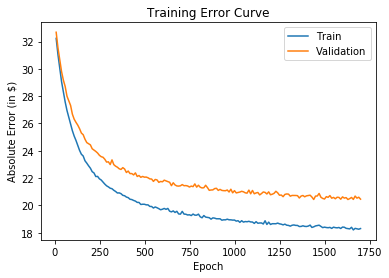

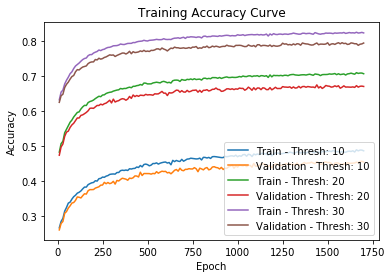

---[ITER 10] loss: 0.266158  time: 0.452
---[ITER 20] loss: 0.268912  time: 0.239
---[ITER 30] loss: 0.267085  time: 0.347
---[ITER 40] loss: 0.269039  time: 0.526
---[ITER 50] loss: 0.267800  time: 0.675
---[ITER 60] loss: 0.270983  time: 0.280
---[ITER 70] loss: 0.270971  time: 0.153
---[ITER 80] loss: 0.268784  time: 0.218
---[ITER 90] loss: 0.273887  time: 0.173
---[ITER 100] loss: 0.267821  time: 0.517
---[ITER 110] loss: 0.272821  time: 0.504
---[ITER 120] loss: 0.265283  time: 0.463
---[ITER 130] loss: 0.270013  time: 0.249
---[ITER 140] loss: 0.268168  time: 0.468
---[ITER 150] loss: 0.275700  time: 0.724
---[ITER 160] loss: 0.265740  time: 0.649
[EPOCH 1701] loss: 0.269319  time: 7.058
---[ITER 10] loss: 0.263208  time: 0.694
---[ITER 20] loss: 0.270155  time: 0.472
---[ITER 30] loss: 0.268775  time: 0.304
---[ITER 40] loss: 0.276321  time: 0.195
---[ITER 50] loss: 0.269903  time: 0.425
---[ITER 60] loss: 0.269620  time: 0.341
---[ITER 70] loss: 0.271426  time: 0.307
---[ITER 

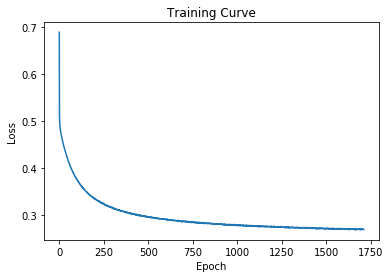

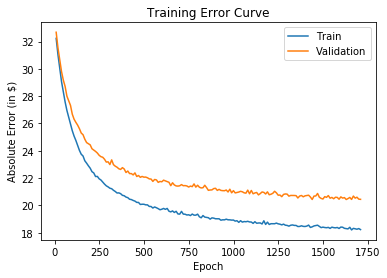

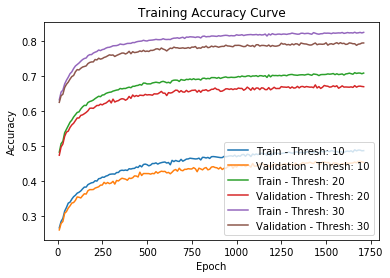

---[ITER 10] loss: 0.273555  time: 0.295
---[ITER 20] loss: 0.272799  time: 0.272
---[ITER 30] loss: 0.266289  time: 0.282
---[ITER 40] loss: 0.274808  time: 0.194
---[ITER 50] loss: 0.269661  time: 0.404
---[ITER 60] loss: 0.271932  time: 0.353
---[ITER 70] loss: 0.264450  time: 0.263
---[ITER 80] loss: 0.272565  time: 0.215
---[ITER 90] loss: 0.264483  time: 0.621
---[ITER 100] loss: 0.267559  time: 0.616
---[ITER 110] loss: 0.266639  time: 0.461
---[ITER 120] loss: 0.258966  time: 0.160
---[ITER 130] loss: 0.267699  time: 0.195
---[ITER 140] loss: 0.268485  time: 0.177
---[ITER 150] loss: 0.265142  time: 0.182
---[ITER 160] loss: 0.269310  time: 0.173
[EPOCH 1711] loss: 0.268735  time: 4.993
---[ITER 10] loss: 0.267692  time: 0.239
---[ITER 20] loss: 0.264333  time: 0.404
---[ITER 30] loss: 0.265052  time: 0.160
---[ITER 40] loss: 0.267907  time: 0.240
---[ITER 50] loss: 0.268718  time: 0.137
---[ITER 60] loss: 0.268873  time: 0.161
---[ITER 70] loss: 0.269354  time: 0.176
---[ITER 

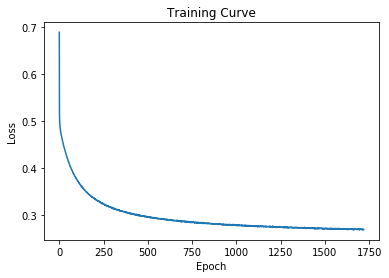

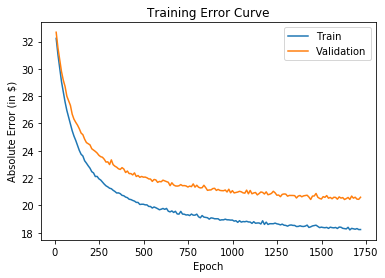

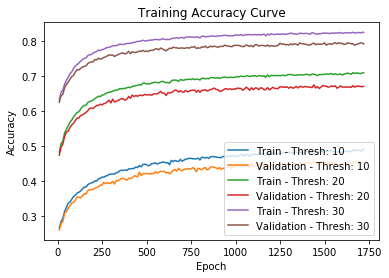

---[ITER 10] loss: 0.266646  time: 0.382
---[ITER 20] loss: 0.261222  time: 0.475
---[ITER 30] loss: 0.263242  time: 0.393
---[ITER 40] loss: 0.269568  time: 0.306
---[ITER 50] loss: 0.268071  time: 0.399
---[ITER 60] loss: 0.271069  time: 0.346
---[ITER 70] loss: 0.266365  time: 0.408
---[ITER 80] loss: 0.266340  time: 0.258
---[ITER 90] loss: 0.273479  time: 0.226
---[ITER 100] loss: 0.266061  time: 0.245
---[ITER 110] loss: 0.264453  time: 0.220
---[ITER 120] loss: 0.270980  time: 0.253
---[ITER 130] loss: 0.266071  time: 0.197
---[ITER 140] loss: 0.270631  time: 0.141
---[ITER 150] loss: 0.272044  time: 0.163
---[ITER 160] loss: 0.274037  time: 0.190
[EPOCH 1721] loss: 0.268224  time: 4.792
---[ITER 10] loss: 0.270522  time: 0.413
---[ITER 20] loss: 0.267400  time: 0.195
---[ITER 30] loss: 0.263881  time: 0.271
---[ITER 40] loss: 0.270689  time: 0.194
---[ITER 50] loss: 0.262554  time: 0.196
---[ITER 60] loss: 0.269298  time: 0.198
---[ITER 70] loss: 0.265444  time: 0.176
---[ITER 

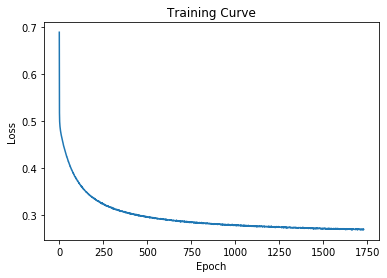

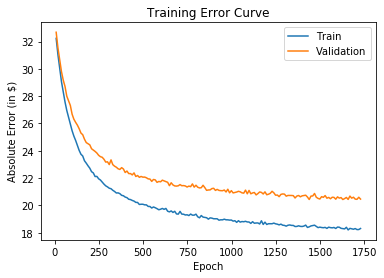

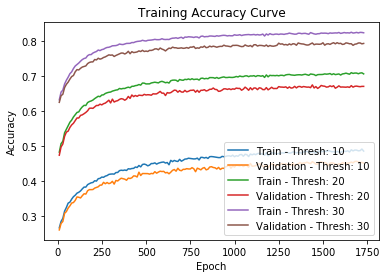

---[ITER 10] loss: 0.261966  time: 0.298
---[ITER 20] loss: 0.266737  time: 0.230
---[ITER 30] loss: 0.265888  time: 0.311
---[ITER 40] loss: 0.273736  time: 0.231
---[ITER 50] loss: 0.260723  time: 0.183
---[ITER 60] loss: 0.268512  time: 0.166
---[ITER 70] loss: 0.270684  time: 0.199
---[ITER 80] loss: 0.269244  time: 0.174
---[ITER 90] loss: 0.272313  time: 0.209
---[ITER 100] loss: 0.266367  time: 0.210
---[ITER 110] loss: 0.271997  time: 0.233
---[ITER 120] loss: 0.270282  time: 0.155
---[ITER 130] loss: 0.268837  time: 0.195
---[ITER 140] loss: 0.267196  time: 0.202
---[ITER 150] loss: 0.273503  time: 0.217
---[ITER 160] loss: 0.267388  time: 0.186
[EPOCH 1731] loss: 0.268412  time: 3.554
---[ITER 10] loss: 0.266976  time: 0.250
---[ITER 20] loss: 0.270899  time: 0.156
---[ITER 30] loss: 0.269602  time: 0.409
---[ITER 40] loss: 0.269006  time: 0.352
---[ITER 50] loss: 0.270985  time: 0.752
---[ITER 60] loss: 0.263893  time: 0.705
---[ITER 70] loss: 0.266586  time: 0.351
---[ITER 

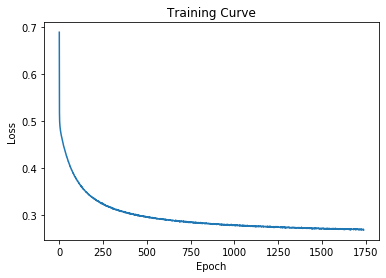

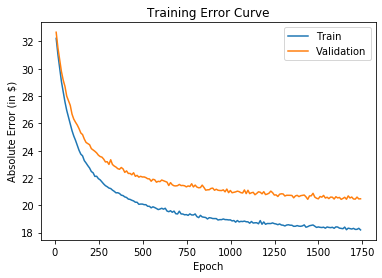

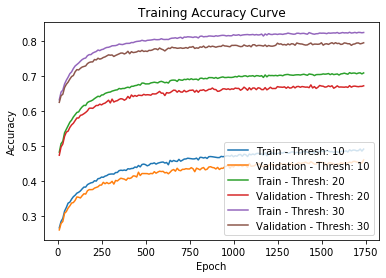

---[ITER 10] loss: 0.268872  time: 0.322
---[ITER 20] loss: 0.261851  time: 0.312
---[ITER 30] loss: 0.269771  time: 0.237
---[ITER 40] loss: 0.263564  time: 0.284
---[ITER 50] loss: 0.270232  time: 0.205
---[ITER 60] loss: 0.268453  time: 0.206
---[ITER 70] loss: 0.268918  time: 0.243
---[ITER 80] loss: 0.274573  time: 0.215
---[ITER 90] loss: 0.268857  time: 0.308
---[ITER 100] loss: 0.268692  time: 0.218
---[ITER 110] loss: 0.266612  time: 0.223
---[ITER 120] loss: 0.263865  time: 0.213
---[ITER 130] loss: 0.266201  time: 0.211
---[ITER 140] loss: 0.269996  time: 0.314
---[ITER 150] loss: 0.273239  time: 0.270
---[ITER 160] loss: 0.267239  time: 0.293
[EPOCH 1741] loss: 0.268299  time: 4.262
---[ITER 10] loss: 0.268587  time: 0.319
---[ITER 20] loss: 0.267646  time: 0.293
---[ITER 30] loss: 0.272516  time: 0.281
---[ITER 40] loss: 0.269656  time: 0.272
---[ITER 50] loss: 0.263416  time: 0.285
---[ITER 60] loss: 0.266070  time: 0.612
---[ITER 70] loss: 0.267711  time: 0.405
---[ITER 

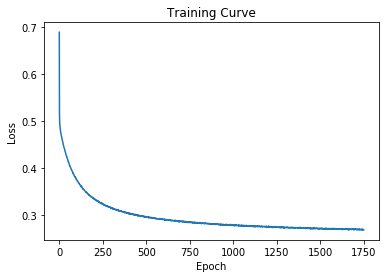

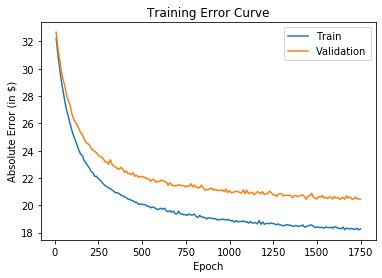

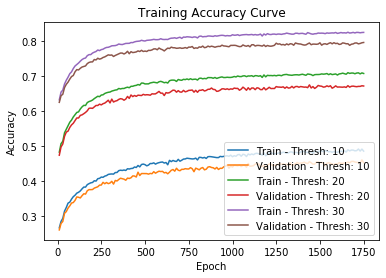

---[ITER 10] loss: 0.264990  time: 0.349
---[ITER 20] loss: 0.268539  time: 0.202
---[ITER 30] loss: 0.263940  time: 0.191
---[ITER 40] loss: 0.270196  time: 0.164
---[ITER 50] loss: 0.268991  time: 0.161
---[ITER 60] loss: 0.267615  time: 0.174
---[ITER 70] loss: 0.267253  time: 0.166
---[ITER 80] loss: 0.264025  time: 0.156
---[ITER 90] loss: 0.263090  time: 0.192
---[ITER 100] loss: 0.266534  time: 0.219
---[ITER 110] loss: 0.270291  time: 0.156
---[ITER 120] loss: 0.267933  time: 0.168
---[ITER 130] loss: 0.268864  time: 0.213
---[ITER 140] loss: 0.269807  time: 0.199
---[ITER 150] loss: 0.269164  time: 0.195
---[ITER 160] loss: 0.272408  time: 0.176
[EPOCH 1751] loss: 0.267899  time: 3.221
---[ITER 10] loss: 0.273628  time: 0.347
---[ITER 20] loss: 0.265921  time: 0.192
---[ITER 30] loss: 0.264186  time: 0.184
---[ITER 40] loss: 0.273793  time: 0.154
---[ITER 50] loss: 0.266581  time: 0.178
---[ITER 60] loss: 0.265539  time: 0.171
---[ITER 70] loss: 0.261676  time: 0.187
---[ITER 

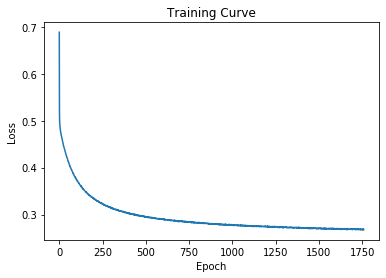

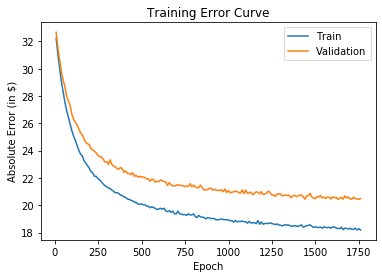

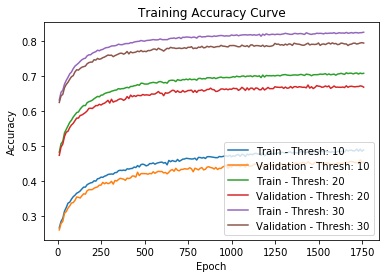

---[ITER 10] loss: 0.275135  time: 0.354
---[ITER 20] loss: 0.273716  time: 0.167
---[ITER 30] loss: 0.268673  time: 0.159
---[ITER 40] loss: 0.265754  time: 0.149
---[ITER 50] loss: 0.271590  time: 0.199
---[ITER 60] loss: 0.262877  time: 0.148
---[ITER 70] loss: 0.268047  time: 0.198
---[ITER 80] loss: 0.262133  time: 0.152
---[ITER 90] loss: 0.269683  time: 0.168
---[ITER 100] loss: 0.265099  time: 0.156
---[ITER 110] loss: 0.270663  time: 0.174
---[ITER 120] loss: 0.266881  time: 0.218
---[ITER 130] loss: 0.267989  time: 0.166
---[ITER 140] loss: 0.266346  time: 0.173
---[ITER 150] loss: 0.270949  time: 0.142
---[ITER 160] loss: 0.266773  time: 0.164
[EPOCH 1761] loss: 0.268293  time: 3.054
---[ITER 10] loss: 0.269868  time: 0.358
---[ITER 20] loss: 0.270791  time: 0.170
---[ITER 30] loss: 0.261740  time: 0.160
---[ITER 40] loss: 0.262554  time: 0.164
---[ITER 50] loss: 0.260878  time: 0.163
---[ITER 60] loss: 0.267365  time: 0.184
---[ITER 70] loss: 0.265803  time: 0.198
---[ITER 

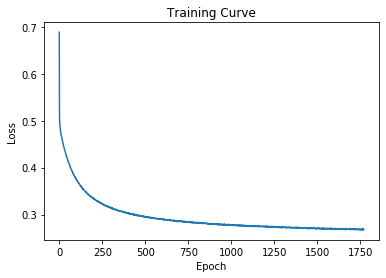

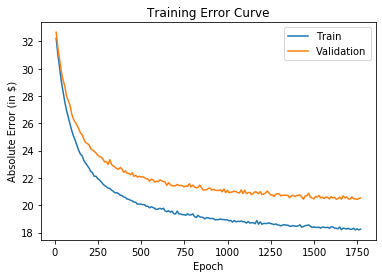

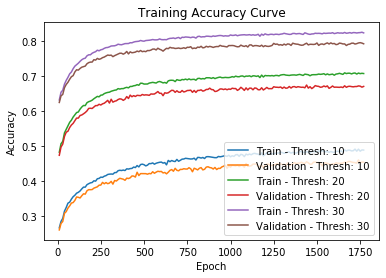

---[ITER 10] loss: 0.269932  time: 0.226
---[ITER 20] loss: 0.270887  time: 0.185
---[ITER 30] loss: 0.271467  time: 0.251
---[ITER 40] loss: 0.263682  time: 0.159
---[ITER 50] loss: 0.266372  time: 0.201
---[ITER 60] loss: 0.267594  time: 0.177
---[ITER 70] loss: 0.262692  time: 0.142
---[ITER 80] loss: 0.277063  time: 0.160
---[ITER 90] loss: 0.268111  time: 0.171
---[ITER 100] loss: 0.268910  time: 0.170
---[ITER 110] loss: 0.264462  time: 0.150
---[ITER 120] loss: 0.273345  time: 0.154
---[ITER 130] loss: 0.263848  time: 0.190
---[ITER 140] loss: 0.266342  time: 0.194
---[ITER 150] loss: 0.265351  time: 0.152
---[ITER 160] loss: 0.268209  time: 0.172
[EPOCH 1771] loss: 0.268096  time: 2.998
---[ITER 10] loss: 0.266650  time: 0.265
---[ITER 20] loss: 0.265682  time: 0.176
---[ITER 30] loss: 0.267403  time: 0.262
---[ITER 40] loss: 0.264236  time: 0.162
---[ITER 50] loss: 0.271065  time: 0.177
---[ITER 60] loss: 0.269102  time: 0.171
---[ITER 70] loss: 0.270551  time: 0.175
---[ITER 

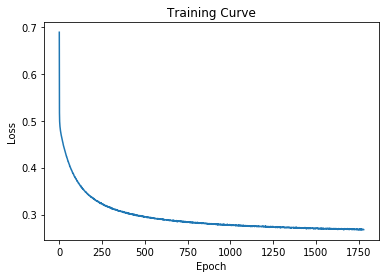

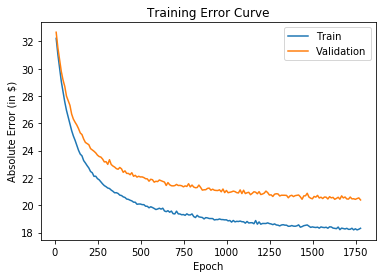

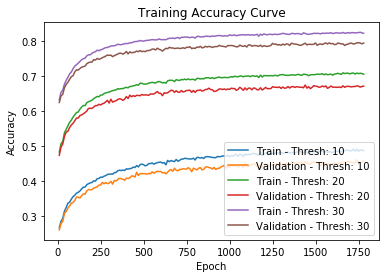

---[ITER 10] loss: 0.269546  time: 0.253
---[ITER 20] loss: 0.275671  time: 0.302
---[ITER 30] loss: 0.266317  time: 0.163
---[ITER 40] loss: 0.264046  time: 0.162
---[ITER 50] loss: 0.271683  time: 0.155
---[ITER 60] loss: 0.266958  time: 0.155
---[ITER 70] loss: 0.268705  time: 0.159
---[ITER 80] loss: 0.270607  time: 0.181
---[ITER 90] loss: 0.272832  time: 0.172
---[ITER 100] loss: 0.266189  time: 0.141
---[ITER 110] loss: 0.267957  time: 0.168
---[ITER 120] loss: 0.272457  time: 0.160
---[ITER 130] loss: 0.264875  time: 0.226
---[ITER 140] loss: 0.264165  time: 0.190
---[ITER 150] loss: 0.271647  time: 0.151
---[ITER 160] loss: 0.267383  time: 0.167
[EPOCH 1781] loss: 0.268422  time: 3.044
---[ITER 10] loss: 0.266371  time: 0.255
---[ITER 20] loss: 0.264464  time: 0.279
---[ITER 30] loss: 0.264689  time: 0.157
---[ITER 40] loss: 0.268694  time: 0.174
---[ITER 50] loss: 0.268460  time: 0.164
---[ITER 60] loss: 0.269799  time: 0.152
---[ITER 70] loss: 0.262872  time: 0.181
---[ITER 

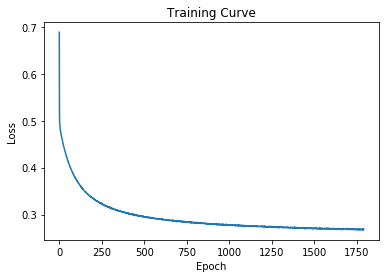

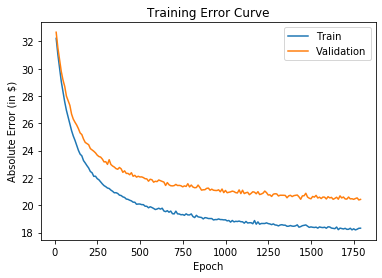

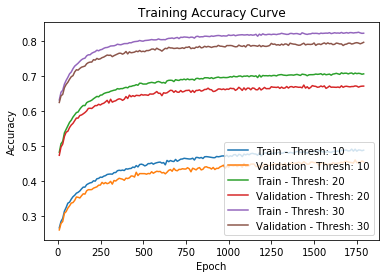

---[ITER 10] loss: 0.276314  time: 0.349
---[ITER 20] loss: 0.265976  time: 0.170
---[ITER 30] loss: 0.265422  time: 0.156
---[ITER 40] loss: 0.269764  time: 0.184
---[ITER 50] loss: 0.267321  time: 0.175
---[ITER 60] loss: 0.268148  time: 0.165
---[ITER 70] loss: 0.266060  time: 0.169
---[ITER 80] loss: 0.272252  time: 0.160
---[ITER 90] loss: 0.262726  time: 0.174
---[ITER 100] loss: 0.267907  time: 0.182
---[ITER 110] loss: 0.271623  time: 0.191
---[ITER 120] loss: 0.263903  time: 0.151
---[ITER 130] loss: 0.276290  time: 0.212
---[ITER 140] loss: 0.268285  time: 0.162
---[ITER 150] loss: 0.264897  time: 0.165
---[ITER 160] loss: 0.264243  time: 0.190
[EPOCH 1791] loss: 0.268136  time: 3.086
---[ITER 10] loss: 0.271149  time: 0.361
---[ITER 20] loss: 0.266514  time: 0.157
---[ITER 30] loss: 0.268533  time: 0.184
---[ITER 40] loss: 0.274734  time: 0.181
---[ITER 50] loss: 0.257298  time: 0.149
---[ITER 60] loss: 0.258579  time: 0.180
---[ITER 70] loss: 0.266510  time: 0.161
---[ITER 

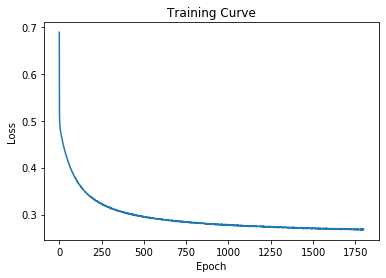

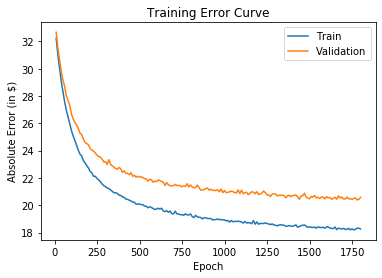

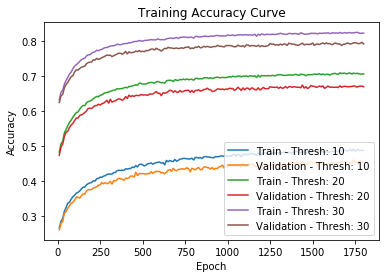

---[ITER 10] loss: 0.268025  time: 0.244
---[ITER 20] loss: 0.267451  time: 0.159
---[ITER 30] loss: 0.266133  time: 0.163
---[ITER 40] loss: 0.267689  time: 0.265
---[ITER 50] loss: 0.266574  time: 0.226
---[ITER 60] loss: 0.272109  time: 0.148
---[ITER 70] loss: 0.267898  time: 0.158
---[ITER 80] loss: 0.273481  time: 0.172
---[ITER 90] loss: 0.267442  time: 0.170
---[ITER 100] loss: 0.263789  time: 0.186
---[ITER 110] loss: 0.266956  time: 0.176
---[ITER 120] loss: 0.262696  time: 0.170
---[ITER 130] loss: 0.269732  time: 0.165
---[ITER 140] loss: 0.264016  time: 0.161
---[ITER 150] loss: 0.263407  time: 0.265
---[ITER 160] loss: 0.267085  time: 0.199
[EPOCH 1801] loss: 0.267363  time: 3.162
---[ITER 10] loss: 0.265714  time: 0.251
---[ITER 20] loss: 0.264229  time: 0.157
---[ITER 30] loss: 0.267572  time: 0.171
---[ITER 40] loss: 0.269889  time: 0.281
---[ITER 50] loss: 0.264519  time: 0.161
---[ITER 60] loss: 0.270606  time: 0.165
---[ITER 70] loss: 0.268478  time: 0.150
---[ITER 

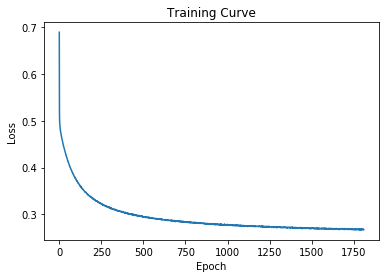

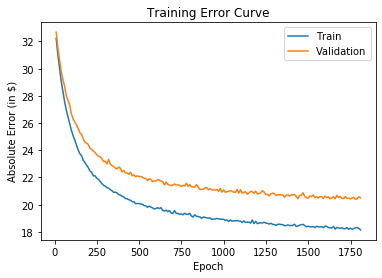

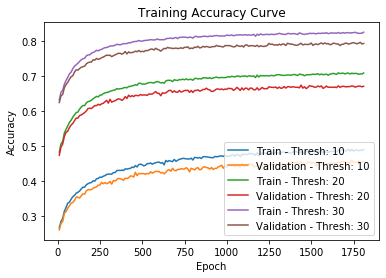

---[ITER 10] loss: 0.264379  time: 0.234
---[ITER 20] loss: 0.269910  time: 0.152
---[ITER 30] loss: 0.265783  time: 0.276
---[ITER 40] loss: 0.263821  time: 0.166
---[ITER 50] loss: 0.266450  time: 0.188
---[ITER 60] loss: 0.268871  time: 0.155
---[ITER 70] loss: 0.268152  time: 0.175
---[ITER 80] loss: 0.267000  time: 0.146
---[ITER 90] loss: 0.269145  time: 0.175
---[ITER 100] loss: 0.266777  time: 0.172
---[ITER 110] loss: 0.270070  time: 0.178
---[ITER 120] loss: 0.268851  time: 0.163
---[ITER 130] loss: 0.263529  time: 0.168
---[ITER 140] loss: 0.268503  time: 0.197
---[ITER 150] loss: 0.267091  time: 0.468
---[ITER 160] loss: 0.266905  time: 0.373
[EPOCH 1811] loss: 0.267407  time: 3.597
---[ITER 10] loss: 0.266647  time: 0.441
---[ITER 20] loss: 0.264110  time: 0.286
---[ITER 30] loss: 0.261854  time: 0.351
---[ITER 40] loss: 0.267265  time: 0.250
---[ITER 50] loss: 0.266817  time: 0.179
---[ITER 60] loss: 0.272506  time: 0.188
---[ITER 70] loss: 0.266437  time: 0.164
---[ITER 

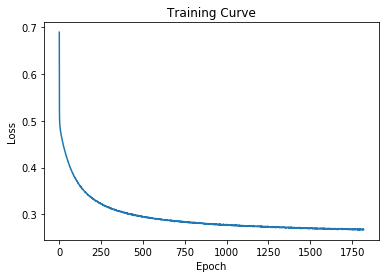

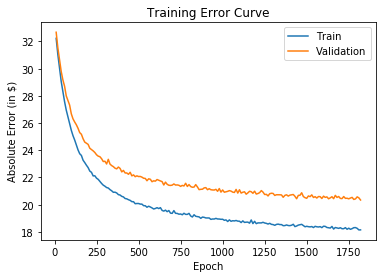

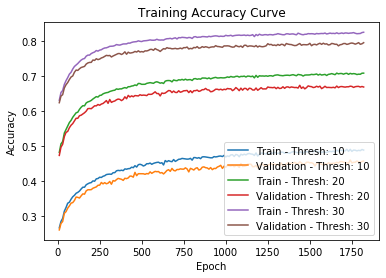

---[ITER 10] loss: 0.266680  time: 0.248
---[ITER 20] loss: 0.264895  time: 0.269
---[ITER 30] loss: 0.271346  time: 0.185
---[ITER 40] loss: 0.266830  time: 0.160
---[ITER 50] loss: 0.267932  time: 0.166
---[ITER 60] loss: 0.267728  time: 0.167
---[ITER 70] loss: 0.268090  time: 0.187
---[ITER 80] loss: 0.266116  time: 0.179
---[ITER 90] loss: 0.264255  time: 0.149
---[ITER 100] loss: 0.268790  time: 0.176
---[ITER 110] loss: 0.269742  time: 0.168
---[ITER 120] loss: 0.266857  time: 0.174
---[ITER 130] loss: 0.266967  time: 0.209
---[ITER 140] loss: 0.266424  time: 0.182
---[ITER 150] loss: 0.267367  time: 0.163
---[ITER 160] loss: 0.275975  time: 0.148
[EPOCH 1821] loss: 0.267801  time: 3.149
---[ITER 10] loss: 0.264320  time: 0.271
---[ITER 20] loss: 0.267667  time: 0.284
---[ITER 30] loss: 0.268296  time: 0.163
---[ITER 40] loss: 0.272035  time: 0.163
---[ITER 50] loss: 0.269967  time: 0.167
---[ITER 60] loss: 0.265422  time: 0.168
---[ITER 70] loss: 0.270612  time: 0.161
---[ITER 

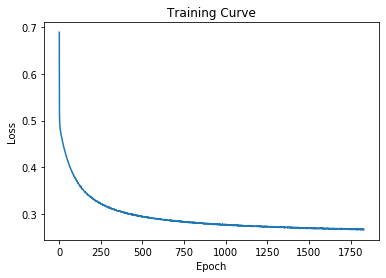

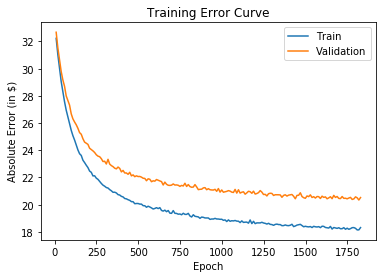

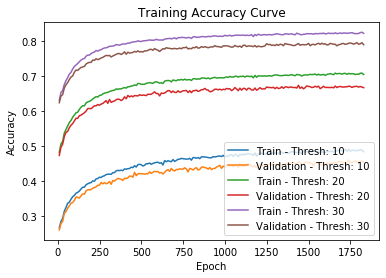

---[ITER 10] loss: 0.271611  time: 0.370
---[ITER 20] loss: 0.264144  time: 0.154
---[ITER 30] loss: 0.264058  time: 0.177
---[ITER 40] loss: 0.261422  time: 0.164
---[ITER 50] loss: 0.274695  time: 0.172
---[ITER 60] loss: 0.266294  time: 0.178
---[ITER 70] loss: 0.268541  time: 0.152
---[ITER 80] loss: 0.270982  time: 0.161
---[ITER 90] loss: 0.270826  time: 0.179
---[ITER 100] loss: 0.270730  time: 0.147
---[ITER 110] loss: 0.265475  time: 0.192
---[ITER 120] loss: 0.269982  time: 0.218
---[ITER 130] loss: 0.270252  time: 0.162
---[ITER 140] loss: 0.269863  time: 0.160
---[ITER 150] loss: 0.268492  time: 0.165
---[ITER 160] loss: 0.260744  time: 0.204
[EPOCH 1831] loss: 0.267721  time: 3.095
---[ITER 10] loss: 0.266228  time: 0.360
---[ITER 20] loss: 0.260553  time: 0.169
---[ITER 30] loss: 0.267024  time: 0.160
---[ITER 40] loss: 0.269857  time: 0.181
---[ITER 50] loss: 0.267754  time: 0.171
---[ITER 60] loss: 0.266393  time: 0.164
---[ITER 70] loss: 0.271501  time: 0.167
---[ITER 

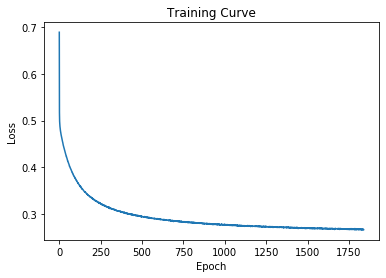

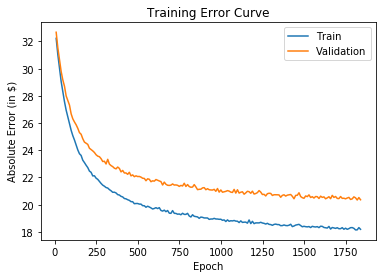

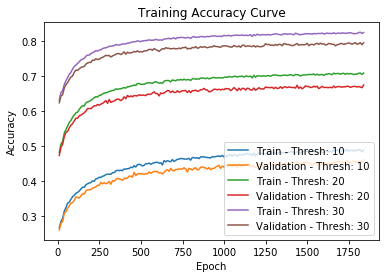

---[ITER 10] loss: 0.271866  time: 0.234
---[ITER 20] loss: 0.265791  time: 0.172
---[ITER 30] loss: 0.267154  time: 0.281
---[ITER 40] loss: 0.270059  time: 0.164
---[ITER 50] loss: 0.267203  time: 0.179
---[ITER 60] loss: 0.270634  time: 0.157
---[ITER 70] loss: 0.266715  time: 0.167
---[ITER 80] loss: 0.269354  time: 0.181
---[ITER 90] loss: 0.268459  time: 0.188
---[ITER 100] loss: 0.269146  time: 0.147
---[ITER 110] loss: 0.268771  time: 0.162
---[ITER 120] loss: 0.264754  time: 0.160
---[ITER 130] loss: 0.265679  time: 0.173
---[ITER 140] loss: 0.268314  time: 0.160
---[ITER 150] loss: 0.261758  time: 0.236
---[ITER 160] loss: 0.262522  time: 0.170
[EPOCH 1841] loss: 0.267771  time: 3.063
---[ITER 10] loss: 0.267536  time: 0.231
---[ITER 20] loss: 0.262531  time: 0.190
---[ITER 30] loss: 0.260478  time: 0.262
---[ITER 40] loss: 0.271968  time: 0.167
---[ITER 50] loss: 0.265957  time: 0.165
---[ITER 60] loss: 0.265936  time: 0.175
---[ITER 70] loss: 0.270272  time: 0.165
---[ITER 

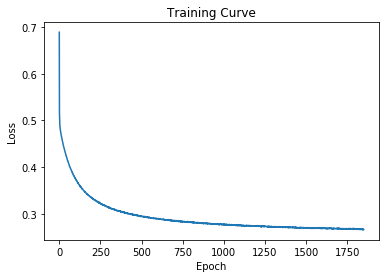

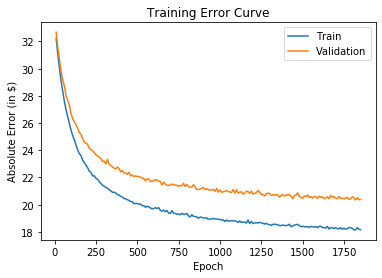

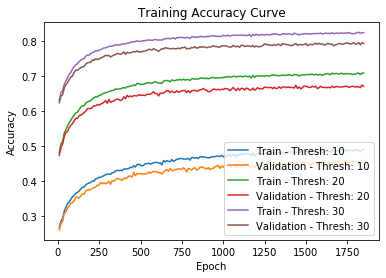

---[ITER 10] loss: 0.266426  time: 0.260
---[ITER 20] loss: 0.264773  time: 0.317
---[ITER 30] loss: 0.267969  time: 0.148
---[ITER 40] loss: 0.271999  time: 0.167
---[ITER 50] loss: 0.264085  time: 0.163
---[ITER 60] loss: 0.270293  time: 0.171
---[ITER 70] loss: 0.264948  time: 0.183
---[ITER 80] loss: 0.267470  time: 0.178
---[ITER 90] loss: 0.268742  time: 0.154
---[ITER 100] loss: 0.269591  time: 0.172
---[ITER 110] loss: 0.266367  time: 0.164
---[ITER 120] loss: 0.268248  time: 0.189
---[ITER 130] loss: 0.268948  time: 0.157
---[ITER 140] loss: 0.266625  time: 0.209
---[ITER 150] loss: 0.266967  time: 0.166
---[ITER 160] loss: 0.270731  time: 0.163
[EPOCH 1851] loss: 0.267860  time: 3.106
---[ITER 10] loss: 0.270159  time: 0.245
---[ITER 20] loss: 0.272723  time: 0.282
---[ITER 30] loss: 0.267963  time: 0.147
---[ITER 40] loss: 0.267881  time: 0.172
---[ITER 50] loss: 0.266899  time: 0.168
---[ITER 60] loss: 0.263993  time: 0.184
---[ITER 70] loss: 0.270995  time: 0.194
---[ITER 

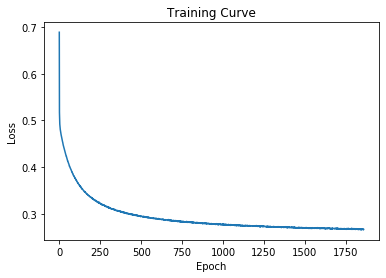

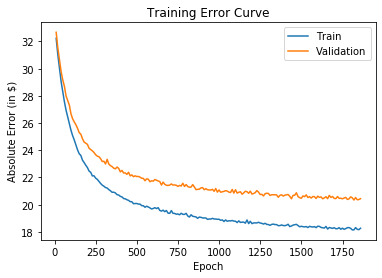

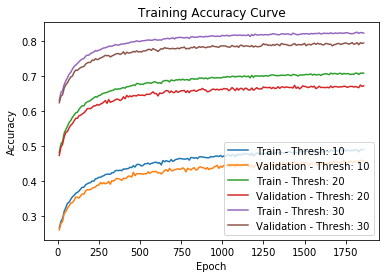

---[ITER 10] loss: 0.268719  time: 0.357
---[ITER 20] loss: 0.271530  time: 0.168
---[ITER 30] loss: 0.263274  time: 0.168
---[ITER 40] loss: 0.270627  time: 0.165
---[ITER 50] loss: 0.268911  time: 0.162
---[ITER 60] loss: 0.260247  time: 0.166
---[ITER 70] loss: 0.268083  time: 0.186
---[ITER 80] loss: 0.270665  time: 0.174
---[ITER 90] loss: 0.263372  time: 0.147
---[ITER 100] loss: 0.269720  time: 0.174
---[ITER 110] loss: 0.264934  time: 0.171
---[ITER 120] loss: 0.271391  time: 0.170
---[ITER 130] loss: 0.269657  time: 0.222
---[ITER 140] loss: 0.262673  time: 0.162
---[ITER 150] loss: 0.272442  time: 0.168
---[ITER 160] loss: 0.268247  time: 0.160
[EPOCH 1861] loss: 0.267558  time: 3.065
---[ITER 10] loss: 0.259746  time: 0.386
---[ITER 20] loss: 0.265148  time: 0.181
---[ITER 30] loss: 0.270557  time: 0.221
---[ITER 40] loss: 0.262892  time: 0.191
---[ITER 50] loss: 0.262049  time: 0.220
---[ITER 60] loss: 0.270944  time: 0.193
---[ITER 70] loss: 0.269185  time: 0.162
---[ITER 

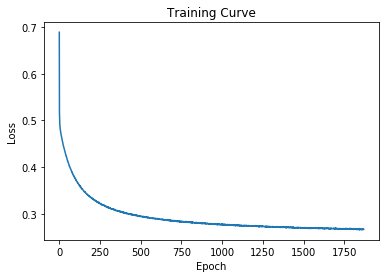

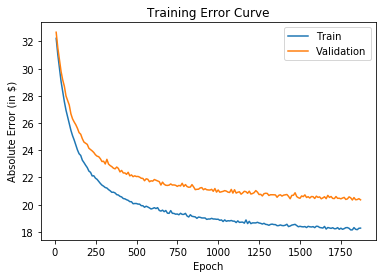

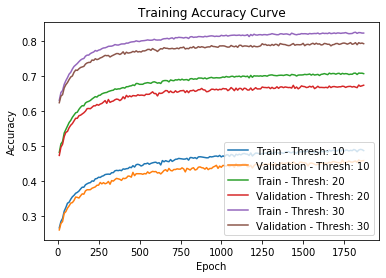

---[ITER 10] loss: 0.266659  time: 0.376
---[ITER 20] loss: 0.268983  time: 0.157
---[ITER 30] loss: 0.264811  time: 0.164
---[ITER 40] loss: 0.271745  time: 0.170
---[ITER 50] loss: 0.274296  time: 0.197
---[ITER 60] loss: 0.266503  time: 0.184
---[ITER 70] loss: 0.264807  time: 0.164
---[ITER 80] loss: 0.271802  time: 0.150
---[ITER 90] loss: 0.264432  time: 0.186
---[ITER 100] loss: 0.272413  time: 0.158
---[ITER 110] loss: 0.263684  time: 0.161
---[ITER 120] loss: 0.272493  time: 0.256
---[ITER 130] loss: 0.266943  time: 0.148
---[ITER 140] loss: 0.263743  time: 0.169
---[ITER 150] loss: 0.268776  time: 0.167
---[ITER 160] loss: 0.267327  time: 0.200
[EPOCH 1871] loss: 0.268005  time: 3.161
---[ITER 10] loss: 0.262360  time: 0.376
---[ITER 20] loss: 0.268370  time: 0.165
---[ITER 30] loss: 0.267872  time: 0.168
---[ITER 40] loss: 0.262783  time: 0.170
---[ITER 50] loss: 0.266028  time: 0.198
---[ITER 60] loss: 0.270827  time: 0.179
---[ITER 70] loss: 0.260217  time: 0.184
---[ITER 

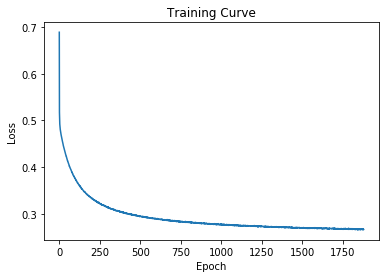

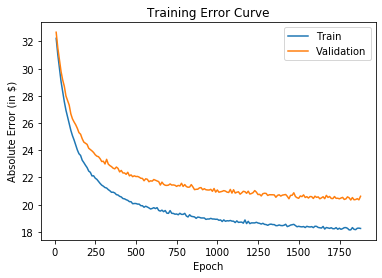

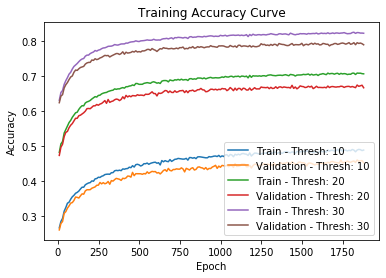

---[ITER 10] loss: 0.270427  time: 0.184
---[ITER 20] loss: 0.270846  time: 0.123
---[ITER 30] loss: 0.266764  time: 0.210
---[ITER 40] loss: 0.267685  time: 0.126
---[ITER 50] loss: 0.270143  time: 0.128
---[ITER 60] loss: 0.268341  time: 0.127
---[ITER 70] loss: 0.264993  time: 0.137
---[ITER 80] loss: 0.259621  time: 0.129
---[ITER 90] loss: 0.272040  time: 0.131
---[ITER 100] loss: 0.261827  time: 0.127
---[ITER 110] loss: 0.269419  time: 0.125
---[ITER 120] loss: 0.267232  time: 0.130
---[ITER 130] loss: 0.262055  time: 0.127
---[ITER 140] loss: 0.271077  time: 0.158
---[ITER 150] loss: 0.267639  time: 0.127
---[ITER 160] loss: 0.261387  time: 0.131
[EPOCH 1881] loss: 0.266829  time: 2.345
---[ITER 10] loss: 0.262359  time: 0.183
---[ITER 20] loss: 0.267124  time: 0.130
---[ITER 30] loss: 0.267705  time: 0.211
---[ITER 40] loss: 0.273117  time: 0.134
---[ITER 50] loss: 0.266617  time: 0.135
---[ITER 60] loss: 0.262569  time: 0.139
---[ITER 70] loss: 0.265920  time: 0.128
---[ITER 

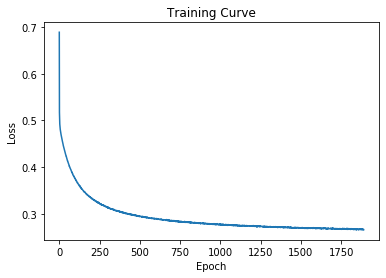

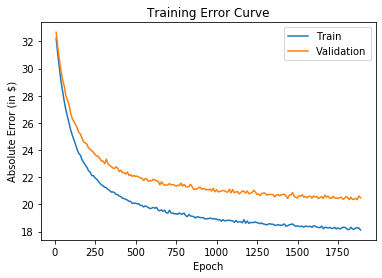

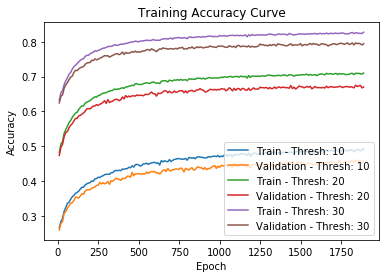

---[ITER 10] loss: 0.264841  time: 0.176
---[ITER 20] loss: 0.260980  time: 0.220
---[ITER 30] loss: 0.265870  time: 0.124
---[ITER 40] loss: 0.268317  time: 0.205
---[ITER 50] loss: 0.271294  time: 0.127
---[ITER 60] loss: 0.270023  time: 0.137
---[ITER 70] loss: 0.265938  time: 0.134
---[ITER 80] loss: 0.270132  time: 0.127
---[ITER 90] loss: 0.268496  time: 0.130
---[ITER 100] loss: 0.264964  time: 0.121
---[ITER 110] loss: 0.267883  time: 0.132
---[ITER 120] loss: 0.268681  time: 0.134
---[ITER 130] loss: 0.265452  time: 0.160
---[ITER 140] loss: 0.266957  time: 0.126
---[ITER 150] loss: 0.265999  time: 0.126
---[ITER 160] loss: 0.267512  time: 0.128
[EPOCH 1891] loss: 0.267196  time: 2.416
---[ITER 10] loss: 0.267028  time: 0.191
---[ITER 20] loss: 0.263740  time: 0.243
---[ITER 30] loss: 0.264285  time: 0.128
---[ITER 40] loss: 0.258632  time: 0.127
---[ITER 50] loss: 0.269435  time: 0.129
---[ITER 60] loss: 0.258532  time: 0.135
---[ITER 70] loss: 0.267731  time: 0.143
---[ITER 

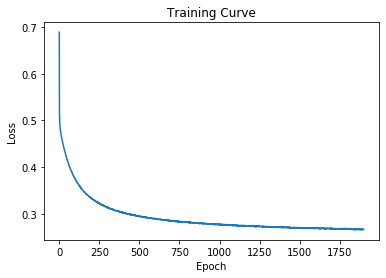

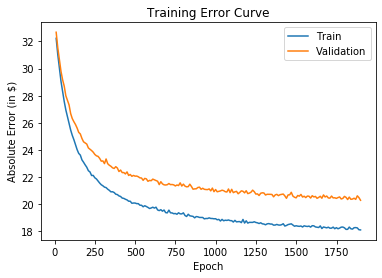

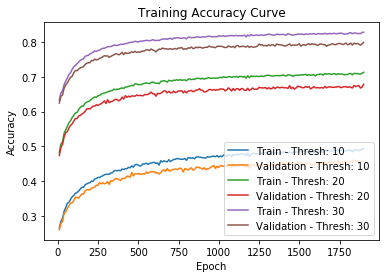

---[ITER 10] loss: 0.264274  time: 0.282
---[ITER 20] loss: 0.266651  time: 0.129
---[ITER 30] loss: 0.270394  time: 0.127
---[ITER 40] loss: 0.267727  time: 0.127
---[ITER 50] loss: 0.264318  time: 0.123
---[ITER 60] loss: 0.261411  time: 0.125
---[ITER 70] loss: 0.267361  time: 0.135
---[ITER 80] loss: 0.271395  time: 0.136
---[ITER 90] loss: 0.265720  time: 0.123
---[ITER 100] loss: 0.268807  time: 0.128
---[ITER 110] loss: 0.266266  time: 0.125
---[ITER 120] loss: 0.263852  time: 0.129
---[ITER 130] loss: 0.267706  time: 0.154
---[ITER 140] loss: 0.261123  time: 0.129
---[ITER 150] loss: 0.268046  time: 0.129
---[ITER 160] loss: 0.271584  time: 0.134
[EPOCH 1901] loss: 0.266890  time: 2.345
---[ITER 10] loss: 0.263975  time: 0.281
---[ITER 20] loss: 0.267031  time: 0.126
---[ITER 30] loss: 0.268983  time: 0.128
---[ITER 40] loss: 0.263125  time: 0.141
---[ITER 50] loss: 0.270300  time: 0.137
---[ITER 60] loss: 0.268224  time: 0.135
---[ITER 70] loss: 0.272488  time: 0.131
---[ITER 

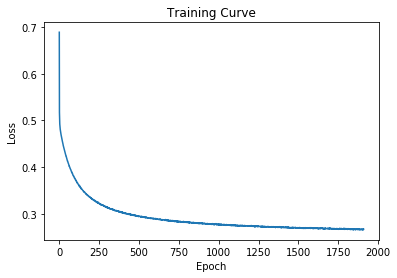

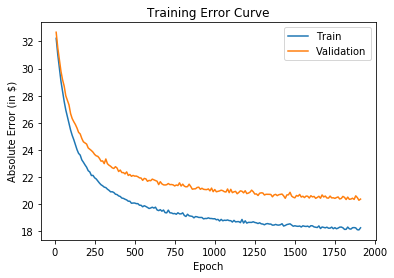

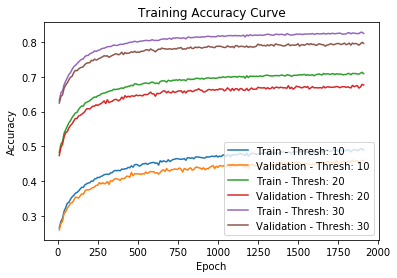

---[ITER 10] loss: 0.270158  time: 0.176
---[ITER 20] loss: 0.268226  time: 0.132
---[ITER 30] loss: 0.260669  time: 0.130
---[ITER 40] loss: 0.273991  time: 0.207
---[ITER 50] loss: 0.262731  time: 0.132
---[ITER 60] loss: 0.264019  time: 0.139
---[ITER 70] loss: 0.265307  time: 0.138
---[ITER 80] loss: 0.268336  time: 0.132
---[ITER 90] loss: 0.267131  time: 0.127
---[ITER 100] loss: 0.273873  time: 0.126
---[ITER 110] loss: 0.264787  time: 0.129
---[ITER 120] loss: 0.268298  time: 0.127
---[ITER 130] loss: 0.267799  time: 0.127
---[ITER 140] loss: 0.266269  time: 0.131
---[ITER 150] loss: 0.269602  time: 0.159
---[ITER 160] loss: 0.269656  time: 0.141
[EPOCH 1911] loss: 0.267563  time: 2.364
---[ITER 10] loss: 0.262849  time: 0.187
---[ITER 20] loss: 0.269173  time: 0.132
---[ITER 30] loss: 0.266298  time: 0.134
---[ITER 40] loss: 0.264598  time: 0.217
---[ITER 50] loss: 0.265937  time: 0.140
---[ITER 60] loss: 0.263278  time: 0.128
---[ITER 70] loss: 0.267181  time: 0.127
---[ITER 

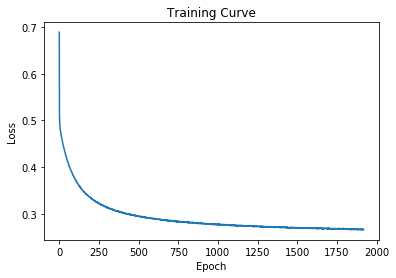

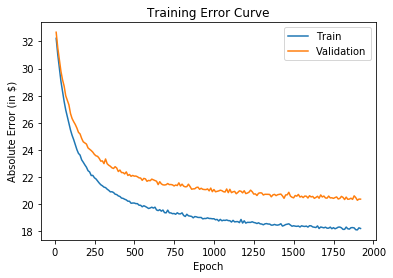

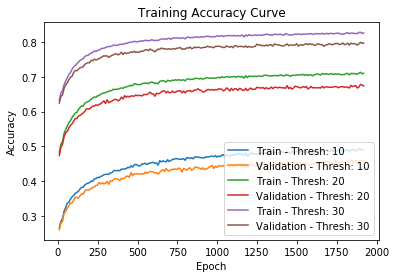

---[ITER 10] loss: 0.264199  time: 0.175
---[ITER 20] loss: 0.262060  time: 0.127
---[ITER 30] loss: 0.274998  time: 0.217
---[ITER 40] loss: 0.272717  time: 0.138
---[ITER 50] loss: 0.268075  time: 0.125
---[ITER 60] loss: 0.262539  time: 0.127
---[ITER 70] loss: 0.268235  time: 0.131
---[ITER 80] loss: 0.270077  time: 0.128
---[ITER 90] loss: 0.261597  time: 0.127
---[ITER 100] loss: 0.268785  time: 0.135
---[ITER 110] loss: 0.269440  time: 0.129
---[ITER 120] loss: 0.270394  time: 0.134
---[ITER 130] loss: 0.265889  time: 0.129
---[ITER 140] loss: 0.255063  time: 0.158
---[ITER 150] loss: 0.274982  time: 0.136
---[ITER 160] loss: 0.266586  time: 0.131
[EPOCH 1921] loss: 0.267423  time: 2.365
---[ITER 10] loss: 0.265163  time: 0.189
---[ITER 20] loss: 0.266464  time: 0.137
---[ITER 30] loss: 0.258677  time: 0.214
---[ITER 40] loss: 0.272171  time: 0.131
---[ITER 50] loss: 0.267099  time: 0.132
---[ITER 60] loss: 0.266250  time: 0.130
---[ITER 70] loss: 0.265687  time: 0.135
---[ITER 

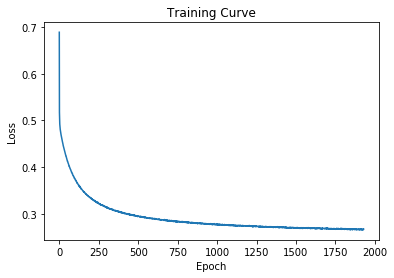

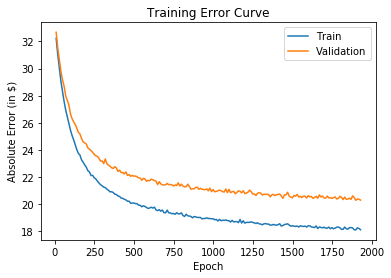

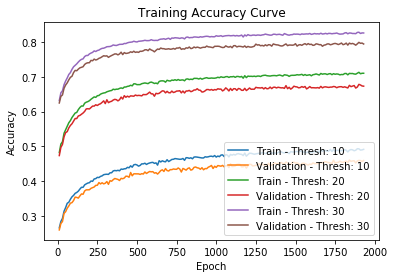

---[ITER 10] loss: 0.271570  time: 0.178
---[ITER 20] loss: 0.266067  time: 0.230
---[ITER 30] loss: 0.264547  time: 0.122
---[ITER 40] loss: 0.271989  time: 0.130
---[ITER 50] loss: 0.269219  time: 0.128
---[ITER 60] loss: 0.266574  time: 0.127
---[ITER 70] loss: 0.267241  time: 0.131
---[ITER 80] loss: 0.267521  time: 0.132
---[ITER 90] loss: 0.263100  time: 0.128
---[ITER 100] loss: 0.265723  time: 0.131
---[ITER 110] loss: 0.269544  time: 0.123
---[ITER 120] loss: 0.269559  time: 0.127
---[ITER 130] loss: 0.261319  time: 0.166
---[ITER 140] loss: 0.264094  time: 0.133
---[ITER 150] loss: 0.259703  time: 0.127
---[ITER 160] loss: 0.268232  time: 0.127
[EPOCH 1931] loss: 0.266599  time: 2.356
---[ITER 10] loss: 0.266612  time: 0.185
---[ITER 20] loss: 0.268517  time: 0.221
---[ITER 30] loss: 0.265789  time: 0.132
---[ITER 40] loss: 0.267275  time: 0.133
---[ITER 50] loss: 0.269454  time: 0.129
---[ITER 60] loss: 0.267941  time: 0.129
---[ITER 70] loss: 0.274491  time: 0.132
---[ITER 

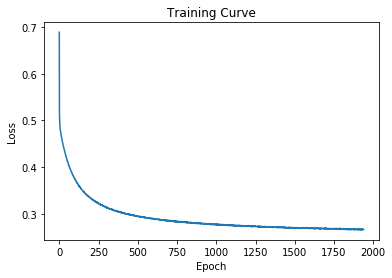

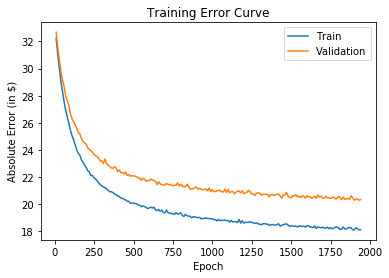

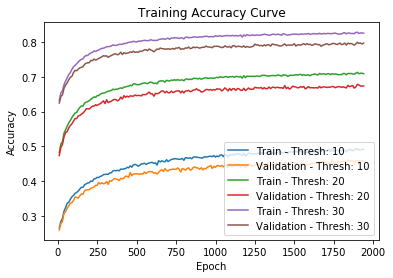

---[ITER 10] loss: 0.266063  time: 0.271
---[ITER 20] loss: 0.265584  time: 0.129
---[ITER 30] loss: 0.265741  time: 0.130
---[ITER 40] loss: 0.266783  time: 0.127
---[ITER 50] loss: 0.268251  time: 0.128
---[ITER 60] loss: 0.268379  time: 0.134
---[ITER 70] loss: 0.262749  time: 0.129
---[ITER 80] loss: 0.269639  time: 0.126
---[ITER 90] loss: 0.269806  time: 0.130
---[ITER 100] loss: 0.266926  time: 0.126
---[ITER 110] loss: 0.270612  time: 0.128
---[ITER 120] loss: 0.267471  time: 0.159
---[ITER 130] loss: 0.262987  time: 0.133
---[ITER 140] loss: 0.265605  time: 0.130
---[ITER 150] loss: 0.267545  time: 0.134
---[ITER 160] loss: 0.266977  time: 0.134
[EPOCH 1941] loss: 0.266835  time: 2.357
---[ITER 10] loss: 0.264442  time: 0.290
---[ITER 20] loss: 0.262071  time: 0.130
---[ITER 30] loss: 0.271043  time: 0.138
---[ITER 40] loss: 0.263341  time: 0.132
---[ITER 50] loss: 0.265013  time: 0.135
---[ITER 60] loss: 0.260517  time: 0.132
---[ITER 70] loss: 0.267321  time: 0.129
---[ITER 

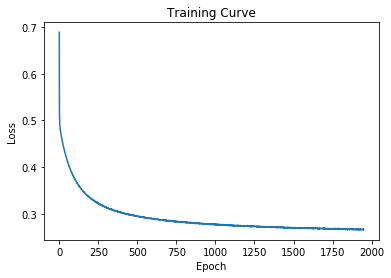

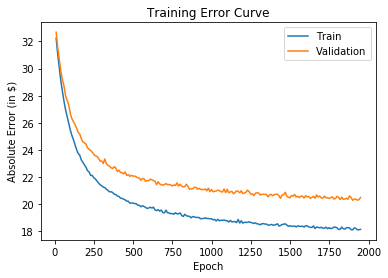

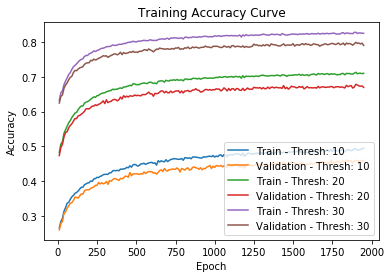

---[ITER 10] loss: 0.260602  time: 0.185
---[ITER 20] loss: 0.263736  time: 0.133
---[ITER 30] loss: 0.270026  time: 0.221
---[ITER 40] loss: 0.258362  time: 0.147
---[ITER 50] loss: 0.265391  time: 0.150
---[ITER 60] loss: 0.273959  time: 0.154
---[ITER 70] loss: 0.264225  time: 0.153
---[ITER 80] loss: 0.265225  time: 0.144
---[ITER 90] loss: 0.270890  time: 0.161
---[ITER 100] loss: 0.269551  time: 0.140
---[ITER 110] loss: 0.265360  time: 0.151
---[ITER 120] loss: 0.273068  time: 0.160
---[ITER 130] loss: 0.263998  time: 0.152
---[ITER 140] loss: 0.264902  time: 0.137
---[ITER 150] loss: 0.264979  time: 0.166
---[ITER 160] loss: 0.266304  time: 0.134
[EPOCH 1951] loss: 0.266319  time: 2.604
---[ITER 10] loss: 0.265746  time: 0.193
---[ITER 20] loss: 0.271018  time: 0.132
---[ITER 30] loss: 0.270438  time: 0.229
---[ITER 40] loss: 0.267559  time: 0.133
---[ITER 50] loss: 0.272991  time: 0.133
---[ITER 60] loss: 0.263096  time: 0.139
---[ITER 70] loss: 0.266823  time: 0.130
---[ITER 

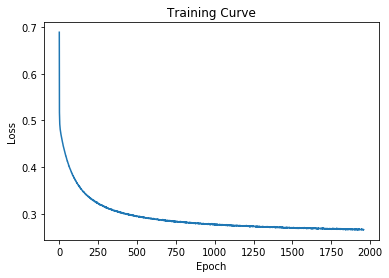

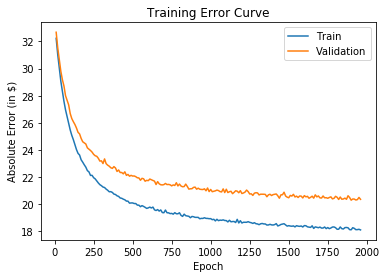

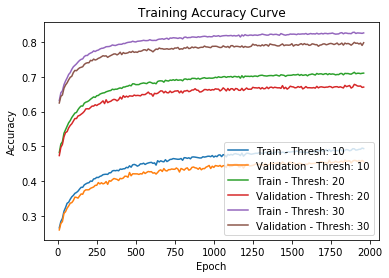

---[ITER 10] loss: 0.267680  time: 0.173
---[ITER 20] loss: 0.265353  time: 0.211
---[ITER 30] loss: 0.268059  time: 0.126
---[ITER 40] loss: 0.265032  time: 0.127
---[ITER 50] loss: 0.265156  time: 0.128
---[ITER 60] loss: 0.269887  time: 0.129
---[ITER 70] loss: 0.275019  time: 0.129
---[ITER 80] loss: 0.266317  time: 0.128
---[ITER 90] loss: 0.270578  time: 0.124
---[ITER 100] loss: 0.271943  time: 0.126
---[ITER 110] loss: 0.265587  time: 0.126
---[ITER 120] loss: 0.261968  time: 0.125
---[ITER 130] loss: 0.262209  time: 0.135
---[ITER 140] loss: 0.268404  time: 0.159
---[ITER 150] loss: 0.265423  time: 0.141
---[ITER 160] loss: 0.265709  time: 0.131
[EPOCH 1961] loss: 0.267000  time: 2.334
---[ITER 10] loss: 0.264717  time: 0.186
---[ITER 20] loss: 0.265638  time: 0.218
---[ITER 30] loss: 0.268316  time: 0.134
---[ITER 40] loss: 0.274376  time: 0.139
---[ITER 50] loss: 0.262313  time: 0.132
---[ITER 60] loss: 0.263504  time: 0.131
---[ITER 70] loss: 0.273055  time: 0.130
---[ITER 

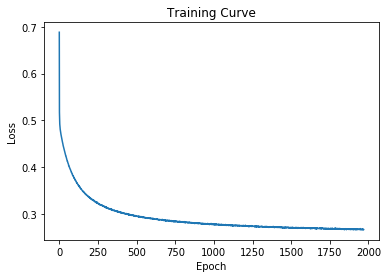

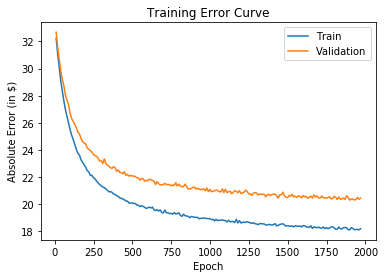

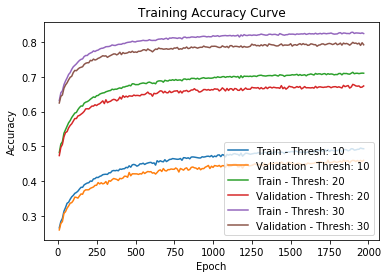

---[ITER 10] loss: 0.264244  time: 0.280
---[ITER 20] loss: 0.268801  time: 0.124
---[ITER 30] loss: 0.258707  time: 0.128
---[ITER 40] loss: 0.273127  time: 0.128
---[ITER 50] loss: 0.267558  time: 0.124
---[ITER 60] loss: 0.260758  time: 0.130
---[ITER 70] loss: 0.269496  time: 0.128
---[ITER 80] loss: 0.262472  time: 0.138
---[ITER 90] loss: 0.272606  time: 0.122
---[ITER 100] loss: 0.263506  time: 0.131
---[ITER 110] loss: 0.271172  time: 0.131
---[ITER 120] loss: 0.261040  time: 0.130
---[ITER 130] loss: 0.264950  time: 0.161
---[ITER 140] loss: 0.272629  time: 0.142
---[ITER 150] loss: 0.266598  time: 0.136
---[ITER 160] loss: 0.268552  time: 0.138
[EPOCH 1971] loss: 0.266663  time: 2.389
---[ITER 10] loss: 0.268922  time: 0.282
---[ITER 20] loss: 0.263051  time: 0.134
---[ITER 30] loss: 0.265698  time: 0.132
---[ITER 40] loss: 0.272207  time: 0.134
---[ITER 50] loss: 0.269545  time: 0.137
---[ITER 60] loss: 0.275326  time: 0.133
---[ITER 70] loss: 0.263502  time: 0.133
---[ITER 

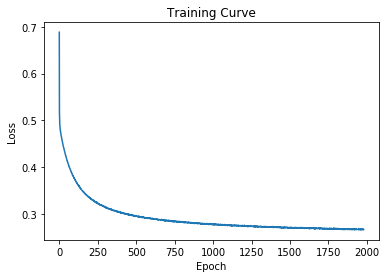

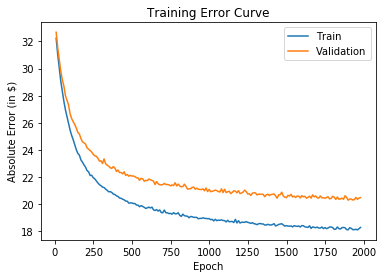

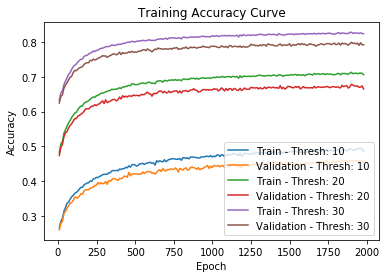

---[ITER 10] loss: 0.269272  time: 0.400
---[ITER 20] loss: 0.264437  time: 0.162
---[ITER 30] loss: 0.263163  time: 0.175
---[ITER 40] loss: 0.264652  time: 0.168
---[ITER 50] loss: 0.273619  time: 0.179
---[ITER 60] loss: 0.271362  time: 0.222
---[ITER 70] loss: 0.265792  time: 0.238
---[ITER 80] loss: 0.270711  time: 0.176
---[ITER 90] loss: 0.267654  time: 0.170
---[ITER 100] loss: 0.266053  time: 0.178
---[ITER 110] loss: 0.265592  time: 0.263
---[ITER 120] loss: 0.270500  time: 0.231
---[ITER 130] loss: 0.270926  time: 0.185
---[ITER 140] loss: 0.262456  time: 0.188
---[ITER 150] loss: 0.256802  time: 0.179
---[ITER 160] loss: 0.268783  time: 0.176
[EPOCH 1981] loss: 0.266832  time: 3.460
---[ITER 10] loss: 0.272860  time: 0.416
---[ITER 20] loss: 0.261474  time: 0.173
---[ITER 30] loss: 0.263610  time: 0.237
---[ITER 40] loss: 0.267900  time: 0.210
---[ITER 50] loss: 0.274244  time: 0.149
---[ITER 60] loss: 0.270360  time: 0.183
---[ITER 70] loss: 0.265740  time: 0.202
---[ITER 

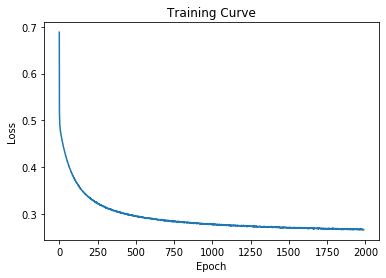

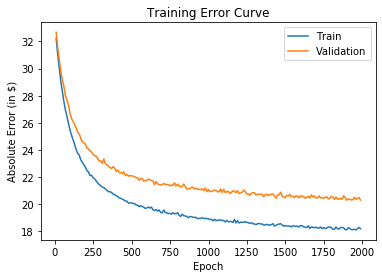

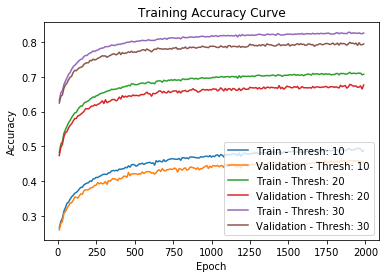

---[ITER 10] loss: 0.269548  time: 0.208
---[ITER 20] loss: 0.263040  time: 0.146
---[ITER 30] loss: 0.271450  time: 0.227
---[ITER 40] loss: 0.264041  time: 0.152
---[ITER 50] loss: 0.267432  time: 0.145
---[ITER 60] loss: 0.266734  time: 0.159
---[ITER 70] loss: 0.261706  time: 0.159
---[ITER 80] loss: 0.260289  time: 0.140
---[ITER 90] loss: 0.268873  time: 0.148
---[ITER 100] loss: 0.270149  time: 0.143
---[ITER 110] loss: 0.266771  time: 0.158
---[ITER 120] loss: 0.269835  time: 0.152
---[ITER 130] loss: 0.268577  time: 0.151
---[ITER 140] loss: 0.270835  time: 0.175
---[ITER 150] loss: 0.270539  time: 0.141
---[ITER 160] loss: 0.266659  time: 0.150
[EPOCH 1991] loss: 0.267335  time: 2.674
---[ITER 10] loss: 0.265390  time: 0.207
---[ITER 20] loss: 0.265447  time: 0.153
---[ITER 30] loss: 0.261430  time: 0.233
---[ITER 40] loss: 0.268965  time: 0.148
---[ITER 50] loss: 0.268867  time: 0.146
---[ITER 60] loss: 0.261694  time: 0.144
---[ITER 70] loss: 0.265554  time: 0.160
---[ITER 

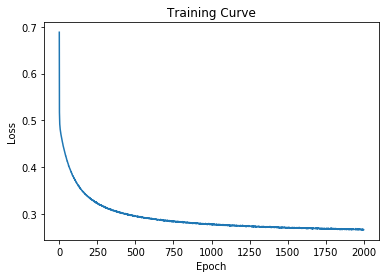

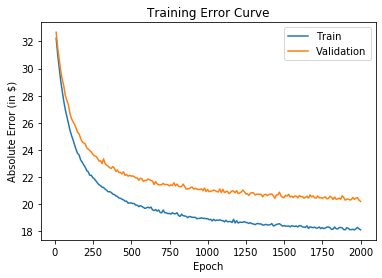

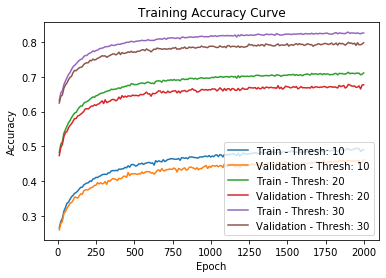

Training Completed...
[FINAL] loss: 0.266123  time: 9247.612


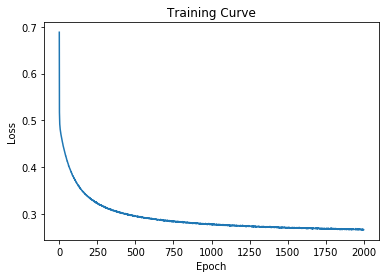

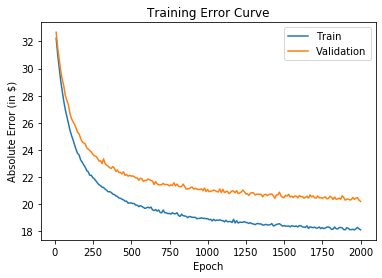

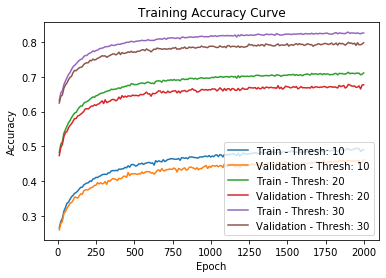

Total Training Time:  9248.34809589386
Avg. Time per Epoch:  4.62417404794693


In [10]:
net = airbnb_net()

path = os.getcwd() # get current path
path = path[:-5]+"test/Brian/"
now = datetime.datetime.now()
date = now.strftime("%b").lower()+now.strftime("%d")
i = 1

while True:
    try:
        rootdir = path+"/"+date+"_test"+'{:02d}'.format(i)
        os.mkdir(rootdir)
        break
    except:
        i += 1
        
os.mkdir(rootdir+'/lossplot')
os.mkdir(rootdir+'/checkpoint')
os.mkdir(rootdir+'/accplot')
os.mkdir(rootdir+'/errorplot')
os.mkdir(rootdir+'/final')

torch.manual_seed(1)
max_epochs = 2000
start_time = time.time()
train(net, train_loader, val_loader, rootdir, lr = 0.0001, num_epoch = max_epochs)
end_time = time.time()
print("Total Training Time: ", end_time - start_time)
print("Avg. Time per Epoch: ", (end_time-start_time)/max_epochs)

In [14]:
checkpoint = torch.load("../test/Brian/nov21_test07/final/checkpoint_final.tar")

In [15]:
print("Minimum Train Error:\t\t", min(checkpoint["train_error"]))
print("Index of Min Train Error:\t", checkpoint["train_error"].index(min(checkpoint["train_error"])))
print("Minimum Val Error:\t\t", min(checkpoint["val_error"]))
print("Index of Min Val Error:\t\t", checkpoint["val_error"].index(min(checkpoint["val_error"])))

Minimum Train Error:		 18.09796874161409
Index of Min Train Error:	 195
Minimum Val Error:		 20.20266369278337
Index of Min Val Error:		 199


In [16]:
print("For Threshold=20")
print("Maximum Train Accuracy:\t", max(checkpoint["train_acc"][1]))
print("Index of Max Train Acc:\t", checkpoint["train_acc"][1].index(max(checkpoint["train_acc"][1])))
print("Maximum Val Accuracy:\t", max(checkpoint["val_acc"][1]))
print("Index of Max Val Acc:\t", checkpoint["val_acc"][1].index(max(checkpoint["val_acc"][1])))

For Threshold=20
Maximum Train Accuracy:	 0.7126636929609045
Index of Max Train Acc:	 189
Maximum Val Accuracy:	 0.6780841522755462
Index of Max Val Acc:	 189
